In [6]:
# ===========================================================
# Reliability Suite v2 — RR & CR (scores + ranks)
# - Shows plots by default (no saving)
# - Writes CSVs AND per-ARI CSVs
# - Rank-bin reports overall + conditional (Top-bin and Bottom-bin)
# - Includes Top-1 identity
# ===========================================================
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import matplotlib.patches as mpatches

# ---------- Optional SciPy fallback ----------
try:
    from scipy.stats import norm
    def _z(alpha=0.05): return norm.ppf(1 - alpha/2)
except Exception:
    def _z(alpha=0.05):
        return 1.959963984540054 if abs(alpha-0.05)<1e-9 else 1.6448536269514722

# ---------- Basic utils ----------
def _read_df(x):
    return pd.read_csv(x) if isinstance(x, str) else x.copy()

def wilson_ci(k, n, alpha=0.05):
    if n == 0: return (np.nan, np.nan)
    z = _z(alpha); p = k/n; den = 1 + z*z/n
    cen = (p + z*z/(2*n))/den
    half = z*np.sqrt((p*(1-p)/n) + (z*z/(4*n*n)))/den
    return (cen - half, cen + half)

def _mk_row(model, exp_name, mode, metric, group, ari, k, n, alpha=0.05, extras=None):
    lo, hi = wilson_ci(k, n, alpha)
    row = dict(model=model, exp_name=exp_name, mode=mode, metric=metric,
               group=group, ARI=int(ari), k=int(k), n=int(n),
               rate=(k/n) if n else np.nan, ci_low=lo, ci_high=hi)
    if extras: row.update(extras)
    return row

def _append_or_write(df, path):
    path = Path(path); path.parent.mkdir(parents=True, exist_ok=True)
    if path.exists():
        old = pd.read_csv(path)
        cols = sorted(set(old.columns) | set(df.columns))
        pd.concat([old.reindex(columns=cols), df.reindex(columns=cols)],
                  ignore_index=True).to_csv(path, index=False)
    else:
        df.to_csv(path, index=False)

def _write_by_ari(df, base_path_fmt):
    """Write split files e.g., base_path_fmt='results/RR_scores_MODEL_ARI{ari}.csv'."""
    for a in sorted(df['ARI'].unique()):
        sub = df[df['ARI']==a].copy()
        _append_or_write(sub, base_path_fmt.format(ari=int(a)))

# ---------- Default column maps ----------
DEF_SCORE_CORR = {5:'Score_ARI_5', 9:'Score_ARI_9', 14:'Score_ARI_14'}
DEF_SCORE_WRNG = {5:'Score_Wrong_Answer_ARI_5', 9:'Score_Wrong_Answer_ARI_9', 14:'Score_Wrong_Answer_ARI_14'}
DEF_RANK_CORR  = {5:'Rank_ARI_5',  9:'Rank_ARI_9',  14:'Rank_ARI_14'}
DEF_RANK_WRNG  = {5:'Rank_Wrong_Answer_ARI_5', 9:'Rank_Wrong_Answer_ARI_9', 14:'Rank_Wrong_Answer_ARI_14'}



In [7]:
# ---------- Kernel helpers ----------
def _col_f(df, col): return pd.to_numeric(df[col], errors='coerce').to_numpy()

def _score_exact(A,B,col):
    s0, s1 = _col_f(A,col), _col_f(B,col)
    m = ~np.isnan(s0) & ~np.isnan(s1)
    if m.sum()==0: return 0,0
    return int((s0[m]==s1[m]).sum()), int(m.sum())

def _score_eps(A, B, col, eps=1.0):
    s0, s1 = _col_f(A, col), _col_f(B, col)
    m = ~np.isnan(s0) & ~np.isnan(s1)
    if m.sum() == 0:
        return 0, 0
    diff = s0[m] - s1[m]
    print(np.abs(diff),np.abs(diff) <= eps)
    return int((np.abs(diff) <= eps).sum()), int(m.sum())


def _rank_exact(A,B,col):
    r0, r1 = _col_f(A,col), _col_f(B,col)
    m = ~np.isnan(r0) & ~np.isnan(r1)
    if m.sum()==0: return 0,0
    return int((r0[m].astype(int)==r1[m].astype(int)).sum()), int(m.sum())

def _rank_bin_overall(A,B,col):
    r0, r1 = _col_f(A,col), _col_f(B,col)
    m = ~np.isnan(r0) & ~np.isnan(r1)
    if m.sum()==0: return 0,0
    t0, t1 = (r0[m].astype(int)<=3), (r1[m].astype(int)<=3)
    return int((t0==t1).sum()), int(m.sum())

def _rank_bin_conditional(A,B,col):
    """
    Conditional stability:
      - top_preserve: P(remain in 1–3 | baseline in 1–3)
      - bottom_preserve: P(remain in 4–7 | baseline in 4–7)
    """
    r0, r1 = _col_f(A,col), _col_f(B,col)
    m = ~np.isnan(r0) & ~np.isnan(r1)
    if m.sum()==0: return (0,0),(0,0)
    r0 = r0[m].astype(int); r1 = r1[m].astype(int)
    top0 = r0<=3; bot0 = r0>=4
    top_pres = int((top0 & (r1<=3)).sum()); n_top = int(top0.sum())
    bot_pres = int((bot0 & (r1>=4)).sum()); n_bot = int(bot0.sum())
    return (top_pres, n_top), (bot_pres, n_bot)

def _rank_top1_identity(A,B,corr_col,wrong_col):
    rc0, rw0 = _col_f(A,corr_col), _col_f(A,wrong_col)
    rc1, rw1 = _col_f(B,corr_col), _col_f(B,wrong_col)
    m = ~np.isnan(rc0) & ~np.isnan(rw0) & ~np.isnan(rc1) & ~np.isnan(rw1)
    if m.sum()==0: return 0,0
    rc0, rw0, rc1, rw1 = rc0[m].astype(int), rw0[m].astype(int), rc1[m].astype(int), rw1[m].astype(int)
    w0 = np.where(rc0<rw0,1,np.where(rc0>rw0,0,-1))
    w1 = np.where(rc1<rw1,1,np.where(rc1>rw1,0,-1))
    non_tie = (w0!=-1)&(w1!=-1)
    if non_tie.sum()==0: return 0,0
    return int((w0[non_tie]==w1[non_tie]).sum()), int(non_tie.sum())

# ---------- Plot helpers (show-only by default) ----------
def _plot_rate_bars(ax, subdf, order=(5,9,14), title="", inside=0.92, pad=0.06):
    rates, loe, hie, labels, kn = [], [], [], [], []
    for a in order:
        row = subdf[subdf['ARI']==a]
        if len(row)==0:
            r, lo, hi, k, n = np.nan, np.nan, np.nan, 0, 0
        else:
            r  = float(row['rate'].values[0])
            lo = float(row['ci_low'].values[0]); hi = float(row['ci_high'].values[0])
            k  = int(row['k'].values[0]);       n  = int(row['n'].values[0])
        rates.append(r)
        loe.append(max(0, r-lo if pd.notna(r) and pd.notna(lo) else 0))
        hie.append(max(0, hi-r if pd.notna(r) and pd.notna(hi) else 0))
        labels.append(str(a)); kn.append((k,n))
    ax.bar(labels, rates, yerr=[loe,hie], capsize=4)
    y_top = np.nanmax([r+h for r,h in zip(rates,hie)]) if rates else 0
    if np.isfinite(y_top): ax.set_ylim(0, max(0.8, min(0.98, y_top+pad)))
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.set_title(title, pad=8); ax.set_xlabel("ARI"); ax.set_ylabel("Rate")
    for xi,(r,(k,n)) in enumerate(zip(rates,kn)):
        if not np.isfinite(r): continue
        if r>=inside: ax.text(xi, r-0.04, f"{k}/{n}", ha='center', va='top', color='white', fontweight='bold')
        else: ax.text(xi, min(r+0.03, ax.get_ylim()[1]-0.03), f"{k}/{n}", ha='center', va='bottom')
    ax.grid(True, axis='y', alpha=0.2); ax.margins(x=0.10)

def _grid_scores(df, title):
    eps_metric = [m for m in df['metric'].unique() if str(m).startswith('score_eps')]
    eps_metric = eps_metric[0] if eps_metric else 'score_eps1'
    fig, axes = plt.subplots(2,2, figsize=(12,8), sharey=True)
    for ax,(metric,group,ttl) in zip(
        axes.ravel(),
        [( 'score_exact','Correct','Exact — Correct'),
         ( eps_metric,    'Correct','±1 — Correct'),
         ( 'score_exact','Wrong',  'Exact — Wrong'),
         ( eps_metric,    'Wrong',  '±1 — Wrong')]
    ):
        _plot_rate_bars(ax, df[(df['metric']==metric)&(df['group']==group)], title=ttl)
    fig.suptitle(title, y=0.98, fontweight='bold'); fig.tight_layout(); plt.show()

def _grid_ranks(df, title):
    fig, axes = plt.subplots(2,2, figsize=(12,8), sharey=True)
    for ax,(metric,group,ttl) in zip(
        axes.ravel(),
        [( 'rank_bin_overall','Correct','Bin Overall — Correct'),
         ( 'rank_exact',      'Correct','Exact — Correct'),
         ( 'rank_bin_overall','Wrong',  'Bin Overall — Wrong'),
         ( 'rank_exact',      'Wrong',  'Exact — Wrong')]
    ):
        _plot_rate_bars(ax, df[(df['metric']==metric)&(df['group']==group)], title=ttl)
    fig.suptitle(title, y=0.98, fontweight='bold'); fig.tight_layout(); plt.show()

def _bars_top1(df_top1, title):
    fig, ax = plt.subplots(figsize=(6,4))
    _plot_rate_bars(ax, df_top1.sort_values('ARI'), order=[5,9,14], title="Top-1 identity")
    ax.set_title(title, pad=10); plt.show()

def _grid_bin_conditionals(df_cond, title):
    """Two panels for conditional bin stability: Top-bin and Bottom-bin."""
    fig, axes = plt.subplots(1,2, figsize=(12,4), sharey=True)
    _plot_rate_bars(axes[0], df_cond[(df_cond['metric']=='rank_bin_top_preserve') & (df_cond['group']=='Correct')],
                    title="Top-bin preserved — Correct")
    _plot_rate_bars(axes[1], df_cond[(df_cond['metric']=='rank_bin_bottom_preserve') & (df_cond['group']=='Correct')],
                    title="Bottom-bin preserved — Correct")
    fig.suptitle(title, y=0.98, fontweight='bold'); fig.tight_layout(); plt.show()

def _align_on_index(A: pd.DataFrame, B: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Align two DataFrames by their index, keeping only rows present in BOTH.
    If any rows are missing in one side, they are dropped.
    """
    common_idx = A.index.intersection(B.index)
    return A.loc[common_idx].copy(), B.loc[common_idx].copy()


# ---------- RR builders ----------
def rr_pointwise_df(model, exp_name, score_base, score_pert,
                    *, eps=1.0, ari=(5,9,14),
                    cols_correct=DEF_SCORE_CORR, cols_wrong=DEF_SCORE_WRNG):
    A, B = _read_df(score_base), _read_df(score_pert)
    A, B = _align_on_index(A, B)   # <<<<< HERE
    rows = []
    for group, cmap in [('Correct', cols_correct), ('Wrong', cols_wrong)]:
        for a in ari:
            k0,n0 = _score_exact(A,B,cmap[a]); rows.append(_mk_row(model,exp_name,'RR','score_exact',group,a,k0,n0))
            k1,n1 = _score_eps(A,B,cmap[a],eps); rows.append(_mk_row(model,exp_name,'RR',f'score_eps{int(eps)}',group,a,k1,n1))
    return pd.DataFrame(rows)

def rr_listwise_df(model, exp_name, rank_base, rank_pert,
                   *, ari=(5,9,14),
                   cols_correct=DEF_RANK_CORR, cols_wrong=DEF_RANK_WRNG):
    A, B = _read_df(rank_base), _read_df(rank_pert)
    A, B = _align_on_index(A, B)   # <<<<< HERE
    rows = []
    for group, cmap in [('Correct', cols_correct), ('Wrong', cols_wrong)]:
        for a in ari:
            col = cmap[a]
            ko,no = _rank_bin_overall(A,B,col); rows.append(_mk_row(model,exp_name,'RR','rank_bin_overall',group,a,ko,no))
            ke,ne = _rank_exact(A,B,col);       rows.append(_mk_row(model,exp_name,'RR','rank_exact',group,a,ke,ne))
    return pd.DataFrame(rows)


# ---------- CR builders ----------
def cr_pointwise_df(model, phase, score_base, score_repeat,
                    *, eps=1.0, ari=(5,9,14),
                    cols_correct=DEF_SCORE_CORR, cols_wrong=DEF_SCORE_WRNG):
    A, R = _read_df(score_base), _read_df(score_repeat)
    rows = []
    for group, cmap in [('Correct', cols_correct), ('Wrong', cols_wrong)]:
        for a in ari:
            k0,n0 = _score_exact(A,R,cmap[a]); rows.append(_mk_row(model,f"CR-{phase}",'CR','score_exact',group,a,k0,n0))
            k1,n1 = _score_eps(A,R,cmap[a],eps); rows.append(_mk_row(model,f"CR-{phase}",'CR',f'score_eps{int(eps)}',group,a,k1,n1))
    return pd.DataFrame(rows)


def _align_by_index_inner(A: pd.DataFrame, B: pd.DataFrame):
    """
    Keep only rows present in BOTH A and B (inner align on index),
    and reset the index so downstream numpy ops have identical lengths.
    """
    A2, B2 = A.align(B, join='inner', axis=0)
    return A2.reset_index(drop=True), B2.reset_index(drop=True)

def cr_listwise_df(model, phase, rank_base, rank_repeat,
                   *, ari=(5,9,14),
                   cols_correct=DEF_RANK_CORR, cols_wrong=DEF_RANK_WRNG):
    # Read
    A_raw, R_raw = _read_df(rank_base), _read_df(rank_repeat)

    # ---- NEW: align & drop any missing rows between baseline and repeat ----
    A, R = _align_by_index_inner(A_raw, R_raw)

    rows = []
    for group, cmap in [('Correct', cols_correct), ('Wrong', cols_wrong)]:
        for a in ari:
            col = cmap[a]

            # The _rank_* helpers already handle per-column NaNs via masking.
            ko, no = _rank_bin_overall(A, R, col)
            rows.append(_mk_row(model, f"CR-{phase}", 'CR', 'rank_bin_overall', group, a, ko, no))

            ke, ne = _rank_exact(A, R, col)
            rows.append(_mk_row(model, f"CR-{phase}", 'CR', 'rank_exact', group, a, ke, ne))

            (kt, nt), (kb, nb) = _rank_bin_conditional(A, R, col)
            rows.append(_mk_row(model, f"CR-{phase}", 'CR', 'rank_bin_top_preserve', group, a, kt, nt))
            rows.append(_mk_row(model, f"CR-{phase}", 'CR', 'rank_bin_bottom_preserve', group, a, kb, nb))

    for a in ari:
        kt1, nt1 = _rank_top1_identity(A, R, cols_correct[a], cols_wrong[a])
        rows.append(_mk_row(model, f"CR-{phase}", 'CR', 'rank_top1', 'Both', a, kt1, nt1))

    return pd.DataFrame(rows)


# ---------- Writers (family CSV + per-ARI CSV) ----------
def write_rr_pointwise(df, model, out_dir="./results"):
    p = Path(out_dir)
    _append_or_write(df, p/f"RR_pointwise_scores_{model}.csv")
    _write_by_ari(df, str(p/f"RR_pointwise_scores_{model}_ARI{{ari}}.csv"))

def write_rr_listwise(df, model, out_dir="./results"):
    p = Path(out_dir)
    _append_or_write(df, p/f"RR_listwise_ranks_{model}.csv")
    _write_by_ari(df, str(p/f"RR_listwise_ranks_{model}_ARI{{ari}}.csv"))

def write_cr_all(df, model, out_dir="./results"):
    p = Path(out_dir)
    _append_or_write(df, p/f"CR_all_{model}.csv")
    _write_by_ari(df, str(p/f"CR_all_{model}_ARI{{ari}}.csv"))

# ---------- Quick plotting entry points (show only) ----------
def show_rr_scores(df, model, exp_name): _grid_scores(df, f"RR — Scores — {model} — {exp_name}")
def show_rr_ranks(df, model, exp_name):
    _grid_ranks(df, f"RR — Ranks — {model} — {exp_name}")
    _bars_top1(df[(df['metric']=='rank_top1')], f"RR — Top-1 — {model} — {exp_name}")
    # Conditional demo for Correct answers:
    _grid_bin_conditionals(df[(df['group']=='Correct') & (df['metric'].isin(['rank_bin_top_preserve','rank_bin_bottom_preserve']))],
                           f"RR — Bin Conditionals (Correct) — {model} — {exp_name}")

def show_cr_scores(df, model, phase): _grid_scores(df, f"CR — Scores — {model} — {phase}")
def show_cr_ranks(df, model, phase):
    _grid_ranks(df, f"CR — Ranks — {model} — {phase}")
    _bars_top1(df[(df['metric']=='rank_top1')], f"CR — Top-1 — {model} — {phase}")
    _grid_bin_conditionals(df[(df['group']=='Correct') & (df['metric'].isin(['rank_bin_top_preserve','rank_bin_bottom_preserve']))],
                           f"CR — Bin Conditionals (Correct) — {model} — {phase}")

# ---------- Consolidated grouped-bar (optional) ----------
def plot_rr_scores_split(jari_frames,
                         metric='score_exact',
                         ari=(5,9,14),
                         groups=('Correct','Wrong'),
                         blues=True,
                         title_prefix="RR — Scores — Default→JARI"):
    """
    Single plot for one metric (Exact or ±1).
    Groups = Correct/Wrong shown side-by-side for each ARI level.
    Bars = JARI judges.
    Adds cross-hatching + separate Group legend + wide figure layout.
    """
    n_groups = len(ari) * len(groups)
    x_labels, data = [], []

    # Build matrix of rates per ARI × Group
    for a in ari:
        for g in groups:
            row = []
            for _, d in jari_frames:
                r = d[(d['metric']==metric) & (d['group']==g) & (d['ARI']==a)]['rate']
                row.append(float(r.values[0]) if len(r) else np.nan)
            data.append(row)
            x_labels.append(f"ARI {a}\n{g}")
    data = np.array(data)

    # Colors
    if blues:
        cmap = plt.get_cmap('Blues')
        shades = np.linspace(0.55, 0.85, len(jari_frames))
        colors = [cmap(s) for s in shades]
    else:
        colors = [None]*len(jari_frames)

    # Plot (landscape aspect ratio)
    fig, ax = plt.subplots(figsize=(11,5))
    n_bars = data.shape[1]
    x = np.arange(n_groups)
    width = 0.8 / max(1, n_bars)

    for j,(label,_df) in enumerate(jari_frames):
        for i,g in enumerate(groups * len(ari)):
            hatch = '///' if g == "Wrong" else None
            ax.bar(x[i] + j*width,
                   data[i, j],
                   width,
                   label=label if i==0 else "",
                   color=colors[j],
                   hatch=hatch,
                   edgecolor="black")

    ax.set_xticks(x + width*(n_bars-1)/2)
    ax.set_xticklabels(x_labels)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.set_ylim(0,1.0)
    ax.set_ylabel("Robustness Rate")
    ax.set_title(f"{title_prefix} — {metric}")
    ax.grid(True, axis='y', alpha=0.2)

    # Legends outside: Judges + Group
    judge_legend = ax.legend(title="Judge (JARI level)",
                             bbox_to_anchor=(1.02, 1), loc='upper left')
    ax.add_artist(judge_legend)  # keep first legend

    group_patches = [mpatches.Patch(facecolor="lightgray", edgecolor="black", hatch=None, label="Correct"),
                     mpatches.Patch(facecolor="lightgray", edgecolor="black", hatch="///", label="Wrong")]
    ax.legend(handles=group_patches, title="Group",
              bbox_to_anchor=(1.02, 0.55), loc='upper left')

    plt.tight_layout()
    plt.show()

In [13]:
# ===========================================================
# Consolidated plots for LISTWISE (ranks)
# - Works for RR or CR frames (the function just reads the DF)
# - Supports metrics: rank_bin_overall, rank_exact, rank_top1
# - Also: conditional Top-bin and Bottom-bin preservation panels
# ===========================================================
from matplotlib.ticker import PercentFormatter

def _extract_metric_matrix(jari_frames, metric, group, ari=(5,9,14)):
    """
    jari_frames: list of tuples [(label, df), ...]
    Returns (rates, loerr, hierr) with shape (len(ari), len(jari_frames))
    """
    rates  = np.full((len(ari), len(jari_frames)), np.nan, float)
    loerr  = np.zeros_like(rates)
    hierr  = np.zeros_like(rates)

    for ai, a in enumerate(ari):
        for ji, (_label, d) in enumerate(jari_frames):
            sub = d[(d['metric'] == metric) & (d['group'] == group) & (d['ARI'] == a)]
            if len(sub) == 0:
                continue
            r  = float(sub['rate'].values[0])
            lo = float(sub['ci_low'].values[0])
            hi = float(sub['ci_high'].values[0])
            rates[ai, ji] = r
            loerr[ai, ji] = max(0.0, r - lo) if np.isfinite(r) and np.isfinite(lo) else 0.0
            hierr[ai, ji] = max(0.0, hi - r) if np.isfinite(r) and np.isfinite(hi) else 0.0
    return rates, loerr, hierr

def plot_consolidated_ranks(jari_frames, *,
                            metric='rank_bin_overall',
                            group='Correct',
                            ari=(5,9,14),
                            title="Consolidated — Ranks",
                            blues=True):
    """
    Grouped bars: x = ARI levels; bars = JARI variants (e.g., JARI5/JARI9/JARI14).
    jari_frames: [(label, df), ...]  df = output of rr_listwise_df(...) or cr_listwise_df(...)
    metric: 'rank_bin_overall' | 'rank_exact' | 'rank_top1' | 'rank_bin_top_preserve' | 'rank_bin_bottom_preserve'
    group: 'Correct' | 'Wrong' | 'Both' (Top-1 uses 'Both')
    """
    rates, loerr, hierr = _extract_metric_matrix(jari_frames, metric, group, ari)
    n_groups, n_bars = rates.shape
    x = np.arange(n_groups)
    width = 0.8 / max(1, n_bars)

    if blues:
        cmap = plt.get_cmap('Blues')
        # pick distinct light→dark shades
        shades = np.linspace(0.55, 0.85, n_bars)
        colors = [cmap(s) for s in shades]
    else:
        colors = [None] * n_bars

    fig, ax = plt.subplots(figsize=(10, 5))
    for j, (label, _df) in enumerate(jari_frames):
        ax.bar(x + j*width, rates[:, j], width,
               yerr=[loerr[:, j], hierr[:, j]],
               capsize=4, label=label, color=colors[j])

        # annotate k/n if available
        # optional: if you want the exact counts, uncomment below:
        # for ai, a in enumerate(ari):
        #     sub = _df[( _df['metric']==metric) & (_df['group']==group) & (_df['ARI']==a)]
        #     if len(sub): ax.text(x[ai] + j*width, rates[ai,j]+0.02, f"{int(sub['k'])}/{int(sub['n'])}", ha='center', va='bottom', fontsize=8)

    ax.set_xticks(x + width*(n_bars-1)/2)
    ax.set_xticklabels([str(a) for a in ari])
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.set_ylim(0, 1.0)
    # nice title aliases
    name_map = {
        'rank_bin_overall': 'Bin stability (1–3 vs 4–7)',
        'rank_exact': 'Exact rank',
        'rank_top1': 'Top-1 identity',
        'rank_bin_top_preserve': 'Top-bin preserved | baseline Top (1–3)',
        'rank_bin_bottom_preserve': 'Bottom-bin preserved | baseline Bottom (4–7)',
    }
    human = name_map.get(metric, metric)
    ax.set_title(f"{title}\n{human} — Group: {group}")
    ax.set_xlabel("ARI level"); ax.set_ylabel("Rate")
    ax.legend(title="Judge (JARI level)")
    ax.grid(True, axis='y', alpha=0.2)
    plt.show()

def plot_consolidated_rank_conditionals(jari_frames, *,
                                        group='Correct',
                                        ari=(5,9,14),
                                        title="Consolidated — Rank bin conditionals",
                                        blues=True):
    """
    Two side-by-side panes: Top-bin preserved and Bottom-bin preserved.
    """
    fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

    # --- Top-bin preserved ---
    rates, loerr, hierr = _extract_metric_matrix(jari_frames, 'rank_bin_top_preserve', group, ari)
    n_groups, n_bars = rates.shape
    x = np.arange(n_groups); width = 0.8 / max(1, n_bars)
    cmap = plt.get_cmap('Blues') if blues else None
    colors = [ (cmap(s) if blues else None) for s in np.linspace(0.55, 0.85, n_bars) ]
    ax = axes[0]
    for j, (label, _df) in enumerate(jari_frames):
        ax.bar(x + j*width, rates[:, j], width, yerr=[loerr[:, j], hierr[:, j]],
               capsize=4, label=label, color=colors[j])
    ax.set_title("Top-bin preserved | baseline Top (1–3)")
    ax.set_xlabel("ARI"); ax.set_ylabel("Rate"); ax.yaxis.set_major_formatter(PercentFormatter(1.0,0))
    ax.set_xticks(x + width*(n_bars-1)/2); ax.set_xticklabels([str(a) for a in ari]); ax.set_ylim(0,1.0); ax.grid(True, axis='y', alpha=0.2)

    # --- Bottom-bin preserved ---
    rates, loerr, hierr = _extract_metric_matrix(jari_frames, 'rank_bin_bottom_preserve', group, ari)
    ax = axes[1]
    for j, (label, _df) in enumerate(jari_frames):
        ax.bar(x + j*width, rates[:, j], width, yerr=[loerr[:, j], hierr[:, j]],
               capsize=4, label=label, color=colors[j])
    ax.set_title("Bottom-bin preserved | baseline Bottom (4–7)")
    ax.set_xlabel("ARI"); ax.yaxis.set_major_formatter(PercentFormatter(1.0,0))
    ax.set_xticks(x + width*(n_bars-1)/2); ax.set_xticklabels([str(a) for a in ari]); ax.set_ylim(0,1.0); ax.grid(True, axis='y', alpha=0.2)

    fig.suptitle(f"{title} — Group: {group}", y=0.98, fontsize=13, fontweight='bold')
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, title="Judge (JARI level)", loc="lower center", ncol=min(3, len(jari_frames)))
    fig.tight_layout(rect=[0, 0.06, 1, 0.97])
    plt.show()


In [16]:
# ===========================================================
# ========================== USAGE ==========================
# Replace ONLY the paths and run step by step.
# ===========================================================
if __name__ == "__main__":
    MODEL = "GPT-4"
    OUT_DIR = "./results"

    # -------- RR (Default → JARI5) --------
    RR5_SCORE_BASE = "../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv"
    RR5_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari5_all_score_baseline1.csv"
    RR5_RANK_BASE  = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv"
    RR5_RANK_PERT  = "../resultFiles/GPT4/Jari/Rank/gpt4_jari5_ref_ari_rank_baseline1.csv"

    RR9_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari9_all_score_baseline1.csv"
    RR9_RANK_PERT  = "../resultFiles/GPT4/Jari/Rank/gpt4_jari9_ref_ari_rank_baseline1.csv"

    RR14_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari14_all_score_baseline1.csv"
    RR14_RANK_PERT  = "../resultFiles/GPT4/Jari/Rank/gpt4_jari14_ref_ari_rank_baseline1.csv"

    rr5_scores = rr_pointwise_df(MODEL, "JARI5-baseline", RR5_SCORE_BASE, RR5_SCORE_PERT, eps=1.0)
    # rr5_scores = rr_pointwise_df(MODEL, "JARI5-baseline", RR5_SCORE_BASE, RR5_SCORE_PERT, eps =0.0)
    rr5_ranks  = rr_listwise_df (MODEL, "JARI5-baseline", RR5_RANK_BASE,  RR5_RANK_PERT)
    rr9_scores = rr_pointwise_df(MODEL, "JARI9-baseline", RR5_SCORE_BASE, RR9_SCORE_PERT, eps=1.0)
    # rr9_scores = rr_pointwise_df(MODEL, "JARI9-baseline", RR5_SCORE_BASE, RR9_SCORE_PERT, eps=0.0)
    rr9_ranks  = rr_listwise_df (MODEL, "JARI9-baseline", RR5_RANK_BASE,  RR9_RANK_PERT)
    rr14_scores = rr_pointwise_df(MODEL, "JARI14-baseline", RR5_SCORE_BASE, RR14_SCORE_PERT, eps=1.0)
    # rr14_scores = rr_pointwise_df(MODEL, "JARI14-baseline", RR5_SCORE_BASE, RR14_SCORE_PERT, eps=0.0)
    rr14_ranks  = rr_listwise_df (MODEL, "JARI14-baseline", RR5_RANK_BASE,  RR14_RANK_PERT)


[1. 1. 0. 1. 1. 0. 1. 1. 2. 1. 1. 2. 0. 0. 0. 1. 0. 1. 0. 2. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1. 3. 0. 1. 0. 1. 0. 0. 2. 1. 2. 1. 0. 0. 1. 1. 1. 1. 1.
 0. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 3. 0. 1. 0. 0. 1. 3. 1. 1. 0.
 0. 0. 0. 0. 2. 1. 0. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1.
 0. 0. 0. 2. 0. 2. 1. 0. 1. 1. 1. 1. 1. 2. 1. 1. 1. 1. 1. 0. 1. 1. 2. 1.
 0. 0. 2. 0. 1. 0. 0. 1. 1. 1. 0. 1. 1. 2. 0. 1. 0. 0. 1. 0. 0. 0. 0. 1.
 0. 1. 1. 0. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 0. 2.
 1. 2. 1. 0. 1. 1. 0. 1. 1. 0. 1. 0. 2. 1. 1. 1. 1. 0. 1. 1. 0. 0. 1. 1.
 0. 1. 1. 0. 0. 1. 1. 0. 1. 0. 3. 0. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0.
 0. 1. 1. 1. 0. 1. 0. 3. 1. 1. 0. 1. 1. 1. 0. 0. 3. 1. 1. 0. 1. 1. 5. 0.
 1. 2. 2. 2. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 3. 1. 0. 1. 1. 0. 2. 0. 0. 0.
 1. 1. 0. 0. 0. 1. 2. 0. 1. 0. 1. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 1. 1.
 0. 0. 0. 3. 1. 1. 0. 1. 0. 0. 2. 4. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 1. 0.
 0. 1. 0. 2. 1. 1. 0. 1. 1. 1. 0. 0. 0. 2. 1. 1. 0.

In [7]:
RR_SCORE_COT = "../resultFiles/GPT4/Default/Score/filtered_all_score_cot.csv"
RR5_SCORE_COT_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari5_all_score_cot.csv"
RR9_SCORE_COT_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari9_all_score_cot.csv"
RR14_SCORE_COT_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari14_all_score_cot.csv"
# RR9_RANK_COT_PERT  = "../resultFiles/GPT4/Jari/Rank/gpt4_jari9_ref_ari_rank_cot.csv"
# RR14_RANK_COT_PERT  = "../resultFiles/GPT4/Jari/Rank/gpt4_jari14_ref_ari_rank_cot.csv"

rr5_cot_scores = rr_pointwise_df(MODEL, "JARI5-baseline", RR_SCORE_COT, RR5_SCORE_COT_PERT, eps=1.0)
rr9_cot_scores = rr_pointwise_df(MODEL, "JARI9-baseline", RR_SCORE_COT, RR9_SCORE_COT_PERT, eps=1.0)
rr14_cot_scores = rr_pointwise_df(MODEL, "JARI14-baseline", RR_SCORE_COT, RR14_SCORE_COT_PERT, eps=1.0)

[0. 2. 1. 1. 1. 0. 1. 0. 0. 1. 1. 0. 0. 0. 0. 1. 1. 2. 1. 0. 1. 1. 0. 0.
 0. 1. 1. 0. 1. 0. 1. 1. 0. 0. 2. 0. 2. 0. 2. 1. 1. 1. 2. 0. 0. 1. 1. 0.
 1. 2. 1. 1. 1. 0. 1. 2. 1. 1. 1. 2. 2. 0. 0. 1. 1. 2. 1. 1. 1. 1. 0. 0.
 3. 2. 0. 1. 0. 0. 0. 1. 1. 2. 0. 1. 0. 0. 0. 1. 0. 1. 2. 1. 1. 1. 1. 1.
 1. 0. 2. 1. 0. 2. 1. 0. 1. 1. 0. 0. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 0. 1.
 1. 1. 1. 1. 2. 0. 1. 1. 3. 2. 0. 1. 1. 2. 2. 1. 0. 1. 1. 1. 1. 0. 0. 1.
 1. 0. 1. 1. 2. 1. 1. 0. 1. 1. 1. 0. 1. 0. 0. 0. 1. 1. 0. 0. 1. 1. 1. 0.
 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 2. 1. 0. 1. 0. 1. 0. 1. 1. 1.
 1. 1. 1. 1. 2. 1. 2. 1. 2. 1. 0. 1. 1. 2. 1. 2. 1. 1. 1. 1. 0. 0. 0. 0.
 0. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 2. 0. 0. 1.
 0. 0. 0. 1. 1. 1. 2. 0. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 2. 2. 1. 1.
 0. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 0. 1. 1. 1. 2. 0. 1. 0. 1. 1. 1. 1. 2.
 2. 0. 0. 1. 1. 1. 0. 2. 0. 1. 1. 0. 2. 1. 1. 0. 1. 1. 2. 2. 1. 1. 2. 1.
 2. 1. 2. 0. 1. 0. 1. 1. 1. 1. 0. 0. 0. 2. 0. 1. 1.

In [8]:
rr5_scores

,model,exp_name,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,GPT-4,JARI5-baseline,RR,score_exact,Correct,5,146,391,0.373402,0.326906,0.422360
1,GPT-4,JARI5-baseline,RR,score_eps1,Correct,5,352,391,0.900256,0.866549,0.926174
2,GPT-4,JARI5-baseline,RR,score_exact,Correct,9,138,391,0.352941,0.307213,0.401530
3,GPT-4,JARI5-baseline,RR,score_eps1,Correct,9,379,391,0.969309,0.947129,0.982358
4,GPT-4,JARI5-baseline,RR,score_exact,Correct,14,3,391,0.007673,0.002613,0.022312
5,GPT-4,JARI5-baseline,RR,score_eps1,Correct,14,9,391,0.023018,0.012156,0.043161
6,GPT-4,JARI5-baseline,RR,score_exact,Wrong,5,199,391,0.508951,0.459554,0.558175
7,GPT-4,JARI5-baseline,RR,score_eps1,Wrong,5,343,391,0.877238,0.840991,0.906144
8,GPT-4,JARI5-baseline,RR,score_exact,Wrong,9,273,391,0.698210,0.650963,0.741600
9,GPT-4,JARI5-baseline,RR,score_eps1,Wrong,9,380,391,0.971867,0.950333,0.984220


In [22]:
RR5_RANK_CoT_PERT = "../resultFiles/GPT4/Jari/Rank/gpt4_jari5_ref_ari_rank_cot.csv"
RR9_RANK_CoT_PERT="../resultFiles/GPT4/Jari/Rank/gpt4_jari9_ref_ari_rank_cot.csv"
RR14_RANK_CoT_PERT ="../resultFiles/GPT4/Jari/Rank/gpt4_jari14_ref_ari_rank_cot.csv"
RR_RANK_CoT  = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_cot.csv"

In [23]:
rr5_cot_ranks  = rr_listwise_df (MODEL, "JARI5-CoT", RR_RANK_CoT, RR5_RANK_CoT_PERT)
rr9_cot_ranks  = rr_listwise_df (MODEL, "JARI9-CoT", RR_RANK_CoT, RR9_RANK_CoT_PERT)
rr14_cot_ranks  = rr_listwise_df (MODEL, "JARI14-CoT", RR_RANK_CoT, RR14_RANK_CoT_PERT)

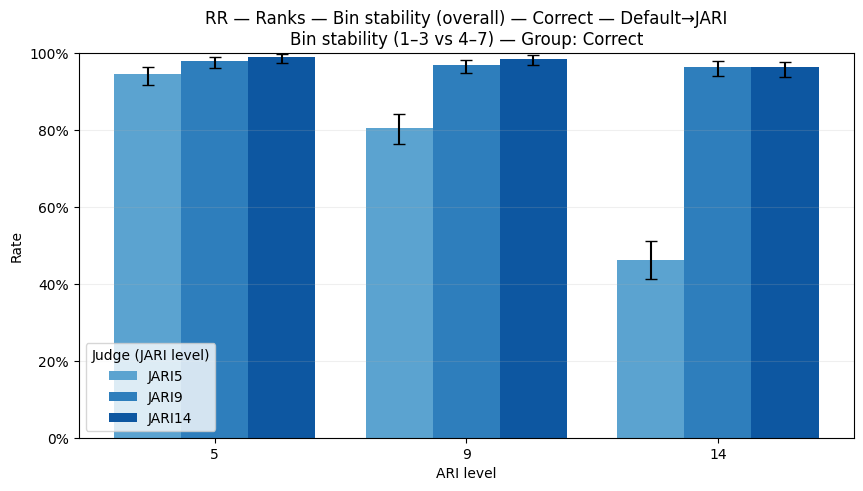

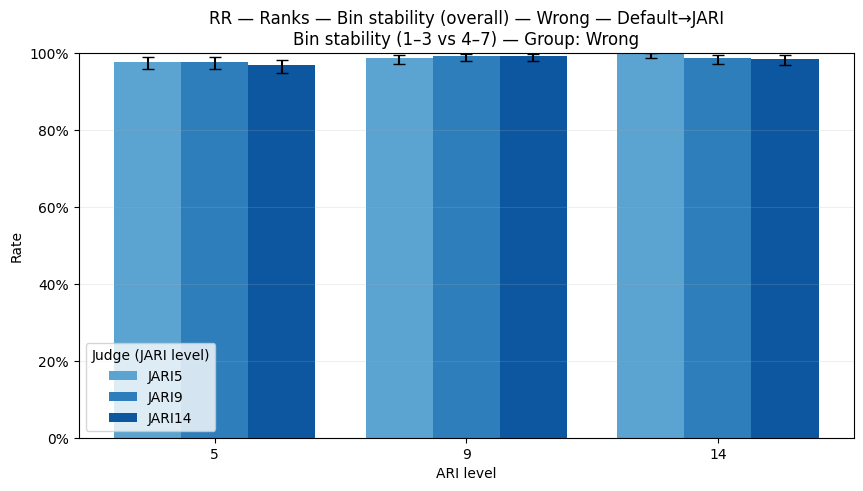

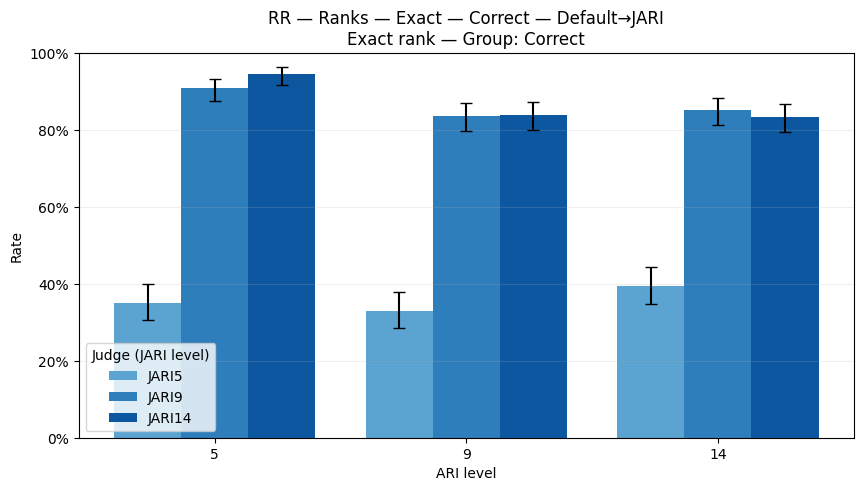

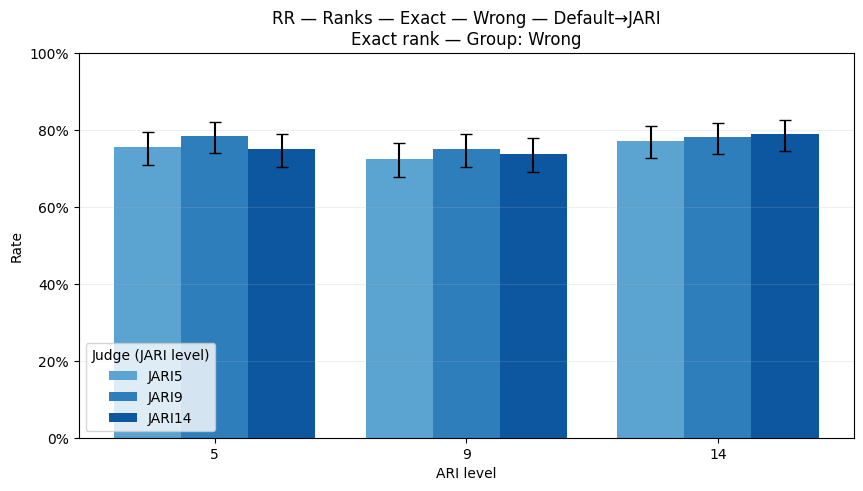

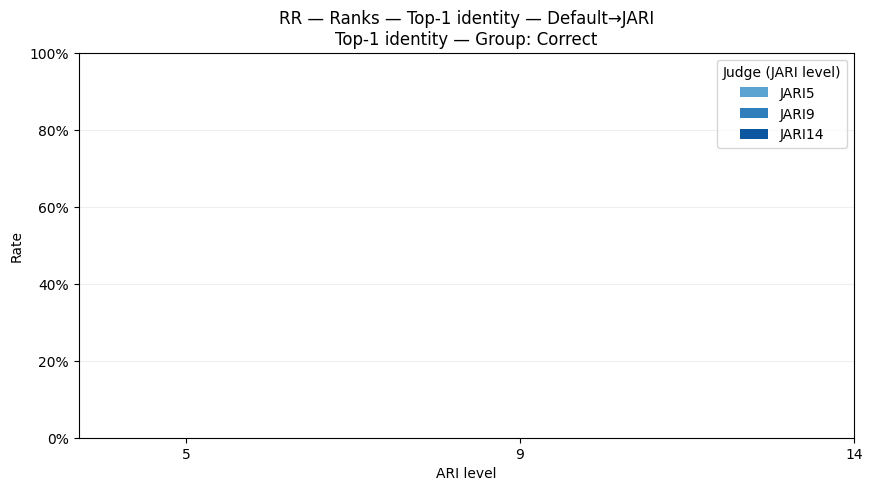

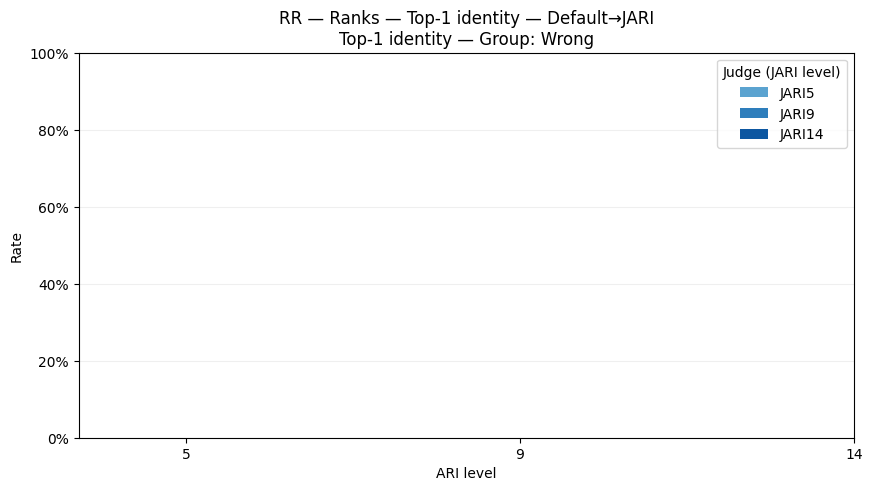

In [17]:
# Example: build RR listwise DFs for JARI5/9/14 (baseline)
rr5_ranks  = rr_listwise_df("GPT-4", "JARI5-baseline", RR5_RANK_BASE, RR5_RANK_PERT)
rr9_ranks  = rr_listwise_df("GPT-4", "JARI9-baseline", RR5_RANK_BASE, RR9_RANK_PERT)
rr14_ranks = rr_listwise_df("GPT-4", "JARI14-baseline", RR5_RANK_BASE, RR14_RANK_PERT)

jari_frames = [("JARI5", rr5_ranks), ("JARI9", rr9_ranks), ("JARI14", rr14_ranks)]

# 1) Bin stability (overall)
plot_consolidated_ranks(jari_frames, metric='rank_bin_overall', group='Correct',
                        title="RR — Ranks — Bin stability (overall) — Correct — Default→JARI", blues=True)
plot_consolidated_ranks(jari_frames, metric='rank_bin_overall', group='Wrong',
                        title="RR — Ranks — Bin stability (overall) — Wrong — Default→JARI", blues=True)

# 2) Exact rank stability
plot_consolidated_ranks(jari_frames, metric='rank_exact', group='Correct',
                        title="RR — Ranks — Exact — Correct — Default→JARI", blues=True)
plot_consolidated_ranks(jari_frames, metric='rank_exact', group='Wrong',
                        title="RR — Ranks — Exact — Wrong — Default→JARI", blues=True)

# 3) Top-1 identity (group='Both')
plot_consolidated_ranks(jari_frames, metric='rank_top1', group='Correct',
                        title="RR — Ranks — Top-1 identity — Default→JARI", blues=True)
plot_consolidated_ranks(jari_frames, metric='rank_top1', group='Wrong',
                        title="RR — Ranks — Top-1 identity — Default→JARI", blues=True)

# 4) Conditional bin stability panels (Top-preserved & Bottom-preserved)
# plot_consolidated_rank_conditionals(jari_frames, group='Correct',
#                                     title="RR — Ranks — Conditional bin stability — Default→JARI", blues=True)


In [18]:
write_rr_pointwise(rr5_scores, MODEL, OUT_DIR);  
write_rr_listwise(rr5_ranks, MODEL, OUT_DIR)
write_rr_pointwise(rr9_scores, MODEL, OUT_DIR);  
write_rr_listwise(rr9_ranks, MODEL, OUT_DIR)
write_rr_pointwise(rr14_scores, MODEL, OUT_DIR);  
write_rr_listwise(rr14_ranks, MODEL, OUT_DIR)
# show_rr_scores(rr5_scores, MODEL, "JARI5-baseline");  show_rr_ranks(rr5_ranks, MODEL, "JARI5-baseline")

# -------- RR (Default → JARI9) --------
# RR9_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari9_all_score_baseline1.csv"
# RR9_RANK_PERT  = "../resultFiles/GPT4/Jari/Rank/gpt4_jari9_ref_ari_rank_baseline1.csv"
# rr9_scores = rr_pointwise_df(MODEL, "JARI9-baseline", RR5_SCORE_BASE, RR9_SCORE_PERT, eps=1.0)
# rr9_ranks  = rr_listwise_df (MODEL, "JARI9-baseline", RR5_RANK_BASE,  RR9_RANK_PERT)
# write_rr_pointwise(rr9_scores, MODEL, OUT_DIR);  write_rr_listwise(rr9_ranks, MODEL, OUT_DIR)

# -------- RR (Default → JARI14) --------
# RR14_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari14_all_score_baseline1.csv"
# RR14_RANK_PERT  = "../resultFiles/GPT4/Jari/Rank/gpt4_jari14_ref_ari_rank_baseline1.csv"
# rr14_scores = rr_pointwise_df(MODEL, "JARI14-baseline", RR5_SCORE_BASE, RR14_SCORE_PERT, eps=1.0)
# rr14_ranks  = rr_listwise_df (MODEL, "JARI14-baseline", RR5_RANK_BASE,  RR14_RANK_PERT)
# write_rr_pointwise(rr14_scores, MODEL, OUT_DIR);  write_rr_listwise(rr14_ranks, MODEL, OUT_DIR)


    # -------- Optional: consolidated gradient plot (scores) --------
    # Once you compute rr9_scores and rr14_scores above, use:
plot_consolidated_rr_scores(
    jari_frames=[("JARI5", rr5_scores), ("JARI9", rr9_scores), ("JARI14", rr14_scores)],
    metric='score_eps1', group='Correct',
    x_labels=('Score_ARI_5','Score_ARI_9','Score_ARI_14'),
    title="RR — Scores (Correct) — Default→JARI (blue gradient)", blues=True)

NameError: name 'plot_consolidated_rr_scores' is not defined

In [14]:

from matplotlib.ticker import PercentFormatter
from matplotlib.patches import Patch

def plot_consolidated_ranks_groups_split(jari_frames, *,
                                         metric='rank_exact',
                                         ari=(5,9,14),
                                         title="Consolidated — Ranks (Correct left • Wrong right)",
                                         blues=True):
    """
    For each ARI, create two sub-clusters: LEFT = Correct (all judges), RIGHT = Wrong (all judges).
    Bars are grouped by judge within each sub-cluster. CI whiskers shown.

    jari_frames: [(label, df), ...] where df has columns:
      ['metric','group','ARI','rate','ci_low','ci_high', ...]
    metric: one of {'rank_exact','rank_bin_overall','rank_bin_top_preserve','rank_bin_bottom_preserve'}
    """

    if metric == 'rank_top1':
        raise ValueError("Top-1 uses group='Both' only. Use the single-group consolidated plot for Top-1.")

    # matrices [len(ari) x len(judges)]
    rates_C, lo_C, hi_C = _extract_metric_matrix(jari_frames, metric, 'Correct', ari)
    rates_W, lo_W, hi_W = _extract_metric_matrix(jari_frames, metric, 'Wrong',   ari)

    n_ari, n_judges = rates_C.shape
    if n_judges == 0 or n_ari == 0:
        raise ValueError("No data to plot. Check that your frames contain the requested metric & groups.")

    # Color palette (blue gradient by judge)
    if blues:
        cmap = plt.get_cmap('Blues')
        shades = np.linspace(0.55, 0.85, n_judges)
        colors = [cmap(s) for s in shades]
    else:
        colors = [None] * n_judges

    # Layout math
    # width per bar inside a sub-cluster; sub-cluster width = n_judges * width
    width = 0.8 / max(1, n_judges)
    sub_w = n_judges * width
    gap   = 0.30                        # space between Correct and Wrong sub-clusters (per ARI)
    span  = sub_w*2 + gap + 0.40        # total horizontal span allocated per ARI (incl. a bit of breathing room)

    fig, ax = plt.subplots(figsize=(max(9, 2*n_ari + 5), 5))

    xticks = []
    xticks_lbl = []

    for i, a in enumerate(ari):
        base = i * span

        # left sub-cluster (Correct) starts at:
        start_C = base - (sub_w + gap)/2
        # right sub-cluster (Wrong) starts at:
        start_W = start_C + sub_w + gap

        # bar positions for all judges
        pos_C = start_C + np.arange(n_judges) * width
        pos_W = start_W + np.arange(n_judges) * width

        # --- draw Correct ---
        for j, (label, _df) in enumerate(jari_frames):
            ax.bar(pos_C[j], rates_C[i, j], width,
                   yerr=[[lo_C[i, j]],[hi_C[i, j]]], capsize=4,
                   color=colors[j], label=f"{label} — Correct" if i==0 else None)

        # --- draw Wrong (hatched) ---
        for j, (label, _df) in enumerate(jari_frames):
            ax.bar(pos_W[j], rates_W[i, j], width,
                   yerr=[[lo_W[i, j]],[hi_W[i, j]]], capsize=4,
                   color=colors[j], hatch='//', edgecolor='black',
                   label=f"{label} — Wrong" if i==0 else None)

        # xticks at the centers of the two sub-clusters
        xticks.extend([start_C + sub_w/2, start_W + sub_w/2])
        xticks_lbl.extend([f"{a}\nCorrect", f"{a}\nWrong"])

    # Axes cosmetics
    ax.set_xticks(xticks); ax.set_xticklabels(xticks_lbl)
    ax.yaxis.set_major_formatter(PercentFormatter(1.0, 0))
    ax.set_ylim(0, 1.0)
    name_map = {
        'rank_bin_overall': 'Bin stability (1–3 vs 4–7)',
        'rank_exact': 'Exact rank',
        'rank_bin_top_preserve': 'Top-bin preserved | baseline 1–3',
        'rank_bin_bottom_preserve': 'Bottom-bin preserved | baseline 4–7',
    }
    human = name_map.get(metric, metric)
    ax.set_title(f"{title}\n{human}")
    ax.set_xlabel("ARI level • group"); ax.set_ylabel("Rate")
    ax.grid(True, axis='y', alpha=0.2)

    # Compact legend: judges (colors) + group (hatch key)
    judge_handles = [Patch(facecolor=colors[j], edgecolor='none', label=label)
                     for j,(label,_) in enumerate(jari_frames)]
    group_handles = [Patch(facecolor='white', edgecolor='black', label='Correct'),
                     Patch(facecolor='white', edgecolor='black', hatch='//', label='Wrong')]
    leg1 = ax.legend(handles=judge_handles, title="Judge", loc='upper left', bbox_to_anchor=(1.01, 1.0))
    leg2 = ax.legend(handles=group_handles, title="Group", loc='upper left', bbox_to_anchor=(1.01, 0.52))
    ax.add_artist(leg1)

    plt.tight_layout()
    plt.show()


In [19]:
rr5_ranks

,model,exp_name,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,GPT-4,JARI5-baseline,RR,rank_bin_overall,Correct,5,369,391,0.943734,0.916281,0.962552
1,GPT-4,JARI5-baseline,RR,rank_exact,Correct,5,137,391,0.350384,0.304758,0.398920
2,GPT-4,JARI5-baseline,RR,rank_bin_overall,Correct,9,315,391,0.805627,0.763508,0.841798
3,GPT-4,JARI5-baseline,RR,rank_exact,Correct,9,129,391,0.329923,0.285171,0.377985
4,GPT-4,JARI5-baseline,RR,rank_bin_overall,Correct,14,180,391,0.460358,0.411579,0.509908
5,GPT-4,JARI5-baseline,RR,rank_exact,Correct,14,154,391,0.393862,0.346689,0.443100
6,GPT-4,JARI5-baseline,RR,rank_bin_overall,Wrong,5,382,391,0.976982,0.956839,0.987844
7,GPT-4,JARI5-baseline,RR,rank_exact,Wrong,5,295,391,0.754476,0.709475,0.794525
8,GPT-4,JARI5-baseline,RR,rank_bin_overall,Wrong,9,386,391,0.987212,0.970418,0.994526
9,GPT-4,JARI5-baseline,RR,rank_exact,Wrong,9,283,391,0.723785,0.677452,0.765764


In [24]:
# Assuming you’ve already built the RR (or CR) listwise DFs:
frames = [("JARI5", rr5_ranks), ("JARI9", rr9_ranks), ("JARI14", rr14_ranks)]
frames_cot = [("JARI5", rr5_cot_ranks), ("JARI9", rr9_cot_ranks), ("JARI14", rr14_cot_ranks)]

In [25]:
frames

[('JARI5',
      model        exp_name mode            metric    group  ARI    k    n  \
  0   GPT-4  JARI5-baseline   RR  rank_bin_overall  Correct    5  369  391   
  1   GPT-4  JARI5-baseline   RR        rank_exact  Correct    5  137  391   
  2   GPT-4  JARI5-baseline   RR  rank_bin_overall  Correct    9  315  391   
  3   GPT-4  JARI5-baseline   RR        rank_exact  Correct    9  129  391   
  4   GPT-4  JARI5-baseline   RR  rank_bin_overall  Correct   14  180  391   
  5   GPT-4  JARI5-baseline   RR        rank_exact  Correct   14  154  391   
  6   GPT-4  JARI5-baseline   RR  rank_bin_overall    Wrong    5  382  391   
  7   GPT-4  JARI5-baseline   RR        rank_exact    Wrong    5  295  391   
  8   GPT-4  JARI5-baseline   RR  rank_bin_overall    Wrong    9  386  391   
  9   GPT-4  JARI5-baseline   RR        rank_exact    Wrong    9  283  391   
  10  GPT-4  JARI5-baseline   RR  rank_bin_overall    Wrong   14  390  391   
  11  GPT-4  JARI5-baseline   RR        rank_exact   

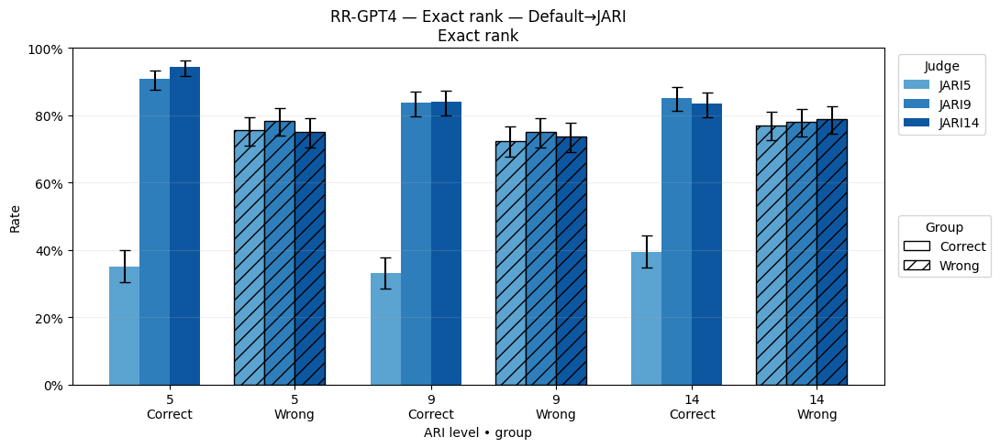

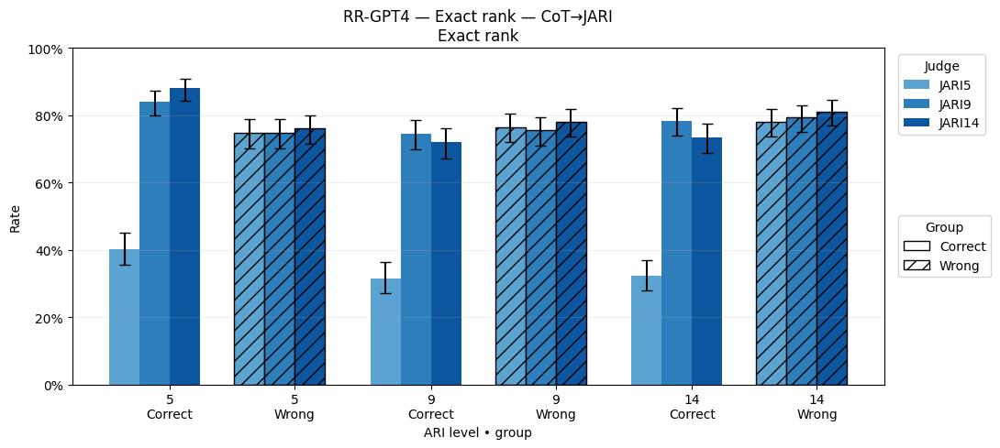

In [16]:


# Exact rank, Correct on the LEFT and Wrong on the RIGHT for each ARI:
plot_consolidated_ranks_groups_split(frames, metric='rank_exact',
                                     title="RR-GPT4 — Exact rank — Default→JARI")

# Exact rank, Correct on the LEFT and Wrong on the RIGHT for each ARI:
plot_consolidated_ranks_groups_split(frames_cot, metric='rank_exact',
                                     title="RR-GPT4 — Exact rank — CoT→JARI")

# # Conditional bin stability (also works the same way):
# plot_consolidated_ranks_groups_split(frames, metric='rank_bin_top_preserve',
#                                      title="RR — Top-bin preserved — Default→JARI")
# plot_consolidated_ranks_groups_split(frames, metric='rank_bin_bottom_preserve',
#                                      title="RR — Bottom-bin preserved — Default→JARI")


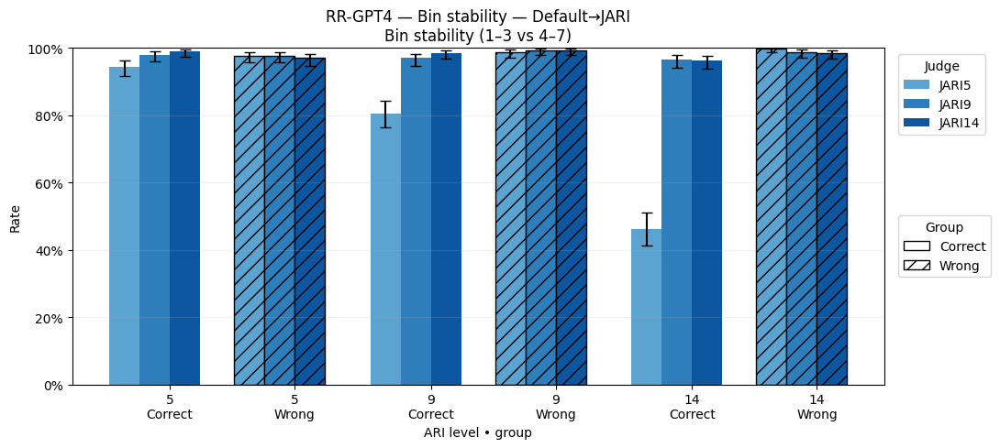

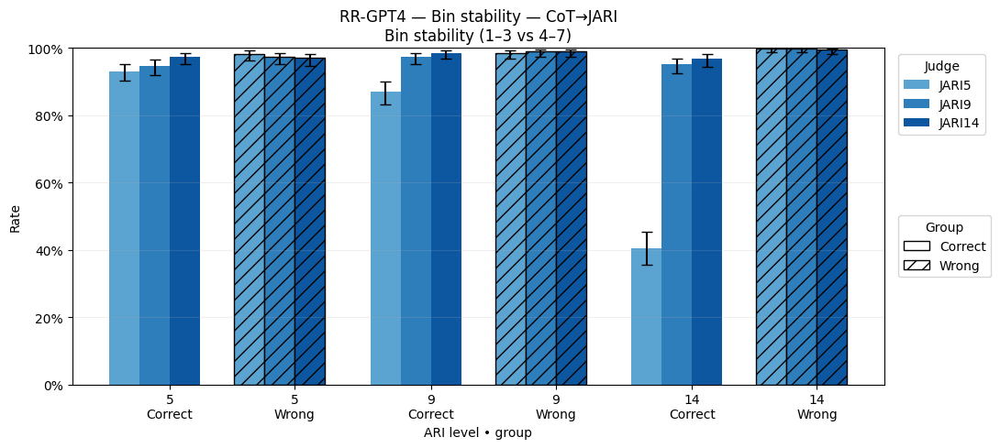

In [17]:


# Overall bin stability with the same left/right layout:
plot_consolidated_ranks_groups_split(frames, metric='rank_bin_overall',
                                     title="RR-GPT4 — Bin stability — Default→JARI")

# Overall bin stability with the same left/right layout:
plot_consolidated_ranks_groups_split(frames_cot, metric='rank_bin_overall',
                                     title="RR-GPT4 — Bin stability — CoT→JARI")

***GPT4 Scoring Robustness Rate Eps and exact Match***

In [71]:
jari_score_frames=[("JARI5", rr5_scores),
                 ("JARI9", rr9_scores),
                 ("JARI14", rr14_scores)]
jari_score_frames_cot=[("JARI5", rr5_cot_scores),
                 ("JARI9", rr9_cot_scores),
                 ("JARI14", rr14_cot_scores)],

In [100]:
jari_score_frames

[('JARI5',
      model        exp_name mode       metric    group  ARI    k    n      rate  \
  0   GPT-4  JARI5-baseline   RR  score_exact  Correct    5  146  391  0.373402   
  1   GPT-4  JARI5-baseline   RR   score_eps1  Correct    5  352  391  0.900256   
  2   GPT-4  JARI5-baseline   RR  score_exact  Correct    9  138  391  0.352941   
  3   GPT-4  JARI5-baseline   RR   score_eps1  Correct    9  379  391  0.969309   
  4   GPT-4  JARI5-baseline   RR  score_exact  Correct   14    3  391  0.007673   
  5   GPT-4  JARI5-baseline   RR   score_eps1  Correct   14    9  391  0.023018   
  6   GPT-4  JARI5-baseline   RR  score_exact    Wrong    5  199  391  0.508951   
  7   GPT-4  JARI5-baseline   RR   score_eps1    Wrong    5  343  391  0.877238   
  8   GPT-4  JARI5-baseline   RR  score_exact    Wrong    9  273  391  0.698210   
  9   GPT-4  JARI5-baseline   RR   score_eps1    Wrong    9  380  391  0.971867   
  10  GPT-4  JARI5-baseline   RR  score_exact    Wrong   14  263  391  0.672

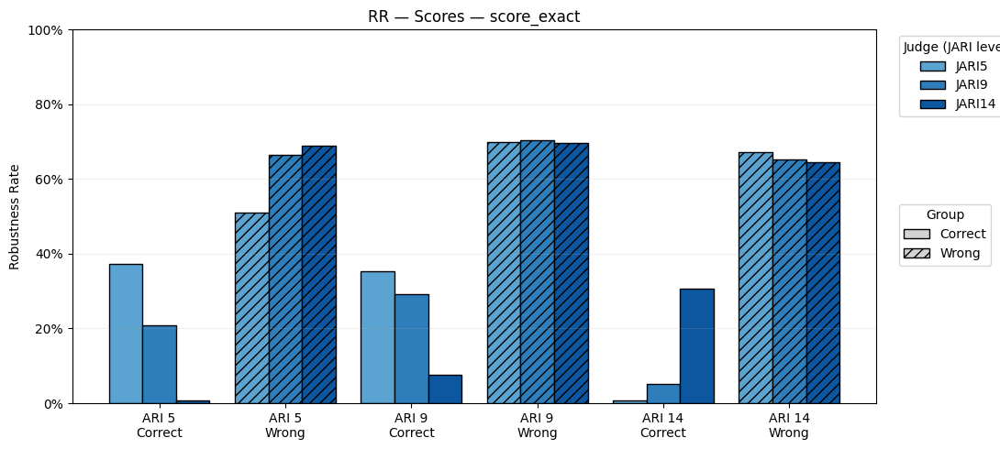

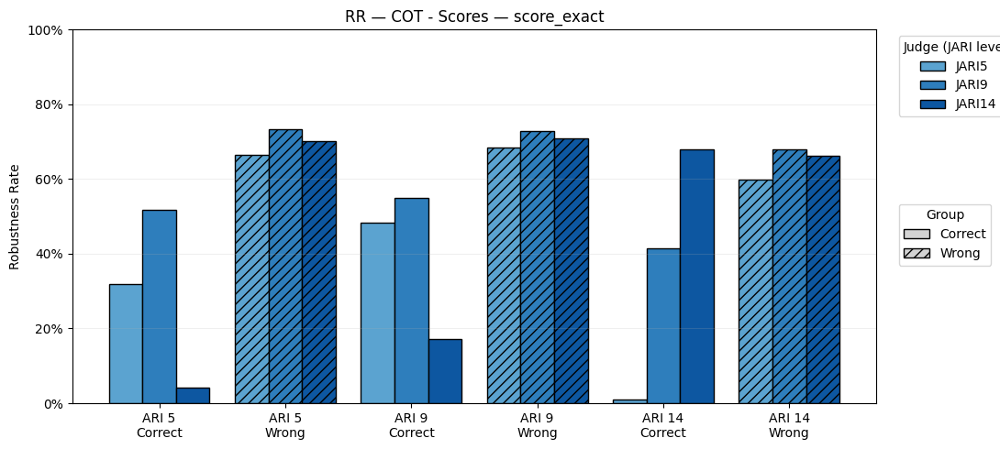

In [163]:
# Exact match plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_scores),
                 ("JARI9", rr9_scores),
                 ("JARI14", rr14_scores)],
    metric="score_exact",
    title_prefix="RR — Scores"
)

# Exact match plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_cot_scores),
                 ("JARI9", rr9_cot_scores),
                 ("JARI14", rr14_cot_scores)],
    metric="score_exact",
    title_prefix="RR — COT - Scores"
)

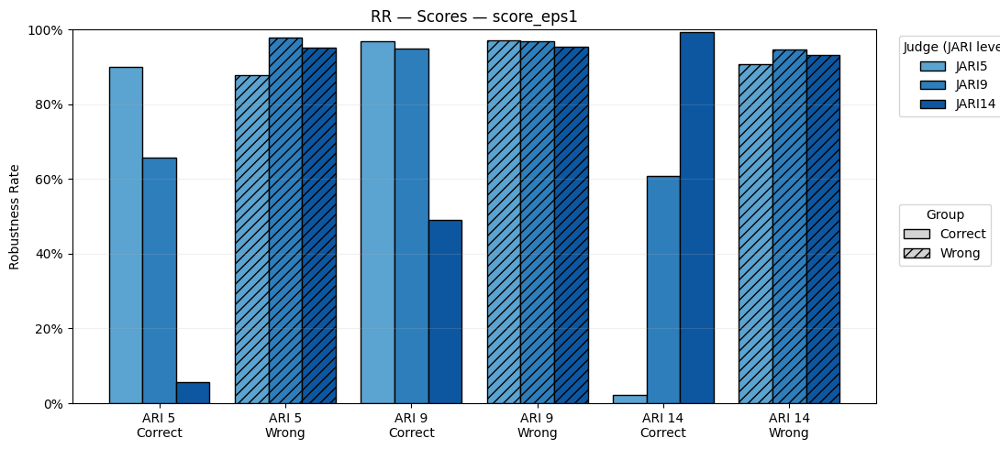

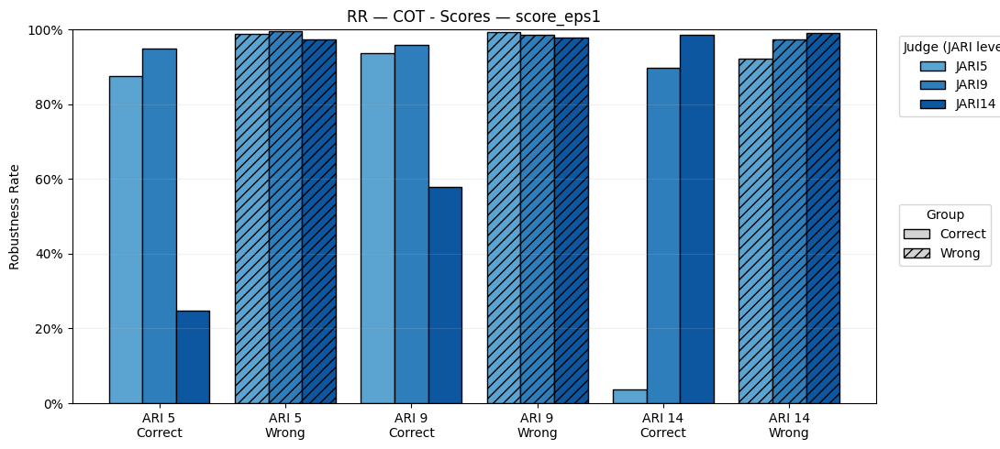

In [164]:
# ±1 tolerance plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_scores),
                 ("JARI9", rr9_scores),
                 ("JARI14", rr14_scores)],
    metric="score_eps1",
    title_prefix="RR — Scores"
)
# ±1 tolerance plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_cot_scores),
                 ("JARI9", rr9_cot_scores),
                 ("JARI14", rr14_cot_scores)],
    metric="score_eps1",
    title_prefix="RR — COT - Scores"
)

***LLAMA***

In [26]:
# ===========================================================
# ========================== USAGE ==========================
# Replace ONLY the paths and run step by step.
# ===========================================================
if __name__ == "__main__":
    MODEL = "LLAMA"
    OUT_DIR = "./results"

    # -------- RR (Default → JARI5) --------
    # RR5_SCORE_BASE = "../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv"
    # RR5_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari5_all_score_baseline1.csv"
    RR5_RANK_BASE  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_baseline1.csv"
    RR_RANK_COT  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_cot.csv"

    RR5_RANK_PERT  = "../resultFiles/LLama/Jari/Rank/llama_jari5_ref_ari_rank_baseline1.csv"
    # RR9_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari9_all_score_baseline1.csv"
    RR9_RANK_PERT  = "../resultFiles/LLama/Jari/Rank/llama_jari9_ref_ari_rank_baseline1.csv"

    # RR14_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari14_all_score_baseline1.csv"
    RR14_RANK_PERT  = "../resultFiles/LLama/Jari/Rank/llama_jari14_ref_ari_rank_baseline1.csv"

    # rr5_scores = rr_pointwise_df(MODEL, "LLama-JARI5-baseline", RR5_SCORE_BASE, RR5_SCORE_PERT, eps=1.0)
    rr5_ranks  = rr_listwise_df (MODEL, "LLama-JARI5-baseline", RR5_RANK_BASE,  RR5_RANK_PERT)
    # rr9_scores = rr_pointwise_df(MODEL, "LLama-JARI9-baseline", RR5_SCORE_BASE, RR9_SCORE_PERT, eps=1.0)
    rr9_ranks  = rr_listwise_df (MODEL, "LLama-JARI9-baseline", RR5_RANK_BASE,  RR9_RANK_PERT)
    # rr14_scores = rr_pointwise_df(MODEL, "LLama-JARI14-baseline", RR5_SCORE_BASE, RR14_SCORE_PERT, eps=1.0)
    rr14_ranks  = rr_listwise_df (MODEL, "LLama-JARI14-baseline", RR5_RANK_BASE,  RR14_RANK_PERT)

    RR5_RANK_COT_PERT = "../resultFiles/LLama/Jari/Rank/llama_jari5_ref_ari_rank_cot.csv"
    RR9_RANK_COT_PERT="../resultFiles/LLama/Jari/Rank/llama_jari9_ref_ari_rank_cot.csv"
    RR14_RANK_COT_PERT ="../resultFiles/LLama/Jari/Rank/llama_jari14_ref_ari_rank_cot.csv"
    

    rr5_cot_ranks  = rr_listwise_df (MODEL, "LLama-JARI5-CoT", RR_RANK_COT, RR5_RANK_COT_PERT)
    rr9_cot_ranks  = rr_listwise_df (MODEL, "LLama-JARI9-CoT", RR_RANK_COT, RR9_RANK_COT_PERT)
    rr14_cot_ranks  = rr_listwise_df (MODEL, "LLama-JARI14-CoT", RR_RANK_COT, RR14_RANK_COT_PERT)

    rr5_ranks  = rr_listwise_df("LLama", "LLama-JARI5-baseline", RR5_RANK_BASE, RR5_RANK_PERT)
    rr9_ranks  = rr_listwise_df("LLama", "LLama-JARI9-baseline", RR5_RANK_BASE, RR9_RANK_PERT)
    rr14_ranks = rr_listwise_df("LLama", "LLama-JARI14-baseline", RR5_RANK_BASE, RR14_RANK_PERT)


In [27]:
RR5_SCORE_BASE = "../resultFiles/LLama/Default/Score/llama_judge_score_baseline1.csv"
RR5_SCORE_PERT = "../resultFiles/LLama/Jari/Score/llama_jari5_score_baseline1.csv"
RR9_SCORE_PERT = "../resultFiles/LLama/Jari/Score/llama_jari9_score_baseline1.csv"
RR14_SCORE_PERT = "../resultFiles/LLama/Jari/Score/llama_jari14_score_baseline1.csv"
rr5_scores = rr_pointwise_df(MODEL, "LLama-JARI5-baseline", RR5_SCORE_BASE, RR5_SCORE_PERT, eps=1.0)
rr9_scores = rr_pointwise_df(MODEL, "LLama-JARI5-baseline", RR5_SCORE_BASE, RR9_SCORE_PERT, eps=1.0)
rr14_scores = rr_pointwise_df(MODEL, "LLama-JARI5-baseline", RR5_SCORE_BASE, RR14_SCORE_PERT, eps=1.0)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 4. 0. 0. 0. 0. 0. 0. 0. 0. 1. 2.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 2. 1. 0. 2. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 4.
 1. 0. 1. 0. 0. 1. 1. 0. 0. 1. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 1. 1. 0. 2. 0. 0. 1. 0. 0. 0. 0. 0. 0. 5. 1. 0. 0.
 0. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 1. 0. 1. 0. 4. 0. 0. 0. 1. 0. 0. 1. 1.
 0. 1. 1. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 1. 0. 1.
 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 2. 1. 0. 0.

In [28]:
MODEL

'LLAMA'

In [29]:
RR_SCORE_COT = "../resultFiles/LLama/Default/Score/llama_judge_score_cot.csv"

RR5_SCORE_COT_PERT = "../resultFiles/LLama/Jari/Score/llama_jari5_score_cot.csv"
RR9_SCORE_COT_PERT = "../resultFiles/LLama/Jari/Score/llama_jari9_score_cot.csv"
RR14_SCORE_COT_PERT = "../resultFiles/LLama/Jari/Score/llama_jari14_score_cot.csv"

rr5_cot_scores = rr_pointwise_df(MODEL, "LLama-JARI5-CoT", RR_SCORE_COT, RR5_SCORE_COT_PERT, eps=1.0)
rr9_cot_scores = rr_pointwise_df(MODEL, "LLama-JARI5-CoT", RR_SCORE_COT, RR9_SCORE_COT_PERT, eps=1.0)
rr14_cot_scores = rr_pointwise_df(MODEL, "LLama-JARI5-CoT", RR_SCORE_COT, RR14_SCORE_COT_PERT, eps=1.0)

[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 2. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 2. 1. 0. 0.
 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 2. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 0. 2. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1.
 1. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 1. 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.
 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.

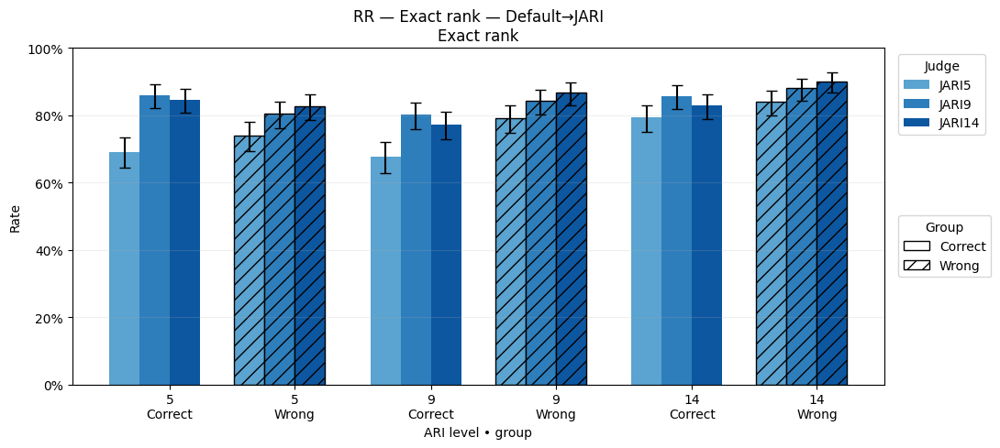

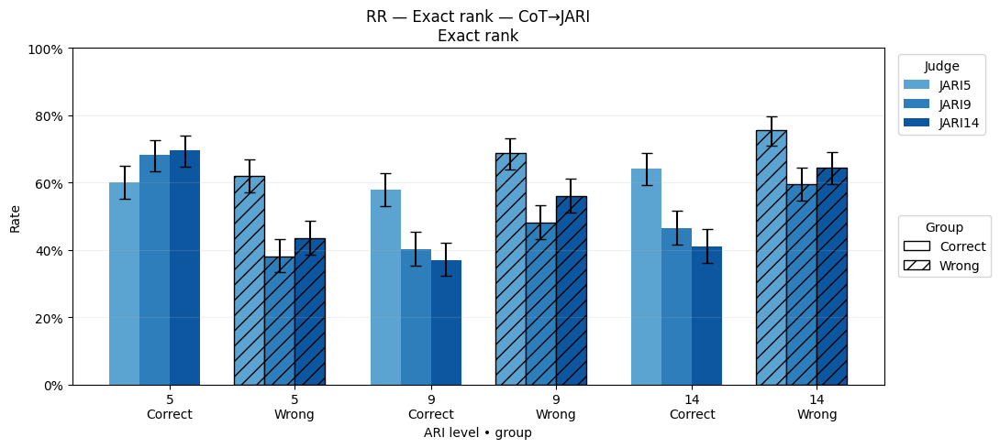

In [30]:
# Assuming you’ve already built the RR (or CR) listwise DFs:
frames_llama = [("JARI5", rr5_ranks), ("JARI9", rr9_ranks), ("JARI14", rr14_ranks)]
frames_llama_cot = [("JARI5", rr5_cot_ranks), ("JARI9", rr9_cot_ranks), ("JARI14", rr14_cot_ranks)]


# Exact rank, Correct on the LEFT and Wrong on the RIGHT for each ARI:
plot_consolidated_ranks_groups_split(frames_llama, metric='rank_exact',
                                     title="RR — Exact rank — Default→JARI")
# Exact rank, Correct on the LEFT and Wrong on the RIGHT for each ARI:
plot_consolidated_ranks_groups_split(frames_llama_cot, metric='rank_exact',
                                     title="RR — Exact rank — CoT→JARI")



In [31]:
frames_llama 

[('JARI5',
      model              exp_name mode            metric    group  ARI    k  \
  0   LLama  LLama-JARI5-baseline   RR  rank_bin_overall  Correct    5  339   
  1   LLama  LLama-JARI5-baseline   RR        rank_exact  Correct    5  270   
  2   LLama  LLama-JARI5-baseline   RR  rank_bin_overall  Correct    9  358   
  3   LLama  LLama-JARI5-baseline   RR        rank_exact  Correct    9  264   
  4   LLama  LLama-JARI5-baseline   RR  rank_bin_overall  Correct   14  354   
  5   LLama  LLama-JARI5-baseline   RR        rank_exact  Correct   14  310   
  6   LLama  LLama-JARI5-baseline   RR  rank_bin_overall    Wrong    5  382   
  7   LLama  LLama-JARI5-baseline   RR        rank_exact    Wrong    5  289   
  8   LLama  LLama-JARI5-baseline   RR  rank_bin_overall    Wrong    9  388   
  9   LLama  LLama-JARI5-baseline   RR        rank_exact    Wrong    9  309   
  10  LLama  LLama-JARI5-baseline   RR  rank_bin_overall    Wrong   14  390   
  11  LLama  LLama-JARI5-baseline   RR   

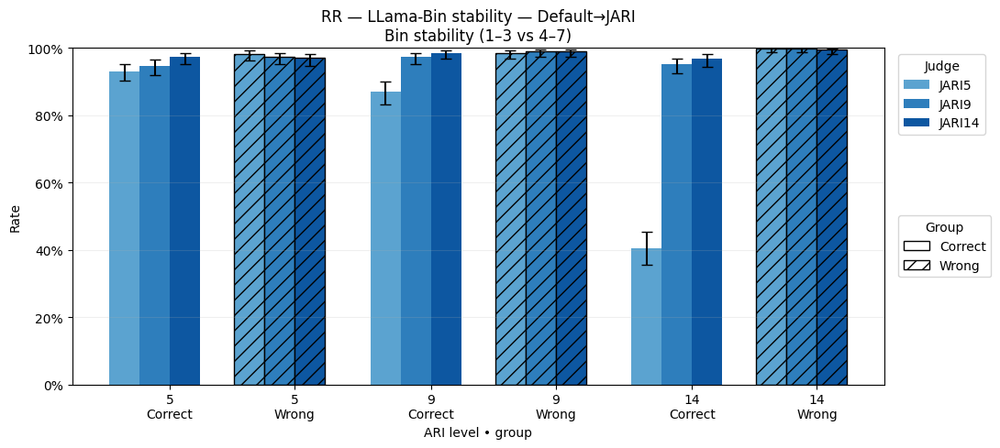

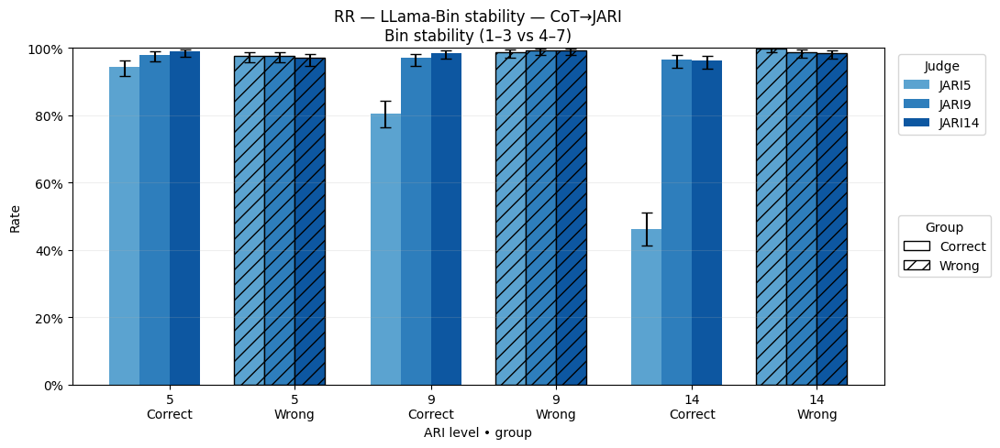

In [32]:
# Overall bin stability with the same left/right layout:
plot_consolidated_ranks_groups_split(frames_cot, metric='rank_bin_overall',
                                     title="RR — LLama-Bin stability — Default→JARI")

# Overall bin stability with the same left/right layout:
plot_consolidated_ranks_groups_split(frames, metric='rank_bin_overall',
                                     title="RR — LLama-Bin stability — CoT→JARI")


In [33]:
jari_frames_llama=[("JARI5", rr5_scores),
                 ("JARI9", rr9_scores),
                 ("JARI14", rr14_scores)],    
jari_frames_llama_cot=[("JARI5", rr5_cot_scores),
                 ("JARI9", rr9_cot_scores),
                 ("JARI14", rr14_cot_scores)],

In [34]:
jari_frames_llama

([('JARI5',
       model              exp_name mode       metric    group  ARI    k    n  \
   0   LLAMA  LLama-JARI5-baseline   RR  score_exact  Correct    5  301  391   
   1   LLAMA  LLama-JARI5-baseline   RR   score_eps1  Correct    5  379  391   
   2   LLAMA  LLama-JARI5-baseline   RR  score_exact  Correct    9  276  391   
   3   LLAMA  LLama-JARI5-baseline   RR   score_eps1  Correct    9  389  391   
   4   LLAMA  LLama-JARI5-baseline   RR  score_exact  Correct   14    4  391   
   5   LLAMA  LLama-JARI5-baseline   RR   score_eps1  Correct   14   20  391   
   6   LLAMA  LLama-JARI5-baseline   RR  score_exact    Wrong    5  297  391   
   7   LLAMA  LLama-JARI5-baseline   RR   score_eps1    Wrong    5  373  391   
   8   LLAMA  LLama-JARI5-baseline   RR  score_exact    Wrong    9  288  391   
   9   LLAMA  LLama-JARI5-baseline   RR   score_eps1    Wrong    9  372  391   
   10  LLAMA  LLama-JARI5-baseline   RR  score_exact    Wrong   14  259  391   
   11  LLAMA  LLama-JARI5-ba

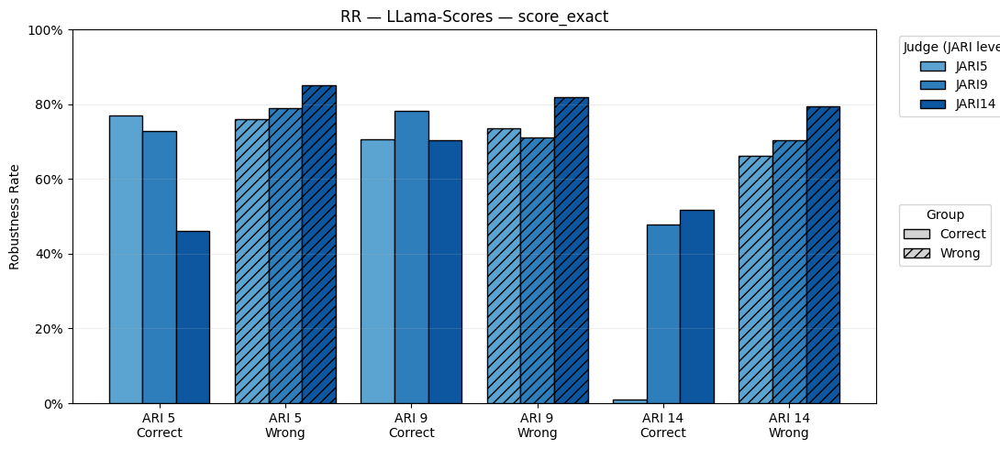

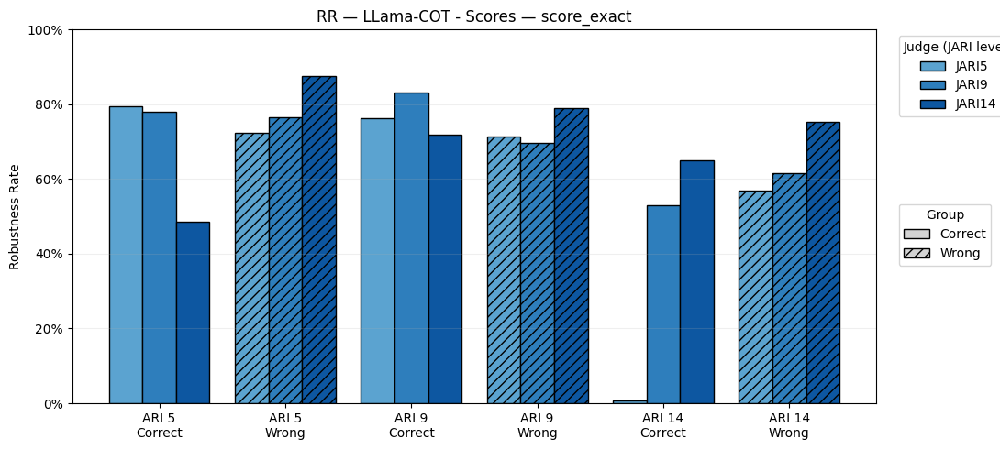

In [35]:
# Exact match plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_scores),
                 ("JARI9", rr9_scores),
                 ("JARI14", rr14_scores)],
    metric="score_exact",
    title_prefix="RR — LLama-Scores"
)

# Exact match plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_cot_scores),
                 ("JARI9", rr9_cot_scores),
                 ("JARI14", rr14_cot_scores)],
    metric="score_exact",
    title_prefix="RR — LLama-COT - Scores"
)

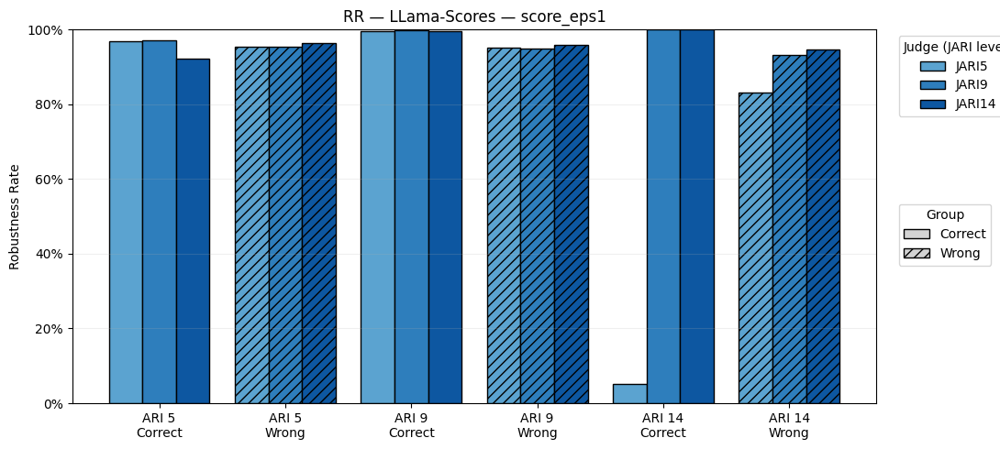

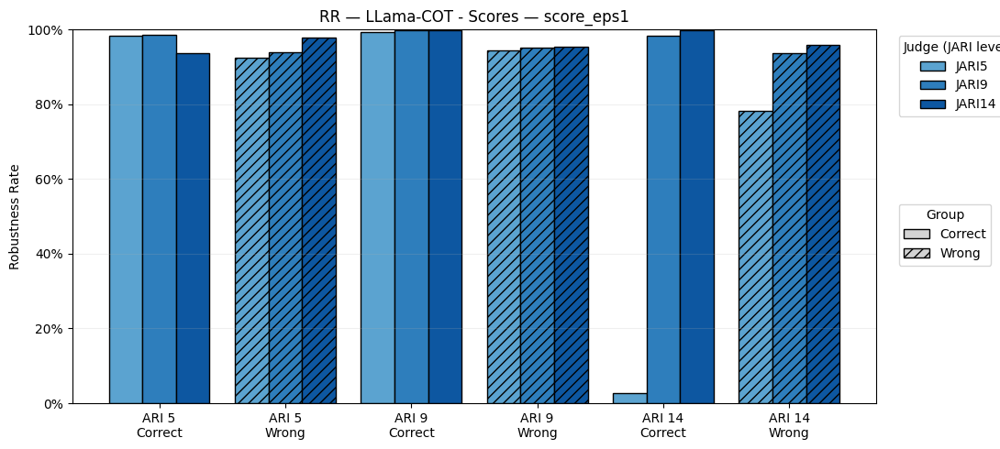

In [36]:
# ±1 tolerance plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_scores),
                 ("JARI9", rr9_scores),
                 ("JARI14", rr14_scores)],
    metric="score_eps1",
    title_prefix="RR — LLama-Scores"
)
# ±1 tolerance plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_cot_scores),
                 ("JARI9", rr9_cot_scores),
                 ("JARI14", rr14_cot_scores)],
    metric="score_eps1",
    title_prefix="RR — LLama-COT - Scores"
)

***CR***

# Ensemlble Eval

In [37]:
import numpy as np
import pandas as pd
from collections import defaultdict

def compute_poll_rank(*dfs, rank_columns=None,
                      tie_break="median",          # "median" | "min" | "max" | "closest_to_mean" | "priority" | "random"
                      weights=None,
                      priority=None,
                      seed=None):
    if len(dfs) < 2:
        raise ValueError("Pass at least two DataFrames.")
    n = len(dfs)
    if weights is None:
        weights = [1.0]*n
    if priority is None:
        priority = list(range(n))
    rng = np.random.default_rng(seed)

    # UNION of indices
    union_idx = dfs[0].index
    for d in dfs[1:]:
        union_idx = union_idx.union(d.index)
    dfs = [d.reindex(union_idx) for d in dfs]

    # Columns to use
    if rank_columns is None:
        cols = set(dfs[0].columns)
        for d in dfs[1:]:
            cols &= set(d.columns)
        rank_columns = sorted(cols)
    else:
        # warn / filter columns that don't exist
        missing = [c for c in rank_columns if not all(c in d.columns for d in dfs)]
        if missing:
            print("Warning: dropping missing columns:", missing)
            rank_columns = [c for c in rank_columns if all(c in d.columns for d in dfs)]

    # <-- FIX: convert each column (Series) to numeric -->
    mats = [d[rank_columns].apply(pd.to_numeric, errors="coerce") for d in dfs]

    out = pd.DataFrame(index=union_idx, columns=rank_columns, dtype="Int64")

    def break_tie(values, valid_mask, tied_vals):
        v = values[valid_mask].astype(int)
        if tie_break == "median":
            return int(np.median(v))
        elif tie_break == "min":
            return int(np.min(v))
        elif tie_break == "max":
            return int(np.max(v))
        elif tie_break == "closest_to_mean":
            mu = float(np.mean(v))
            cand = sorted(tied_vals, key=lambda x: (abs(x-mu), x))
            return int(cand[0])
        elif tie_break == "priority":
            for j in priority:
                val = values[j]
                if pd.notna(val) and int(val) in tied_vals:
                    return int(val)
            return int(sorted(tied_vals)[0])
        elif tie_break == "random":
            return int(rng.choice(list(tied_vals)))
        else:
            return int(np.median(v))

    # vote per column/row
    for col in rank_columns:
        arr = np.vstack([mats[j][col].to_numpy() for j in range(n)])  # (n_judges, n_rows)
        col_idx = out.columns.get_loc(col)
        for i in range(arr.shape[1]):
            vals = arr[:, i]
            valid = ~np.isnan(vals)
            if not valid.any():
                out.iat[i, col_idx] = pd.NA
                continue

            # weighted counts
            counts = defaultdict(float)
            for j, ok in enumerate(valid):
                if ok:
                    counts[int(vals[j])] += float(weights[j])

            total_w = sum(counts.values())
            chosen = None
            for k, w in counts.items():
                if w > total_w / 2.0:
                    chosen = int(k)
                    break

            if chosen is None:
                max_w = max(counts.values())
                tied = {k for k, w in counts.items() if np.isclose(w, max_w)}
                chosen = break_tie(vals, valid, tied)

            out.iat[i, col_idx] = chosen

    return out


In [38]:
# def compute_poll_scores_mean(*dfs, score_columns=None, weights=None):
#     if len(dfs) < 2: raise ValueError("Pass at least two DataFrames.")
#     J = len(dfs)
#     if weights is None: weights = np.ones(J, dtype=float)

#     # Union of indices; reindex; numeric coercion
#     idx = dfs[0].index
#     for d in dfs[1:]: idx = idx.union(d.index)
#     dfs = [d.reindex(idx) for d in dfs]

#     if score_columns is None:
#         cols = set(dfs[0].columns)
#         for d in dfs[1:]: cols &= set(d.columns)
#         score_columns = sorted(cols)

#     mats = [dfs[j][score_columns].apply(pd.to_numeric, errors="coerce") for j in range(J)]
#     out = pd.DataFrame(index=idx, columns=score_columns, dtype=float)

#     for c in score_columns:
#         A = np.vstack([m[c].to_numpy() for m in mats])  # (J, N)
#         mask = ~np.isnan(A)
#         w = weights[:, None] * mask
        
#         # --- FIX IS HERE ---
#         # Convert NaNs in A to 0 before multiplying to avoid NaN propagation.
#         # The weight 'w' is already 0 for these positions, so the numerator is unaffected.
#         A_no_nan = np.nan_to_num(A) 
#         num = (A_no_nan * w).sum(axis=0)
#         # --- END FIX ---
        
#         den = w.sum(axis=0)
#         out[c] = np.where(den > 0, num / den, np.nan)

#     return out


### Thing to note we use round for exact match beacuse of integer score and decimal score in PoLL##
def compute_poll_scores_mean(*dfs, score_columns=None, weights=None):
    if len(dfs) < 2: raise ValueError("Pass at least two DataFrames.")
    J = len(dfs)
    if weights is None: weights = np.ones(J, dtype=float)

    # Union of indices; reindex; numeric coercion
    idx = dfs[0].index
    for d in dfs[1:]: idx = idx.union(d.index)
    dfs = [d.reindex(idx) for d in dfs]

    if score_columns is None:
        cols = set(dfs[0].columns)
        for d in dfs[1:]: cols &= set(d.columns)
        score_columns = sorted(cols)

    mats = [dfs[j][score_columns].apply(pd.to_numeric, errors="coerce") for j in range(J)]
    out = pd.DataFrame(index=idx, columns=score_columns, dtype=float)

    for c in score_columns:
        A = np.vstack([m[c].to_numpy() for m in mats])  # (J, N)
        mask = ~np.isnan(A)
        w = weights[:, None] * mask
        
        A_no_nan = np.nan_to_num(A) 
        num = (A_no_nan * w).sum(axis=0)
        
        den = w.sum(axis=0)
        
        # --- MODIFICATION IS HERE ---
        # Changed np.ceil to np.round for standard rounding (majority vote).
        out[c] = np.where(den > 0, np.round(num / den), np.nan)
        # --- END MODIFICATION ---

    return out

In [39]:
df_mistral  = pd.read_csv("../resultFiles/Mistral/Default/Rank/mistral_judge_rank_baseline1.csv",  index_col=0)
df_qwen  = pd.read_csv("../resultFiles/Qwen/Default/Rank/qwen32_judge_rank_baseline1.csv",  index_col=0)
df_gpt3 = pd.read_csv("../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_baseline1.csv", index_col=0)

cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_baseline = compute_poll_rank(
    df_mistral, df_qwen, df_gpt3,
    rank_columns=cols, tie_break="median"
)
# poll_baseline = compute_poll_rank(
#     df_mistral, df_qwen, df_gpt3,
#     rank_columns=cols,
#     tie_break="priority",
#     priority=[2, 0, 1]   # prefer GPT-3, then Mistral, then Qwen
# )



# or, if you trust JARI14 most:
# poll = compute_poll_rank(df5, df9, df14, rank_columns=cols, tie_break="priority", priority=[2,1,0])


In [40]:
df_mistral_score  = pd.read_csv("../resultFiles/Mistral/Default/Score/mistral_judge_score_baseline1.csv",  index_col=0)
df_qwen_score  = pd.read_csv("../resultFiles/Qwen/Default/Score/qwen32_score_baseline1.csv",  index_col=0)
df_gpt3_score = pd.read_csv("../resultFiles/GPT3/Default/Score/gpt3_judge_score_baseline.csv", index_col=0)
df_mistral_score.head()

,Score_Ref_Answer,Score_ARI_5,Score_ARI_9,Score_ARI_14,Score_Wrong_Answer_ARI_5,Score_Wrong_Answer_ARI_9,Score_Wrong_Answer_ARI_14
0,NaN,8.0,9.0,9.0,7.0,4.0,NaN
1,5.0,7.0,8.0,9.0,4.0,3.0,3.0
2,8.0,7.0,8.0,9.0,4.0,3.0,NaN
3,9.0,7.0,8.0,9.0,2.0,3.0,2.0
4,8.0,7.0,8.0,9.0,3.0,3.0,2.0


In [41]:

cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_baseline_score = compute_poll_scores_mean(
    df_mistral_score, df_qwen_score, df_gpt3_score,
    score_columns=cols
)

In [44]:
df_qwen_score.head()

,Score_Ref_Answer,Score_ARI_5,Score_ARI_9,Score_ARI_14,Score_Wrong_Answer_ARI_5,Score_Wrong_Answer_ARI_9,Score_Wrong_Answer_ARI_14
0,8.0,8.0,8.0,8.0,8.0,3.0,7.0
1,8.0,7.0,8.0,8.0,2.0,2.0,3.0
2,7.0,7.0,8.0,8.0,3.0,2.0,3.0
3,8.0,7.0,8.0,8.0,1.0,2.0,1.0
4,8.0,7.0,8.0,8.0,3.0,2.0,1.0


In [45]:
df_gpt3_score.head()

,Score_Ref_Answer,Score_ARI_5,Score_ARI_9,Score_ARI_14,Score_Wrong_Answer_ARI_5,Score_Wrong_Answer_ARI_9,Score_Wrong_Answer_ARI_14
0,9.0,9.0,9.0,10.0,8.0,6.0,9.0
1,7.0,9.0,10.0,10.0,1.0,1.0,8.0
2,9.0,8.0,9.0,9.0,2.0,1.0,8.0
3,8.0,7.0,9.0,10.0,2.0,1.0,2.0
4,9.0,8.0,9.0,9.0,2.0,2.0,2.0


In [46]:
poll_baseline_score.head()

,Score_Ref_Answer,Score_ARI_5,Score_ARI_9,Score_ARI_14,Score_Wrong_Answer_ARI_5,Score_Wrong_Answer_ARI_9,Score_Wrong_Answer_ARI_14
0,8.0,8.0,9.0,9.0,8.0,4.0,8.0
1,7.0,8.0,9.0,9.0,2.0,2.0,5.0
2,8.0,7.0,8.0,9.0,3.0,2.0,6.0
3,8.0,7.0,8.0,9.0,2.0,2.0,2.0
4,8.0,7.0,8.0,9.0,3.0,2.0,2.0


In [47]:
poll_baseline.head()

,Rank_Ref,Rank_ARI_5,Rank_ARI_9,Rank_ARI_14,Rank_Wrong_Answer_ARI_5,Rank_Wrong_Answer_ARI_9,Rank_Wrong_Answer_ARI_14
0,4,3,2,5,1,7,6
1,4,3,2,1,6,5,6
2,4,3,1,2,6,6,5
3,4,3,1,2,7,5,5
4,4,3,2,1,6,7,5


In [48]:
df_mistral_cot  = pd.read_csv("../resultFiles/Mistral/Default/Rank/mistral_judge_rank_cot.csv",  index_col=0)
df_qwen_cot  = pd.read_csv("../resultFiles/Qwen/Default/Rank/qwen32_judge_rank_cot.csv",  index_col=0)
df_gpt3_cot = pd.read_csv("../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_cot.csv", index_col=0)

cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_cot = compute_poll_rank(
    df_mistral_cot, df_qwen_cot, df_gpt3_cot,
    rank_columns=cols, tie_break="median"
)

In [49]:
poll_cot.head()

,Rank_Ref,Rank_ARI_5,Rank_ARI_9,Rank_ARI_14,Rank_Wrong_Answer_ARI_5,Rank_Wrong_Answer_ARI_9,Rank_Wrong_Answer_ARI_14
0,4,3,2,1,5,7,6
1,4,3,2,1,7,6,5
2,4,3,2,2,7,6,5
3,4,3,2,1,7,6,5
4,4,3,2,1,5,6,6


In [50]:
df_jari5_mistral  = pd.read_csv("../resultFiles/Mistral/Jari/Rank/mistral_jari5_ref_ari_rank_baseline1.csv",  index_col=0)
df_jari5_qwen  = pd.read_csv("../resultFiles/Qwen/Jari/Rank/qwen_jari5_ref_ari_rank_baseline1.csv",  index_col=0)
df_jari5_gpt3 = pd.read_csv("../resultFiles/GPT3/Jari/Rank/gpt3_jari5_ref_ari_rank_baseline1.csv", index_col=0)
cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_jari5_baseline = compute_poll_rank(
    df_jari5_mistral , df_jari5_qwen, df_jari5_gpt3,
    rank_columns=cols, tie_break="median"
)

In [51]:
df_jari5_cot_mistral  = pd.read_csv("../resultFiles/Mistral/Jari/Rank/mistral_jari5_ref_ari_rank_cot.csv",  index_col=0)
df_jari5_cot_qwen  = pd.read_csv("../resultFiles/Qwen/Jari/Rank/qwen_jari5_ref_ari_rank_cot.csv",  index_col=0)
df_jari5_cot_gpt3 = pd.read_csv("../resultFiles/GPT3/Jari/Rank/gpt3_jari5_ref_ari_rank_cot.csv", index_col=0)
cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_jari5_cot = compute_poll_rank(
    df_jari5_cot_mistral , df_jari5_cot_qwen, df_jari5_cot_gpt3,
    rank_columns=cols, tie_break="median"
)

In [52]:
df_jari9_mistral  = pd.read_csv("../resultFiles/Mistral/Jari/Rank/mistral_jari9_ref_ari_rank_baseline1.csv",  index_col=0)
df_jari9_qwen  = pd.read_csv("../resultFiles/Qwen/Jari/Rank/qwen_jari9_ref_ari_rank_baseline1.csv",  index_col=0)
df_jari9_gpt3 = pd.read_csv("../resultFiles/GPT3/Jari/Rank/gpt3_jari9_ref_ari_rank_baseline1.csv", index_col=0)
cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_jari9_baseline = compute_poll_rank(
    df_jari9_mistral , df_jari9_qwen, df_jari9_gpt3,
    rank_columns=cols, tie_break="median"
)

In [53]:
df_jari9_cot_mistral  = pd.read_csv("../resultFiles/Mistral/Jari/Rank/mistral_jari9_ref_ari_rank_cot.csv",  index_col=0)
df_jari9_cot_qwen  = pd.read_csv("../resultFiles/Qwen/Jari/Rank/qwen_jari9_ref_ari_rank_cot.csv",  index_col=0)
df_jari9_cot_gpt3 = pd.read_csv("../resultFiles/GPT3/Jari/Rank/gpt3_jari9_ref_ari_rank_cot.csv", index_col=0)
cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_jari9_cot = compute_poll_rank(
    df_jari9_cot_mistral , df_jari9_cot_qwen, df_jari9_cot_gpt3,
    rank_columns=cols, tie_break="median"
)

In [54]:
df_jari14_mistral  = pd.read_csv("../resultFiles/Mistral/Jari/Rank/mistral_jari14_ref_ari_rank_baseline1.csv",  index_col=0)
df_jari14_qwen  = pd.read_csv("../resultFiles/Qwen/Jari/Rank/qwen_jari14_ref_ari_rank_baseline1.csv",  index_col=0)
df_jari14_gpt3 = pd.read_csv("../resultFiles/GPT3/Jari/Rank/gpt3_jari14_ref_ari_rank_baseline1.csv", index_col=0)
cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_jari14_baseline = compute_poll_rank(
    df_jari14_mistral , df_jari14_qwen, df_jari14_gpt3,
    rank_columns=cols, tie_break="median"
)

In [55]:
df_jari14_cot_mistral  = pd.read_csv("../resultFiles/Mistral/Jari/Rank/mistral_jari14_ref_ari_rank_cot.csv",  index_col=0)
df_jari14_cot_qwen  = pd.read_csv("../resultFiles/Qwen/Jari/Rank/qwen_jari14_ref_ari_rank_cot.csv",  index_col=0)
df_jari14_cot_gpt3 = pd.read_csv("../resultFiles/GPT3/Jari/Rank/gpt3_jari14_ref_ari_rank_cot.csv", index_col=0)
cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_jari14_cot = compute_poll_rank(
    df_jari14_cot_mistral , df_jari14_cot_qwen, df_jari14_cot_gpt3,
    rank_columns=cols, tie_break="median"
)

In [56]:
if __name__ == "__main__":
    MODEL = "Mistral"
    OUT_DIR = "./results"

    # -------- RR (Default → JARI5) --------
    # RR5_SCORE_BASE = "../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv"
    # RR5_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari5_all_score_baseline1.csv"
    RR_RANK_BASE  = df_mistral
    RR_RANK_COT  = df_mistral_cot

    RR5_RANK_PERT  = df_jari5_mistral
    # RR9_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari9_all_score_baseline1.csv"
    RR9_RANK_PERT  = df_jari9_mistral

    # RR14_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari14_all_score_baseline1.csv"
    RR14_RANK_PERT  = df_jari14_mistral

    # rr5_scores = rr_pointwise_df(MODEL, "LLama-JARI5-baseline", RR5_SCORE_BASE, RR5_SCORE_PERT, eps=1.0)
    rr5_ranks  = rr_listwise_df (MODEL, "Mistral-JARI5-baseline", RR5_RANK_BASE,  RR5_RANK_PERT)
    # rr9_scores = rr_pointwise_df(MODEL, "LLama-JARI9-baseline", RR5_SCORE_BASE, RR9_SCORE_PERT, eps=1.0)
    rr9_ranks  = rr_listwise_df (MODEL, "Mistral-JARI9-baseline", RR5_RANK_BASE,  RR9_RANK_PERT)
    # rr14_scores = rr_pointwise_df(MODEL, "LLama-JARI14-baseline", RR5_SCORE_BASE, RR14_SCORE_PERT, eps=1.0)
    rr14_ranks  = rr_listwise_df (MODEL, "Mistral-JARI14-baseline", RR5_RANK_BASE,  RR14_RANK_PERT)

    RR5_RANK_COT_PERT = df_jari5_cot_mistral
    RR9_RANK_COT_PERT=df_jari9_cot_mistral
    RR14_RANK_COT_PERT =df_jari14_cot_mistral
    

    mistral_rr5_cot_ranks  = rr_listwise_df (MODEL, "Mistral-JARI5-CoT", RR_RANK_COT, RR5_RANK_COT_PERT)
    mistral_rr9_cot_ranks  = rr_listwise_df (MODEL, "Mistral-JARI9-CoT", RR_RANK_COT, RR9_RANK_COT_PERT)
    mistral_rr14_cot_ranks  = rr_listwise_df (MODEL, "Mistral-JARI14-CoT", RR_RANK_COT, RR14_RANK_COT_PERT)

    mistral_rr5_ranks  = rr_listwise_df(MODEL, "Mistral-JARI5-baseline", RR5_RANK_BASE, RR5_RANK_PERT)
    mistral_rr9_ranks  = rr_listwise_df(MODEL, "Mistral-JARI9-baseline", RR5_RANK_BASE, RR9_RANK_PERT)
    mistral_rr14_ranks = rr_listwise_df(MODEL, "Mistral-JARI14-baseline", RR5_RANK_BASE, RR14_RANK_PERT)

    # RR_SCORE_COT = poll_cot_score

    # RR5_SCORE_COT_PERT = poll_jari5_cot_score
    # RR9_SCORE_COT_PERT = poll_jari9_cot_score
    # RR14_SCORE_COT_PERT = poll_jari14_cot_score

    # rr5_cot_scores = rr_pointwise_df(MODEL, "PoLL-JARI5-CoT", RR_SCORE_COT, RR5_SCORE_COT_PERT, eps=1.0)
    # rr9_cot_scores = rr_pointwise_df(MODEL, "PoLL-JARI5-CoT", RR_SCORE_COT, RR9_SCORE_COT_PERT, eps=1.0)
    # rr14_cot_scores = rr_pointwise_df(MODEL, "PoLL-JARI5-CoT", RR_SCORE_COT, RR14_SCORE_COT_PERT, eps=1.0)

In [57]:
if __name__ == "__main__":
    MODEL = "Qwen"
    OUT_DIR = "./results"

    # -------- RR (Default → JARI5) --------
    # RR5_SCORE_BASE = "../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv"
    # RR5_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari5_all_score_baseline1.csv"
    RR_RANK_BASE  = df_qwen
    RR_RANK_COT  = df_qwen_cot

    RR5_RANK_PERT  = df_jari5_qwen
    # RR9_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari9_all_score_baseline1.csv"
    RR9_RANK_PERT  = df_jari9_qwen

    # RR14_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari14_all_score_baseline1.csv"
    RR14_RANK_PERT  = df_jari14_qwen

    # rr5_scores = rr_pointwise_df(MODEL, "LLama-JARI5-baseline", RR5_SCORE_BASE, RR5_SCORE_PERT, eps=1.0)
    rr5_ranks  = rr_listwise_df (MODEL, "Qwen-JARI5-baseline", RR5_RANK_BASE,  RR5_RANK_PERT)
    # rr9_scores = rr_pointwise_df(MODEL, "LLama-JARI9-baseline", RR5_SCORE_BASE, RR9_SCORE_PERT, eps=1.0)
    rr9_ranks  = rr_listwise_df (MODEL, "Qwen-JARI9-baseline", RR5_RANK_BASE,  RR9_RANK_PERT)
    # rr14_scores = rr_pointwise_df(MODEL, "LLama-JARI14-baseline", RR5_SCORE_BASE, RR14_SCORE_PERT, eps=1.0)
    rr14_ranks  = rr_listwise_df (MODEL, "Qwen-JARI14-baseline", RR5_RANK_BASE,  RR14_RANK_PERT)

    RR5_RANK_COT_PERT = df_jari5_cot_qwen
    RR9_RANK_COT_PERT=df_jari9_cot_qwen
    RR14_RANK_COT_PERT =df_jari14_cot_qwen
    

    qwen_rr5_cot_ranks  = rr_listwise_df (MODEL, "Qwen-JARI5-CoT", RR_RANK_COT, RR5_RANK_COT_PERT)
    qwen_rr9_cot_ranks  = rr_listwise_df (MODEL, "Qwen-JARI9-CoT", RR_RANK_COT, RR9_RANK_COT_PERT)
    qwen_rr14_cot_ranks  = rr_listwise_df (MODEL, "Qwen-JARI14-CoT", RR_RANK_COT, RR14_RANK_COT_PERT)

    qwen_rr5_ranks  = rr_listwise_df(MODEL, "Qwen-JARI5-baseline", RR5_RANK_BASE, RR5_RANK_PERT)
    qwen_rr9_ranks  = rr_listwise_df(MODEL, "Qwen-JARI9-baseline", RR5_RANK_BASE, RR9_RANK_PERT)
    qwen_rr14_ranks = rr_listwise_df(MODEL, "Qwen-JARI14-baseline", RR5_RANK_BASE, RR14_RANK_PERT)

    # RR_SCORE_COT = poll_cot_score

    # RR5_SCORE_COT_PERT = poll_jari5_cot_score
    # RR9_SCORE_COT_PERT = poll_jari9_cot_score
    # RR14_SCORE_COT_PERT = poll_jari14_cot_score

    # rr5_cot_scores = rr_pointwise_df(MODEL, "PoLL-JARI5-CoT", RR_SCORE_COT, RR5_SCORE_COT_PERT, eps=1.0)
    # rr9_cot_scores = rr_pointwise_df(MODEL, "PoLL-JARI5-CoT", RR_SCORE_COT, RR9_SCORE_COT_PERT, eps=1.0)
    # rr14_cot_scores = rr_pointwise_df(MODEL, "PoLL-JARI5-CoT", RR_SCORE_COT, RR14_SCORE_COT_PERT, eps=1.0)

In [58]:
if __name__ == "__main__":
    MODEL = "GPT3"
    OUT_DIR = "./results"

    # -------- RR (Default → JARI5) --------
    RR5_SCORE_BASE = df_gpt3_score
    # RR5_SCORE_PERT = df_jari5_gpt3_score
    RR_RANK_BASE  = df_gpt3
    RR_RANK_COT  = df_gpt3_cot

    RR5_RANK_PERT  = df_jari5_gpt3
    # RR9_SCORE_PERT = df_jari9_gpt3_score
    # RR9_RANK_PERT  = df_jari9_gpt3

    # RR14_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari14_all_score_baseline1.csv"
    RR14_RANK_PERT  = df_jari14_gpt3

    rr5_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI5-baseline", RR5_SCORE_BASE, RR5_SCORE_PERT, eps=1.0)
    rr5_ranks  = rr_listwise_df (MODEL, "GPT3-JARI5-baseline", RR5_RANK_BASE,  RR5_RANK_PERT)
    rr9_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI9-baseline", RR5_SCORE_BASE, RR9_SCORE_PERT, eps=1.0)
    rr9_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI9-baseline", RR5_RANK_BASE,  RR9_RANK_PERT)
    rr14_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI14-baseline", RR5_SCORE_BASE, RR14_SCORE_PERT, eps=1.0)
    rr14_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI14-baseline", RR5_RANK_BASE,  RR14_RANK_PERT)

    RR5_RANK_COT_PERT = df_jari5_cot_gpt3
    RR9_RANK_COT_PERT=df_jari9_cot_gpt3
    RR14_RANK_COT_PERT =df_jari14_cot_gpt3
    

    gpt3_rr5_cot_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI5-CoT", RR_RANK_COT, RR5_RANK_COT_PERT)
    gpt3_rr9_cot_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI9-CoT", RR_RANK_COT, RR9_RANK_COT_PERT)
    gpt3_rr14_cot_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI14-CoT", RR_RANK_COT, RR14_RANK_COT_PERT)

    gpt3_rr5_ranks  = rr_listwise_df(MODEL, f"{MODEL}-JARI5-baseline", RR5_RANK_BASE, RR5_RANK_PERT)
    gpt3_rr9_ranks  = rr_listwise_df(MODEL, f"{MODEL}-JARI9-baseline", RR5_RANK_BASE, RR9_RANK_PERT)
    gpt3_rr14_ranks = rr_listwise_df(MODEL, f"{MODEL}-JARI14-baseline", RR5_RANK_BASE, RR14_RANK_PERT)

    # RR_SCORE_COT = poll_cot_score

    # RR5_SCORE_COT_PERT = poll_jari5_cot_score
    # RR9_SCORE_COT_PERT = poll_jari9_cot_score
    # RR14_SCORE_COT_PERT = poll_jari14_cot_score

    # rr5_cot_scores = rr_pointwise_df(MODEL, "PoLL-JARI5-CoT", RR_SCORE_COT, RR5_SCORE_COT_PERT, eps=1.0)
    # rr9_cot_scores = rr_pointwise_df(MODEL, "PoLL-JARI5-CoT", RR_SCORE_COT, RR9_SCORE_COT_PERT, eps=1.0)
    # rr14_cot_scores = rr_pointwise_df(MODEL, "PoLL-JARI5-CoT", RR_SCORE_COT, RR14_SCORE_COT_PERT, eps=1.0)

[1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 2. 1. 0. 1. 1. 0. 0. 2. 0. 0. 0. 1. 1.
 1. 0. 0. 0. 0. 0. 2. 1. 1. 0. 0. 1. 0. 0. 3. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 0. 0. 0. 0. 1. 1. 0. 1. 2. 1. 1. 0. 1. 3. 4. 1. 1. 1. 1. 0. 2. 1. 1. 1.
 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1.
 1. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 1. 3. 1. 0. 1. 1. 0. 0. 1. 0. 1. 0.
 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 3. 1. 0. 4. 1. 1. 1. 0. 0. 1. 1. 2. 0. 1.
 0. 0. 0. 1. 0. 0. 2. 0. 0. 1. 1. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 3. 1. 2.
 1. 2. 1. 0. 0. 2. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 2. 0. 0.
 1. 0. 0. 1. 1. 1. 0. 1. 1. 0. 0. 4. 1. 0. 0. 1. 1. 0. 0. 0. 1. 1. 1. 1.
 1. 0. 2. 0. 1. 0. 2. 1. 0. 0. 0. 1. 0. 0. 0. 2. 4. 0. 1. 1. 1. 1. 1. 1.
 0. 1. 1. 0. 1. 0. 0. 0. 0. 1. 1. 0. 1. 4. 0. 2. 4. 1. 1. 1. 1. 1. 2. 1.
 0. 0. 0. 4. 0. 1. 0. 0. 1. 1. 0. 0. 0. 1. 0. 1. 0. 5. 0. 1. 1. 0. 0. 0.
 0. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0. 3. 1. 0. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 3. 1. 0. 0.

In [59]:
# Assuming you’ve already built the RR (or CR) listwise DFs:
frames_mistral = [("JARI5",   mistral_rr5_ranks ), ("JARI9",  mistral_rr9_ranks ), ("JARI14", mistral_rr14_ranks )]
frames_mistral_cot = [("JARI5", mistral_rr5_cot_ranks), ("JARI9", mistral_rr9_cot_ranks), ("JARI14", mistral_rr14_cot_ranks)]

In [60]:
frames_mistral_score = [("JARI5",   mistral_rr5_ranks ), ("JARI9",  mistral_rr9_ranks ), ("JARI14", mistral_rr14_ranks )]
frames_mistral_cot_score = [("JARI5", mistral_rr5_cot_ranks), ("JARI9", mistral_rr9_cot_ranks), ("JARI14", mistral_rr14_cot_ranks)]
# Assuming you’ve already built the RR (or CR) listwise DFs:
frames_qwen_score = [("JARI5",   qwen_rr5_ranks ), ("JARI9",  qwen_rr9_ranks ), ("JARI14", qwen_rr14_ranks )]
frames_qwen_cot_score = [("JARI5", qwen_rr5_cot_ranks), ("JARI9", qwen_rr9_cot_ranks), ("JARI14", qwen_rr14_cot_ranks)]

In [61]:
# Assuming you’ve already built the RR (or CR) listwise DFs:
frames_qwen = [("JARI5",   qwen_rr5_ranks ), ("JARI9",  qwen_rr9_ranks ), ("JARI14", qwen_rr14_ranks )]
frames_qwen_cot = [("JARI5", qwen_rr5_cot_ranks), ("JARI9", qwen_rr9_cot_ranks), ("JARI14", qwen_rr14_cot_ranks)]

In [62]:
# Assuming you’ve already built the RR (or CR) listwise DFs:
frames_qwen_score = [("JARI5",   qwen_rr5_ranks ), ("JARI9",  qwen_rr9_ranks ), ("JARI14", qwen_rr14_ranks )]
frames_qwen_cot_score = [("JARI5", qwen_rr5_cot_ranks), ("JARI9", qwen_rr9_cot_ranks), ("JARI14", qwen_rr14_cot_ranks)]

In [63]:
# Assuming you’ve already built the RR (or CR) listwise DFs:
frames_gpt3 = [("JARI5",   gpt3_rr5_ranks ), ("JARI9",  gpt3_rr9_ranks ), ("JARI14", gpt3_rr14_ranks )]
frames_gpt3_cot = [("JARI5", gpt3_rr5_cot_ranks), ("JARI9", gpt3_rr9_cot_ranks), ("JARI14", gpt3_rr14_cot_ranks)]

In [64]:
# Assuming you’ve already built the RR (or CR) listwise DFs:
frames_gpt3_score = [("JARI5",   gpt3_rr5_ranks ), ("JARI9",  gpt3_rr9_ranks ), ("JARI14", gpt3_rr14_ranks )]
frames_gpt3_cot_score = [("JARI5", gpt3_rr5_cot_ranks), ("JARI9", gpt3_rr9_cot_ranks), ("JARI14", gpt3_rr14_cot_ranks)]

In [65]:
if __name__ == "__main__":
    MODEL = "POLL"
    OUT_DIR = "./results"

    # -------- RR (Default → JARI5) --------
    # RR5_SCORE_BASE = "../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv"
    # RR5_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari5_all_score_baseline1.csv"
    RR5_RANK_BASE  = poll_baseline
    RR_RANK_COT  = poll_cot

    RR5_RANK_PERT  = poll_jari5_baseline
    # RR9_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari9_all_score_baseline1.csv"
    RR9_RANK_PERT  = poll_jari9_baseline

    # RR14_SCORE_PERT = "../resultFiles/GPT4/Jari/Score/gpt4_jari14_all_score_baseline1.csv"
    RR14_RANK_PERT  = poll_jari14_baseline

    # rr5_scores = rr_pointwise_df(MODEL, "LLama-JARI5-baseline", RR5_SCORE_BASE, RR5_SCORE_PERT, eps=1.0)
    rr5_ranks  = rr_listwise_df (MODEL, "POLL-JARI5-baseline", RR5_RANK_BASE,  RR5_RANK_PERT)
    # rr9_scores = rr_pointwise_df(MODEL, "LLama-JARI9-baseline", RR5_SCORE_BASE, RR9_SCORE_PERT, eps=1.0)
    rr9_ranks  = rr_listwise_df (MODEL, "POLL-JARI9-baseline", RR5_RANK_BASE,  RR9_RANK_PERT)
    # rr14_scores = rr_pointwise_df(MODEL, "LLama-JARI14-baseline", RR5_SCORE_BASE, RR14_SCORE_PERT, eps=1.0)
    rr14_ranks  = rr_listwise_df (MODEL, "POLL-JARI14-baseline", RR5_RANK_BASE,  RR14_RANK_PERT)

    RR5_RANK_COT_PERT = poll_jari5_cot
    RR9_RANK_COT_PERT=poll_jari9_cot
    RR14_RANK_COT_PERT =poll_jari14_cot
    

    poll_rr5_cot_ranks  = rr_listwise_df (MODEL, "LLama-JARI5-CoT", RR_RANK_COT, RR5_RANK_COT_PERT)
    poll_rr9_cot_ranks  = rr_listwise_df (MODEL, "LLama-JARI9-CoT", RR_RANK_COT, RR9_RANK_COT_PERT)
    poll_rr14_cot_ranks  = rr_listwise_df (MODEL, "LLama-JARI14-CoT", RR_RANK_COT, RR14_RANK_COT_PERT)

    poll_rr5_ranks  = rr_listwise_df("LLama", "LLama-JARI5-baseline", RR5_RANK_BASE, RR5_RANK_PERT)
    poll_rr9_ranks  = rr_listwise_df("LLama", "LLama-JARI9-baseline", RR5_RANK_BASE, RR9_RANK_PERT)
    poll_rr14_ranks = rr_listwise_df("LLama", "LLama-JARI14-baseline", RR5_RANK_BASE, RR14_RANK_PERT)


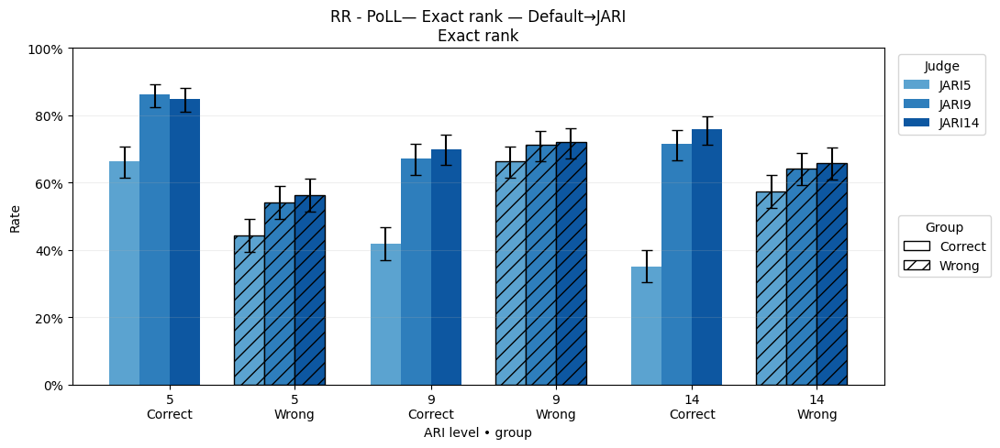

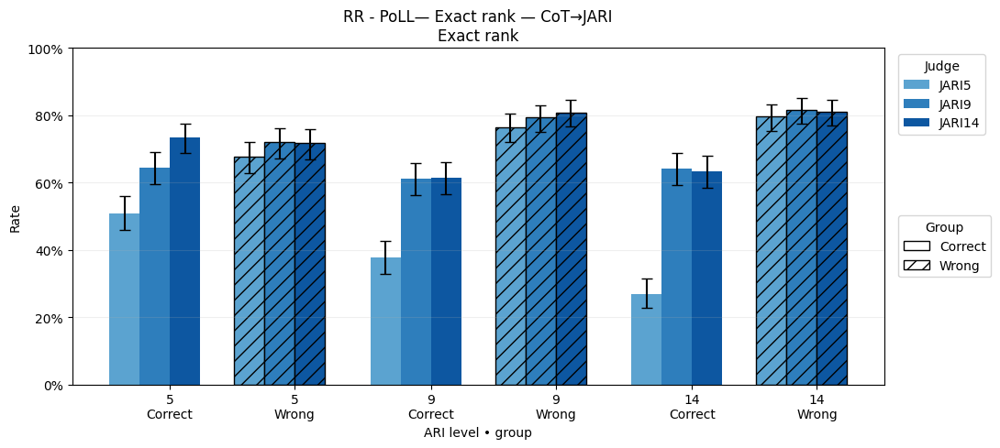

In [66]:
# Assuming you’ve already built the RR (or CR) listwise DFs:
frames_poll = [("JARI5",  poll_rr5_ranks ), ("JARI9",  poll_rr9_ranks ), ("JARI14", poll_rr14_ranks )]
frames_poll_cot = [("JARI5", poll_rr5_cot_ranks), ("JARI9", poll_rr9_cot_ranks), ("JARI14", poll_rr14_cot_ranks)]


# Exact rank, Correct on the LEFT and Wrong on the RIGHT for each ARI:
plot_consolidated_ranks_groups_split(frames_poll, metric='rank_exact',
                                     title="RR - PoLL— Exact rank — Default→JARI")
# Exact rank, Correct on the LEFT and Wrong on the RIGHT for each ARI:
plot_consolidated_ranks_groups_split(frames_poll_cot, metric='rank_exact',
                                     title="RR - PoLL— Exact rank — CoT→JARI")

In [67]:
frames_poll 

[('JARI5',
      model              exp_name mode            metric    group  ARI    k  \
  0   LLama  LLama-JARI5-baseline   RR  rank_bin_overall  Correct    5  358   
  1   LLama  LLama-JARI5-baseline   RR        rank_exact  Correct    5  259   
  2   LLama  LLama-JARI5-baseline   RR  rank_bin_overall  Correct    9  333   
  3   LLama  LLama-JARI5-baseline   RR        rank_exact  Correct    9  163   
  4   LLama  LLama-JARI5-baseline   RR  rank_bin_overall  Correct   14  257   
  5   LLama  LLama-JARI5-baseline   RR        rank_exact  Correct   14  137   
  6   LLama  LLama-JARI5-baseline   RR  rank_bin_overall    Wrong    5  372   
  7   LLama  LLama-JARI5-baseline   RR        rank_exact    Wrong    5  173   
  8   LLama  LLama-JARI5-baseline   RR  rank_bin_overall    Wrong    9  388   
  9   LLama  LLama-JARI5-baseline   RR        rank_exact    Wrong    9  259   
  10  LLama  LLama-JARI5-baseline   RR  rank_bin_overall    Wrong   14  389   
  11  LLama  LLama-JARI5-baseline   RR   

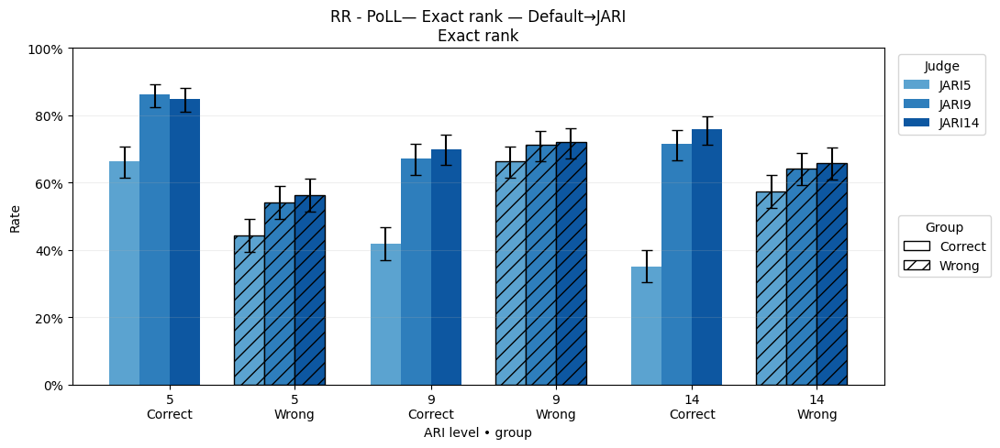

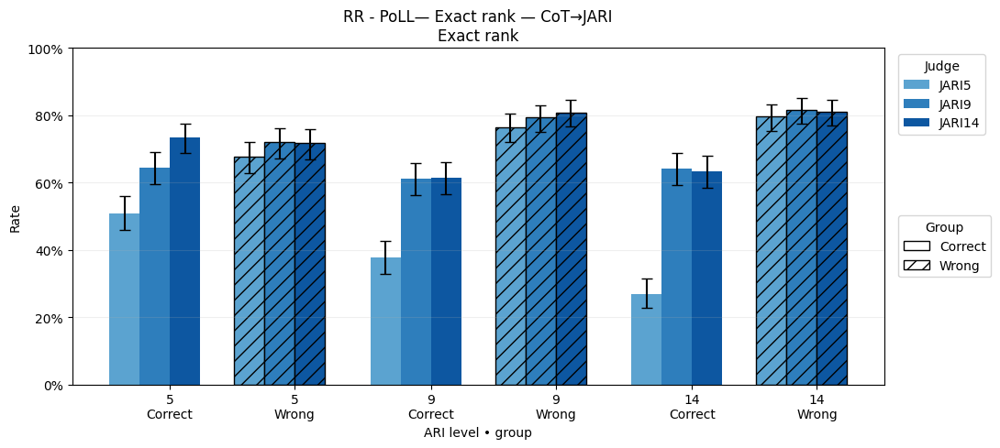

In [68]:
# Assuming you’ve already built the RR (or CR) listwise DFs:
poll_frames = [("JARI5",  poll_rr5_ranks ), ("JARI9",  poll_rr9_ranks ), ("JARI14", poll_rr14_ranks )]
poll_frames_cot = [("JARI5", poll_rr5_cot_ranks), ("JARI9", poll_rr9_cot_ranks), ("JARI14", poll_rr14_cot_ranks)]


# Exact rank, Correct on the LEFT and Wrong on the RIGHT for each ARI:
plot_consolidated_ranks_groups_split(poll_frames, metric='rank_exact',
                                     title="RR - PoLL— Exact rank — Default→JARI")
# Exact rank, Correct on the LEFT and Wrong on the RIGHT for each ARI:
plot_consolidated_ranks_groups_split(poll_frames_cot, metric='rank_exact',
                                     title="RR - PoLL— Exact rank — CoT→JARI")

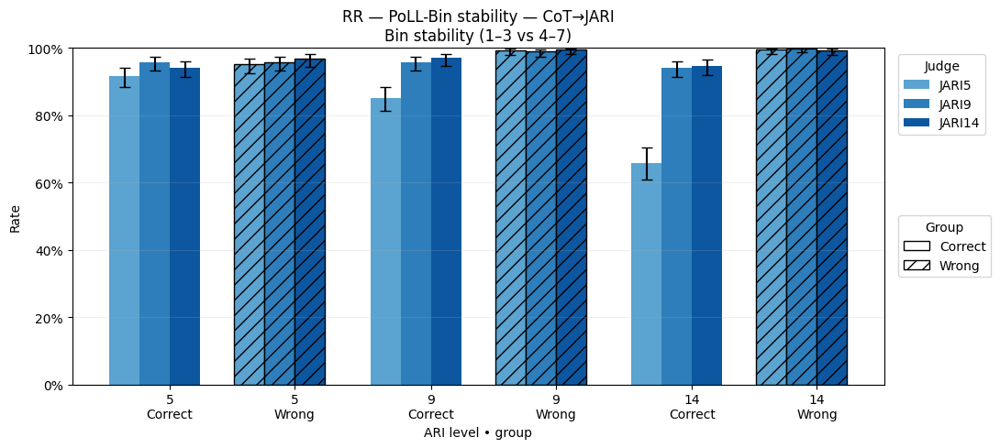

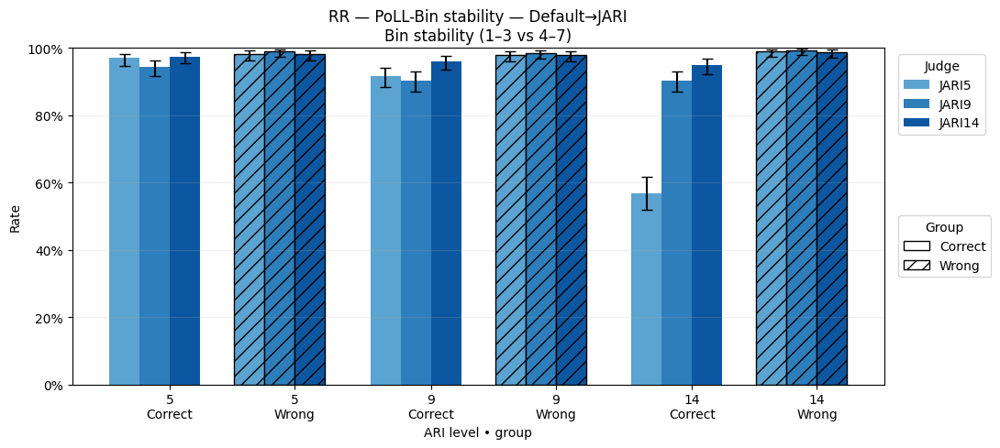

In [69]:
# Overall bin stability with the same left/right layout:
plot_consolidated_ranks_groups_split(poll_frames, metric='rank_bin_overall',
                                     title="RR — PoLL-Bin stability — CoT→JARI")
# Overall bin stability with the same left/right layout:
plot_consolidated_ranks_groups_split(poll_frames_cot, metric='rank_bin_overall',
                                     title="RR — PoLL-Bin stability — Default→JARI")



In [71]:
df_mistral_cot_score  = pd.read_csv("../resultFiles/Mistral/Default/Score/mistral_judge_score_cot.csv",  index_col=0)
df_qwen_cot_score  = pd.read_csv("../resultFiles/Qwen/Default/Score/qwen32_score_cot.csv",  index_col=0)
df_gpt3_cot_score = pd.read_csv("../resultFiles/GPT3/Default/Score/gpt3_judge_score_cot.csv", index_col=0)


cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_cot_score = compute_poll_scores_mean(
    df_mistral_cot_score, df_qwen_cot_score, df_gpt3_cot_score,
    score_columns=cols
)
poll_cot_score.head()

,Score_Ref_Answer,Score_ARI_5,Score_ARI_9,Score_ARI_14,Score_Wrong_Answer_ARI_5,Score_Wrong_Answer_ARI_9,Score_Wrong_Answer_ARI_14
0,8.0,8.0,8.0,9.0,8.0,3.0,8.0
1,5.0,7.0,8.0,8.0,3.0,2.0,3.0
2,7.0,7.0,8.0,9.0,3.0,2.0,5.0
3,7.0,7.0,8.0,9.0,2.0,2.0,2.0
4,7.0,7.0,8.0,9.0,3.0,2.0,2.0


In [70]:
df_jari5_mistral_score  = pd.read_csv("../resultFiles/Mistral/Jari/Score/mistral_jari5_score_baseline1.csv",  index_col=0)
df_jari5_qwen_score  = pd.read_csv("../resultFiles/Qwen/Jari/Score/qwen_jari5_score_baseline1.csv",  index_col=0)
df_jari5_gpt3_score = pd.read_csv("../resultFiles/GPT3/Jari/Score/gpt3_jari5_score_baseline1.csv", index_col=0)

cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_jari5_baseline_score = compute_poll_scores_mean(
    df_jari5_mistral_score, df_jari5_qwen_score, df_jari5_gpt3_score,
    score_columns=cols
)
poll_jari5_baseline_score.head()

,Score_Ref_Answer,Score_ARI_5,Score_ARI_9,Score_ARI_14,Score_Wrong_Answer_ARI_5,Score_Wrong_Answer_ARI_9,Score_Wrong_Answer_ARI_14
0,8.0,8.0,8.0,6.0,7.0,4.0,6.0
1,7.0,8.0,8.0,6.0,3.0,3.0,5.0
2,7.0,8.0,8.0,6.0,3.0,2.0,4.0
3,8.0,7.0,8.0,6.0,2.0,2.0,1.0
4,8.0,7.0,7.0,6.0,3.0,2.0,2.0


In [72]:
df_jari5_mistral_cot_score  = pd.read_csv("../resultFiles/Mistral/Jari/Score/mistral_jari5_score_cot.csv",  index_col=0)
df_jari5_qwen_cot_score  = pd.read_csv("../resultFiles/Qwen/Jari/Score/qwen_jari5_score_cot.csv",  index_col=0)
df_jari5_gpt3_cot_score = pd.read_csv("../resultFiles/GPT3/Jari/Score/gpt3_jari5_score_cot.csv", index_col=0)

cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_jari5_cot_score = compute_poll_scores_mean(
    df_jari5_mistral_cot_score, df_jari5_qwen_cot_score, df_jari5_gpt3_cot_score,
    score_columns=cols
)
poll_jari5_cot_score.head()

,Score_Ref_Answer,Score_ARI_5,Score_ARI_9,Score_ARI_14,Score_Wrong_Answer_ARI_5,Score_Wrong_Answer_ARI_9,Score_Wrong_Answer_ARI_14
0,5.0,8.0,5.0,6.0,7.0,3.0,4.0
1,6.0,5.0,8.0,7.0,3.0,3.0,3.0
2,6.0,7.0,5.0,6.0,3.0,2.0,4.0
3,7.0,8.0,8.0,7.0,2.0,2.0,2.0
4,7.0,7.0,5.0,4.0,3.0,2.0,1.0


In [73]:
df_jari9_mistral_score  = pd.read_csv("../resultFiles/Mistral/Jari/Score/mistral_jari9_score_baseline1.csv",  index_col=0)
df_jari9_qwen_score  = pd.read_csv("../resultFiles/Qwen/Jari/Score/qwen_jari9_score_baseline1.csv",  index_col=0)
df_jari9_gpt3_score = pd.read_csv("../resultFiles/GPT3/Jari/Score/gpt3_jari9_score_baseline1.csv", index_col=0)

cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_jari9_baseline_score = compute_poll_scores_mean(
    df_jari9_mistral_score, df_jari9_qwen_score, df_jari9_gpt3_score,
    score_columns=cols
)
poll_jari9_baseline_score.head()

,Score_Ref_Answer,Score_ARI_5,Score_ARI_9,Score_ARI_14,Score_Wrong_Answer_ARI_5,Score_Wrong_Answer_ARI_9,Score_Wrong_Answer_ARI_14
0,8.0,8.0,8.0,9.0,7.0,4.0,8.0
1,7.0,8.0,8.0,8.0,3.0,3.0,5.0
2,8.0,7.0,8.0,8.0,3.0,2.0,5.0
3,8.0,7.0,8.0,9.0,2.0,2.0,3.0
4,7.0,7.0,8.0,8.0,3.0,3.0,3.0


In [74]:
df_jari9_mistral_cot_score  = pd.read_csv("../resultFiles/Mistral/Jari/Score/mistral_jari9_score_cot.csv",  index_col=0)
df_jari9_qwen_cot_score  = pd.read_csv("../resultFiles/Qwen/Jari/Score/qwen_jari9_score_cot.csv",  index_col=0)
df_jari9_gpt3_cot_score = pd.read_csv("../resultFiles/GPT3/Jari/Score/gpt3_jari9_score_cot.csv", index_col=0)

cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_jari9_cot_score = compute_poll_scores_mean(
    df_jari9_mistral_cot_score, df_jari9_qwen_cot_score, df_jari9_gpt3_cot_score,
    score_columns=cols
)
poll_jari9_cot_score.head()

,Score_Ref_Answer,Score_ARI_5,Score_ARI_9,Score_ARI_14,Score_Wrong_Answer_ARI_5,Score_Wrong_Answer_ARI_9,Score_Wrong_Answer_ARI_14
0,8.0,7.0,6.0,6.0,7.0,3.0,5.0
1,6.0,5.0,7.0,5.0,3.0,3.0,5.0
2,6.0,7.0,8.0,6.0,3.0,2.0,5.0
3,7.0,6.0,8.0,6.0,2.0,2.0,2.0
4,4.0,4.0,8.0,6.0,3.0,2.0,2.0


In [75]:
df_jari14_mistral_score  = pd.read_csv("../resultFiles/Mistral/Jari/Score/mistral_jari14_score_baseline1.csv",  index_col=0)
df_jari14_qwen_score  = pd.read_csv("../resultFiles/Qwen/Jari/Score/qwen_jari14_score_baseline1.csv",  index_col=0)
df_jari14_gpt3_score = pd.read_csv("../resultFiles/GPT3/Jari/Score/gpt3_jari14_score_baseline1.csv", index_col=0)

cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_jari14_baseline_score = compute_poll_scores_mean(
    df_jari14_mistral_score, df_jari14_qwen_score, df_jari14_gpt3_score,
    score_columns=cols
)
poll_jari14_baseline_score.head()

,Score_Ref_Answer,Score_ARI_5,Score_ARI_9,Score_ARI_14,Score_Wrong_Answer_ARI_5,Score_Wrong_Answer_ARI_9,Score_Wrong_Answer_ARI_14
0,8.0,8.0,8.0,9.0,7.0,5.0,7.0
1,7.0,7.0,8.0,9.0,3.0,2.0,5.0
2,8.0,6.0,8.0,9.0,2.0,2.0,5.0
3,8.0,6.0,8.0,9.0,2.0,2.0,2.0
4,8.0,7.0,8.0,9.0,3.0,2.0,2.0


In [76]:
df_jari14_mistral_cot_score  = pd.read_csv("../resultFiles/Mistral/Jari/Score/mistral_jari14_score_cot.csv",  index_col=0)
df_jari14_qwen_cot_score  = pd.read_csv("../resultFiles/Qwen/Jari/Score/qwen_jari14_score_cot.csv",  index_col=0)
df_jari14_gpt3_cot_score = pd.read_csv("../resultFiles/GPT3/Jari/Score/gpt3_jari14_score_cot.csv", index_col=0)

cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_jari14_cot_score = compute_poll_scores_mean(
    df_jari14_mistral_cot_score, df_jari14_qwen_cot_score, df_jari14_gpt3_cot_score,
    score_columns=cols
)
poll_jari14_cot_score.head()

,Score_Ref_Answer,Score_ARI_5,Score_ARI_9,Score_ARI_14,Score_Wrong_Answer_ARI_5,Score_Wrong_Answer_ARI_9,Score_Wrong_Answer_ARI_14
0,8.0,8.0,8.0,9.0,5.0,3.0,5.0
1,6.0,7.0,5.0,9.0,3.0,2.0,5.0
2,6.0,6.0,8.0,6.0,2.0,2.0,5.0
3,7.0,5.0,8.0,9.0,1.0,2.0,2.0
4,7.0,4.0,8.0,9.0,3.0,2.0,2.0


In [77]:
MODEL

'POLL'

In [78]:
RR_SCORE= poll_baseline_score
RR5_SCORE_PERT = poll_jari5_baseline_score
RR9_SCORE_PERT = poll_jari9_baseline_score
RR14_SCORE_PERT = poll_jari14_baseline_score
rr5_scores = rr_pointwise_df(MODEL, "PoLL-JARI5-Baseline", RR_SCORE, RR5_SCORE_PERT, eps=1.0)
rr9_scores = rr_pointwise_df(MODEL, "PoLL-JARI9-Baseline", RR_SCORE, RR9_SCORE_PERT, eps=1.0)
rr14_scores = rr_pointwise_df(MODEL, "PoLL-JARI14-Baseline", RR_SCORE, RR14_SCORE_PERT, eps=1.0)


[0. 0. 1. 0. 0. 0. 0. 0. 1. 1. 0. 0. 1. 1. 1. 0. 0. 1. 1. 1. 0. 0. 0. 0.
 0. 1. 1. 0. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 0. 1. 0. 1. 1. 0. 0. 1. 1. 1.
 1. 1. 1. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 1. 2. 0. 0. 0. 0. 0. 1. 1. 1. 1.
 0. 1. 0. 0. 1. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.
 0. 1. 0. 0. 1. 0. 0. 1. 0. 1. 0. 1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 3. 0. 1. 0. 0. 1.
 0. 0. 1. 1. 1. 0. 1. 1. 0. 0. 1. 1. 0. 1. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0.
 1. 1. 0. 1. 0. 1. 0. 1. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.
 0. 0. 0. 0. 1. 0. 3. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0.
 0. 0. 0. 1. 1. 0. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 1. 1. 0. 1.
 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 1. 1. 1. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 0. 0. 0. 1.

In [79]:
RR_SCORE_COT = poll_cot_score

RR5_SCORE_COT_PERT = poll_jari5_cot_score
RR9_SCORE_COT_PERT = poll_jari9_cot_score
RR14_SCORE_COT_PERT = poll_jari14_cot_score

rr5_cot_scores = rr_pointwise_df(MODEL, "PoLL-JARI5-CoT", RR_SCORE_COT, RR5_SCORE_COT_PERT, eps=1.0)
rr9_cot_scores = rr_pointwise_df(MODEL, "PoLL-JARI5-CoT", RR_SCORE_COT, RR9_SCORE_COT_PERT, eps=1.0)
rr14_cot_scores = rr_pointwise_df(MODEL, "PoLL-JARI5-CoT", RR_SCORE_COT, RR14_SCORE_COT_PERT, eps=1.0)


[0. 2. 0. 1. 0. 1. 3. 0. 2. 3. 1. 2. 1. 3. 0. 1. 0. 0. 1. 1. 4. 3. 3. 0.
 3. 0. 2. 0. 1. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0. 2. 3. 2. 2. 1. 1. 3. 3. 1.
 1. 0. 2. 3. 0. 1. 1. 3. 0. 3. 3. 0. 1. 0. 1. 1. 2. 2. 2. 0. 1. 0. 0. 0.
 2. 2. 3. 2. 1. 2. 0. 3. 1. 2. 0. 1. 2. 1. 1. 1. 3. 1. 1. 3. 0. 3. 0. 2.
 2. 3. 0. 2. 1. 1. 0. 2. 3. 2. 1. 4. 1. 1. 3. 3. 2. 2. 0. 1. 2. 2. 0. 0.
 3. 0. 1. 3. 0. 0. 1. 1. 1. 1. 1. 3. 1. 0. 2. 3. 3. 2. 0. 0. 2. 3. 0. 0.
 1. 1. 2. 0. 1. 3. 0. 0. 2. 3. 1. 3. 1. 2. 0. 0. 3. 2. 0. 0. 2. 0. 2. 0.
 3. 1. 1. 2. 3. 2. 1. 3. 1. 1. 2. 1. 0. 2. 1. 3. 1. 0. 2. 0. 3. 0. 3. 0.
 1. 2. 0. 2. 2. 3. 1. 1. 3. 2. 0. 3. 2. 0. 3. 1. 0. 3. 2. 0. 0. 0. 1. 0.
 3. 1. 1. 1. 3. 1. 1. 1. 0. 3. 0. 0. 0. 0. 2. 0. 1. 4. 1. 2. 2. 0. 1. 2.
 2. 2. 2. 2. 3. 2. 0. 2. 2. 0. 3. 0. 0. 2. 1. 0. 2. 3. 2. 0. 1. 0. 0. 2.
 2. 2. 0. 0. 1. 3. 1. 0. 2. 2. 2. 1. 1. 0. 3. 0. 2. 1. 0. 0. 0. 2. 3. 0.
 1. 2. 3. 1. 1. 0. 2. 3. 0. 2. 3. 1. 0. 1. 1. 0. 1. 3. 1. 2. 1. 0. 2. 2.
 1. 0. 1. 1. 3. 1. 1. 0. 3. 0. 0. 1. 3. 2. 0. 3. 1.

In [80]:
jari_frames_score_poll = [("JARI5", rr5_scores),
                 ("JARI9", rr9_scores),
                 ("JARI14", rr14_scores)]
jari_frames_score_cot_poll = [("JARI5", rr5_cot_scores),
                 ("JARI9", rr9_cot_scores),
                 ("JARI14", rr14_cot_scores)]

In [81]:
jari_frames_score_poll

[('JARI5',
     model             exp_name mode       metric    group  ARI    k    n  \
  0   POLL  PoLL-JARI5-Baseline   RR  score_exact  Correct    5  256  391   
  1   POLL  PoLL-JARI5-Baseline   RR   score_eps1  Correct    5  387  391   
  2   POLL  PoLL-JARI5-Baseline   RR  score_exact  Correct    9  171  391   
  3   POLL  PoLL-JARI5-Baseline   RR   score_eps1  Correct    9  371  391   
  4   POLL  PoLL-JARI5-Baseline   RR  score_exact  Correct   14    2  391   
  5   POLL  PoLL-JARI5-Baseline   RR   score_eps1  Correct   14    7  391   
  6   POLL  PoLL-JARI5-Baseline   RR  score_exact    Wrong    5  221  391   
  7   POLL  PoLL-JARI5-Baseline   RR   score_eps1    Wrong    5  385  391   
  8   POLL  PoLL-JARI5-Baseline   RR  score_exact    Wrong    9  217  391   
  9   POLL  PoLL-JARI5-Baseline   RR   score_eps1    Wrong    9  378  391   
  10  POLL  PoLL-JARI5-Baseline   RR  score_exact    Wrong   14  126  391   
  11  POLL  PoLL-JARI5-Baseline   RR   score_eps1    Wrong   14  

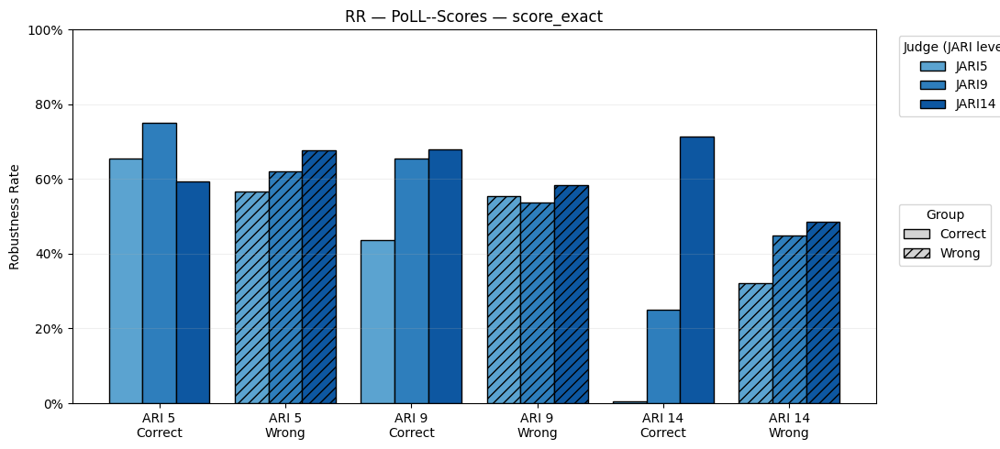

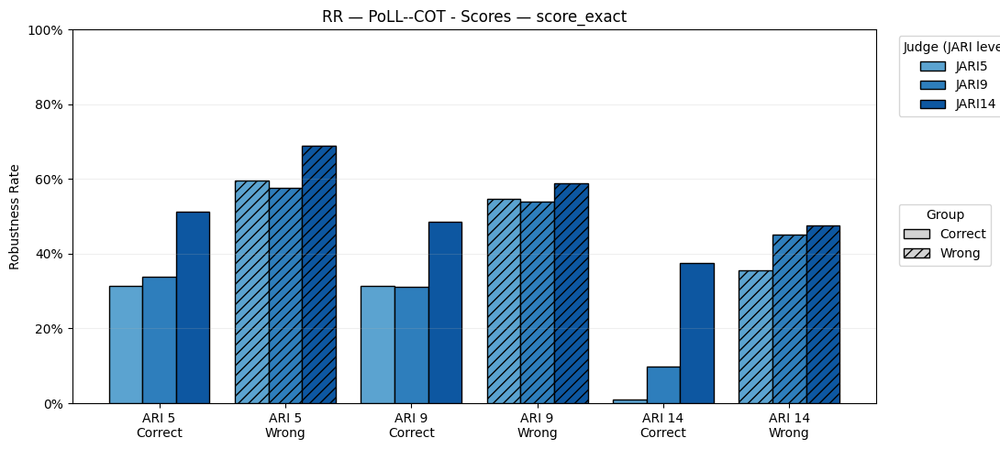

In [82]:
# Exact match plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_scores),
                 ("JARI9", rr9_scores),
                 ("JARI14", rr14_scores)],
    metric="score_exact",
    title_prefix="RR — PoLL--Scores"
)

# Exact match plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_cot_scores),
                 ("JARI9", rr9_cot_scores),
                 ("JARI14", rr14_cot_scores)],
    metric="score_exact",
    title_prefix="RR — PoLL--COT - Scores"
)

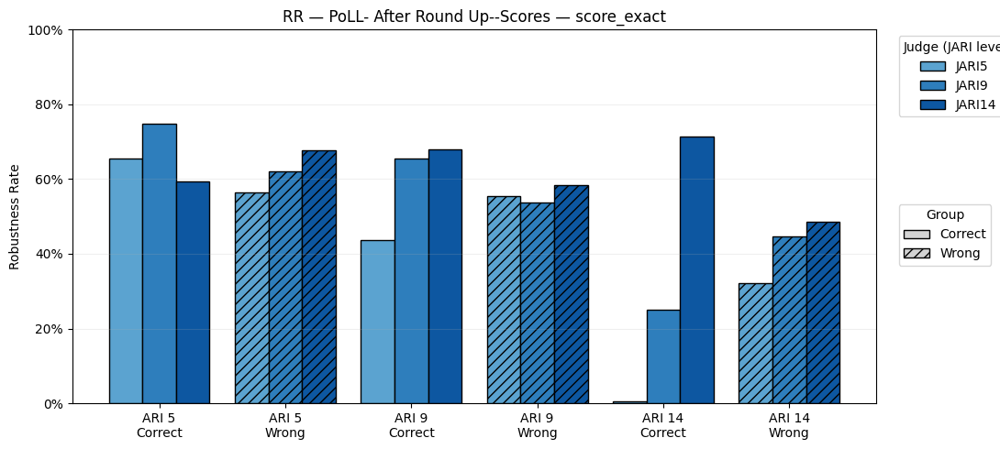

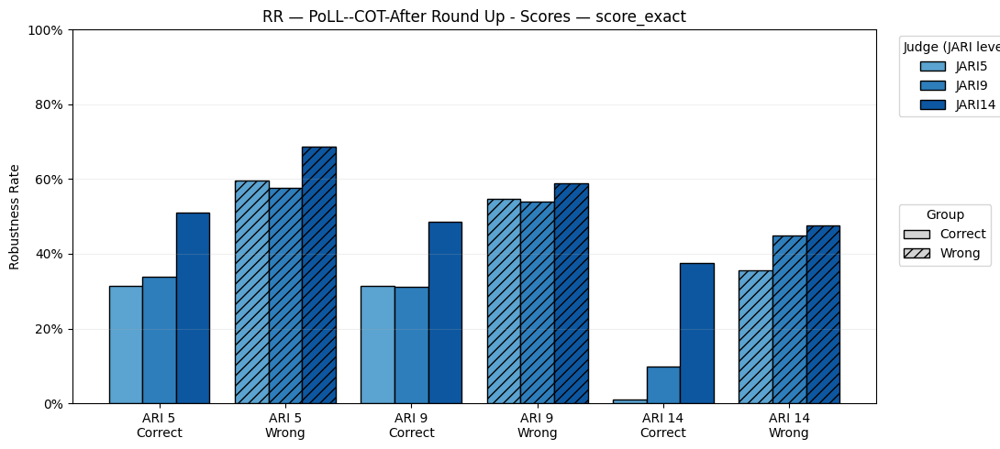

In [83]:
# Exact match plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_scores),
                 ("JARI9", rr9_scores),
                 ("JARI14", rr14_scores)],
    metric="score_exact",
    title_prefix="RR — PoLL- After Round Up--Scores"
)

# Exact match plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_cot_scores),
                 ("JARI9", rr9_cot_scores),
                 ("JARI14", rr14_cot_scores)],
    metric="score_exact",
    title_prefix="RR — PoLL--COT-After Round Up - Scores"
)

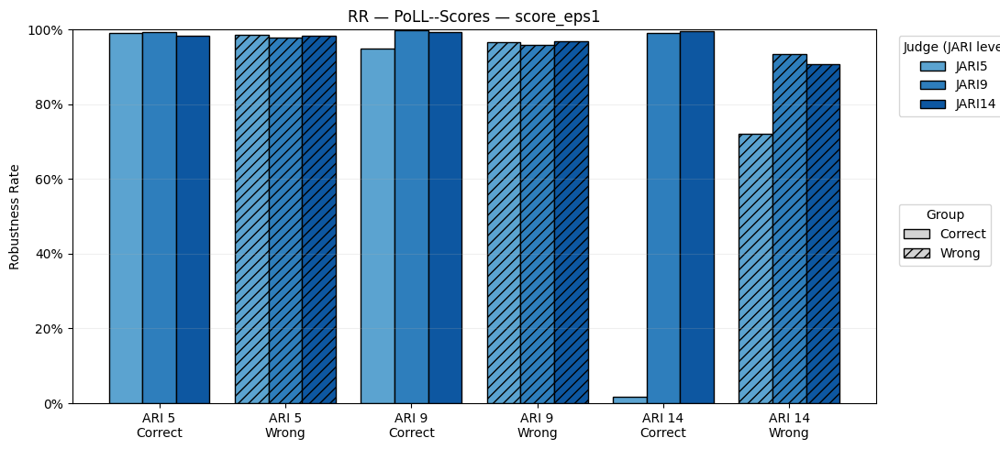

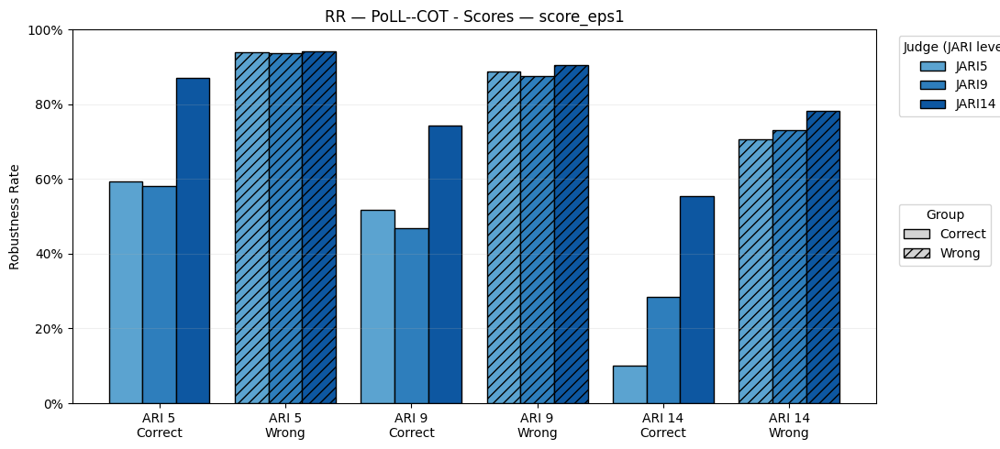

In [84]:
# ±1 tolerance plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_scores),
                 ("JARI9", rr9_scores),
                 ("JARI14", rr14_scores)],
    metric="score_eps1",
    title_prefix="RR — PoLL--Scores"
)
# ±1 tolerance plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_cot_scores),
                 ("JARI9", rr9_cot_scores),
                 ("JARI14", rr14_cot_scores)],
    metric="score_eps1",
    title_prefix="RR — PoLL--COT - Scores"
)

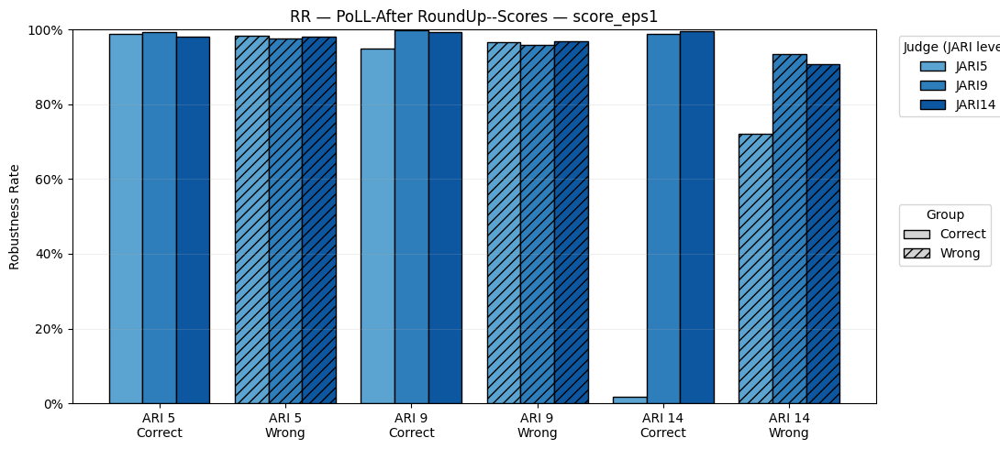

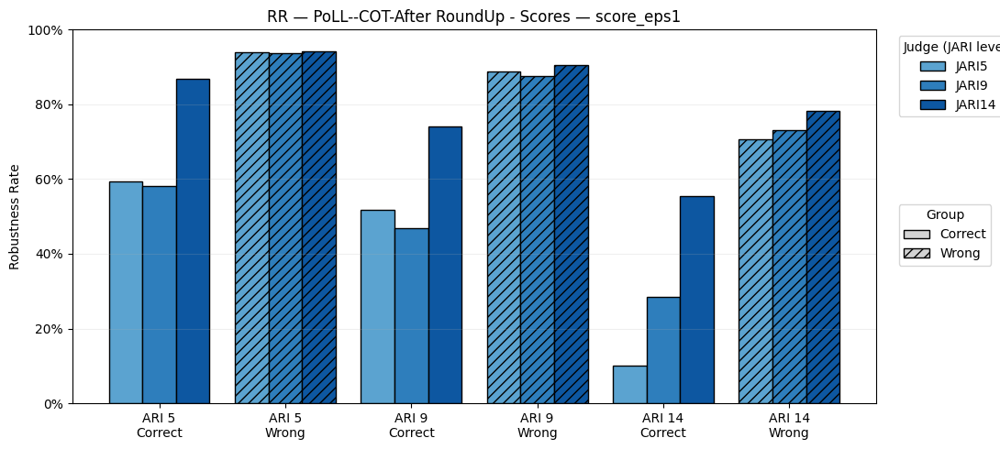

In [85]:
# ±1 tolerance plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_scores),
                 ("JARI9", rr9_scores),
                 ("JARI14", rr14_scores)],
    metric="score_eps1",
    title_prefix="RR — PoLL-After RoundUp--Scores"
)
# ±1 tolerance plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_cot_scores),
                 ("JARI9", rr9_cot_scores),
                 ("JARI14", rr14_cot_scores)],
    metric="score_eps1",
    title_prefix="RR — PoLL--COT-After RoundUp - Scores"
)

In [86]:
if __name__ == "__main__":
    MODEL = "Mistral"
    OUT_DIR = "./results"
# mistral
    # -------- RR (Default → JARI5) --------
    RR5_SCORE_BASE = df_mistral_score
    RR5_SCORE_PERT = df_jari5_mistral_score
    # RR_RANK_BASE  = df_gpt3
    # RR_RANK_COT  = df_gpt3_cot

    # RR5_RANK_PERT  = df_jari5_gpt3
    RR9_SCORE_PERT = df_jari9_mistral_score
    # RR9_RANK_PERT  = df_jari9_gpt3

    RR14_SCORE_PERT = df_jari14_mistral_score
    # RR14_RANK_PERT  = df_jari14_gpt3_score

    mistral_rr5_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI5-baseline", RR5_SCORE_BASE, RR5_SCORE_PERT, eps=1.0)
    # rr5_ranks  = rr_listwise_df (MODEL, "GPT3-JARI5-baseline", RR5_RANK_BASE,  RR5_RANK_PERT)
    mistral_rr9_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI9-baseline", RR5_SCORE_BASE, RR9_SCORE_PERT, eps=1.0)
    # rr9_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI9-baseline", RR5_RANK_BASE,  RR9_RANK_PERT)
    mistral_rr14_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI14-baseline", RR5_SCORE_BASE, RR14_SCORE_PERT, eps=1.0)
    # rr14_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI14-baseline", RR5_RANK_BASE,  RR14_RANK_PERT)

    # RR5_RANK_COT_PERT = df_jari5_cot_gpt3
    # RR9_RANK_COT_PERT=df_jari9_cot_gpt3
    # RR14_RANK_COT_PERT =df_jari14_cot_gpt3
    

    # gpt3_rr5_cot_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI5-CoT", RR_RANK_COT, RR5_RANK_COT_PERT)
    # gpt3_rr9_cot_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI9-CoT", RR_RANK_COT, RR9_RANK_COT_PERT)
    # gpt3_rr14_cot_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI14-CoT", RR_RANK_COT, RR14_RANK_COT_PERT)

    # gpt3_rr5_ranks  = rr_listwise_df(MODEL, f"{MODEL}-JARI5-baseline", RR5_RANK_BASE, RR5_RANK_PERT)
    # gpt3_rr9_ranks  = rr_listwise_df(MODEL, f"{MODEL}-JARI9-baseline", RR5_RANK_BASE, RR9_RANK_PERT)
    # gpt3_rr14_ranks = rr_listwise_df(MODEL, f"{MODEL}-JARI14-baseline", RR5_RANK_BASE, RR14_RANK_PERT)

    RR_SCORE_COT = df_mistral_cot_score

    RR5_SCORE_COT_PERT = df_jari5_mistral_cot_score
    RR9_SCORE_COT_PERT = df_jari9_mistral_cot_score
    RR14_SCORE_COT_PERT = df_jari14_mistral_cot_score

    mistral_rr5_cot_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI5-CoT", RR_SCORE_COT, RR5_SCORE_COT_PERT, eps=1.0)
    mistral_rr9_cot_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI5-CoT", RR_SCORE_COT, RR9_SCORE_COT_PERT, eps=1.0)
    mistral_rr14_cot_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI5-CoT", RR_SCORE_COT, RR14_SCORE_COT_PERT, eps=1.0)

[1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 0.
 0. 0. 1. 1. 1. 0. 1. 0. 0. 0. 1. 2. 1. 0. 0. 0. 1. 0. 0. 0. 1. 1. 1. 0.
 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 1. 0. 0. 1. 1. 0. 0. 1. 1. 2. 0. 0. 0. 0.
 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.
 1. 0. 0. 1. 1. 1. 0. 1. 0. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1. 0. 0. 0. 1. 0.
 1. 0. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0.
 0. 2. 1. 0. 1. 0. 0. 0. 0. 1. 1. 1. 0. 0. 1. 1. 1. 0. 0. 1. 0. 1. 0. 0.
 1. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 1. 0. 1. 0. 0. 1. 0. 0.
 1. 1. 0. 0. 0. 1. 0. 0. 1. 0. 1. 2. 1. 0. 0. 0. 0. 1. 0. 1. 0. 0. 1. 0.
 2. 0. 1. 0. 0. 0. 1. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1.
 1. 0. 2. 1. 0. 1. 0. 0. 0. 1. 1. 1. 0. 1. 0. 2. 1. 0. 1. 0. 1. 0. 0. 0.
 1. 2. 0. 0. 0. 1. 0. 1. 0. 0. 1. 1. 0. 0. 1. 1. 0. 0. 0. 1. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 0. 1. 0. 1. 1. 0. 1. 1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 1. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 2. 1.

In [87]:
if __name__ == "__main__":
    MODEL = "Qwen"
    OUT_DIR = "./results"
# qwen
    # -------- RR (Default → JARI5) --------
    RR5_SCORE_BASE = df_qwen_score
    RR5_SCORE_PERT = df_jari5_qwen_score
    # RR_RANK_BASE  = df_gpt3
    # RR_RANK_COT  = df_gpt3_cot

    # RR5_RANK_PERT  = df_jari5_gpt3
    RR9_SCORE_PERT = df_jari9_qwen_score
    # RR9_RANK_PERT  = df_jari9_gpt3

    RR14_SCORE_PERT = df_jari14_qwen_score
    # RR14_RANK_PERT  = df_jari14_gpt3_score

    qwen_rr5_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI5-baseline", RR5_SCORE_BASE, RR5_SCORE_PERT, eps=1.0)
    # rr5_ranks  = rr_listwise_df (MODEL, "GPT3-JARI5-baseline", RR5_RANK_BASE,  RR5_RANK_PERT)
    qwen_rr9_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI9-baseline", RR5_SCORE_BASE, RR9_SCORE_PERT, eps=1.0)
    # rr9_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI9-baseline", RR5_RANK_BASE,  RR9_RANK_PERT)
    qwen_rr14_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI14-baseline", RR5_SCORE_BASE, RR14_SCORE_PERT, eps=1.0)
    # rr14_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI14-baseline", RR5_RANK_BASE,  RR14_RANK_PERT)

    # RR5_RANK_COT_PERT = df_jari5_cot_gpt3
    # RR9_RANK_COT_PERT=df_jari9_cot_gpt3
    # RR14_RANK_COT_PERT =df_jari14_cot_gpt3
    

    # gpt3_rr5_cot_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI5-CoT", RR_RANK_COT, RR5_RANK_COT_PERT)
    # gpt3_rr9_cot_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI9-CoT", RR_RANK_COT, RR9_RANK_COT_PERT)
    # gpt3_rr14_cot_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI14-CoT", RR_RANK_COT, RR14_RANK_COT_PERT)

    # gpt3_rr5_ranks  = rr_listwise_df(MODEL, f"{MODEL}-JARI5-baseline", RR5_RANK_BASE, RR5_RANK_PERT)
    # gpt3_rr9_ranks  = rr_listwise_df(MODEL, f"{MODEL}-JARI9-baseline", RR5_RANK_BASE, RR9_RANK_PERT)
    # gpt3_rr14_ranks = rr_listwise_df(MODEL, f"{MODEL}-JARI14-baseline", RR5_RANK_BASE, RR14_RANK_PERT)

    RR_SCORE_COT = df_qwen_cot_score

    RR5_SCORE_COT_PERT = df_jari5_qwen_cot_score
    RR9_SCORE_COT_PERT = df_jari9_qwen_cot_score
    RR14_SCORE_COT_PERT = df_jari14_qwen_cot_score

    qwen_rr5_cot_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI5-CoT", RR_SCORE_COT, RR5_SCORE_COT_PERT, eps=1.0)
    qwen_rr9_cot_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI5-CoT", RR_SCORE_COT, RR9_SCORE_COT_PERT, eps=1.0)
    qwen_rr14_cot_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI5-CoT", RR_SCORE_COT, RR14_SCORE_COT_PERT, eps=1.0)

[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 2. 0. 0. 0. 1. 0.
 0. 1. 1. 1. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 2. 0. 0. 1. 1. 0. 1. 1. 0. 1.
 1. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 1. 0. 1. 0. 1. 0. 1. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0. 8. 0. 0. 0. 0. 1.
 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 1. 0. 0. 1. 1. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 8. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0.
 1. 0. 0. 0. 1. 0. 0. 1. 0. 1. 1. 0. 0. 1. 0. 1. 1. 0. 0. 0. 1. 0. 1. 0.
 0. 0. 1. 0. 1. 1. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 1.
 1. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 1. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.
 1. 0. 0. 1. 1. 1. 1. 0. 1. 0. 1. 0. 0. 1. 1. 0. 0.

In [88]:
if __name__ == "__main__":
    MODEL = "GPT3"
    OUT_DIR = "./results"

    # -------- RR (Default → JARI5) --------
    RR5_SCORE_BASE = df_gpt3_score
    RR5_SCORE_PERT = df_jari5_gpt3_score
    # RR_RANK_BASE  = df_gpt3
    # RR_RANK_COT  = df_gpt3_cot

    # RR5_RANK_PERT  = df_jari5_gpt3
    RR9_SCORE_PERT = df_jari9_gpt3_score
    # RR9_RANK_PERT  = df_jari9_gpt3

    RR14_SCORE_PERT = df_jari14_gpt3_score
    # RR14_RANK_PERT  = df_jari14_gpt3_score

    gpt3_rr5_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI5-baseline", RR5_SCORE_BASE, RR5_SCORE_PERT, eps=1.0)
    # rr5_ranks  = rr_listwise_df (MODEL, "GPT3-JARI5-baseline", RR5_RANK_BASE,  RR5_RANK_PERT)
    gpt3_rr9_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI9-baseline", RR5_SCORE_BASE, RR9_SCORE_PERT, eps=1.0)
    # rr9_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI9-baseline", RR5_RANK_BASE,  RR9_RANK_PERT)
    gpt3_rr14_scores = rr_pointwise_df(MODEL, f"{MODEL}-JARI14-baseline", RR5_SCORE_BASE, RR14_SCORE_PERT, eps=1.0)
    # rr14_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI14-baseline", RR5_RANK_BASE,  RR14_RANK_PERT)

    # RR5_RANK_COT_PERT = df_jari5_cot_gpt3
    # RR9_RANK_COT_PERT=df_jari9_cot_gpt3
    # RR14_RANK_COT_PERT =df_jari14_cot_gpt3
    

    # gpt3_rr5_cot_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI5-CoT", RR_RANK_COT, RR5_RANK_COT_PERT)
    # gpt3_rr9_cot_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI9-CoT", RR_RANK_COT, RR9_RANK_COT_PERT)
    # gpt3_rr14_cot_ranks  = rr_listwise_df (MODEL, f"{MODEL}-JARI14-CoT", RR_RANK_COT, RR14_RANK_COT_PERT)

    # gpt3_rr5_ranks  = rr_listwise_df(MODEL, f"{MODEL}-JARI5-baseline", RR5_RANK_BASE, RR5_RANK_PERT)
    # gpt3_rr9_ranks  = rr_listwise_df(MODEL, f"{MODEL}-JARI9-baseline", RR5_RANK_BASE, RR9_RANK_PERT)
    # gpt3_rr14_ranks = rr_listwise_df(MODEL, f"{MODEL}-JARI14-baseline", RR5_RANK_BASE, RR14_RANK_PERT)

    RR_SCORE_COT = df_gpt3_cot_score

    RR5_SCORE_COT_PERT = df_jari5_gpt3_cot_score
    RR9_SCORE_COT_PERT = df_jari9_gpt3_cot_score
    RR14_SCORE_COT_PERT = df_jari14_gpt3_cot_score

    gpt3_rr5_cot_scores = rr_pointwise_df(MODEL, "GPT3-JARI5-CoT", RR_SCORE_COT, RR5_SCORE_COT_PERT, eps=1.0)
    gpt3_rr9_cot_scores = rr_pointwise_df(MODEL, "GPT3-JARI5-CoT", RR_SCORE_COT, RR9_SCORE_COT_PERT, eps=1.0)
    gpt3_rr14_cot_scores = rr_pointwise_df(MODEL, "GPT3-JARI5-CoT", RR_SCORE_COT, RR14_SCORE_COT_PERT, eps=1.0)

[0. 0. 1. 1. 0. 0. 1. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 1. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 1. 0. 2. 1. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 1. 0. 0. 1. 0. 1. 0. 1. 1. 0. 1. 2. 4. 1. 1. 0. 0. 0. 0. 0. 1. 1.
 0. 1. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 1. 2. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 2. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1.
 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 1. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0.
 0. 0. 0. 0. 3. 0. 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 1. 0. 2. 1. 1. 0. 1.
 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0.

In [89]:
frames_mistral_score = [("JARI5",   mistral_rr5_scores ), ("JARI9",  mistral_rr9_scores ), ("JARI14", mistral_rr14_scores)]
frames_mistral_cot_score = [("JARI5", mistral_rr5_cot_scores), ("JARI9", mistral_rr9_cot_scores), ("JARI14", mistral_rr14_cot_scores)]


In [90]:
# Assuming you’ve already built the RR (or CR) listwise DFs:
frames_qwen_score = [("JARI5",   qwen_rr5_scores), ("JARI9",  qwen_rr9_scores), ("JARI14", qwen_rr14_scores)]
frames_qwen_cot_score = [("JARI5", qwen_rr5_cot_scores), ("JARI9", qwen_rr9_cot_scores), ("JARI14", qwen_rr14_cot_scores)]

In [91]:
# Assuming you’ve already built the RR (or CR) listwise DFs:
frames_gpt3_score = [("JARI5",   gpt3_rr5_scores ), ("JARI9",  gpt3_rr9_scores ), ("JARI14", gpt3_rr14_scores )]
frames_gpt3_cot_score = [("JARI5", gpt3_rr5_cot_scores), ("JARI9", gpt3_rr9_cot_scores), ("JARI14", gpt3_rr14_cot_scores)]

In [92]:
frames_gpt3_score 

[('JARI5',
     model             exp_name mode       metric    group  ARI    k    n  \
  0   GPT3  GPT3-JARI5-baseline   RR  score_exact  Correct    5  287  391   
  1   GPT3  GPT3-JARI5-baseline   RR   score_eps1  Correct    5  379  391   
  2   GPT3  GPT3-JARI5-baseline   RR  score_exact  Correct    9  295  391   
  3   GPT3  GPT3-JARI5-baseline   RR   score_eps1  Correct    9  387  391   
  4   GPT3  GPT3-JARI5-baseline   RR  score_exact  Correct   14  187  391   
  5   GPT3  GPT3-JARI5-baseline   RR   score_eps1  Correct   14  387  391   
  6   GPT3  GPT3-JARI5-baseline   RR  score_exact    Wrong    5  236  391   
  7   GPT3  GPT3-JARI5-baseline   RR   score_eps1    Wrong    5  361  391   
  8   GPT3  GPT3-JARI5-baseline   RR  score_exact    Wrong    9  242  391   
  9   GPT3  GPT3-JARI5-baseline   RR   score_eps1    Wrong    9  344  391   
  10  GPT3  GPT3-JARI5-baseline   RR  score_exact    Wrong   14  241  391   
  11  GPT3  GPT3-JARI5-baseline   RR   score_eps1    Wrong   14  

In [93]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------------
# Pass/fail rule for "no practical effect"
# -------------------------------
def summarize_rr_badge(judge_frames, ari=(5,9,14),
                       thr_bin=0.95, thr_top1=0.90,
                       require_wrong=True, ci_guard=0.00):
    """
    judge_frames: list of (label, df), where df has rows like:
      metric ∈ {'rank_bin_overall','rank_top1', ...}
      group  ∈ {'Correct','Wrong','Both'}
      ARI    ∈ {5,9,14}
      k, n, rate, ci_low, ci_high

    thr_bin, thr_top1: pass thresholds
    require_wrong: if True, demand bin pass for BOTH Correct & Wrong;
                   if False, only Correct + Top1 must pass.
    ci_guard: optional margin to allow CI_low ≥ (threshold - ci_guard)
              (set 0.00 to require CI_low ≥ threshold)

    Returns:
      per_ari_df  : rows per (judge, ARI) with pass flags
      summary_df  : rows per judge with macro/micro averages and RPR
                    (Robustness Pass Rate = fraction of ARIs that pass_all)
    """

    recs = []
    for label, df in judge_frames:
        for a in ari:
            # helper to pull one cell
            def pull(metric, group):
                sub = df[(df['metric']==metric) & (df['group']==group) & (df['ARI']==a)]
                if len(sub) == 0:
                    return dict(k=0, n=0, rate=np.nan, ci_low=np.nan, ci_high=np.nan)
                row = sub.iloc[0]
                return dict(k=int(row['k']), n=int(row['n']),
                            rate=float(row['rate']),
                            ci_low=float(row['ci_low']),
                            ci_high=float(row['ci_high']))

            binC = pull('rank_bin_overall','Correct')
            binW = pull('rank_bin_overall','Wrong')
            top1 = pull('rank_top1','Both')

            # pass/fail checks with optional CI guard
            pass_binC = (binC['rate'] >= thr_bin) and (np.isnan(binC['ci_low']) or binC['ci_low'] >= thr_bin - ci_guard)
            pass_binW = (binW['rate'] >= thr_bin) and (np.isnan(binW['ci_low']) or binW['ci_low'] >= thr_bin - ci_guard)
            pass_top1 = (top1['rate'] >= thr_top1) and (np.isnan(top1['ci_low']) or top1['ci_low'] >= thr_top1 - ci_guard)

            pass_all = (pass_binC and pass_top1) if not require_wrong else (pass_binC and pass_binW and pass_top1)

            recs.append({
                'judge': label, 'ARI': a,
                # raw rates
                'rr_bin_correct': binC['rate'], 'k_bin_correct': binC['k'], 'n_bin_correct': binC['n'],
                'rr_bin_wrong'  : binW['rate'], 'k_bin_wrong'  : binW['k'], 'n_bin_wrong'  : binW['n'],
                'rr_top1'       : top1['rate'], 'k_top1'       : top1['k'], 'n_top1'       : top1['n'],
                # flags
                'pass_bin_correct': pass_binC,
                'pass_bin_wrong'  : pass_binW,
                'pass_top1'       : pass_top1,
                'pass_all'        : pass_all,
            })

    per_ari_df = pd.DataFrame(recs).sort_values(['judge','ARI']).reset_index(drop=True)

    # ---- judge-level aggregates ----
    grp = per_ari_df.groupby('judge', dropna=False)

    # micro (pooled k/n)
    micro = grp.agg({
        'k_bin_correct':'sum','n_bin_correct':'sum',
        'k_bin_wrong':'sum','n_bin_wrong':'sum',
        'k_top1':'sum','n_top1':'sum',
        'pass_all':'sum'
    })
    micro['micro_bin_correct'] = micro['k_bin_correct'] / micro['n_bin_correct'].replace({0:np.nan})
    micro['micro_bin_wrong']   = micro['k_bin_wrong']   / micro['n_bin_wrong'].replace({0:np.nan})
    micro['micro_top1']        = micro['k_top1']        / micro['n_top1'].replace({0:np.nan})
    micro = micro.rename(columns={'pass_all':'passes'})

    # macro (mean of ARIs)
    macro = grp.agg({
        'rr_bin_correct':'mean',
        'rr_bin_wrong':'mean',
        'rr_top1':'mean'
    }).rename(columns={
        'rr_bin_correct':'macro_bin_correct',
        'rr_bin_wrong':'macro_bin_wrong',
        'rr_top1':'macro_top1'
    })

    # Robustness Pass Rate (fraction of ARIs that pass_all)
    rpr = grp['pass_all'].mean().rename('RPR')

    summary_df = pd.concat([macro, micro[['micro_bin_correct','micro_bin_wrong','micro_top1','passes']], rpr], axis=1)
    summary_df['passes'] = summary_df['passes'].astype(int)   # out of len(ari)
    summary_df = summary_df.sort_values(['RPR','micro_bin_correct','micro_top1'], ascending=False)

    return per_ari_df, summary_df


# -------------------------------
# Optional: quick badge heatmap
# -------------------------------
def plot_rr_badge(per_ari_df, title="RR badge — no-effect rule (per ARI)"):
    """
    Visual 'badge' grid: green = pass_all, red = fail (per judge × ARI).
    """
    judges = list(per_ari_df['judge'].unique())
    aris   = sorted(per_ari_df['ARI'].unique())
    mat = np.zeros((len(judges), len(aris)), dtype=int)
    for i,j in enumerate(judges):
        for k,a in enumerate(aris):
            row = per_ari_df[(per_ari_df['judge']==j) & (per_ari_df['ARI']==a)]
            mat[i,k] = 1 if (len(row) and bool(row.iloc[0]['pass_all'])) else 0

    fig, ax = plt.subplots(figsize=(1.2*len(aris)+4, 0.6*len(judges)+2))
    im = ax.imshow(mat, cmap='RdYlGn', vmin=0, vmax=1)
    for i in range(len(judges)):
        for k in range(len(aris)):
            ax.text(k, i, "✓" if mat[i,k]==1 else "×", ha='center', va='center', fontsize=11, color='black')
    ax.set_xticks(np.arange(len(aris))); ax.set_xticklabels([str(a) for a in aris])
    ax.set_yticks(np.arange(len(judges))); ax.set_yticklabels(judges)
    ax.set_xlabel("ARI"); ax.set_title(title)
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04); cbar.set_ticks([0,1]); cbar.set_ticklabels(['Fail','Pass'])
    plt.tight_layout(); plt.show()


In [94]:
rr_base=[("JARI5", rr5_ranks), ("JARI9", rr9_ranks), ("JARI14", rr14_ranks)]
rr_cot = [("JARI5", rr5_cot_ranks), ("JARI9", rr9_cot_ranks), ("JARI14", rr14_cot_ranks)]



        macro_bin_correct  macro_bin_wrong  macro_top1  micro_bin_correct  \
judge                                                                       
JARI14           0.952259         0.984655         NaN           0.952259   
JARI9            0.951407         0.981245         NaN           0.951407   
JARI5            0.808184         0.979540         NaN           0.808184   

        micro_bin_wrong  micro_top1  passes  RPR  
judge                                             
JARI14         0.984655         NaN       0  0.0  
JARI9          0.981245         NaN       0  0.0  
JARI5          0.979540         NaN       0  0.0  


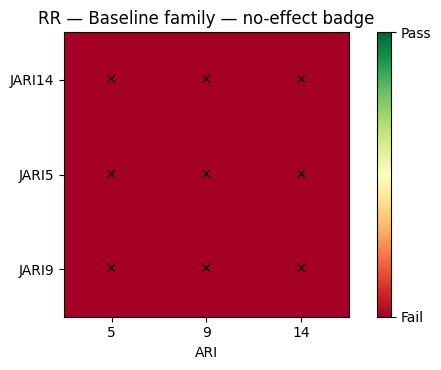

        macro_bin_correct  macro_bin_wrong  macro_top1  micro_bin_correct  \
judge                                                                       
JARI14           0.906559         0.962264         NaN           0.906559   
JARI9            0.895390         0.963652         NaN           0.895390   
JARI5            0.848958         0.985243         NaN           0.848958   

        micro_bin_wrong  micro_top1  passes  RPR  
judge                                             
JARI14         0.962264         NaN       0  0.0  
JARI9          0.963652         NaN       0  0.0  
JARI5          0.985243         NaN       0  0.0  


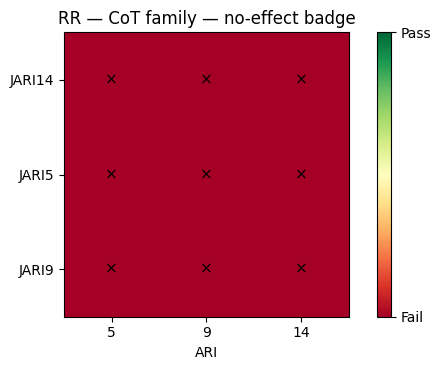

In [95]:

per_ari_base, summary_base = summarize_rr_badge(rr_base, thr_bin=0.80, thr_top1=0.80,
                                                require_wrong=True, ci_guard=0.00)
print(summary_base)       # judge leaderboard (macro/micro + RPR)
plot_rr_badge(per_ari_base, title="RR — Baseline family — no-effect badge")

per_ari_cot, summary_cot = summarize_rr_badge(rr_cot, thr_bin=0.80, thr_top1=0.80,
                                              require_wrong=True, ci_guard=0.00)
print(summary_cot)
plot_rr_badge(per_ari_cot, title="RR — CoT family — no-effect badge")

In [ ]:
rr5_cot_ranks

***CR***

In [243]:
MODEL

'POLL'

In [96]:

# -------- CR (baseline) --------
CR_SCORE_BASE = "../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv"
CR_SCORE_REP  = "../resultFiles/GPT4/CR/Score/gpt4_cr_score_baseline1.csv"
CR_RANK_BASE  = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv"
CR_RANK_REP   = "../resultFiles/GPT4/CR/Rank/gpt4_cr_judge_rank_baseline1.csv"


CR_SCORE_COT = "../resultFiles/GPT4/Default/Score/filtered_all_score_cot.csv"
CR_SCORE_COT_REP  = "../resultFiles/GPT4/CR/Score/gpt4_cr_score_cot.csv"


CR_RANK_COT  = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_cot.csv"
CR_RANK_COT_REP   = "../resultFiles/GPT4/CR/Rank/gpt4_cr_judge_rank_cot.csv"




# cr_base_scores = cr_pointwise_df(MODEL, "baseline", CR_SCORE_BASE, CR_SCORE_REP, eps=1.0)
cr_base_ranks  = cr_listwise_df (MODEL, "baseline", CR_RANK_BASE,  CR_RANK_REP)

cr_cot_scores = cr_pointwise_df("GPT4", "cot", CR_SCORE_COT, CR_SCORE_COT_REP, eps=1.0)
cr_cot_ranks  = cr_listwise_df ("GPT4", "cot", CR_RANK_COT,  CR_RANK_COT_REP)
# write_cr_all(cr_base_scores, MODEL, OUT_DIR); 
# write_cr_all(cr_base_ranks, MODEL, OUT_DIR)
#     # show_cr_scores(cr_base_scores, MODEL, "baseline"); show_cr_ranks(cr_base_ranks, MODEL, "baseline")

[0. 1. 1. 0. 0. 1. 0. 1. 1. 0. 0. 1. 1. 1. 1. 2. 1. 0. 0. 1. 1. 1. 2. 2.
 1. 1. 0. 2. 0. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 2. 0. 0. 1.
 0. 0. 1. 0. 0. 1. 1. 0. 1. 0. 1. 0. 1. 1. 0. 1. 0. 1. 2. 1. 1. 0. 1. 0.
 0. 0. 2. 1. 1. 1. 1. 0. 1. 0. 1. 0. 3. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 1.
 0. 2. 0. 1. 0. 1. 1. 2. 1. 1. 1. 3. 1. 1. 1. 1. 1. 0. 2. 2. 1. 0. 1. 1.
 1. 1. 1. 2. 0. 1. 2. 0. 0. 0. 2. 0. 0. 0. 2. 2. 3. 1. 0. 1. 2. 1. 1. 0.
 0. 1. 0. 2. 0. 0. 0. 2. 1. 0. 1. 2. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1.
 0. 1. 0. 1. 2. 2. 1. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 0. 2.
 1. 1. 0. 2. 0. 1. 2. 0. 0. 1. 1. 1. 0. 1. 0. 0. 0. 1. 0. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 2. 3. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 1. 0.
 1. 1. 1. 1. 0. 2. 0. 1. 0. 0. 0. 2. 1. 1. 0. 1. 0. 1. 1. 0. 1. 0. 2. 2.
 1. 2. 1. 1. 3. 1. 1. 1. 1. 2. 2. 2. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 0.
 1. 1. 1. 0. 1. 1. 1. 0. 1. 0. 1. 1. 0. 0. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1.
 0. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 2. 1. 0. 1. 0. 1.

In [97]:
cr_base_ranks

,model,exp_name,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,GPT3,CR-baseline,CR,rank_bin_overall,Correct,5,388,391,0.992327,0.977688,0.997387
1,GPT3,CR-baseline,CR,rank_exact,Correct,5,366,391,0.936061,0.907318,0.956320
2,GPT3,CR-baseline,CR,rank_bin_top_preserve,Correct,5,383,383,1.000000,0.990070,1.000000
3,GPT3,CR-baseline,CR,rank_bin_bottom_preserve,Correct,5,5,8,0.625000,0.305742,0.863156
4,GPT3,CR-baseline,CR,rank_bin_overall,Correct,9,385,391,0.984655,0.966930,0.992949
5,GPT3,CR-baseline,CR,rank_exact,Correct,9,327,391,0.836317,0.796404,0.869686
6,GPT3,CR-baseline,CR,rank_bin_top_preserve,Correct,9,384,387,0.992248,0.977460,0.997360
7,GPT3,CR-baseline,CR,rank_bin_bottom_preserve,Correct,9,1,4,0.250000,0.045587,0.699358
8,GPT3,CR-baseline,CR,rank_bin_overall,Correct,14,381,391,0.974425,0.953568,0.986050
9,GPT3,CR-baseline,CR,rank_exact,Correct,14,337,391,0.861893,0.824159,0.892584


In [98]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

def plot_rr_style_cr_blues(
    df: pd.DataFrame,
    *,
    metric: str = "score_eps1",
    ari_order = (5, 9, 14),
    group_order = ("Correct", "Wrong"),
    legend_col: str = "ARI",     # use 'ARI' if you don't have a separate judge column
    title: str | None = None,
    ax=None
):
    """
    RR-style grouped bars with Blues palette + hatching.
    Requires columns: ['metric','group','ARI','rate'] and optionally ['ci_low','ci_high'].
    If 'rate' is missing but ['k','n'] exist, computes rate = k/n.
    """

    d = df.copy()

    # Compute rate if needed
    if "rate" not in d.columns and {"k", "n"}.issubset(d.columns):
        d["rate"] = d["k"] / d["n"]

    # Filter the rows we need
    d = d[(d["metric"] == metric) & (d["ARI"].isin(ari_order)) & (d["group"].isin(group_order))].copy()

    # Build x-category labels as plain strings (avoid Categorical groupby pitfalls)
    xcats = [f"ARI {a}\n{g}" for a in ari_order for g in group_order]
    d["xcat"] = "ARI " + d["ARI"].astype(int).astype(str) + "\n" + d["group"].astype(str)

    # Choose legend levels (series) in a sensible order
    if legend_col not in d.columns:
        legend_col = "ARI"
    legend_levels = list(pd.unique(d[legend_col]))
    legend_levels = [a for a in ari_order if a in legend_levels] + [x for x in legend_levels if x not in ari_order]
    n_series = max(len(legend_levels), 1)

    # Aggregate (observed only)
    agg = (d.groupby(["xcat", legend_col], as_index=False)
             .agg(rate=("rate", "mean"),
                  ci_low=("ci_low", "mean") if "ci_low" in d.columns else ("rate", "mean"),
                  ci_high=("ci_high", "mean") if "ci_high" in d.columns else ("rate", "mean")))

    # Build full grid (xcats × legend_levels), keep NaNs for truly missing combos
    idx = pd.MultiIndex.from_product([xcats, legend_levels], names=["xcat", legend_col])
    agg = agg.set_index(["xcat", legend_col]).reindex(idx).reset_index()

    # Plot geometry
    centers = np.arange(len(xcats))
    width = 0.8 / n_series
    offsets = (np.arange(n_series) - (n_series - 1) / 2.0) * width

    # Blues palette
    cmap = plt.get_cmap("Blues")
    blues = [cmap(v) for v in np.linspace(0.45, 0.85, n_series)]

    hatch_map = {"Correct": "", "Wrong": "//"}

    if ax is None:
        fig, ax = plt.subplots(figsize=(13, 4.8))

    # Draw each legend series
    for i, lvl in enumerate(legend_levels):
        sub = agg[agg[legend_col] == lvl].copy()
        y = sub["rate"].to_numpy()
        x_pos = centers + offsets[i]

        # Confidence intervals if available
        yerr = None
        if {"ci_low", "ci_high"}.issubset(sub.columns):
            lower = y - sub["ci_low"].to_numpy()
            upper = sub["ci_high"].to_numpy() - y
            yerr = np.vstack([lower, upper])

        # Mask out missing (NaN) bars to avoid errors
        mask = ~np.isnan(y)
        bars = ax.bar(
            x_pos[mask],
            y[mask],
            width=width,
            yerr=(yerr[:, mask] if yerr is not None else None),
            capsize=3,
            label=f"JARI{lvl}" if legend_col != "ARI" else f"ARI {lvl}",
            color=blues[i],
            edgecolor="black",
            linewidth=0.6
        )

        # Apply hatching by group for each bar
        sub_valid = sub.loc[mask]
        groups_for_hatch = sub_valid["xcat"].str.split("\n").str[1].tolist()
        for bar, g in zip(bars, groups_for_hatch):
            bar.set_hatch(hatch_map.get(g, ""))

    # Axes and legends
    ax.set_xticks(centers)
    ax.set_xticklabels(xcats)
    ax.set_ylim(0, 1.05)
    ax.set_ylabel("Consistency Rate")
    ax.set_title(title or f"CR — PoLL-After RoundUp--Scores — {metric}")

    # Legend 1: colored bars (JARI levels)
    leg1 = ax.legend(title="Judge (JARI level)", loc="upper right")

    # Legend 2: hatching for group
    group_handles = [
        Patch(facecolor="white", edgecolor="black", hatch=h, label=lbl)
        for lbl, h in [("Correct", ""), ("Wrong", "//")]
    ]
    leg2 = ax.legend(handles=group_handles, title="Group", loc="center left", bbox_to_anchor=(1.0, 0.5))
    ax.add_artist(leg1)

    plt.tight_layout()
    return ax


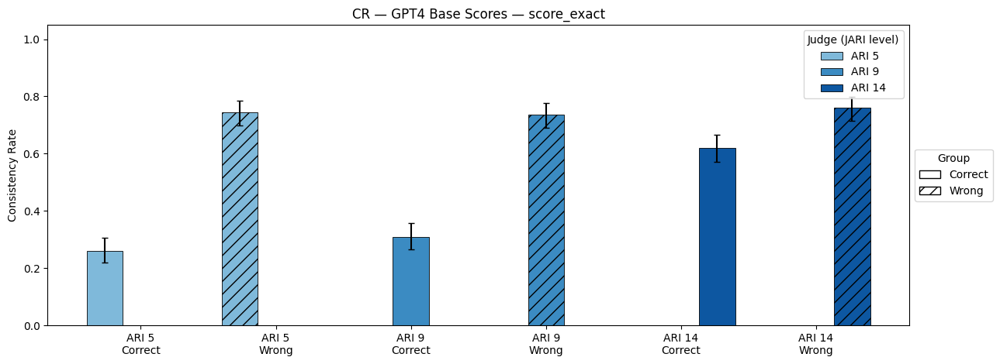

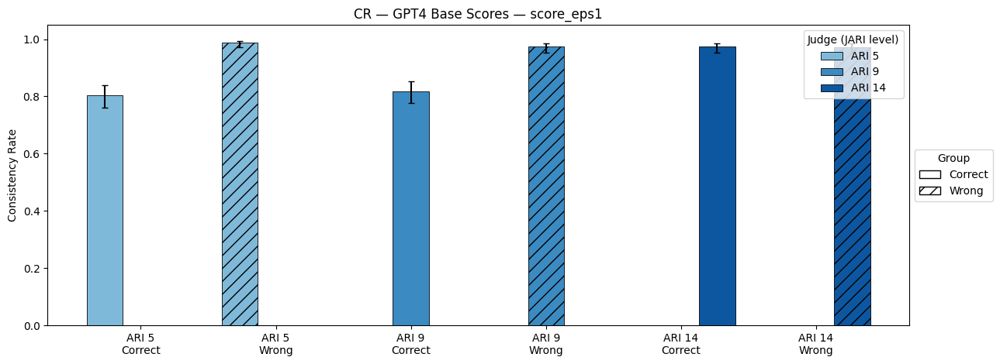

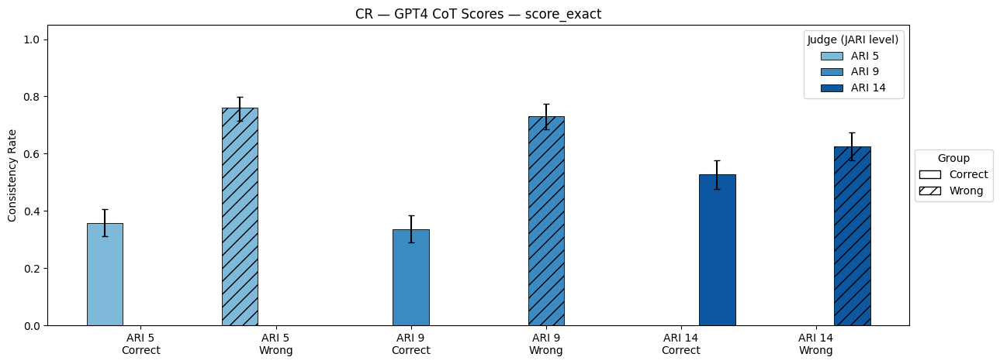

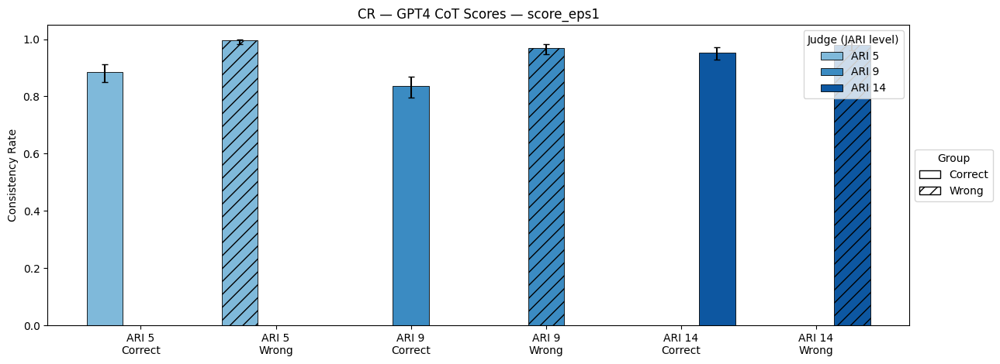

In [220]:
# # With your dataframe (like the 12-row table you pasted):
# plot_rr_style_cr_blues(cr_base_scores, metric="score_exact", legend_col="ARI",
#                        title="CR — GPT — score_exact")
# plt.show()

# # With your dataframe (like the 12-row table you pasted):
# plot_rr_style_cr_blues(cr_base_scores, metric="score_eps1", legend_col="ARI",
#                        title="CR — GPT — score_eps1")
# plt.show()
# CoT scores (pointwise), each as its own figure
score_metrics = ["score_exact", "score_eps1"]
 

for m in score_metrics:
    ax = plot_rr_style_cr_blues(
        cr_base_scores,                 # your CoT dataframe
        metric=m,
        legend_col="ARI",              # or "jari" if present
        ari_order=(5, 9, 14),
        group_order=("Correct", "Wrong"),
        title=f"CR — GPT4 Base Scores — {m}",
        ax=None
    )
    plt.show()

for m in score_metrics:
    ax = plot_rr_style_cr_blues(
        cr_cot_scores,                 # your CoT dataframe
        metric=m,
        legend_col="ARI",              # or "jari" if present
        ari_order=(5, 9, 14),
        group_order=("Correct", "Wrong"),
        title=f"CR — GPT4 CoT Scores — {m}",
        ax=None
    )
    plt.show()

# # With your dataframe (like the 12-row table you pasted):
# plot_rr_style_cr_blues(cr_cot_scores, metric="score_exact", legend_col="ARI",
#                        title="CR — GPT — score_exact")
# plt.show()

# # With your dataframe (like the 12-row table you pasted):
# plot_rr_style_cr_blues(cr_base_scores, metric="score_eps1", legend_col="ARI",
#                        title="CR — GPT — score_eps1")
# plt.show()

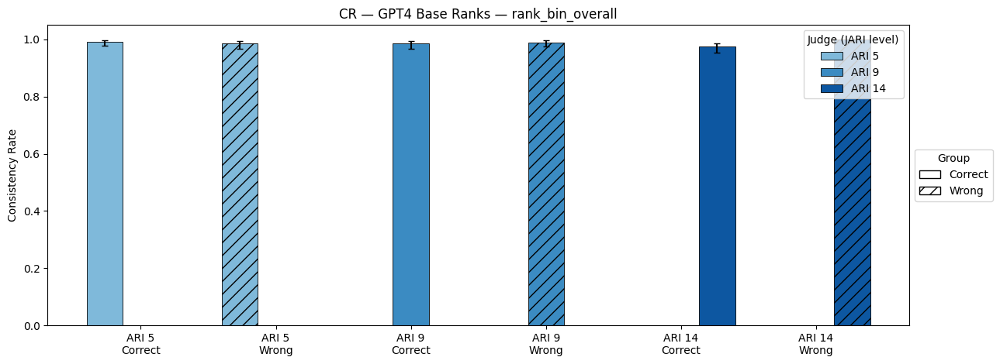

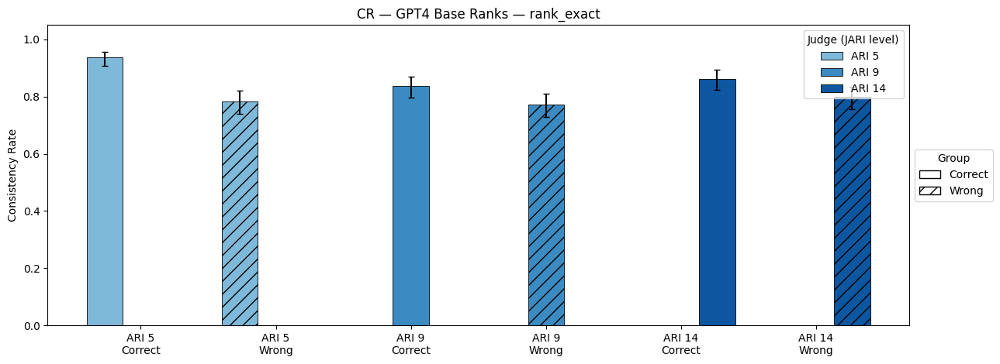

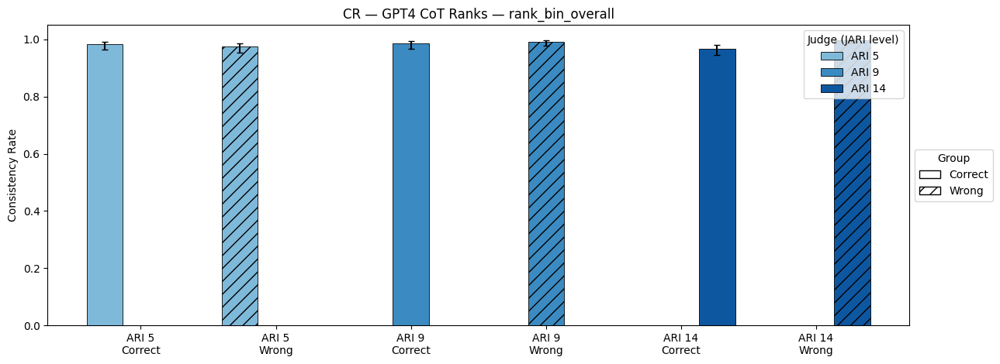

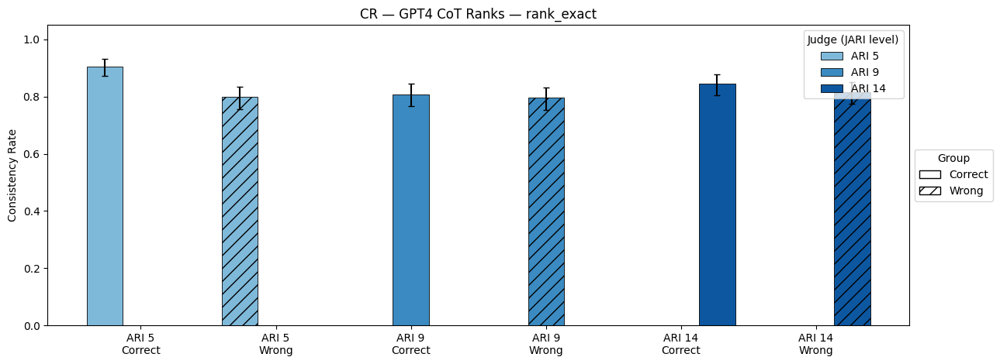

In [221]:
# Plot each rank metric as its own figure
rank_metrics = ["rank_bin_overall", "rank_exact"]  # add more if you like

for m in rank_metrics:
    ax = plot_rr_style_cr_blues(
        cr_base_ranks,                 # from cr_listwise_df(...)
        metric=m,
        legend_col="ARI",              # use "jari" if you have judge-ARI column
        ari_order=(5, 9, 14),
        group_order=("Correct", "Wrong"),
        title=f"CR — GPT4 Base Ranks — {m}",
        ax=None
    )
    plt.show()

for m in rank_metrics:
    ax = plot_rr_style_cr_blues(
        cr_cot_ranks,                 # from cr_listwise_df(...)
        metric=m,
        legend_col="ARI",              # use "jari" if you have judge-ARI column
        ari_order=(5, 9, 14),
        group_order=("Correct", "Wrong"),
        title=f"CR — GPT4 CoT Ranks — {m}",
        ax=None
    )
    plt.show()    
  


In [256]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from math import sqrt

def _wilson_ci_vec(k: np.ndarray, n: np.ndarray, z: float = 1.96):
    """
    Vectorized Wilson score interval for binomial proportion.
    Returns (lo, hi) arrays with NaN for n==0.
    """
    k = k.astype(float)
    n = n.astype(float)
    p = np.divide(k, n, out=np.full_like(k, np.nan, dtype=float), where=n>0)

    denom = 1.0 + (z*z)/n
    center = (p + (z*z)/(2*n)) / denom
    half   = (z * np.sqrt((p*(1.0 - p) + (z*z)/(4*n)) / n)) / denom

    lo = center - half
    hi = center + half
    # clip to [0,1]
    lo = np.clip(lo, 0.0, 1.0)
    hi = np.clip(hi, 0.0, 1.0)
    return lo, hi

def plot_rr_style_cr_blues(
    df: pd.DataFrame,
    *,
    metric: str,
    ari_order=(5, 9, 14),
    group_order=("Correct", "Wrong"),
    legend_col: str = "ARI",           # use "jari" if you have judge-ARI column
    title: str | None = None,
    ax=None,
    show_ci: bool = True,              # turn CI bars on/off
    ci_from_kn_if_missing: bool = True,# compute CI from k/n if ci_* missing
    conf: float = 0.95                 # confidence level for Wilson CI
):
    """
    RR-style grouped bars with Blues palette + hatching.
    Expects: columns ['metric','group','ARI','rate'] and optionally ['ci_low','ci_high'].
    If 'rate' missing but ['k','n'] exist -> computes rate = k/n.
    If CI columns missing and ci_from_kn_if_missing=True with ['k','n'] present -> computes Wilson CI.
    """

    d = df.copy()

    # Ensure rate exists if k,n available
    if "rate" not in d.columns and {"k", "n"}.issubset(d.columns):
        d["rate"] = d["k"] / d["n"]

    # Filter to requested slices
    d = d[(d["metric"] == metric) & (d["ARI"].isin(ari_order)) & (d["group"].isin(group_order))].copy()
    if d.empty:
        raise ValueError(f"No rows for metric={metric}")

    # Compute CI if needed (and possible)
    need_ci = show_ci and not {"ci_low","ci_high"}.issubset(d.columns)
    if need_ci and ci_from_kn_if_missing and {"k","n"}.issubset(d.columns):
        z = 1.96 if np.isclose(conf, 0.95) else \
            {0.90:1.6448536269514722, 0.95:1.959963984540054, 0.99:2.5758293035489004}.get(conf, 1.959963984540054)
        lo, hi = _wilson_ci_vec(d["k"].to_numpy(), d["n"].to_numpy(), z=z)
        d["ci_low"]  = lo
        d["ci_high"] = hi
    # Else: if CI still missing, we'll plot without error bars.

    # Build x categories (plain strings to avoid categorical gotchas)
    xcats = [f"ARI {a}\n{g}" for a in ari_order for g in group_order]
    d["xcat"] = "ARI " + d["ARI"].astype(int).astype(str) + "\n" + d["group"].astype(str)

    # Legend levels (series)
    if legend_col not in d.columns:
        legend_col = "ARI"
    legend_levels = list(pd.unique(d[legend_col]))
    legend_levels = [a for a in ari_order if a in legend_levels] + [x for x in legend_levels if x not in ari_order]
    n_series = max(len(legend_levels), 1)

    # Aggregate (observed only)
    agg = (d.groupby(["xcat", legend_col], as_index=False)
             .agg(rate=("rate","mean"),
                  ci_low=("ci_low","mean") if "ci_low" in d.columns else ("rate","mean"),
                  ci_high=("ci_high","mean") if "ci_high" in d.columns else ("rate","mean")))

    # Full grid: xcats × legend_levels (keep NaNs for missing combos)
    idx = pd.MultiIndex.from_product([xcats, legend_levels], names=["xcat", legend_col])
    agg = agg.set_index(["xcat", legend_col]).reindex(idx).reset_index()

    centers = np.arange(len(xcats))
    width   = 0.8 / n_series
    offsets = (np.arange(n_series) - (n_series - 1) / 2.0) * width

    # Blues palette
    cmap  = plt.get_cmap("Blues")
    blues = [cmap(v) for v in np.linspace(0.45, 0.85, n_series)]
    hatch_map = {"Correct": "", "Wrong": "//"}

    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 4.8))

    for i, lvl in enumerate(legend_levels):
        sub = agg[agg[legend_col] == lvl].copy()

        # Values
        y  = sub["rate"].astype(float).to_numpy()
        x_pos = centers + offsets[i]

        # Error bars (robust: enforce ci_low ≤ y ≤ ci_high; clip negatives to 0)
        yerr = None
        if show_ci and {"ci_low","ci_high"}.issubset(sub.columns):
            lo = sub["ci_low"].astype(float).to_numpy()
            hi = sub["ci_high"].astype(float).to_numpy()

            # enforce monotonicity around y
            lo = np.minimum(lo, y)
            hi = np.maximum(hi, y)

            lower = np.clip(y - lo, 0.0, None)
            upper = np.clip(hi - y, 0.0, None)
            yerr = np.vstack([lower, upper])

            valid = (~np.isnan(y)) & (~np.isnan(lower)) & (~np.isnan(upper))
        else:
            valid = ~np.isnan(y)

        bars = ax.bar(
            x_pos[valid], y[valid], width=width,
            yerr=(yerr[:, valid] if yerr is not None else None),
            capsize=3,
            label=f"ARI {lvl}" if legend_col == "ARI" else f"JARI{lvl}",
            color=blues[i],
            edgecolor="black",
            linewidth=0.6
        )

        # Hatching by group
        sub_valid = sub.loc[valid]
        groups_for_hatch = sub_valid["xcat"].str.split("\n").str[1].tolist()
        for bar, g in zip(bars, groups_for_hatch):
            bar.set_hatch(hatch_map.get(g, ""))

    # Axes
    ax.set_xticks(centers)
    ax.set_xticklabels(xcats)
    ax.set_ylim(0, 1.05)
    ax.set_ylabel("Consistency Rate")
    ax.set_title(title or f"CR — Ranks — {metric}")

    # Legends
    leg1 = ax.legend(title="Judge (JARI level)", loc="upper right")
    group_handles = [
        Patch(facecolor="white", edgecolor="black", hatch="",  label="Correct"),
        Patch(facecolor="white", edgecolor="black", hatch="//", label="Wrong")
    ]
    leg2 = ax.legend(handles=group_handles, title="Group", loc="center left", bbox_to_anchor=(1.0, 0.5))
    ax.add_artist(leg1)

    return ax


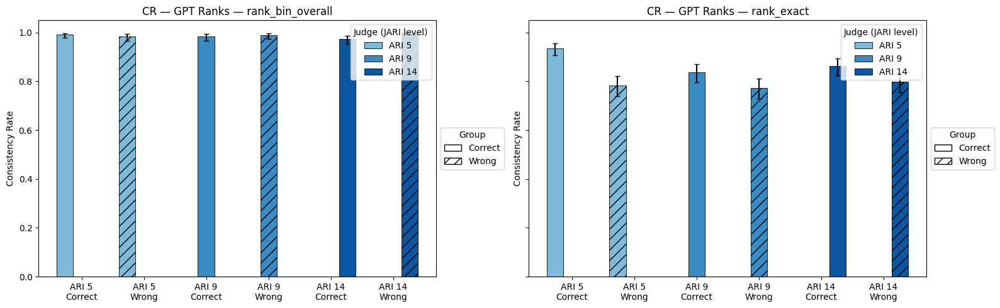

In [242]:
# ---------- Use it: two panels side-by-side ----------
metrics_to_plot = ["rank_bin_overall", "rank_exact"]

fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)
for m, ax in zip(metrics_to_plot, axes):
    plot_rr_style_cr_blues(
        cr_base_ranks,              # your dataframe from cr_listwise_df(...)
        metric=m,
        legend_col="ARI",           # color bars by JARI/ARI levels; switch to 'jari' if you have it
        ari_order=(5, 9, 14),
        group_order=("Correct", "Wrong"),
        title=f"CR — GPT Ranks — {m}",
        ax=ax
    )

plt.tight_layout()
plt.show()

***LLAMA***

In [227]:
CR_SCORE_BASE = "../resultFiles/LLama/Default/Score/llama_judge_score_baseline1.csv"
CR_SCORE_REP  = "../resultFiles/LLama/CR/Score/llama_judge_score_baseline1_cr.csv"

CR_SCORE_COT = "../resultFiles/LLama/Default/Score/llama_judge_score_cot.csv"
CR_SCORE_COT_REP  = "../resultFiles/LLama/CR/Score/llama_judge_score_cot_cr.csv"

CR_RANK_BASE  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_baseline1.csv"
CR_RANK_REP   = "../resultFiles/LLama/CR/Rank/llama_judge_rank_baseline1_cr.csv"

CR_RANK_COT  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_cot.csv"
CR_RANK_COT_REP   = "../resultFiles/LLama/CR/Rank/llama_judge_rank_cot_cr.csv"




In [228]:
cr_base_scores_llama = cr_pointwise_df("LLAMA", "baseline", CR_SCORE_BASE, CR_SCORE_REP, eps=1.0)
cr_base_ranks_llama  = cr_listwise_df ("LLAMA", "baseline", CR_RANK_BASE,  CR_RANK_REP)

cr_cot_scores_llama = cr_pointwise_df("LLAMA", "cot", CR_SCORE_COT, CR_SCORE_COT_REP, eps=1.0)
cr_cot_ranks_llama  = cr_listwise_df ("LLAMA", "cot", CR_RANK_COT,  CR_RANK_COT_REP)

[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

In [229]:
cr_base_ranks_llama

,model,exp_name,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,LLAMA,CR-baseline,CR,rank_bin_overall,Correct,5,350,390,0.897436,0.863347,0.923772
1,LLAMA,CR-baseline,CR,rank_exact,Correct,5,286,390,0.733333,0.687324,0.774791
2,LLAMA,CR-baseline,CR,rank_bin_top_preserve,Correct,5,347,367,0.945504,0.917330,0.964449
3,LLAMA,CR-baseline,CR,rank_bin_bottom_preserve,Correct,5,3,23,0.130435,0.045377,0.321275
4,LLAMA,CR-baseline,CR,rank_bin_overall,Correct,9,372,390,0.953846,0.928230,0.970609
5,LLAMA,CR-baseline,CR,rank_exact,Correct,9,199,390,0.510256,0.460786,0.559527
6,LLAMA,CR-baseline,CR,rank_bin_top_preserve,Correct,9,367,376,0.976064,0.955141,0.987357
7,LLAMA,CR-baseline,CR,rank_bin_bottom_preserve,Correct,9,5,14,0.357143,0.163447,0.612356
8,LLAMA,CR-baseline,CR,rank_bin_overall,Correct,14,364,390,0.933333,0.904111,0.954102
9,LLAMA,CR-baseline,CR,rank_exact,Correct,14,225,390,0.576923,0.527374,0.624971


In [ ]:
# # With your dataframe (like the 12-row table you pasted):
# plot_rr_style_cr_blues(cr_base_scores_llama, metric="score_exact", legend_col="ARI",
#                        title="CR — GPT — score_exact")
# plt.show()

# # With your dataframe (like the 12-row table you pasted):
# plot_rr_style_cr_blues(cr_base_scores_llama, metric="score_eps1", legend_col="ARI",
#                        title="CR — GPT — score_eps1")
# plt.show()

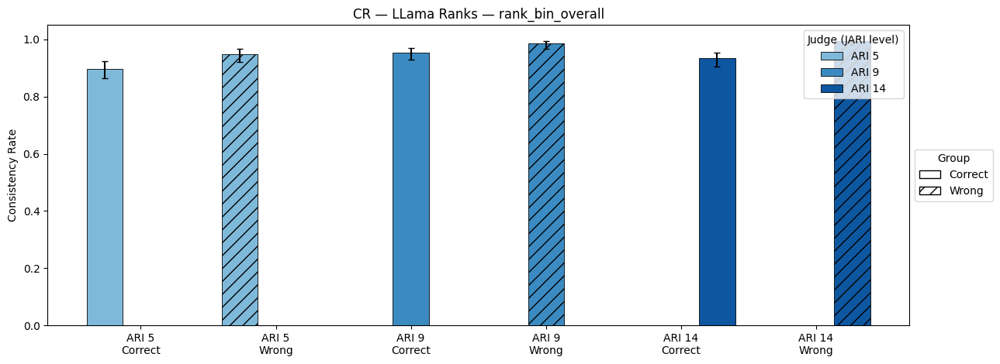

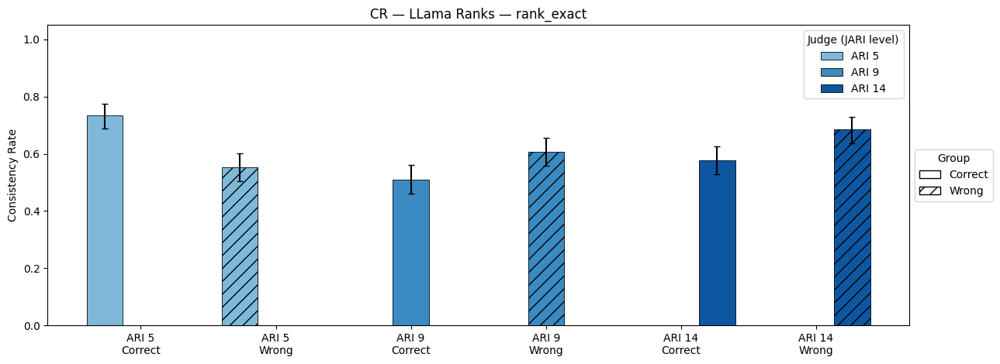

In [230]:
# Plot each rank metric as its own figure
rank_metrics = ["rank_bin_overall", "rank_exact"]  # add more if you like

for m in rank_metrics:
    ax = plot_rr_style_cr_blues(
        cr_base_ranks_llama,                 # from cr_listwise_df(...)
        metric=m,
        legend_col="ARI",              # use "jari" if you have judge-ARI column
        ari_order=(5, 9, 14),
        group_order=("Correct", "Wrong"),
        title=f"CR — LLama Ranks — {m}",
        ax=None
    )
    plt.show()
  


ValueError: 'yerr' must not contain negative values

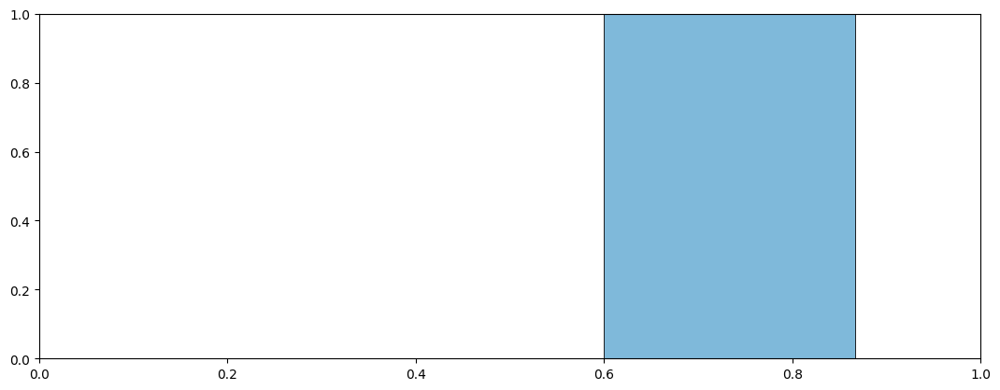

In [231]:
for m in rank_metrics:
    ax = plot_rr_style_cr_blues(
        cr_cot_ranks_llama,                 # from cr_listwise_df(...)
        metric=m,
        legend_col="ARI",              # use "jari" if you have judge-ARI column
        ari_order=(5, 9, 14),
        group_order=("Correct", "Wrong"),
        title=f"CR — LLama CoT Ranks — {m}",
        ax=None
    )
    plt.show()  

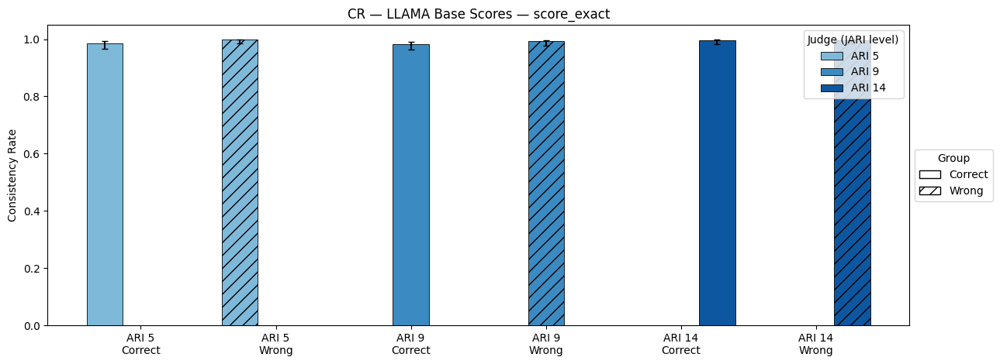

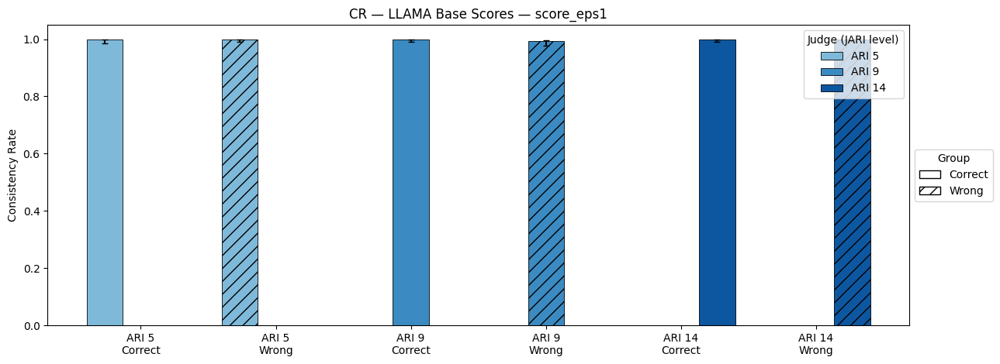

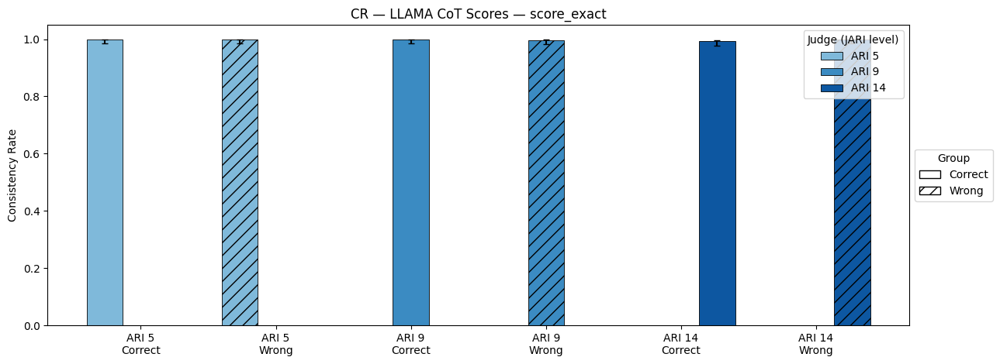

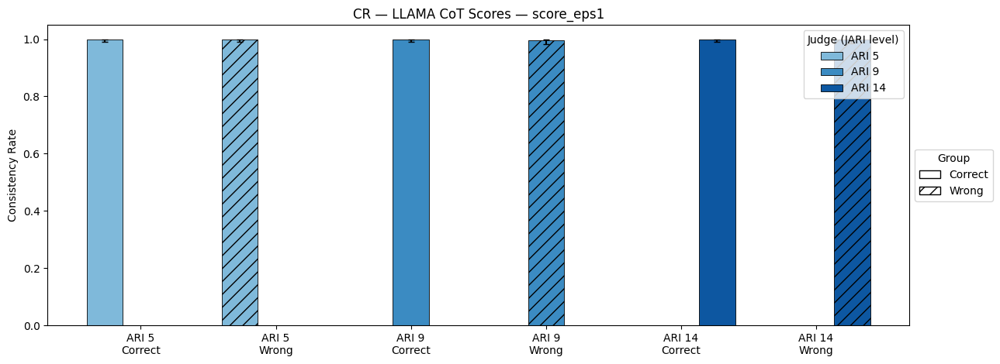

In [232]:
# CoT scores (pointwise), each as its own figure
score_metrics = ["score_exact", "score_eps1"]
 

for m in score_metrics:
    ax = plot_rr_style_cr_blues(
        cr_base_scores_llama,                 # your CoT dataframe
        metric=m,
        legend_col="ARI",              # or "jari" if present
        ari_order=(5, 9, 14),
        group_order=("Correct", "Wrong"),
        title=f"CR — LLAMA Base Scores — {m}",
        ax=None
    )
    plt.show()

for m in score_metrics:
    ax = plot_rr_style_cr_blues(
        cr_cot_scores_llama,                 # your CoT dataframe
        metric=m,
        legend_col="ARI",              # or "jari" if present
        ari_order=(5, 9, 14),
        group_order=("Correct", "Wrong"),
        title=f"CR — LLAMA CoT Scores — {m}",
        ax=None
    )
    plt.show()


***Ensembl CR***

In [208]:
df_mistral  = pd.read_csv("../resultFiles/Mistral/Default/Rank/mistral_judge_rank_baseline1.csv",  index_col=0)
df_qwen  = pd.read_csv("../resultFiles/Qwen/Default/Rank/qwen32_judge_rank_baseline1.csv",  index_col=0)
df_gpt3 = pd.read_csv("../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_baseline1.csv", index_col=0)

cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_baseline = compute_poll_rank(
    df_mistral, df_qwen, df_gpt3,
    rank_columns=cols, tie_break="median"
)

In [252]:
CR_RANK_BASE  = "../resultFiles/Mistral/Default/Rank/mistral_judge_rank_baseline1.csv"
CR_RANK_REP   = "../resultFiles/Mistral/CR/Rank/mistral_cr_judge_rank_baseline1.csv"

CR_RANK_COT  = "../resultFiles/Mistral/Default/Rank/mistral_judge_rank_cot.csv"
CR_RANK_COT_REP   = "../resultFiles/Mistral/CR/Rank/mistral_cr_judge_rank_cot.csv"

cr_base_ranks_mistral  = cr_listwise_df ("Mistral", "baseline", CR_RANK_BASE,  CR_RANK_REP)

cr_cot_ranks_mistral  = cr_listwise_df ("Mistral", "cot", CR_RANK_COT,  CR_RANK_COT_REP)


In [253]:
CR_RANK_BASE  = "../resultFiles/Qwen/Default/Rank/qwen32_judge_rank_baseline1.csv"
CR_RANK_REP   = "../resultFiles/Qwen/CR/Rank/qwen32_cr_judge_rank_baseline1.csv"

CR_RANK_COT  = "../resultFiles/Qwen/Default/Rank/qwen32_judge_rank_cot.csv"
CR_RANK_COT_REP   = "../resultFiles/Qwen/CR/Rank/qwen32_cr_judge_rank_cot.csv"

cr_base_ranks_qwen  = cr_listwise_df ("Qwen", "baseline", CR_RANK_BASE,  CR_RANK_REP)

cr_cot_ranks_qwen  = cr_listwise_df ("Qwen", "cot", CR_RANK_COT,  CR_RANK_COT_REP)


In [256]:
CR_RANK_BASE  = "../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_baseline1.csv"
CR_RANK_REP   = "../resultFiles/GPT3/CR/Rank/gpt3_cr_judge_rank_baseline1.csv"

CR_RANK_COT  = "../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_cot.csv"
CR_RANK_COT_REP   = "../resultFiles/GPT3/CR/Rank/gpt3_cr_judge_rank_cot.csv"

cr_base_ranks_gpt3  = cr_listwise_df ("GPT3", "baseline", CR_RANK_BASE,  CR_RANK_REP)

cr_cot_ranks_gpt3  = cr_listwise_df ("GPT3", "cot", CR_RANK_COT,  CR_RANK_COT_REP)


In [209]:
df_mistral_rep  = pd.read_csv("../resultFiles/Mistral/CR/Rank/mistral_cr_judge_rank_baseline1.csv",  index_col=0)
df_qwen_rep  = pd.read_csv("../resultFiles/Qwen/CR/Rank/qwen32_cr_judge_rank_baseline1.csv",  index_col=0)
df_gpt3_rep = pd.read_csv("../resultFiles/GPT3/CR/Rank/gpt3_cr_judge_rank_baseline1.csv", index_col=0)

cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_baseline_rep = compute_poll_rank(
    df_mistral_rep, df_qwen_rep, df_gpt3_rep,
    rank_columns=cols, tie_break="median"
)

In [210]:
df_mistral_cot  = pd.read_csv("../resultFiles/Mistral/Default/Rank/mistral_judge_rank_cot.csv",  index_col=0)
df_qwen_cot  = pd.read_csv("../resultFiles/Qwen/Default/Rank/qwen32_judge_rank_cot.csv",  index_col=0)
df_gpt3_cot = pd.read_csv("../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_cot.csv", index_col=0)

cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_cot_rank= compute_poll_rank(
    df_mistral_cot, df_qwen_cot, df_gpt3_cot,
    rank_columns=cols, tie_break="median"
)

In [211]:
df_mistral_cot_rep  = pd.read_csv("../resultFiles/Mistral/CR/Rank/mistral_cr_judge_rank_cot.csv",  index_col=0)
df_qwen_cot_rep  = pd.read_csv("../resultFiles/Qwen/CR/Rank/qwen32_cr_judge_rank_cot.csv",  index_col=0)
df_gpt3_cot_rep = pd.read_csv("../resultFiles/GPT3/CR/Rank/gpt3_cr_judge_rank_cot.csv", index_col=0)

cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_cot_rank_rep= compute_poll_rank(
    df_mistral_cot_rep, df_qwen_cot_rep, df_gpt3_cot_rep,
    rank_columns=cols, tie_break="median"
)

In [212]:
# cr_base_scores_llama = cr_pointwise_df("LLAMA", "baseline", CR_SCORE_BASE, CR_SCORE_REP, eps=1.0)
cr_base_ranks_poll = cr_listwise_df ("PoLL", "baseline", poll_baseline,  poll_baseline_rep)

# cr_cot_scores_llama = cr_pointwise_df("LLAMA", "cot", CR_SCORE_COT, CR_SCORE_COT_REP, eps=1.0)
cr_cot_ranks_poll  = cr_listwise_df ("PoLL", "cot", poll_cot_rank,  poll_cot_rank_rep)

In [213]:
cr_cot_ranks_poll

,model,exp_name,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,PoLL,CR-cot,CR,rank_bin_overall,Correct,5,379,391,0.969309,0.947129,0.982358
1,PoLL,CR-cot,CR,rank_exact,Correct,5,275,391,0.703325,0.656247,0.746446
2,PoLL,CR-cot,CR,rank_bin_top_preserve,Correct,5,373,380,0.981579,0.962470,0.991049
3,PoLL,CR-cot,CR,rank_bin_bottom_preserve,Correct,5,6,11,0.545455,0.280092,0.787287
4,PoLL,CR-cot,CR,rank_bin_overall,Correct,9,378,391,0.966752,0.943953,0.980468
5,PoLL,CR-cot,CR,rank_exact,Correct,9,250,391,0.639386,0.590648,0.685413
6,PoLL,CR-cot,CR,rank_bin_top_preserve,Correct,9,372,378,0.984127,0.965808,0.992705
7,PoLL,CR-cot,CR,rank_bin_bottom_preserve,Correct,9,6,13,0.461538,0.232061,0.708562
8,PoLL,CR-cot,CR,rank_bin_overall,Correct,14,376,391,0.961637,0.937675,0.976616
9,PoLL,CR-cot,CR,rank_exact,Correct,14,315,391,0.805627,0.763508,0.841798


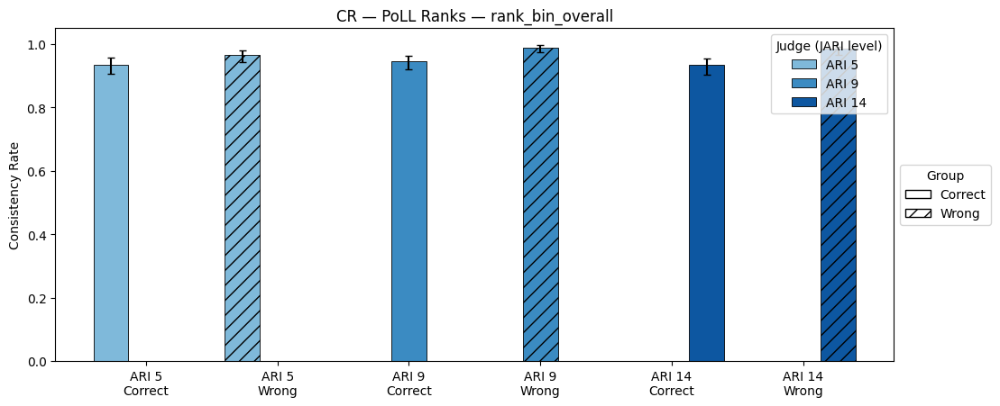

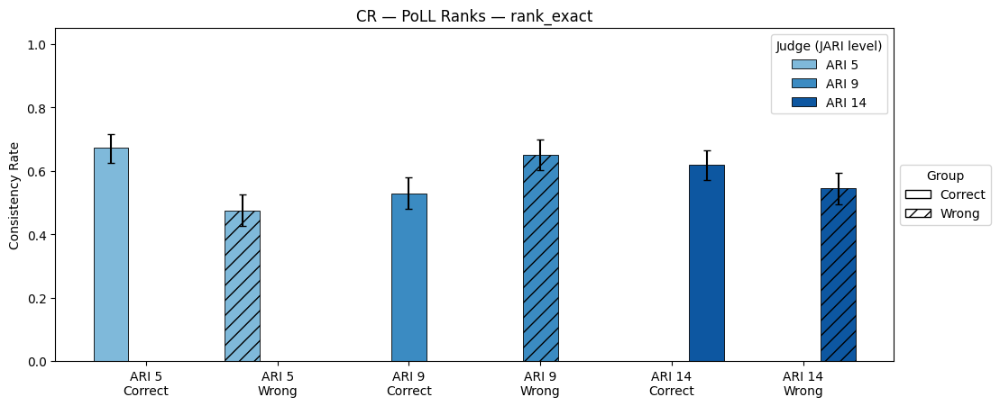

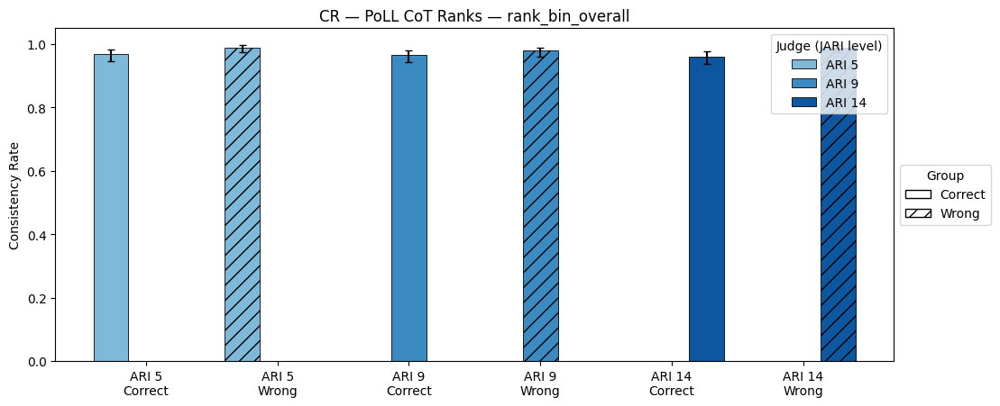

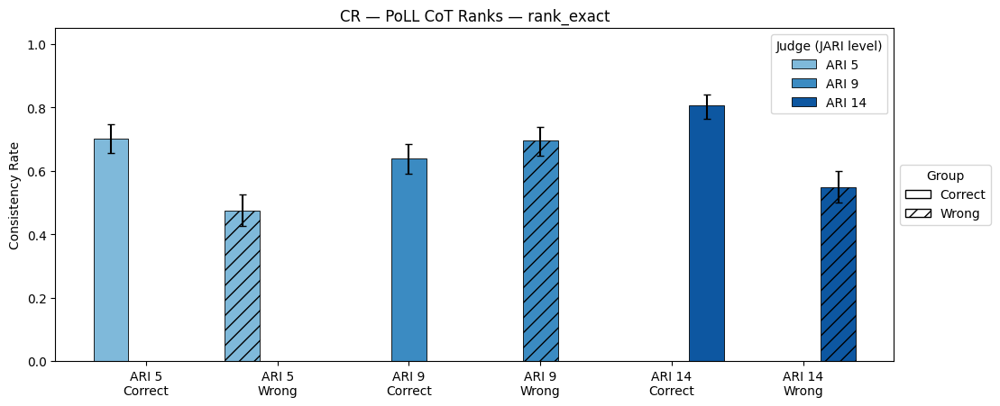

In [280]:
# Plot each rank metric as its own figure
rank_metrics = ["rank_bin_overall", "rank_exact"]  # add more if you like

for m in rank_metrics:
    ax = plot_rr_style_cr_blues(
        cr_base_ranks_poll,                 # from cr_listwise_df(...)
        metric=m,
        legend_col="ARI",              # use "jari" if you have judge-ARI column
        ari_order=(5, 9, 14),
        group_order=("Correct", "Wrong"),
        title=f"CR — PoLL Ranks — {m}",
        ax=None
    )
    plt.show()
  

for m in rank_metrics:
    ax = plot_rr_style_cr_blues(
        cr_cot_ranks_poll,                 # from cr_listwise_df(...)
        metric=m,
        legend_col="ARI",              # use "jari" if you have judge-ARI column
        ari_order=(5, 9, 14),
        group_order=("Correct", "Wrong"),
        title=f"CR — PoLL CoT Ranks — {m}",
        ax=None
    )
    plt.show()
  

In [222]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_cr_rankbin_grid(
    df: pd.DataFrame,
    *,
    metric: str = "rank_bin_overall",
    model_order=None,                     # e.g., ("GPT-4 Base","GPT-4 CoT","Llama-3","Mistral","PoLL")
    exp_order=("CR-base","CR-cot"),       # columns: baseline vs CoT
    ari_order=(5, 9, 14),
    group_order=("Correct","Wrong"),
    figsize_per_row=(12, 2.8),
    sharey=True,
    title="Consistency Rate — rank_bin_overall across Readability"
):
    """
    Expects long format with at least:
    ['model','exp_name','metric','group','ARI','rate'] and optional ['ci_low','ci_high'].
    """

    d = df.copy()
    if "rate" not in d.columns and {"k","n"}.issubset(d.columns):
        d["rate"] = d["k"] / d["n"]

    # keep only the metric we want
    d = d[d["metric"] == metric].copy()
    d["ARI"] = d["ARI"].astype(int)

    # sensible defaults from data
    if model_order is None:
        model_order = list(pd.unique(d["model"]))
    n_rows = len(model_order)
    n_cols = len(exp_order)

    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(figsize_per_row[0], max(1, n_rows)*figsize_per_row[1]),
        sharey=sharey, squeeze=False
    )

    marker_map = {"Correct": "o", "Wrong": "s"}
    ls_map     = {"Correct": "-",  "Wrong": "--"}

    for r, model in enumerate(model_order):
        dm = d[d["model"] == model]
        for c, exp in enumerate(exp_order):
            ax = axes[r, c]
            sub = dm[dm["exp_name"] == exp]

            if sub.empty:
                ax.text(0.5, 0.5, "no data", ha="center", va="center")
                ax.set_xticks(np.arange(len(ari_order)))
                ax.set_xticklabels([f"ARI {a}" for a in ari_order])
                ax.set_ylim(0, 1.05)
                if c == 0: ax.set_ylabel(f"{model}\nCR")
                if r == 0: ax.set_title(exp.replace("CR-", "").upper())
                continue

            for group in group_order:
                g = sub[sub["group"] == group].set_index("ARI").reindex(ari_order).reset_index()
                x = np.arange(len(ari_order))
                y = g["rate"].to_numpy(dtype=float)

                yerr = None
                if {"ci_low","ci_high"}.issubset(g.columns):
                    low = y - g["ci_low"].to_numpy(dtype=float)
                    high = g["ci_high"].to_numpy(dtype=float) - y
                    yerr = np.vstack([low, high])

                ax.errorbar(
                    x, y, yerr=yerr,
                    marker=marker_map.get(group, "o"),
                    linestyle=ls_map.get(group, "-"),
                    linewidth=1.8, capsize=3, ms=5,
                    label=group
                )

            ax.set_xticks(np.arange(len(ari_order)))
            ax.set_xticklabels([f"ARI {a}" for a in ari_order])
            ax.set_ylim(0, 1.05)
            ax.grid(True, axis="y", alpha=0.25, linestyle=":")

            if c == 0:
                ax.set_ylabel(f"{model}\nCR")
            if r == 0:
                ax.set_title(exp.replace("CR-", "").upper())

    # one shared legend
    handles, labels = axes[0,0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="upper right", ncol=len(group_order), frameon=True)

    fig.suptitle(title, y=1.02, fontsize=12)
    plt.tight_layout()
    return fig, axes



In [236]:
cr_base_ranks

,model,exp_name,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,GPT-4 Base,CR-baseline,CR,rank_bin_overall,Correct,5,388,391,0.992327,0.977688,0.997387
1,GPT-4 Base,CR-baseline,CR,rank_exact,Correct,5,366,391,0.936061,0.907318,0.956320
2,GPT-4 Base,CR-baseline,CR,rank_bin_top_preserve,Correct,5,383,383,1.000000,0.990070,1.000000
3,GPT-4 Base,CR-baseline,CR,rank_bin_bottom_preserve,Correct,5,5,8,0.625000,0.305742,0.863156
4,GPT-4 Base,CR-baseline,CR,rank_bin_overall,Correct,9,385,391,0.984655,0.966930,0.992949
5,GPT-4 Base,CR-baseline,CR,rank_exact,Correct,9,327,391,0.836317,0.796404,0.869686
6,GPT-4 Base,CR-baseline,CR,rank_bin_top_preserve,Correct,9,384,387,0.992248,0.977460,0.997360
7,GPT-4 Base,CR-baseline,CR,rank_bin_bottom_preserve,Correct,9,1,4,0.250000,0.045587,0.699358
8,GPT-4 Base,CR-baseline,CR,rank_bin_overall,Correct,14,381,391,0.974425,0.953568,0.986050
9,GPT-4 Base,CR-baseline,CR,rank_exact,Correct,14,337,391,0.861893,0.824159,0.892584


In [235]:
cr_cot_ranks

,model,exp_name,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,GPT-4 CoT,CR-cot,CR,rank_bin_overall,Correct,5,384,391,0.982097,0.963512,0.991301
1,GPT-4 CoT,CR-cot,CR,rank_exact,Correct,5,354,391,0.905371,0.872288,0.930566
2,GPT-4 CoT,CR-cot,CR,rank_bin_top_preserve,Correct,5,380,385,0.987013,0.969963,0.994440
3,GPT-4 CoT,CR-cot,CR,rank_bin_bottom_preserve,Correct,5,4,6,0.666667,0.299993,0.903229
4,GPT-4 CoT,CR-cot,CR,rank_bin_overall,Correct,9,385,391,0.984655,0.966930,0.992949
5,GPT-4 CoT,CR-cot,CR,rank_exact,Correct,9,316,391,0.808184,0.766234,0.844137
6,GPT-4 CoT,CR-cot,CR,rank_bin_top_preserve,Correct,9,384,388,0.989691,0.973796,0.995984
7,GPT-4 CoT,CR-cot,CR,rank_bin_bottom_preserve,Correct,9,1,3,0.333333,0.061492,0.792340
8,GPT-4 CoT,CR-cot,CR,rank_bin_overall,Correct,14,378,391,0.966752,0.943953,0.980468
9,GPT-4 CoT,CR-cot,CR,rank_exact,Correct,14,330,391,0.843990,0.804695,0.876591


In [237]:
cr_cot_ranks_llama

,model,exp_name,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,LLAMA,CR-cot,CR,rank_bin_overall,Correct,5,384,384,1.0,0.990095,1.0
1,LLAMA,CR-cot,CR,rank_exact,Correct,5,384,384,1.0,0.990095,1.0
2,LLAMA,CR-cot,CR,rank_bin_top_preserve,Correct,5,353,353,1.0,0.989235,1.0
3,LLAMA,CR-cot,CR,rank_bin_bottom_preserve,Correct,5,31,31,1.0,0.889745,1.0
4,LLAMA,CR-cot,CR,rank_bin_overall,Correct,9,384,384,1.0,0.990095,1.0
5,LLAMA,CR-cot,CR,rank_exact,Correct,9,384,384,1.0,0.990095,1.0
6,LLAMA,CR-cot,CR,rank_bin_top_preserve,Correct,9,365,365,1.0,0.989585,1.0
7,LLAMA,CR-cot,CR,rank_bin_bottom_preserve,Correct,9,19,19,1.0,0.831821,1.0
8,LLAMA,CR-cot,CR,rank_bin_overall,Correct,14,384,384,1.0,0.990095,1.0
9,LLAMA,CR-cot,CR,rank_exact,Correct,14,384,384,1.0,0.990095,1.0


In [233]:
cr_base_ranks_llama

,model,exp_name,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,LLAMA,CR-baseline,CR,rank_bin_overall,Correct,5,350,390,0.897436,0.863347,0.923772
1,LLAMA,CR-baseline,CR,rank_exact,Correct,5,286,390,0.733333,0.687324,0.774791
2,LLAMA,CR-baseline,CR,rank_bin_top_preserve,Correct,5,347,367,0.945504,0.917330,0.964449
3,LLAMA,CR-baseline,CR,rank_bin_bottom_preserve,Correct,5,3,23,0.130435,0.045377,0.321275
4,LLAMA,CR-baseline,CR,rank_bin_overall,Correct,9,372,390,0.953846,0.928230,0.970609
5,LLAMA,CR-baseline,CR,rank_exact,Correct,9,199,390,0.510256,0.460786,0.559527
6,LLAMA,CR-baseline,CR,rank_bin_top_preserve,Correct,9,367,376,0.976064,0.955141,0.987357
7,LLAMA,CR-baseline,CR,rank_bin_bottom_preserve,Correct,9,5,14,0.357143,0.163447,0.612356
8,LLAMA,CR-baseline,CR,rank_bin_overall,Correct,14,364,390,0.933333,0.904111,0.954102
9,LLAMA,CR-baseline,CR,rank_exact,Correct,14,225,390,0.576923,0.527374,0.624971


In [238]:
cr_cot_ranks_poll

,model,exp_name,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,PoLL,CR-cot,CR,rank_bin_overall,Correct,5,379,391,0.969309,0.947129,0.982358
1,PoLL,CR-cot,CR,rank_exact,Correct,5,275,391,0.703325,0.656247,0.746446
2,PoLL,CR-cot,CR,rank_bin_top_preserve,Correct,5,373,380,0.981579,0.962470,0.991049
3,PoLL,CR-cot,CR,rank_bin_bottom_preserve,Correct,5,6,11,0.545455,0.280092,0.787287
4,PoLL,CR-cot,CR,rank_bin_overall,Correct,9,378,391,0.966752,0.943953,0.980468
5,PoLL,CR-cot,CR,rank_exact,Correct,9,250,391,0.639386,0.590648,0.685413
6,PoLL,CR-cot,CR,rank_bin_top_preserve,Correct,9,372,378,0.984127,0.965808,0.992705
7,PoLL,CR-cot,CR,rank_bin_bottom_preserve,Correct,9,6,13,0.461538,0.232061,0.708562
8,PoLL,CR-cot,CR,rank_bin_overall,Correct,14,376,391,0.961637,0.937675,0.976616
9,PoLL,CR-cot,CR,rank_exact,Correct,14,315,391,0.805627,0.763508,0.841798


In [239]:
cr_base_ranks_poll

,model,exp_name,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,PoLL,CR-baseline,CR,rank_bin_overall,Correct,5,366,391,0.936061,0.907318,0.956320
1,PoLL,CR-baseline,CR,rank_exact,Correct,5,263,391,0.672634,0.624639,0.717270
2,PoLL,CR-baseline,CR,rank_bin_top_preserve,Correct,5,359,364,0.986264,0.968252,0.994119
3,PoLL,CR-baseline,CR,rank_bin_bottom_preserve,Correct,5,7,27,0.259259,0.131704,0.446786
4,PoLL,CR-baseline,CR,rank_bin_overall,Correct,9,370,391,0.946292,0.919293,0.964606
5,PoLL,CR-baseline,CR,rank_exact,Correct,9,207,391,0.529412,0.479892,0.578359
6,PoLL,CR-baseline,CR,rank_bin_top_preserve,Correct,9,365,378,0.965608,0.942055,0.979793
7,PoLL,CR-baseline,CR,rank_bin_bottom_preserve,Correct,9,5,13,0.384615,0.177097,0.644771
8,PoLL,CR-baseline,CR,rank_bin_overall,Correct,14,365,391,0.933504,0.904352,0.954220
9,PoLL,CR-baseline,CR,rank_exact,Correct,14,242,391,0.618926,0.569852,0.665686


Sanity Check: Counts of Models by Experiment Type
exp_name  Baseline  CoT
model                  
GPT-4           27   27
LLaMA           27   27
PoLL            27   27




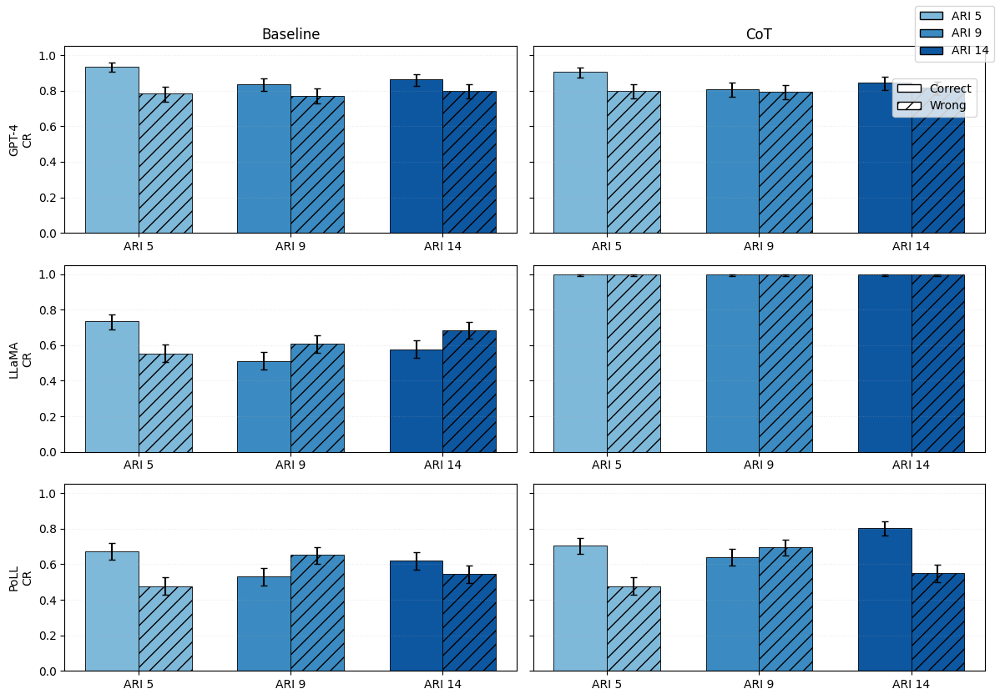

In [286]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# ---------- plotting helper (2 columns: Baseline | CoT) ----------
def plot_cr_rankbin_bargrid(
    d: pd.DataFrame,
    *,
    model_order=None,
    exp_order=("Baseline","CoT"),
    ari_order=(5, 9, 14),
    group_order=("Correct","Wrong"),
    sharey=True,
    figsize_per_row=(12, 2.8),
    title=""
):
    # Consistency Rate — rank_bin_overall (Rows: Models, Cols: Baseline vs CoT)
    dat = d.copy()

    # standardize exp_name -> Baseline / CoT
    def _norm_exp(x: str):
        xl = str(x).strip().lower()
        if "cot" in xl:
            return "CoT"
        # everything else treated as Baseline
        return "Baseline"
    dat["exp_name"] = dat["exp_name"].map(_norm_exp)

    # compute rate if k/n provided
    if "rate" not in dat.columns and {"k","n"}.issubset(dat.columns):
        dat["rate"] = dat["k"] / dat["n"]

    # keep desired metric/groups/ARIs only
    dat = dat[
        (dat["metric"] == "rank_exact")
        & (dat["group"].isin(group_order))
        & (dat["ARI"].astype(int).isin(ari_order))
        & (dat["exp_name"].isin(exp_order))
    ].copy()
    dat["ARI"] = dat["ARI"].astype(int)

    # default model order from data
    if model_order is None:
        model_order = list(pd.unique(dat["model"]))

    n_rows, n_cols = len(model_order), 2  # Baseline | CoT
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(figsize_per_row[0], max(1, n_rows)*figsize_per_row[1]),
        sharey=sharey, squeeze=False
    )

    # colors by ARI, hatch by Correct/Wrong
    cmap = plt.get_cmap("Blues")
    ari_colors = {a: cmap(v) for a, v in zip(ari_order, np.linspace(0.45, 0.85, len(ari_order)))}
    hatch_map = {"Correct": "", "Wrong": "//"}

    def _safe_yerr(y, lo, hi):
        """Return 2x1 non-negative yerr or None."""
        if not (np.isfinite(lo) and np.isfinite(hi)):
            return None
        if lo > hi:  # swapped
            lo, hi = hi, lo
        low  = max(0.0, float(y) - float(lo))
        high = max(0.0, float(hi) - float(y))
        if low < 1e-12 and high < 1e-12:
            return None
        return np.array([[low], [high]])

    # draw
    for r, model in enumerate(model_order):
        dm = dat[dat["model"] == model]
        for c, exp in enumerate(exp_order):
            ax = axes[r, c]
            sub = dm[dm["exp_name"] == exp]

            centers = np.arange(len(ari_order))
            width = 0.35  # left: Correct, right: Wrong

            for i, a in enumerate(ari_order):
                for j, g in enumerate(group_order):
                    cell = sub[(sub["ARI"] == a) & (sub["group"] == g)]
                    if cell.empty:
                        continue

                    y = float(cell["rate"].iloc[0])
                    if {"ci_low","ci_high"}.issubset(cell.columns):
                        lo = float(cell["ci_low"].iloc[0])
                        hi = float(cell["ci_high"].iloc[0])
                        yerr = _safe_yerr(y, lo, hi)
                    else:
                        yerr = None

                    x = centers[i] + (j - 0.5) * width
                    bar = ax.bar(
                        x, y, width=width,
                        yerr=yerr, capsize=3,
                        color=ari_colors[a], edgecolor="black", linewidth=0.6
                    )[0]
                    bar.set_hatch(hatch_map.get(g, ""))

            ax.set_xticks(centers)
            ax.set_xticklabels([f"ARI {a}" for a in ari_order])
            ax.set_ylim(0, 1.05)
            ax.grid(True, axis="y", alpha=0.25, linestyle=":")

            if c == 0:
                ax.set_ylabel(f"{model}\nCR")
            if r == 0:
                ax.set_title(exp)

    # legends (ARI colors + group hatch)
    ari_handles = [Patch(facecolor=ari_colors[a], edgecolor="black", label=f"ARI {a}") for a in ari_order]
    group_handles = [Patch(facecolor="white", edgecolor="black", hatch=h, label=g) for g, h in hatch_map.items()]
    leg1 = fig.legend(ari_handles, [f"ARI {a}" for a in ari_order], loc="upper right", frameon=True)
    fig.legend(group_handles, list(hatch_map.keys()), loc="upper right", bbox_to_anchor=(0.985, 0.90), frameon=True)
    fig.suptitle(title, y=1.02, fontsize=12)
    plt.tight_layout()
    return fig, axes


# --- normalize & combine ---
def normalize(df):
    out = df.copy()
    # 1) tidy model strings (remove doublespaces/nbsp, trim)
    out["model"] = (out["model"].astype(str)
                            .str.replace(r"\s+", " ", regex=True)
                            .str.replace("\u00A0", " ")
                            .str.strip())
    # 2) collapse variants into a single row label
    out["row_model"] = (out["model"]
                            .str.replace(r"\s*(Base|CoT)$", "", regex=True)
                            .str.strip())
    
    # NEW: Convert the row_model to a consistent case (e.g., lowercase)
    out["row_model"] = out["row_model"].str.lower()
    
    # 3) normalize experiment column to 2 bins
    out["exp_name"] = out["exp_name"].apply(lambda x: "CoT" if "cot" in str(x).lower() else "Baseline")
    
    # Drop the old 'model' column to avoid conflicts
    out = out.drop(columns=["model"])
    
    return out
# ---------- build the combined DataFrame from the DataFrames you showed ----------
# You need to have these DataFrames defined in your environment, e.g.,
# cr_base_ranks_poll, cr_cot_ranks_poll, cr_base_ranks_llama, cr_cot_ranks_llama,
# cr_base_ranks, cr_cot_ranks.
# If you don't have them, you must create them first.
try:
    dfs = [
        cr_base_ranks_poll,
        cr_cot_ranks_poll,
        cr_base_ranks_llama,
        cr_cot_ranks_llama,
        cr_base_ranks,
        cr_cot_ranks,
    ]
except NameError:
    print("One or more of the required DataFrames (e.g., cr_base_ranks_poll) are not defined.")
    print("Please ensure you have created these pandas DataFrames before running this code.")
    exit()

df_all = pd.concat([normalize(x) for x in dfs], ignore_index=True)

# Use the normalized label for rows
df_all = df_all.rename(columns={"row_model":"model"})
model_label_map = {
    "gpt-4": "GPT-4",
    "llama": "LLaMA",
    "poll": "PoLL"
}
df_all["model"] = df_all["model"].map(model_label_map)
# (optional) sanity check — you should see each row_model with Baseline and/or CoT
print("Sanity Check: Counts of Models by Experiment Type")
print(df_all.groupby(["model","exp_name"]).size().unstack(fill_value=0))
print("\n" + "="*50 + "\n")

# ---------- plot (Baseline column on the left, CoT on the right) ----------
fig, axes = plot_cr_rankbin_bargrid(
    df_all,
    model_order=("GPT-4","LLaMA","PoLL"),  # one row per logical model
    exp_order=("Baseline","CoT"),
    ari_order=(5, 9, 14),
    group_order=("Correct","Wrong"),
    title=""
)

plt.show()

# fig.savefig("cr_rankbin_overall_grid.png", dpi=300, bbox_inches="tight")

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# ---------- plotting helper (2 columns: Baseline | CoT) ----------
def plot_cr_rankbin_bargrid(
    d: pd.DataFrame,
    *,
    model_order=None,
    exp_order=("Baseline","CoT"),
    ari_order=(5, 9, 14),
    group_order=("Correct","Wrong"),
    sharey=True,
    figsize_per_row=(12, 2.8),
    title=""
):
    # Consistency Rate — rank_bin_overall (Rows: Models, Cols: Baseline vs CoT)
    dat = d.copy()

    # standardize exp_name -> Baseline / CoT
    def _norm_exp(x: str):
        xl = str(x).strip().lower()
        if "cot" in xl:
            return "CoT"
        # everything else treated as Baseline
        return "Baseline"
    dat["exp_name"] = dat["exp_name"].map(_norm_exp)

    # compute rate if k/n provided
    if "rate" not in dat.columns and {"k","n"}.issubset(dat.columns):
        dat["rate"] = dat["k"] / dat["n"]

    # keep desired metric/groups/ARIs only
    dat = dat[
        (dat["metric"] == "rank_exact")
        & (dat["group"].isin(group_order))
        & (dat["ARI"].astype(int).isin(ari_order))
        & (dat["exp_name"].isin(exp_order))
    ].copy()
    dat["ARI"] = dat["ARI"].astype(int)

    # default model order from data
    if model_order is None:
        model_order = list(pd.unique(dat["model"]))

    n_rows, n_cols = len(model_order), 2  # Baseline | CoT
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(figsize_per_row[0], max(1, n_rows)*figsize_per_row[1]),
        sharey=sharey, squeeze=False
    )

    # colors by ARI, hatch by Correct/Wrong
    cmap = plt.get_cmap("Blues")
    ari_colors = {a: cmap(v) for a, v in zip(ari_order, np.linspace(0.45, 0.85, len(ari_order)))}
    hatch_map = {"Correct": "", "Wrong": "//"}

    def _safe_yerr(y, lo, hi):
        """Return 2x1 non-negative yerr or None."""
        if not (np.isfinite(lo) and np.isfinite(hi)):
            return None
        if lo > hi:  # swapped
            lo, hi = hi, lo
        low  = max(0.0, float(y) - float(lo))
        high = max(0.0, float(hi) - float(y))
        if low < 1e-12 and high < 1e-12:
            return None
        return np.array([[low], [high]])

    # draw
    for r, model in enumerate(model_order):
        dm = dat[dat["model"] == model]
        for c, exp in enumerate(exp_order):
            ax = axes[r, c]
            sub = dm[dm["exp_name"] == exp]

            centers = np.arange(len(ari_order))
            width = 0.35  # left: Correct, right: Wrong

            for i, a in enumerate(ari_order):
                for j, g in enumerate(group_order):
                    cell = sub[(sub["ARI"] == a) & (sub["group"] == g)]
                    if cell.empty:
                        continue

                    y = float(cell["rate"].iloc[0])
                    if {"ci_low","ci_high"}.issubset(cell.columns):
                        lo = float(cell["ci_low"].iloc[0])
                        hi = float(cell["ci_high"].iloc[0])
                        yerr = _safe_yerr(y, lo, hi)
                    else:
                        yerr = None

                    x = centers[i] + (j - 0.5) * width
                    bar = ax.bar(
                        x, y, width=width,
                        yerr=yerr, capsize=3,
                        color=ari_colors[a], edgecolor="black", linewidth=0.6
                    )[0]
                    bar.set_hatch(hatch_map.get(g, ""))

            ax.set_xticks(centers)
            ax.set_xticklabels([f"ARI {a}" for a in ari_order])
            ax.set_ylim(0, 1.05)
            ax.grid(True, axis="y", alpha=0.25, linestyle=":")

            if c == 0:
                ax.set_ylabel(f"{model}\nCR")
            if r == 0:
                ax.set_title(exp)

    # legends (ARI colors + group hatch)
    ari_handles = [Patch(facecolor=ari_colors[a], edgecolor="black", label=f"ARI {a}") for a in ari_order]
    group_handles = [Patch(facecolor="white", edgecolor="black", hatch=h, label=g) for g, h in hatch_map.items()]
    leg1 = fig.legend(ari_handles, [f"ARI {a}" for a in ari_order], loc="upper right", frameon=True)
    fig.legend(group_handles, list(hatch_map.keys()), loc="upper right", bbox_to_anchor=(0.985, 0.90), frameon=True)
    fig.suptitle(title, y=1.02, fontsize=12)
    plt.tight_layout()
    return fig, axes


# --- normalize & combine ---
def normalize(df):
    out = df.copy()
    # 1) tidy model strings (remove doublespaces/nbsp, trim)
    out["model"] = (out["model"].astype(str)
                            .str.replace(r"\s+", " ", regex=True)
                            .str.replace("\u00A0", " ")
                            .str.strip())
    # 2) collapse variants into a single row label
    out["row_model"] = (out["model"]
                            .str.replace(r"\s*(Base|CoT)$", "", regex=True)
                            .str.strip())
    
    # NEW: Convert the row_model to a consistent case (e.g., lowercase)
    out["row_model"] = out["row_model"].str.lower()
    
    # 3) normalize experiment column to 2 bins
    out["exp_name"] = out["exp_name"].apply(lambda x: "CoT" if "cot" in str(x).lower() else "Baseline")
    
    # Drop the old 'model' column to avoid conflicts
    out = out.drop(columns=["model"])
    
    return out
# ---------- build the combined DataFrame from the DataFrames you showed ----------
# You need to have these DataFrames defined in your environment, e.g.,
# cr_base_ranks_poll, cr_cot_ranks_poll, cr_base_ranks_llama, cr_cot_ranks_llama,
# cr_base_ranks, cr_cot_ranks.
# If you don't have them, you must create them first.
try:
    dfs = [
        cr_base_ranks_poll,
        cr_cot_ranks_poll,
        cr_base_ranks_llama,
        cr_cot_ranks_llama,
        cr_base_ranks,
        cr_cot_ranks,
    ]
except NameError:
    print("One or more of the required DataFrames (e.g., cr_base_ranks_poll) are not defined.")
    print("Please ensure you have created these pandas DataFrames before running this code.")
    exit()

df_all = pd.concat([normalize(x) for x in dfs], ignore_index=True)

# Use the normalized label for rows
df_all = df_all.rename(columns={"row_model":"model"})
model_label_map = {
    "gpt-4": "GPT-4",
    "llama": "LLaMA",
    "poll": "PoLL"
}
df_all["model"] = df_all["model"].map(model_label_map)
# (optional) sanity check — you should see each row_model with Baseline and/or CoT
print("Sanity Check: Counts of Models by Experiment Type")
print(df_all.groupby(["model","exp_name"]).size().unstack(fill_value=0))
print("\n" + "="*50 + "\n")

# ---------- plot (Baseline column on the left, CoT on the right) ----------
fig, axes = plot_cr_rankbin_bargrid(
    df_all,
    model_order=("GPT-4","LLaMA","PoLL"),  # one row per logical model
    exp_order=("Baseline","CoT"),
    ari_order=(5, 9, 14),
    group_order=("Correct","Wrong"),
    title=""
)

plt.show()

# fig.savefig("cr_rankbin_overall_grid.png", dpi=300, bbox_inches="tight")

One or more of the required DataFrames (e.g., cr_base_ranks_poll) are not defined.
Please ensure you have created these pandas DataFrames before running this code.


NameError: name 'dfs' is not defined

: 

In [273]:
cr_base_ranks_gpt3

,model,exp_name,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,GPT3,CR-baseline,CR,rank_bin_overall,Correct,5,324,391,0.828645,0.788142,0.862752
1,GPT3,CR-baseline,CR,rank_exact,Correct,5,265,391,0.677749,0.629891,0.722149
2,GPT3,CR-baseline,CR,rank_bin_top_preserve,Correct,5,276,301,0.916944,0.880268,0.943111
3,GPT3,CR-baseline,CR,rank_bin_bottom_preserve,Correct,5,48,90,0.533333,0.431022,0.632916
4,GPT3,CR-baseline,CR,rank_bin_overall,Correct,9,326,391,0.833760,0.793647,0.867378
5,GPT3,CR-baseline,CR,rank_exact,Correct,9,230,391,0.588235,0.538825,0.635929
6,GPT3,CR-baseline,CR,rank_bin_top_preserve,Correct,9,304,331,0.918429,0.883921,0.943336
7,GPT3,CR-baseline,CR,rank_bin_bottom_preserve,Correct,9,22,60,0.366667,0.256209,0.493170
8,GPT3,CR-baseline,CR,rank_bin_overall,Correct,14,309,391,0.790281,0.747202,0.827712
9,GPT3,CR-baseline,CR,rank_exact,Correct,14,246,391,0.629156,0.580239,0.675560


Sanity Check: Counts of Models by Experiment Type
exp_name  Baseline  CoT
model                  
GPT-3           27   27
Mistral         27   27
PoLL            27   27
Qwen            27   27




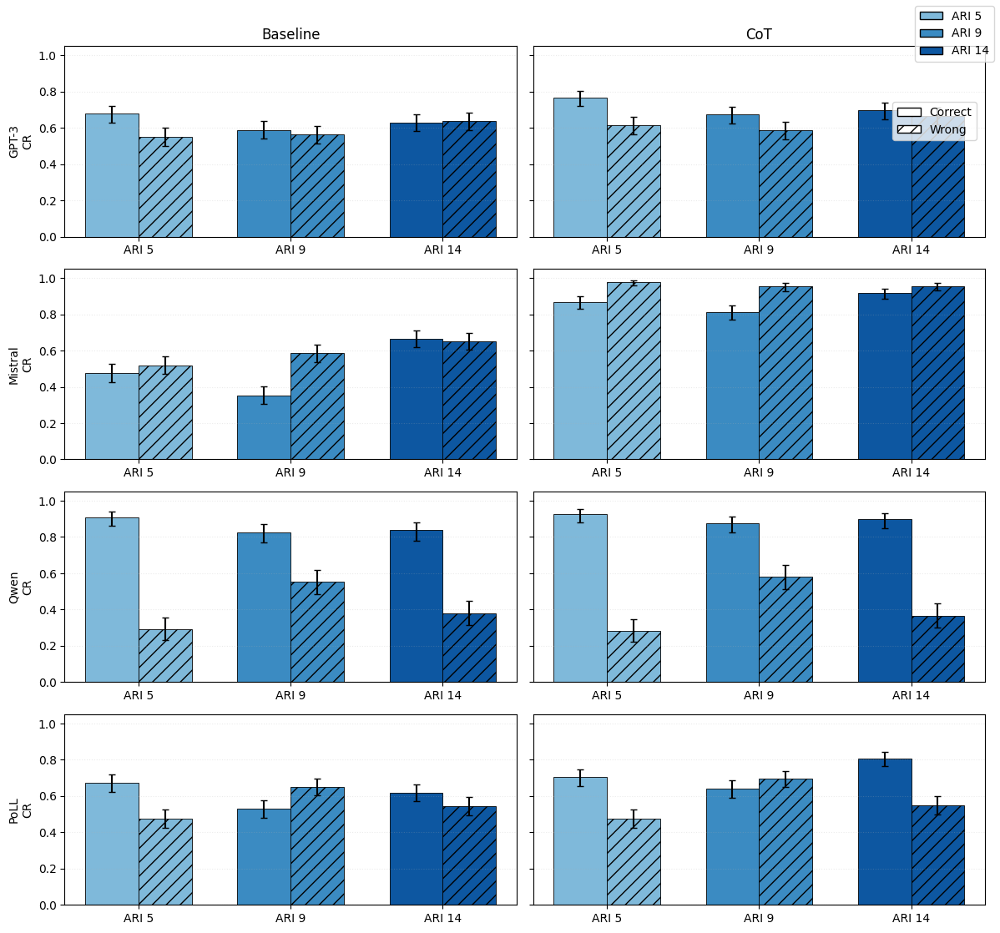

In [287]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# ---------- plotting helper (2 columns: Baseline | CoT) ----------
def plot_cr_rankbin_bargrid(
    d: pd.DataFrame,
    *,
    model_order=None,
    exp_order=("Baseline","CoT"),
    ari_order=(5, 9, 14),
    group_order=("Correct","Wrong"),
    sharey=True,
    figsize_per_row=(12, 2.8),
    title=""
):
    # Consistency Rate — rank_exact (Rows: Models, Cols: Baseline vs CoT)
    dat = d.copy()

    # standardize exp_name -> Baseline / CoT
    def _norm_exp(x: str):
        xl = str(x).strip().lower()
        if "cot" in xl:
            return "CoT"
        # everything else treated as Baseline
        return "Baseline"
    dat["exp_name"] = dat["exp_name"].map(_norm_exp)

    # compute rate if k/n provided
    if "rate" not in dat.columns and {"k","n"}.issubset(dat.columns):
        dat["rate"] = dat["k"] / dat["n"]

    # keep desired metric/groups/ARIs only
    dat = dat[
        (dat["metric"] == "rank_exact")
        & (dat["group"].isin(group_order))
        & (dat["ARI"].astype(int).isin(ari_order))
        & (dat["exp_name"].isin(exp_order))
    ].copy()
    dat["ARI"] = dat["ARI"].astype(int)

    # default model order from data
    if model_order is None:
        model_order = list(pd.unique(dat["model"]))

    n_rows, n_cols = len(model_order), 2  # Baseline | CoT
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(figsize_per_row[0], max(1, n_rows)*figsize_per_row[1]),
        sharey=sharey, squeeze=False
    )

    # colors by ARI, hatch by Correct/Wrong
    cmap = plt.get_cmap("Blues")
    ari_colors = {a: cmap(v) for a, v in zip(ari_order, np.linspace(0.45, 0.85, len(ari_order)))}
    hatch_map = {"Correct": "", "Wrong": "//"}

    def _safe_yerr(y, lo, hi):
        """Return 2x1 non-negative yerr or None."""
        if not (np.isfinite(lo) and np.isfinite(hi)):
            return None
        if lo > hi:  # swapped
            lo, hi = hi, lo
        low  = max(0.0, float(y) - float(lo))
        high = max(0.0, float(hi) - float(y))
        if low < 1e-12 and high < 1e-12:
            return None
        return np.array([[low], [high]])

    # draw
    for r, model in enumerate(model_order):
        dm = dat[dat["model"] == model]
        for c, exp in enumerate(exp_order):
            ax = axes[r, c]
            sub = dm[dm["exp_name"] == exp]

            centers = np.arange(len(ari_order))
            width = 0.35  # left: Correct, right: Wrong

            for i, a in enumerate(ari_order):
                for j, g in enumerate(group_order):
                    cell = sub[(sub["ARI"] == a) & (sub["group"] == g)]
                    if cell.empty:
                        continue

                    y = float(cell["rate"].iloc[0])
                    if {"ci_low","ci_high"}.issubset(cell.columns):
                        lo = float(cell["ci_low"].iloc[0])
                        hi = float(cell["ci_high"].iloc[0])
                        yerr = _safe_yerr(y, lo, hi)
                    else:
                        yerr = None

                    x = centers[i] + (j - 0.5) * width
                    bar = ax.bar(
                        x, y, width=width,
                        yerr=yerr, capsize=3,
                        color=ari_colors[a], edgecolor="black", linewidth=0.6
                    )[0]
                    bar.set_hatch(hatch_map.get(g, ""))

            ax.set_xticks(centers)
            ax.set_xticklabels([f"ARI {a}" for a in ari_order])
            ax.set_ylim(0, 1.05)
            ax.grid(True, axis="y", alpha=0.25, linestyle=":")

            if c == 0:
                ax.set_ylabel(f"{model}\nCR")
            if r == 0:
                ax.set_title(exp)

    # legends (ARI colors + group hatch)
    ari_handles = [Patch(facecolor=ari_colors[a], edgecolor="black", label=f"ARI {a}") for a in ari_order]
    group_handles = [Patch(facecolor="white", edgecolor="black", hatch=h, label=g) for g, h in hatch_map.items()]
    leg1 = fig.legend(ari_handles, [f"ARI {a}" for a in ari_order], loc="upper right", frameon=True)
    fig.legend(group_handles, list(hatch_map.keys()), loc="upper right", bbox_to_anchor=(0.985, 0.90), frameon=True)
    fig.suptitle(title, y=1.02, fontsize=12)
    plt.tight_layout()
    return fig, axes


# --- normalize & combine ---
def normalize(df):
    out = df.copy()
    # 1) tidy model strings (remove doublespaces/nbsp, trim)
    out["model"] = (out["model"].astype(str)
                            .str.replace(r"\s+", " ", regex=True)
                            .str.replace("\u00A0", " ")
                            .str.strip())
    # 2) collapse variants into a single row label
    out["row_model"] = (out["model"]
                            .str.replace(r"\s*(Base|CoT)$", "", regex=True)
                            .str.strip())
    
    # NEW: Convert the row_model to a consistent case (e.g., lowercase)
    out["row_model"] = out["row_model"].str.lower()
    
    # 3) normalize experiment column to 2 bins
    out["exp_name"] = out["exp_name"].apply(lambda x: "CoT" if "cot" in str(x).lower() else "Baseline")
    
    # Drop the old 'model' column to avoid conflicts
    out = out.drop(columns=["model"])
    
    return out
# ---------- build the combined DataFrame from the DataFrames you showed ----------
# You need to have these DataFrames defined in your environment, e.g.,
# cr_base_ranks_poll, cr_cot_ranks_poll, cr_base_ranks_llama, cr_cot_ranks_llama,
# cr_base_ranks, cr_cot_ranks.
# If you don't have them, you must create them first.
try:
    dfs = [
        cr_base_ranks_gpt3,
        cr_cot_ranks_gpt3,
        cr_base_ranks_mistral,
        cr_cot_ranks_mistral,
        cr_base_ranks_qwen,
        cr_cot_ranks_qwen,
        cr_base_ranks_poll,
        cr_cot_ranks_poll
        ]
except NameError:
    print("One or more of the required DataFrames (e.g., cr_base_ranks_poll) are not defined.")
    print("Please ensure you have created these pandas DataFrames before running this code.")
    exit()

df_all = pd.concat([normalize(x) for x in dfs], ignore_index=True)

# Use the normalized label for rows
df_all = df_all.rename(columns={"row_model":"model"})
model_label_map = {
    "gpt3": "GPT-3",
    "mistral": "Mistral",
    "qwen":"Qwen",
    "poll": "PoLL"
}
df_all["model"] = df_all["model"].map(model_label_map)
# (optional) sanity check — you should see each row_model with Baseline and/or CoT
print("Sanity Check: Counts of Models by Experiment Type")
print(df_all.groupby(["model","exp_name"]).size().unstack(fill_value=0))
print("\n" + "="*50 + "\n")

# # ---------- plot (Baseline column on the left, CoT on the right) ----------
# fig, axes = plot_cr_rankbin_bargrid(
#     df_all,
#     model_order=("gpt-4","llama","poll"),  # one row per logical model
#     exp_order=("Baseline","CoT"),
#     ari_order=(5, 9, 14),
#     group_order=("Correct","Wrong"),
#     title="Consistency Rate — rank_exact (Rows: Models, Cols: Baseline vs CoT)"
# )

# plt.show()

# fig.savefig("cr_rankbin_overall_grid.png", dpi=300, bbox_inches="tight")
fig, axes = plot_cr_rankbin_bargrid(
    df_all,
    model_order=("GPT-3","Mistral","Qwen","PoLL"),  # one row per logical model
    exp_order=("Baseline","CoT"),
    ari_order=(5, 9, 14),
    group_order=("Correct","Wrong"),
    title=""
)

plt.show()

In [290]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Print the complete DataFrame
print(df_all)


     exp_name mode                    metric    group  ARI    k    n  \
0    Baseline   CR          rank_bin_overall  Correct    5  324  391   
1    Baseline   CR                rank_exact  Correct    5  265  391   
2    Baseline   CR     rank_bin_top_preserve  Correct    5  276  301   
3    Baseline   CR  rank_bin_bottom_preserve  Correct    5   48   90   
4    Baseline   CR          rank_bin_overall  Correct    9  326  391   
5    Baseline   CR                rank_exact  Correct    9  230  391   
6    Baseline   CR     rank_bin_top_preserve  Correct    9  304  331   
7    Baseline   CR  rank_bin_bottom_preserve  Correct    9   22   60   
8    Baseline   CR          rank_bin_overall  Correct   14  309  391   
9    Baseline   CR                rank_exact  Correct   14  246  391   
10   Baseline   CR     rank_bin_top_preserve  Correct   14  283  307   
11   Baseline   CR  rank_bin_bottom_preserve  Correct   14   26   84   
12   Baseline   CR          rank_bin_overall    Wrong    5  314 

***Score***

In [282]:
df_mistral_score  = pd.read_csv("../resultFiles/Mistral/Default/Score/mistral_judge_score_baseline1.csv",  index_col=0)
df_qwen_score  = pd.read_csv("../resultFiles/Qwen/Default/Score/qwen32_score_baseline1.csv",  index_col=0)
df_gpt3_score = pd.read_csv("../resultFiles/GPT3/Default/Score/gpt3_judge_score_baseline.csv", index_col=0)


cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_score = compute_poll_scores_mean(
    df_mistral_score, df_qwen_score, df_gpt3_score,
    score_columns=cols
)
# poll_cot_score.head()

In [285]:
df_mistral_score_rep  = pd.read_csv("../resultFiles/Mistral/CR/Score/mistral_cr_score_baseline1.csv",  index_col=0)
df_qwen_score_rep  = pd.read_csv("../resultFiles/Qwen/CR/Score/qwen32_cr_score_baseline1.csv",  index_col=0)
df_gpt3_score_rep = pd.read_csv("../resultFiles/GPT3/CR/Score/gpt3_cr_score_baseline1.csv", index_col=0)


cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_score_rep = compute_poll_scores_mean(
    df_mistral_score_rep, df_qwen_score_rep, df_gpt3_score_rep,
    score_columns=cols
)

In [286]:
df_mistral_cot_score  = pd.read_csv("../resultFiles/Mistral/Default/Score/mistral_judge_score_cot.csv",  index_col=0)
df_qwen_cot_score  = pd.read_csv("../resultFiles/Qwen/Default/Score/qwen32_score_cot.csv",  index_col=0)
df_gpt3_cot_score = pd.read_csv("../resultFiles/GPT3/Default/Score/gpt3_judge_score_cot.csv", index_col=0)


cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_cot_score = compute_poll_scores_mean(
    df_mistral_cot_score, df_qwen_cot_score, df_gpt3_cot_score,
    score_columns=cols
)
# poll_cot_score.head()

In [289]:
df_mistral_cot_score_rep  = pd.read_csv("../resultFiles/Mistral/CR/Score/mistral_cr_score_cot.csv",  index_col=0)
df_qwen_cot_score_rep  = pd.read_csv("../resultFiles/Qwen/CR/Score/qwen32_cr_score_cot.csv",  index_col=0)
df_gpt3_cot_score_rep = pd.read_csv("../resultFiles/GPT3/CR/Score/gpt3_cr_score_cot.csv", index_col=0)


cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_cot_score_rep = compute_poll_scores_mean(
    df_mistral_cot_score_rep, df_qwen_cot_score_rep, df_gpt3_cot_score_rep,
    score_columns=cols
)
# poll_cot_score.head()

In [290]:
cr_base_scores_poll = cr_pointwise_df("PoLL", "baseline", poll_score, poll_score_rep, eps=1.0)

cr_cot_scores_poll = cr_pointwise_df("PoLL", "cot", poll_cot_score, poll_cot_score_rep, eps=1.0)

[0. 0. 0. 0. 1. 1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 0. 0. 0. 2. 0. 0. 0. 0. 1.
 0. 0. 3. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 3.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 1. 1. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.
 2. 0. 0. 1. 0. 0. 0. 0. 0. 2. 0. 0. 0. 1. 0. 0. 0. 0. 3. 0. 3. 0. 0. 0.
 1. 0. 0. 3. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 2. 1. 0. 0. 0. 0. 0.
 3. 3. 0. 0. 0. 1. 0. 0. 3. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 1. 0. 0. 1. 0. 0. 0. 0. 0. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 2.
 0. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 2. 0. 1. 0. 1.
 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 1. 1. 0. 0. 1. 3. 2. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 2. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 1. 2. 0. 0. 0. 1.

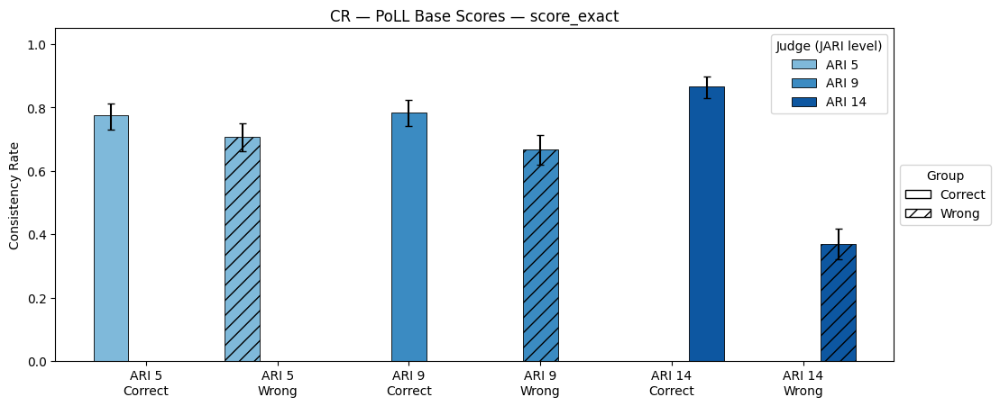

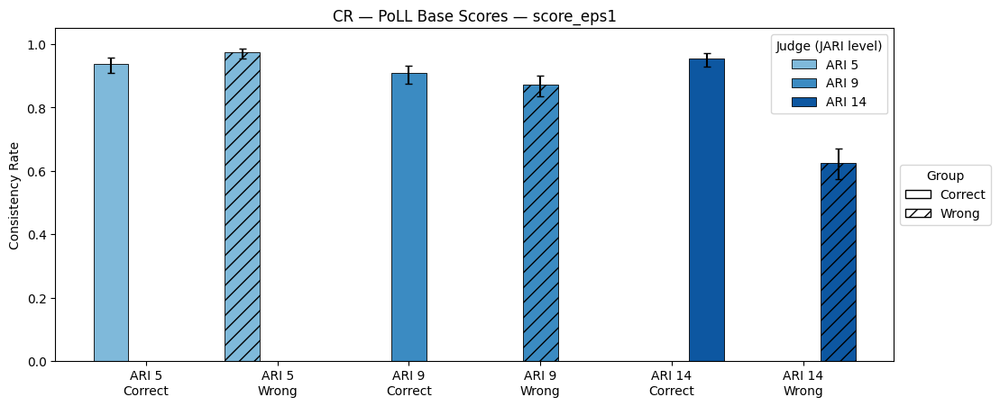

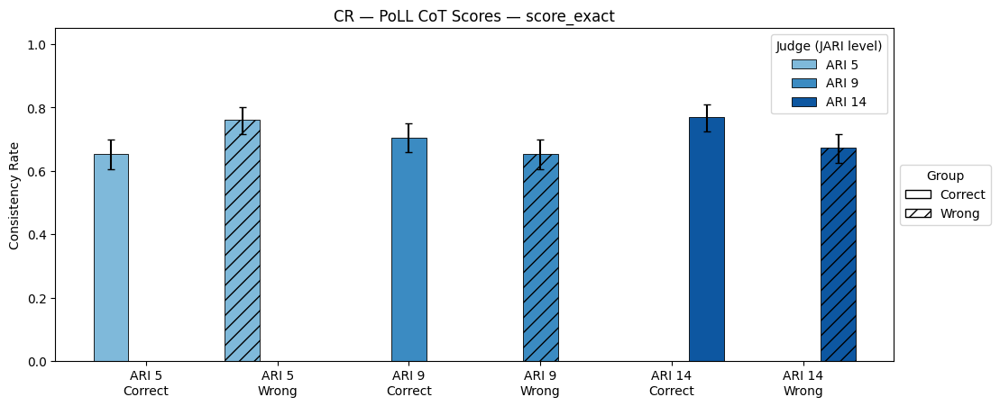

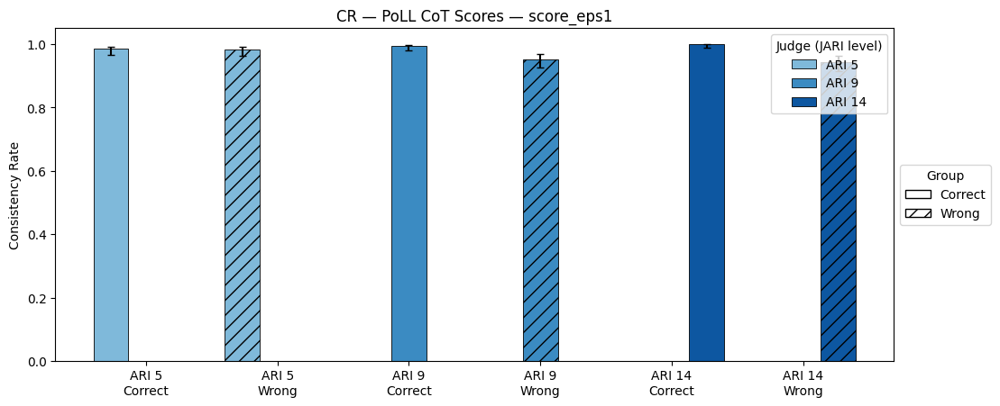

In [291]:
# CoT scores (pointwise), each as its own figure
score_metrics = ["score_exact", "score_eps1"]
 

for m in score_metrics:
    ax = plot_rr_style_cr_blues(
        cr_base_scores_poll,                 # your CoT dataframe
        metric=m,
        legend_col="ARI",              # or "jari" if present
        ari_order=(5, 9, 14),
        group_order=("Correct", "Wrong"),
        title=f"CR — PoLL Base Scores — {m}",
        ax=None
    )
    plt.show()

for m in score_metrics:
    ax = plot_rr_style_cr_blues(
        cr_cot_scores_poll,                 # your CoT dataframe
        metric=m,
        legend_col="ARI",              # or "jari" if present
        ari_order=(5, 9, 14),
        group_order=("Correct", "Wrong"),
        title=f"CR — PoLL CoT Scores — {m}",
        ax=None
    )
    plt.show()


# CR graph consolidation

In [205]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_cr_linegrid(
    df: pd.DataFrame,
    *,
    metrics=("score_eps1", "rank_bin_overall"),
    model_order=None,                 # e.g., ("GPT-4 Base","GPT-4 CoT","Llama-3","Mistral","Qwen")
    ari_order=(5, 9, 14),
    group_order=("Correct", "Wrong"),
    figsize_per_row=(12, 2.8),
    sharey=True,
    title="Consistency Rate (CR) across Readability Levels",
):
    d = df.copy()

    # compute rate if (k,n) given
    if "rate" not in d.columns and {"k","n"}.issubset(d.columns):
        d["rate"] = d["k"] / d["n"]

    # normalize types
    d["ARI"] = d["ARI"].astype(int)
    d = d[d["ARI"].isin(ari_order) & d["group"].isin(group_order) & d["metric"].isin(metrics)].copy()

    # default model order from data if not provided
    if model_order is None:
        model_order = list(pd.unique(d["model"]))
    n_rows = len(model_order)
    n_cols = len(metrics)

    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(figsize_per_row[0], figsize_per_row[1]*max(1,n_rows)),
        sharey=sharey,
        squeeze=False
    )
    marker_map = {"Correct": "o", "Wrong": "s"}
    ls_map = {"Correct": "-", "Wrong": "--"}

    for r, model in enumerate(model_order):
        dm = d[d["model"] == model]
        for c, metric in enumerate(metrics):
            ax = axes[r, c]
            sub = dm[dm["metric"] == metric]

            for group in group_order:
                g = sub[sub["group"] == group]
                # ensure x order
                g = g.set_index("ARI").reindex(ari_order).reset_index()
                y = g["rate"].to_numpy(dtype=float)
                x = np.arange(len(ari_order))

                # yerr (if provided)
                yerr = None
                if {"ci_low","ci_high"}.issubset(g.columns):
                    low = (y - g["ci_low"].to_numpy(dtype=float))
                    high = (g["ci_high"].to_numpy(dtype=float) - y)
                    yerr = np.vstack([low, high])

                ax.errorbar(
                    x, y, yerr=yerr,
                    marker=marker_map.get(group, "o"),
                    linestyle=ls_map.get(group, "-"),
                    linewidth=1.8, capsize=3, ms=5, label=group
                )

            ax.set_xticks(np.arange(len(ari_order)))
            ax.set_xticklabels([f"ARI {a}" for a in ari_order])
            ax.set_ylim(0, 1.05)
            if c == 0:
                ax.set_ylabel(f"{model}\nCR")
            if r == 0:
                nice = "Score (±1)" if metric == "score_eps1" else metric.replace("_", " ").title()
                ax.set_title(nice)

            ax.grid(True, axis="y", alpha=0.25, linestyle=":")

    # one shared legend
    handles, labels = axes[0,0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="upper right", ncol=len(group_order), frameon=True)

    fig.suptitle(title, y=1.02, fontsize=12)
    plt.tight_layout()
    return fig, axes



In [ ]:
# ---------- Example preparation ----------
# Concatenate your existing CR tables and tag model names:
cr_base_scores['model'] = "GPT-4 Base";  cr_cot_scores['model'] = "GPT-4 CoT"
cr_llama_ranks['model'] = "Llama-3";    cr_mistral_ranks['model'] = "Mistral"; ...
df_all = pd.concat([cr_base_scores, cr_cot_scores, cr_llama_ranks, cr_mistral_ranks, ...], ignore_index=True)

fig, axes = plot_cr_linegrid(
    df_all,
    metrics=("score_eps1","rank_bin_overall"),
    model_order=("GPT-4 Base","GPT-4 CoT","Llama-3","Mistral","Qwen"),
    ari_order=(5,9,14),
    group_order=("Correct","Wrong"),
    title="Consistency Rate across Readability (Primary metrics)"
)
plt.show()


# RR graphs consolidation

GRaphs 

In [100]:
import re
import pandas as pd

# ---- your inputs (already created) ----
# frames_poll, frames_poll_cot
# frames_llama, frames_llama_cot
# frames (GPT-4 baseline), frames_cot (GPT-4 CoT)

def _jari_from_key(key):
    m = re.search(r'(\d+)', str(key))
    return int(m.group(1)) if m else None

def stack_rr_frames(frames_list, model_label, prompt_label):
    """
    frames_list: list of (key, df) where key is 'JARI5' / 'JARI9' / 'JARI14'
    Adds columns: model, prompt, JARI (int). Returns concatenated df.
    """
    dfs = []
    for key, df in frames_list:
        df = df.copy()
        df['model']  = model_label
        df['prompt'] = prompt_label
        # normalize JARI column
        if 'JARI' not in df.columns and 'jari' not in df.columns:
            df['JARI'] = _jari_from_key(key)
        else:
            df = df.rename(columns={'jari':'JARI'})
        # make sure the essential columns are there
        keep = ['model','prompt','JARI','mode','metric','group','ARI','k','n','rate','ci_low','ci_high']
        for c in keep:
            if c not in df.columns:
                raise ValueError(f"Missing column {c} in {model_label}-{prompt_label}-{key}")
        dfs.append(df[keep])
    return pd.concat(dfs, ignore_index=True)

# ---- build per-model per-prompt data ----
df_gpt_base = stack_rr_frames(frames,          model_label='GPT-4', prompt_label='baseline')
df_gpt_cot  = stack_rr_frames(frames_cot,      model_label='GPT-4', prompt_label='cot')

df_llm_base = stack_rr_frames(frames_llama,    model_label='LLaMA', prompt_label='baseline')
df_llm_cot  = stack_rr_frames(frames_llama_cot,model_label='LLaMA', prompt_label='cot')

df_poll_base= stack_rr_frames(frames_poll,     model_label='PoLL',  prompt_label='baseline')
df_poll_cot = stack_rr_frames(frames_poll_cot, model_label='PoLL',  prompt_label='cot')

# ---- final long-form dataframe ----
df_rr = pd.concat([df_gpt_base, df_gpt_cot,
                   df_llm_base, df_llm_cot,
                   df_poll_base, df_poll_cot], ignore_index=True)

# (optional) sanity: keep only RR rows
df_rr = df_rr[df_rr['mode'].str.upper() == 'RR'].copy()
df_rr['group'] = df_rr['group'].str.title()   # 'Correct' / 'Wrong'


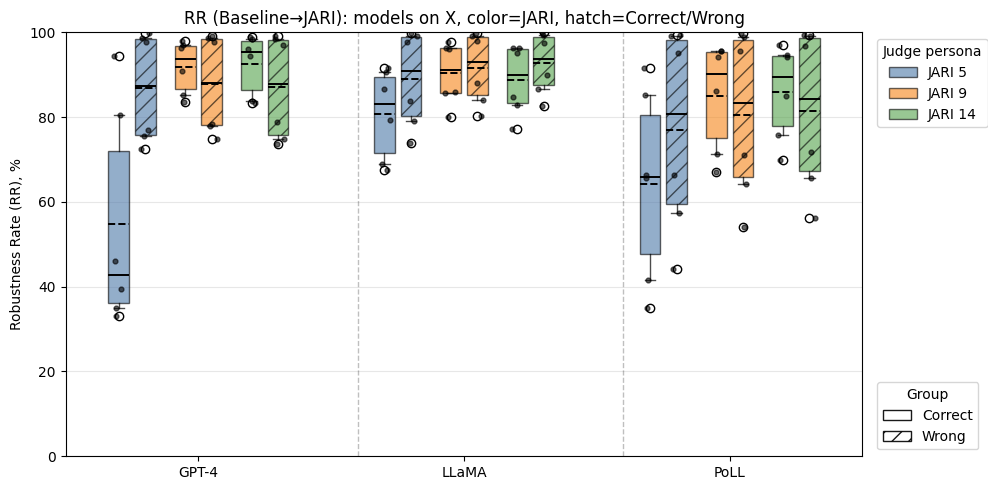

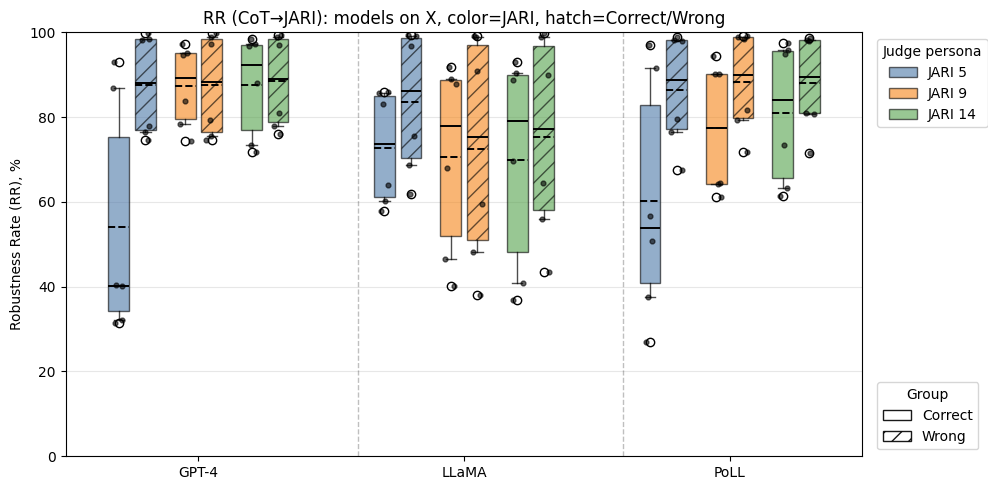

In [101]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

def plot_rr_by_model_box(df_rr, prompt='baseline',
                         models_order=('GPT-4','LLaMA','PoLL'),
                         jari_levels=(5,9,14),
                         use_metrics=('rank_exact','rank_bin_overall'),
                         title=None, savepath=None):
    d = df_rr.copy()
    d = d[(d['prompt']==prompt) &
          (d['metric'].isin(use_metrics)) &
          (d['JARI'].isin(jari_levels)) &
          (d['group'].isin(['Correct','Wrong']))]
    d['rate_pct'] = d['rate'] * 100.0

    # layout
    fig, ax = plt.subplots(figsize=(12.5, 5.0))
    base_gap, jari_step, group_step, box_w = 1.8, 0.45, 0.18, 0.14

    # consistent colors for JARI
    color_map = {5:'#4C78A8', 9:'#F58518', 14:'#54A24B'}  # blue, orange, green
    hatch_map = {'Correct':'', 'Wrong':'//'}

    # vertical separators
    for i in range(len(models_order)-1):
        ax.axvline((i+1)*base_gap - (base_gap/2.5), color='k', ls='--', lw=1, alpha=0.25)

    x_ticks, x_labels = [], []
    jari_seen, group_seen = {}, {}

    for mi, model in enumerate(models_order):
        base_x = mi * base_gap
        x_ticks.append(base_x); x_labels.append(model)

        for ji, jari in enumerate(jari_levels):
            for gi, grp in enumerate(['Correct','Wrong']):
                vals = d[(d['model']==model) & (d['JARI']==jari) & (d['group']==grp)]['rate_pct'].dropna().values
                if vals.size == 0: continue

                pos = base_x + (ji - (len(jari_levels)-1)/2)*jari_step + (gi-0.5)*group_step
                bp = ax.boxplot([vals], positions=[pos], widths=box_w, patch_artist=True,
                                showmeans=True, meanline=True, whis=(5,95))
                for patch in bp['boxes']:
                    patch.set_facecolor(color_map[jari]); patch.set_alpha(0.6)
                    patch.set_hatch(hatch_map[grp])
                    if jari not in jari_seen:
                        jari_seen[jari] = Patch(facecolor=color_map[jari], edgecolor='k', alpha=0.6, label=f'JARI {jari}')
                    if grp not in group_seen:
                        group_seen[grp] = Patch(facecolor='white', edgecolor='k', hatch=hatch_map[grp], label=grp, alpha=0.9)

                for med in bp['medians']: med.set_color('k'); med.set_linewidth(1.4)
                for whisk in bp['whiskers']: whisk.set_color('k'); whisk.set_alpha(0.7)
                for cap in bp['caps']: cap.set_color('k'); cap.set_alpha(0.7)
                for mn in bp['means']: mn.set_color('k'); mn.set_linewidth(1.4)

                jitter = (np.random.rand(vals.size)-0.5)*(box_w*0.6)
                ax.scatter(np.full(vals.size, pos)+jitter, vals, s=12, c='k', alpha=0.6, zorder=3)

    ax.set_xticks(x_ticks); ax.set_xticklabels(x_labels)
    ax.set_xlim(min(x_ticks)-base_gap*0.5, max(x_ticks)+base_gap*0.5)
    ax.set_ylim(0, 100)
    ax.set_ylabel("Robustness Rate (RR), %")
    if title is None:
        title = f"RR — {prompt.capitalize()} → ARI-persona • color=JARI • hatch=Group"
    ax.set_title(title)
    ax.grid(axis='y', alpha=0.3)

    # legends outside
    leg1 = ax.legend(handles=[jari_seen[k] for k in sorted(jari_seen.keys())],
                     title="Judge persona", loc='upper left',
                     bbox_to_anchor=(1.01, 1.0), frameon=True)
    ax.add_artist(leg1)
    ax.legend(handles=[group_seen[g] for g in ['Correct','Wrong'] if g in group_seen],
              title="Group", loc='lower left', bbox_to_anchor=(1.01, 0.0), frameon=True)

    plt.tight_layout(rect=[0,0,0.80,1])
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()

# ---- call once per prompt (you said “separate diagram for normal and CoT”) ----
plot_rr_by_model_box(df_rr, prompt='baseline',
                     models_order=['GPT-4','LLaMA','PoLL'],
                     title="RR (Baseline→JARI): models on X, color=JARI, hatch=Correct/Wrong",
                     savepath="figs/rr_models_baseline.pdf")

plot_rr_by_model_box(df_rr, prompt='cot',
                     models_order=['GPT-4','LLaMA','PoLL'],
                     title="RR (CoT→JARI): models on X, color=JARI, hatch=Correct/Wrong",
                     savepath="figs/rr_models_cot.pdf")


In [49]:
import re
import pandas as pd

def _jari_from_key(key):
    m = re.search(r'(\d+)', str(key))
    return int(m.group(1)) if m else None

def stack_rr_frames(frames_list, model_label, prompt_label):
    dfs = []
    for key, df in frames_list:
        d = df.copy()
        d['model']  = model_label
        d['prompt'] = prompt_label
        d['JARI']   = _jari_from_key(key) if 'JARI' not in d.columns and 'jari' not in d.columns else d.get('JARI', d['jari'])
        d = d.rename(columns={'jari':'JARI'})
        keep = ['model','prompt','JARI','mode','metric','group','ARI','k','n','rate','ci_low','ci_high']
        dfs.append(d[keep])
    return pd.concat(dfs, ignore_index=True)

# Your inputs (already defined in your notebook):
# frames_poll, frames_poll_cot, frames_llama, frames_llama_cot, frames (GPT-4 base), frames_cot (GPT-4 CoT)

df_gpt_base = stack_rr_frames(frames,           'GPT-4', 'baseline')
df_gpt_cot  = stack_rr_frames(frames_cot,       'GPT-4', 'cot')
df_llm_base = stack_rr_frames(frames_llama,     'LLaMA', 'baseline')
df_llm_cot  = stack_rr_frames(frames_llama_cot, 'LLaMA', 'cot')
df_pol_base = stack_rr_frames(frames_poll,      'PoLL',  'baseline')
df_pol_cot  = stack_rr_frames(frames_poll_cot,  'PoLL',  'cot')

df_rr = pd.concat([df_gpt_base, df_gpt_cot, df_llm_base, df_llm_cot, df_pol_base, df_pol_cot], ignore_index=True)
df_rr = df_rr[df_rr['mode'].str.upper()=='RR'].copy()
df_rr['group'] = df_rr['group'].str.title()  # 'Correct'/'Wrong'


In [138]:
frames_qwen

[('JARI5',
     model             exp_name mode            metric    group  ARI    k    n  \
  0   Qwen  Qwen-JARI5-baseline   RR  rank_bin_overall  Correct    5  323  360   
  1   Qwen  Qwen-JARI5-baseline   RR        rank_exact  Correct    5  184  360   
  2   Qwen  Qwen-JARI5-baseline   RR  rank_bin_overall  Correct    9  297  359   
  3   Qwen  Qwen-JARI5-baseline   RR        rank_exact  Correct    9  172  359   
  4   Qwen  Qwen-JARI5-baseline   RR  rank_bin_overall  Correct   14  250  359   
  5   Qwen  Qwen-JARI5-baseline   RR        rank_exact  Correct   14  168  359   
  6   Qwen  Qwen-JARI5-baseline   RR  rank_bin_overall    Wrong    5  340  359   
  7   Qwen  Qwen-JARI5-baseline   RR        rank_exact    Wrong    5  141  359   
  8   Qwen  Qwen-JARI5-baseline   RR  rank_bin_overall    Wrong    9  355  359   
  9   Qwen  Qwen-JARI5-baseline   RR        rank_exact    Wrong    9  226  359   
  10  Qwen  Qwen-JARI5-baseline   RR  rank_bin_overall    Wrong   14  357  359   
  11 

In [125]:
df_mistral_base = stack_rr_frames(frames_mistral,           'Mistral', 'baseline')
df_mitral_cot  = stack_rr_frames(frames_mistral_cot,       'Mistral', 'cot')
df_qwen_base = stack_rr_frames(frames_qwen,     'Qwen', 'baseline')
df_qwen_cot  = stack_rr_frames(frames_qwen_cot, 'Qwen', 'cot')
df_gpt3_base = stack_rr_frames(frames_gpt3,      'GPT3',  'baseline')
df_gpt3_cot  = stack_rr_frames(frames_gpt3_cot,  'GPT3',  'cot')

df_rr_ensemble = pd.concat([df_qwen, df_qwen_cot, df_mistral, df_mistral_cot, df_gpt3_base, df_gpt3_cot,df_pol_base,df_pol_cot], ignore_index=True)
df_rr_ensemble = df_rr_ensemble[df_rr_ensemble['mode'].str.upper()=='RR'].copy()
df_rr_ensemble['group'] = df_rr_ensemble['group'].str.title()

In [151]:
df_gpt3_base

,model,prompt,mode,metric,group,ARI,JARI,k,n,rate,ci_low,ci_high,exp_name
0,gpt-3,baseline,RR,rank_bin_overall,Correct,5,5,286,391,0.731458,0.685432,0.772980,GPT3-JARI5-baseline
1,gpt-3,baseline,RR,rank_exact,Correct,5,5,203,391,0.519182,0.469713,0.568277,GPT3-JARI5-baseline
2,gpt-3,baseline,RR,rank_bin_overall,Correct,9,5,293,391,0.749361,0.704119,0.789750,GPT3-JARI5-baseline
3,gpt-3,baseline,RR,rank_exact,Correct,9,5,138,391,0.352941,0.307213,0.401530,GPT3-JARI5-baseline
4,gpt-3,baseline,RR,rank_bin_overall,Correct,14,5,286,391,0.731458,0.685432,0.772980,GPT3-JARI5-baseline
5,gpt-3,baseline,RR,rank_exact,Correct,14,5,145,391,0.370844,0.324440,0.419761,GPT3-JARI5-baseline
6,gpt-3,baseline,RR,rank_bin_overall,Wrong,5,5,318,391,0.813299,0.771695,0.848807,GPT3-JARI5-baseline
7,gpt-3,baseline,RR,rank_exact,Wrong,5,5,171,391,0.437340,0.389017,0.486883,GPT3-JARI5-baseline
8,gpt-3,baseline,RR,rank_bin_overall,Wrong,9,5,383,391,0.979540,0.960152,0.989597,GPT3-JARI5-baseline
9,gpt-3,baseline,RR,rank_exact,Wrong,9,5,176,391,0.450128,0.401538,0.499688,GPT3-JARI5-baseline


In [126]:
df_rr_ensemble

,Rank_Ref,Rank_ARI_5,Rank_ARI_9,Rank_ARI_14,Rank_Wrong_Answer_ARI_5,Rank_Wrong_Answer_ARI_9,Rank_Wrong_Answer_ARI_14,model,prompt,JARI,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
391,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Qwen,cot,5.0,RR,rank_bin_overall,Correct,5.0,269.0,294.0,0.914966,0.877487,0.941741
392,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Qwen,cot,5.0,RR,rank_exact,Correct,5.0,145.0,294.0,0.493197,0.436506,0.550064
393,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Qwen,cot,5.0,RR,rank_bin_overall,Correct,9.0,274.0,294.0,0.931973,0.897268,0.955535
394,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Qwen,cot,5.0,RR,rank_exact,Correct,9.0,145.0,294.0,0.493197,0.436506,0.550064
395,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Qwen,cot,5.0,RR,rank_bin_overall,Correct,14.0,171.0,294.0,0.581633,0.524548,0.636612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1348,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PoLL,cot,14.0,RR,rank_exact,Wrong,5.0,280.0,391.0,0.716113,0.669487,0.758533
1349,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PoLL,cot,14.0,RR,rank_bin_overall,Wrong,9.0,383.0,391.0,0.979540,0.960152,0.989597
1350,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PoLL,cot,14.0,RR,rank_exact,Wrong,9.0,316.0,391.0,0.808184,0.766234,0.844137
1351,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PoLL,cot,14.0,RR,rank_bin_overall,Wrong,14.0,386.0,391.0,0.987212,0.970418,0.994526


In [267]:
df_rr

,model,prompt,JARI,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,GPT-4,baseline,5,RR,rank_bin_overall,Correct,5,369,391,0.943734,0.916281,0.962552
1,GPT-4,baseline,5,RR,rank_exact,Correct,5,137,391,0.350384,0.304758,0.398920
2,GPT-4,baseline,5,RR,rank_bin_overall,Correct,9,315,391,0.805627,0.763508,0.841798
3,GPT-4,baseline,5,RR,rank_exact,Correct,9,129,391,0.329923,0.285171,0.377985
4,GPT-4,baseline,5,RR,rank_bin_overall,Correct,14,180,391,0.460358,0.411579,0.509908
...,...,...,...,...,...,...,...,...,...,...,...,...
211,PoLL,cot,14,RR,rank_exact,Wrong,5,280,391,0.716113,0.669487,0.758533
212,PoLL,cot,14,RR,rank_bin_overall,Wrong,9,383,391,0.979540,0.960152,0.989597
213,PoLL,cot,14,RR,rank_exact,Wrong,9,316,391,0.808184,0.766234,0.844137
214,PoLL,cot,14,RR,rank_bin_overall,Wrong,14,386,391,0.987212,0.970418,0.994526


In [ ]:
# (optional) sanity: keep only RR rows
df_rr_ensemble = df_rr[df_rr['mode'].str.upper() == 'RR'].copy()
df_rr['group'] = df_rr['group'].str.title()   # 'Correct' / 'Wrong'

In [ ]:
df_rr = pd.concat([df_gpt_base, df_gpt_cot, df_llm_base, df_llm_cot, df_pol_base, df_pol_cot], ignore_index=True)

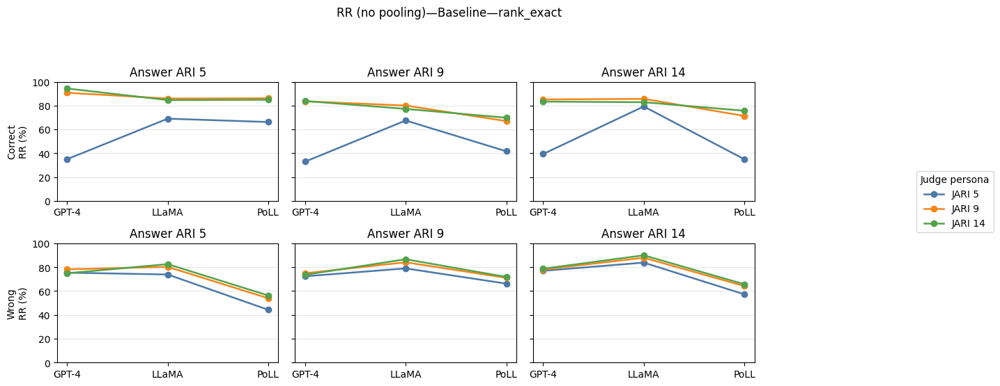

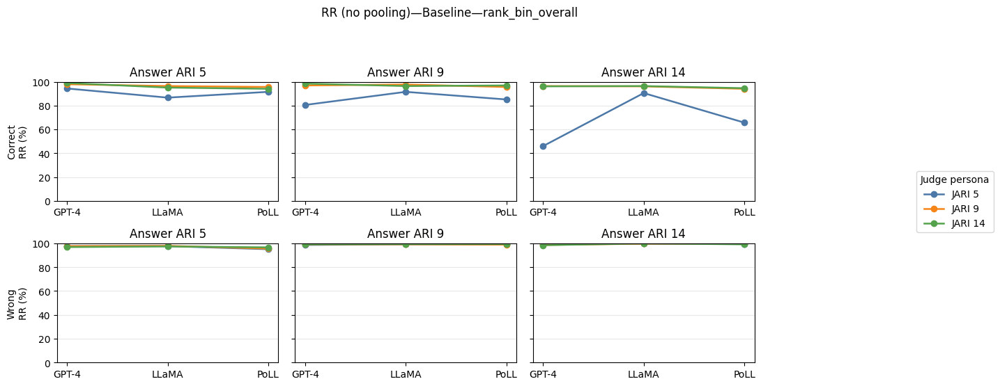

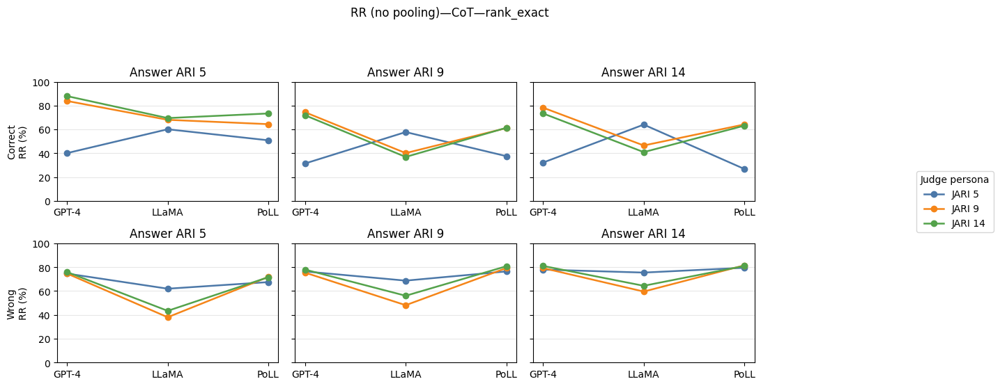

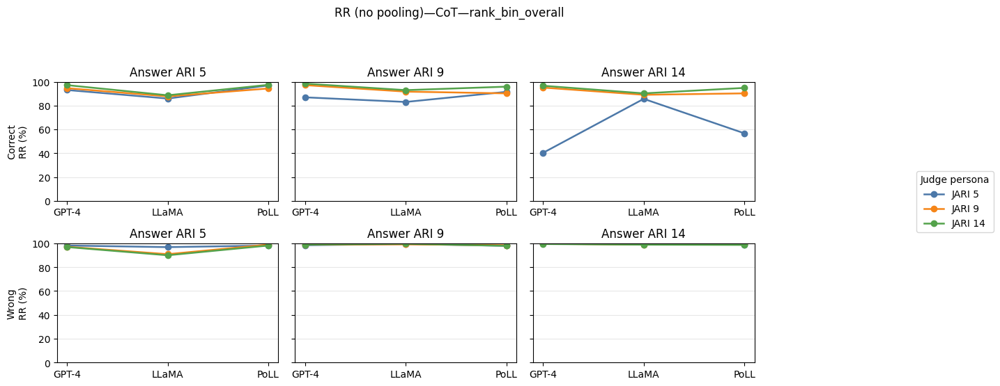

In [266]:
import numpy as np
import matplotlib.pyplot as plt

def plot_rr_small_multiples(df_rr, prompt='baseline', metric='rank_exact',
                            models_order=('GPT-4','LLaMA','PoLL'),
                            jari_levels=(5,9,14), ari_levels=(5,9,14),
                            title=None, savepath=None):
    d = df_rr.copy()
    d = d[(d['prompt']==prompt) &
          (d['metric']==metric) &
          (d['JARI'].isin(jari_levels)) &
          (d['ARI'].isin(ari_levels)) &
          (d['group'].isin(['Correct','Wrong']))]

    color_map = {5:'#4C78A8', 9:'#F58518', 14:'#54A24B'}
    groups = ['Correct','Wrong']
    nrows, ncols = len(groups), len(ari_levels)

    if title is None:
        title = f"RR (no pooling) — {prompt.capitalize()} — metric={metric}"

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(13, 5.4), sharey=True)
    axes = np.atleast_2d(axes)

    for r, grp in enumerate(groups):
        for c, ari in enumerate(ari_levels):
            ax = axes[r, c]
            # For each JARI persona, plot the line across models
            for jari in jari_levels:
                sub = d[(d['group']==grp) & (d['ARI']==ari) & (d['JARI']==jari)]
                y = []
                for m in models_order:
                    row = sub[sub['model']==m]
                    if not row.empty:
                        y.append(float(row.iloc[0]['rate'])*100.0)
                    else:
                        y.append(np.nan)
                ax.plot(range(len(models_order)), y, marker='o', linewidth=1.8,
                        color=color_map[jari], label=f'JARI {jari}')

            ax.set_xticks(range(len(models_order)))
            ax.set_xticklabels(models_order, rotation=0)
            ax.set_ylim(0, 100)
            if c==0: ax.set_ylabel(f"{grp}\nRR (%)")
            ax.set_title(f"Answer ARI {ari}")
            ax.grid(axis='y', alpha=0.3)

    # one legend for the whole figure
    handles = [plt.Line2D([0],[0], color=color_map[j], marker='o', lw=1.8, label=f'JARI {j}') for j in jari_levels]
    fig.legend(handles=handles, title="Judge persona", loc='center left', bbox_to_anchor=(1.01, 0.5))
    fig.suptitle(title, y=1.02)
    plt.tight_layout(rect=[0,0,0.85,0.95])
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()

# --- Make four figures (no pooling) ---
plot_rr_small_multiples(df_rr, prompt='baseline', metric='rank_exact',
                        title="RR (no pooling)—Baseline—rank_exact",
                        savepath="figs/rr_nopool_baseline_rank_exact.pdf")

plot_rr_small_multiples(df_rr, prompt='baseline', metric='rank_bin_overall',
                        title="RR (no pooling)—Baseline—rank_bin_overall",
                        savepath="figs/rr_nopool_baseline_rank_bin.pdf")

plot_rr_small_multiples(df_rr, prompt='cot', metric='rank_exact',
                        title="RR (no pooling)—CoT—rank_exact",
                        savepath="figs/rr_nopool_cot_rank_exact.pdf")

plot_rr_small_multiples(df_rr, prompt='cot', metric='rank_bin_overall',
                        title="RR (no pooling)—CoT—rank_bin_overall",
                        savepath="figs/rr_nopool_cot_rank_bin.pdf")


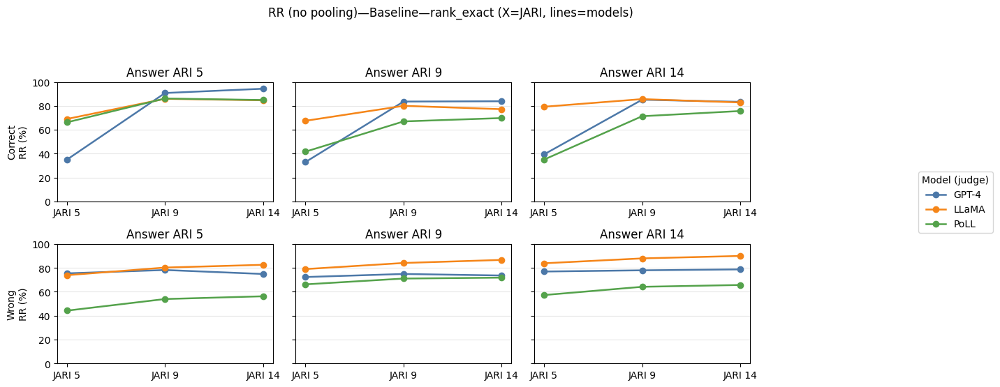

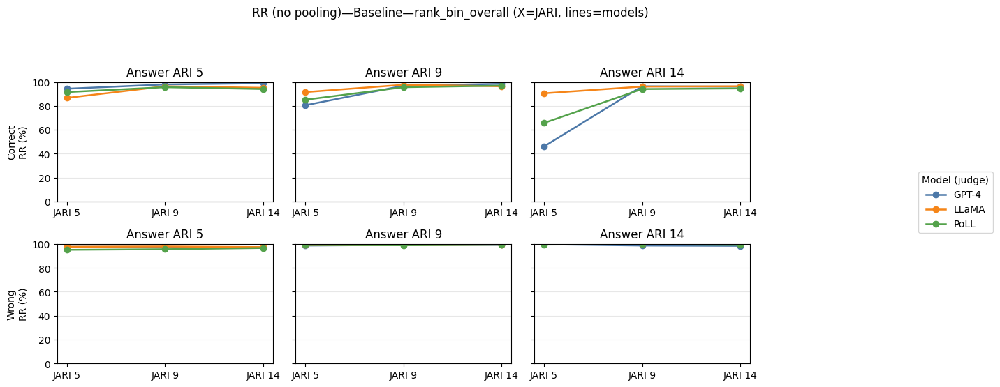

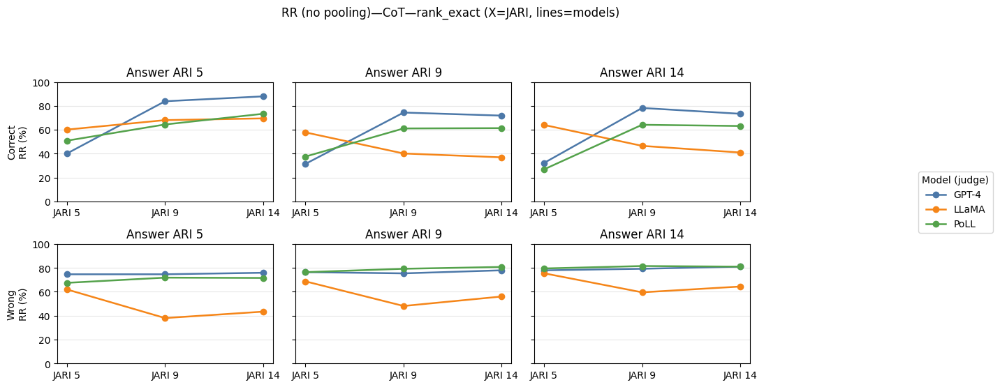

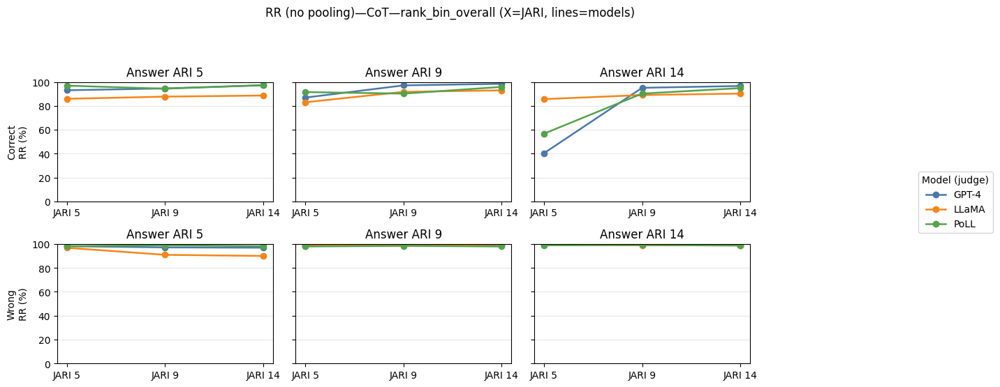

In [268]:
import numpy as np
import matplotlib.pyplot as plt

def plot_rr_small_multiples_swapped(df_rr, *,
                                    prompt='baseline', metric='rank_exact',
                                    models_order=('GPT-4','LLaMA','PoLL'),
                                    jari_levels=(5,9,14), ari_levels=(5,9,14),
                                    title=None, savepath=None):
    """
    Small multiples:
      rows = group (Correct/Wrong)
      cols = Answer ARI (5/9/14)
      X-axis = JARI personas (5/9/14)
      lines = models (GPT-4 / LLaMA / PoLL)
    """
    d = df_rr.copy()
    d['prompt'] = d['prompt'].astype(str).str.lower()
    d = d[(d['prompt'] == str(prompt).lower())
          & (d['metric'] == metric)
          & (d['JARI'].isin(jari_levels))
          & (d['ARI'].isin(ari_levels))
          & (d['group'].isin(['Correct','Wrong']))]

    # colors by model (feel free to tweak)
    model_colors = {
        'GPT-4':  '#4C78A8',
        'LLaMA':  '#F58518',
        'PoLL':   '#54A24B',
    }
    # fall back if a name isn't in the dict
    for m in models_order:
        model_colors.setdefault(m, None)

    groups = ['Correct','Wrong']
    nrows, ncols = len(groups), len(ari_levels)

    if title is None:
        title = f"RR (no pooling) — {prompt.capitalize()} — metric={metric}"

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(13, 5.4), sharey=True)
    axes = np.atleast_2d(axes)

    for r, grp in enumerate(groups):
        for c, ari in enumerate(ari_levels):
            ax = axes[r, c]
            # one line per model, X = JARI personas
            for m in models_order:
                sub = d[(d['group']==grp) & (d['ARI']==ari) & (d['model']==m)]
                y = []
                for j in jari_levels:
                    row = sub[sub['JARI']==j]
                    y.append(float(row.iloc[0]['rate'])*100.0 if not row.empty else np.nan)

                ax.plot(range(len(jari_levels)), y, marker='o', linewidth=1.8,
                        label=m, color=model_colors[m])

            ax.set_xticks(range(len(jari_levels)))
            ax.set_xticklabels([f'JARI {j}' for j in jari_levels], rotation=0)
            ax.set_ylim(0, 100)
            if c == 0:
                ax.set_ylabel(f"{grp}\nRR (%)")
            ax.set_title(f"Answer ARI {ari}")
            ax.grid(axis='y', alpha=0.3)

    # one legend for the whole figure (models)
    handles = [plt.Line2D([0],[0], marker='o', lw=1.8,
                          label=m, color=model_colors[m]) for m in models_order]
    fig.legend(handles=handles, title="Model (judge)", loc='center left', bbox_to_anchor=(1.01, 0.5))

    fig.suptitle(title, y=1.02)
    plt.tight_layout(rect=[0,0,0.85,0.95])
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()

# --- Use it (same four figures, but with swapped axes/lines) ---
plot_rr_small_multiples_swapped(df_rr, prompt='baseline', metric='rank_exact',
                                title="RR (no pooling)—Baseline—rank_exact (X=JARI, lines=models)",
                                savepath="figs/rr_nopool_baseline_rank_exact_swapped.pdf")

plot_rr_small_multiples_swapped(df_rr, prompt='baseline', metric='rank_bin_overall',
                                title="RR (no pooling)—Baseline—rank_bin_overall (X=JARI, lines=models)",
                                savepath="figs/rr_nopool_baseline_rank_bin_swapped.pdf")

plot_rr_small_multiples_swapped(df_rr, prompt='cot', metric='rank_exact',
                                title="RR (no pooling)—CoT—rank_exact (X=JARI, lines=models)",
                                savepath="figs/rr_nopool_cot_rank_exact_swapped.pdf")

plot_rr_small_multiples_swapped(df_rr, prompt='cot', metric='rank_bin_overall',
                                title="RR (no pooling)—CoT—rank_bin_overall (X=JARI, lines=models)",
                                savepath="figs/rr_nopool_cot_rank_bin_swapped.pdf")


In [269]:
import numpy as np
import matplotlib.pyplot as plt

def plot_rr_jari_x_models_lines(
    df_rr,
    *,
    prompt="baseline",
    metric="rank_bin_overall",
    models=("gpt-3", "Qwen", "Mistral", "PoLL"),
    jari_levels=(5, 9, 14),
    ari_levels=(5, 9, 14),
    groups=("Correct","Wrong"),
    title=None,
    show_ci=False,          # turn on to draw CIs around markers
    savepath=None
):
    d = df_rr.copy()

    # keep RR rows if mode present
    if "mode" in d.columns:
        d = d[d["mode"].str.upper() == "RR"]

    d = d[
        (d["prompt"] == prompt)
        & (d["metric"] == metric)
        & (d["JARI"].isin(jari_levels))
        & (d["ARI"].isin(ari_levels))
        & (d["group"].isin(groups))
        & (d["model"].isin(models))
    ].copy()

    # nice defaults
    if title is None:
        title = f"RR — {prompt.capitalize()} — {metric} (x=JARI, lines=Judge)"

    # consistent model colors
    model_colors = {
        "gpt-3":   "#4C78A8",
        "Qwen":    "#F58518",
        "Mistral": "#54A24B",
        "PoLL":    "#B279A2",
        "Ensemble":"#72B7B2",
    }
    # fall back if any model not in the palette
    fallback = plt.get_cmap("tab10")
    for i, m in enumerate(models):
        model_colors.setdefault(m, fallback(i % 10))

    nrows, ncols = len(groups), len(ari_levels)
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(13, 5.6), sharey=True)
    axes = np.atleast_2d(axes)

    # helper for clean yerr
    def _yerr_from_ci(y_arr, lo_arr, hi_arr):
        if y_arr is None or lo_arr is None or hi_arr is None:
            return None
        y   = np.asarray(y_arr, dtype=float)
        lo  = np.asarray(lo_arr, dtype=float)
        hi  = np.asarray(hi_arr, dtype=float)
        low  = np.clip(y - lo, 0, None)
        high = np.clip(hi - y, 0, None)
        yerr = np.vstack([low, high])
        # if all ~0, skip
        return None if np.nanmax(yerr) < 1e-12 else yerr

    for r, grp in enumerate(groups):
        for c, ari in enumerate(ari_levels):
            ax = axes[r, c]
            sub = d[(d["group"] == grp) & (d["ARI"] == ari)]

            # plot one line per model across JARI levels
            for m in models:
                rows = sub[sub["model"] == m]
                y, lo, hi = [], [], []
                for j in jari_levels:
                    row = rows[rows["JARI"] == j]
                    if row.empty or pd.isna(row.iloc[0].get("rate", np.nan)):
                        y.append(np.nan); lo.append(np.nan); hi.append(np.nan)
                    else:
                        y.append(float(row.iloc[0]["rate"]) * 100.0)
                        lo.append(float(row.iloc[0]["ci_low"]) * 100.0 if "ci_low" in row else np.nan)
                        hi.append(float(row.iloc[0]["ci_high"]) * 100.0 if "ci_high" in row else np.nan)

                x = np.arange(len(jari_levels))
                ax.plot(x, y, marker="o", lw=2.0, label=m, color=model_colors[m])
                if show_ci:
                    yerr = _yerr_from_ci(np.array(y), np.array(lo), np.array(hi))
                    if yerr is not None:
                        ax.errorbar(x, y, yerr=yerr, fmt="none", capsize=3, lw=1.2, color=model_colors[m], alpha=0.9)

            ax.set_xticks(np.arange(len(jari_levels)))
            ax.set_xticklabels([f"JARI {j}" for j in jari_levels])
            ax.set_ylim(0, 100)
            ax.grid(axis="y", alpha=0.3)
            if c == 0:
                ax.set_ylabel(f"{grp}\nRR (%)")
            ax.set_title(f"Answer ARI {ari}")

    # shared legend + title
    handles, labels = axes[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, title="Judge", loc="center left", bbox_to_anchor=(1.01, 0.5))
    fig.suptitle(title, y=1.02)
    plt.tight_layout(rect=[0, 0, 0.86, 0.97])
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches="tight")
    plt.show()


In [271]:
df_rr

,model,prompt,JARI,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,GPT-4,baseline,5,RR,rank_bin_overall,Correct,5,369,391,0.943734,0.916281,0.962552
1,GPT-4,baseline,5,RR,rank_exact,Correct,5,137,391,0.350384,0.304758,0.398920
2,GPT-4,baseline,5,RR,rank_bin_overall,Correct,9,315,391,0.805627,0.763508,0.841798
3,GPT-4,baseline,5,RR,rank_exact,Correct,9,129,391,0.329923,0.285171,0.377985
4,GPT-4,baseline,5,RR,rank_bin_overall,Correct,14,180,391,0.460358,0.411579,0.509908
...,...,...,...,...,...,...,...,...,...,...,...,...
211,PoLL,cot,14,RR,rank_exact,Wrong,5,280,391,0.716113,0.669487,0.758533
212,PoLL,cot,14,RR,rank_bin_overall,Wrong,9,383,391,0.979540,0.960152,0.989597
213,PoLL,cot,14,RR,rank_exact,Wrong,9,316,391,0.808184,0.766234,0.844137
214,PoLL,cot,14,RR,rank_bin_overall,Wrong,14,386,391,0.987212,0.970418,0.994526


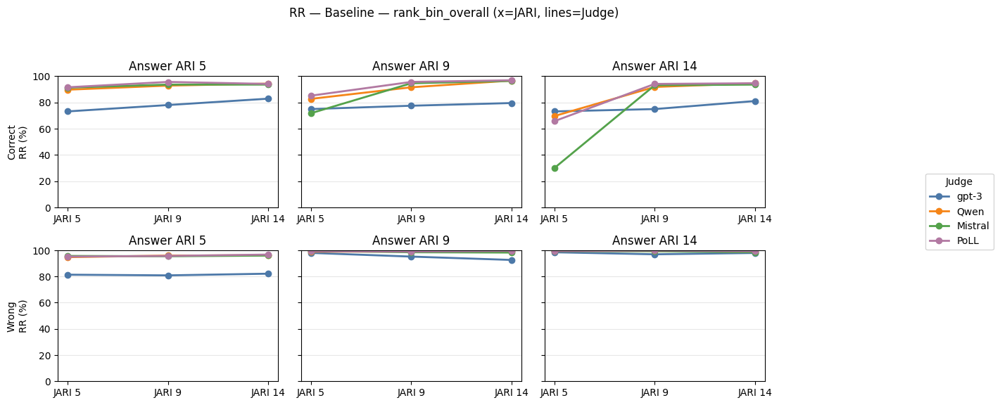

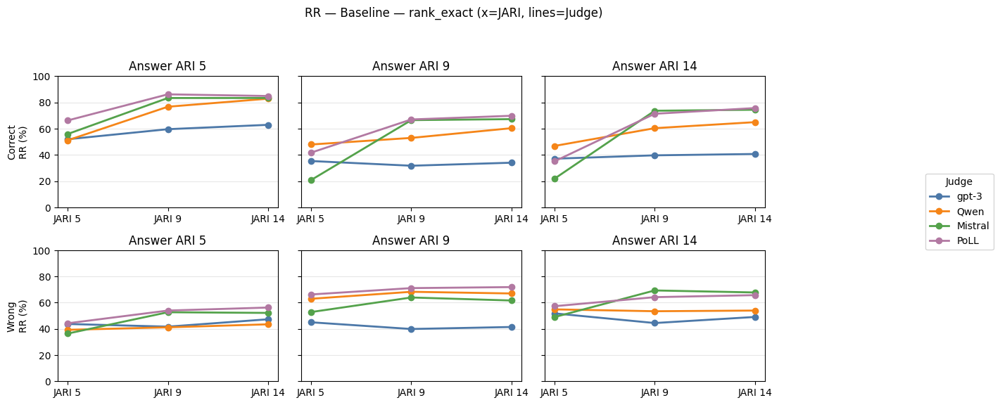

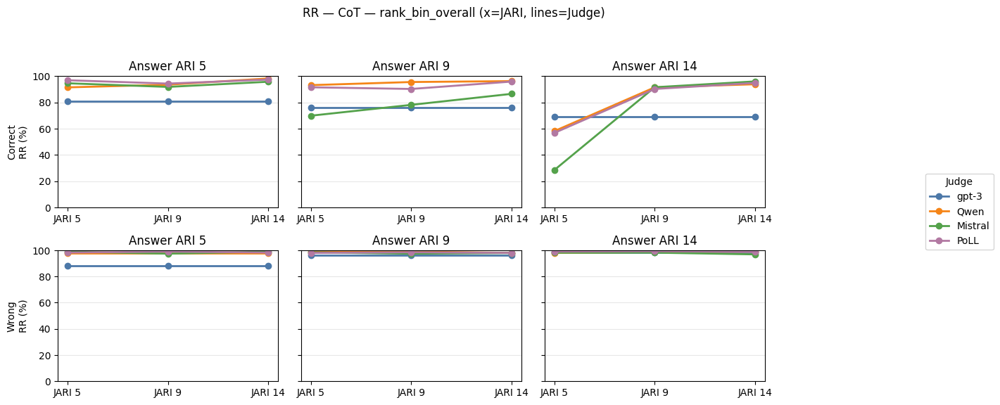

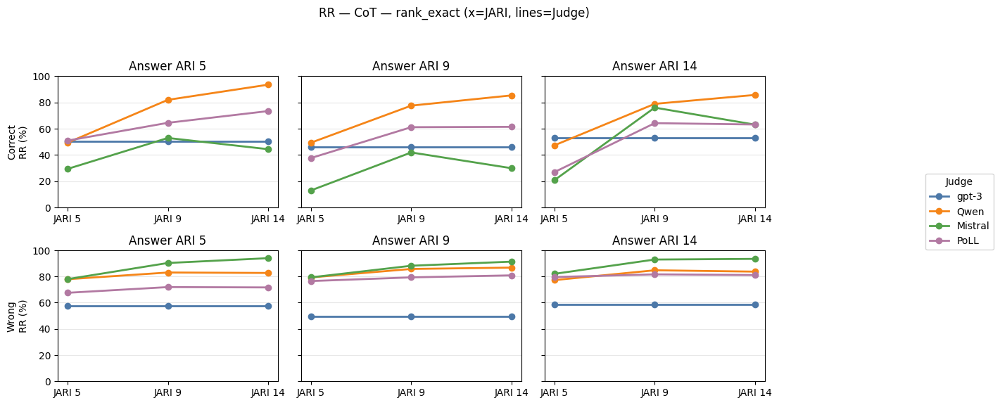

In [272]:
# Baseline, rank_bin_overall — lines = judges (gpt-3/Qwen/Mistral/PoLL), x = JARI
plot_rr_jari_x_models_lines(
    df_rr_ensemble,
    prompt="baseline",
    metric="rank_bin_overall",
    models=("gpt-3","Qwen","Mistral","PoLL"),
    jari_levels=(5,9,14),
    ari_levels=(5,9,14),
    title="RR — Baseline — rank_bin_overall (x=JARI, lines=Judge)"
)

# Baseline, rank_exact
plot_rr_jari_x_models_lines(
    df_rr_ensemble,
    prompt="baseline",
    metric="rank_exact",
    models=("gpt-3","Qwen","Mistral","PoLL"),
    title="RR — Baseline — rank_exact (x=JARI, lines=Judge)"
)

# CoT versions (same idea)
plot_rr_jari_x_models_lines(
    df_rr_ensemble,
    prompt="cot",
    metric="rank_bin_overall",
    models=("gpt-3","Qwen","Mistral","PoLL"),
    title="RR — CoT — rank_bin_overall (x=JARI, lines=Judge)"
)

plot_rr_jari_x_models_lines(
    df_rr_ensemble,
    prompt="cot",
    metric="rank_exact",
    models=("gpt-3","Qwen","Mistral","PoLL"),
    title="RR — CoT — rank_exact (x=JARI, lines=Judge)"
)


In [51]:
def plot_rr_grouped_bars(df_rr, prompt='baseline', metric='rank_exact',
                         models_order=('GPT-4','LLaMA','PoLL'),
                         jari_levels=(5,9,14), ari_levels=(5,9,14),
                         title=None, savepath=None):
    d = df_rr.copy()
    d = d[(d['prompt']==prompt) &
          (d['metric']==metric) &
          (d['JARI'].isin(jari_levels)) &
          (d['ARI'].isin(ari_levels)) &
          (d['group'].isin(['Correct','Wrong']))]
    color_map = {5:'#4C78A8', 9:'#F58518', 14:'#54A24B'}
    groups = ['Correct','Wrong']
    nrows, ncols = len(groups), len(ari_levels)
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(13,5.4), sharey=True)
    axes = np.atleast_2d(axes)
    if title is None:
        title = f"RR (no pooling) — {prompt.capitalize()} — {metric}"

    for r, grp in enumerate(groups):
        for c, ari in enumerate(ari_levels):
            ax = axes[r, c]
            x = np.arange(len(models_order)); width = 0.2
            for i, jari in enumerate(jari_levels):
                heights = []
                for m in models_order:
                    row = d[(d['group']==grp)&(d['ARI']==ari)&(d['JARI']==jari)&(d['model']==m)]
                    heights.append(float(row.iloc[0]['rate'])*100.0 if not row.empty else np.nan)
                ax.bar(x + (i-1)*width, heights, width=width, color=color_map[jari], label=f'JARI {jari}')
            ax.set_xticks(x); ax.set_xticklabels(models_order)
            ax.set_ylim(0,100)
            if c==0: ax.set_ylabel(f"{grp}\nRR (%)")
            ax.set_title(f"Answer ARI {ari}")
            ax.grid(axis='y', alpha=0.3)

    fig.legend([plt.Rectangle((0,0),1,1,color=color_map[j]) for j in jari_levels],
               [f'JARI {j}' for j in jari_levels], title="Judge persona",
               loc='center left', bbox_to_anchor=(1.01,0.5))
    fig.suptitle(title, y=1.02)
    plt.tight_layout(rect=[0,0,0.85,0.95])
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()


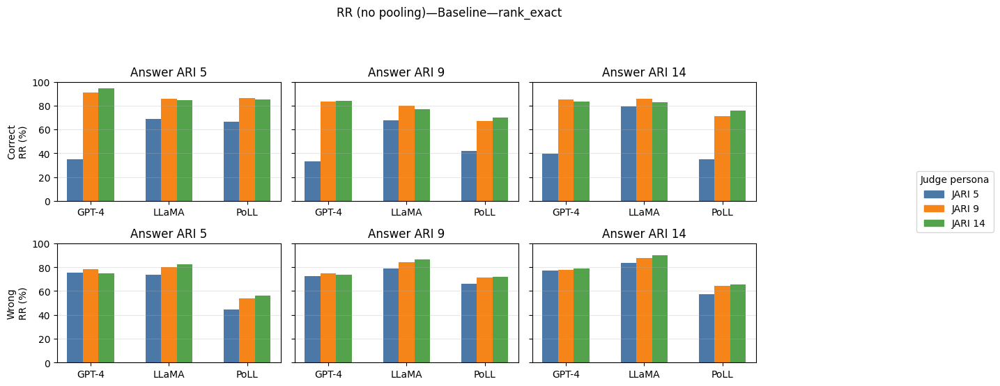

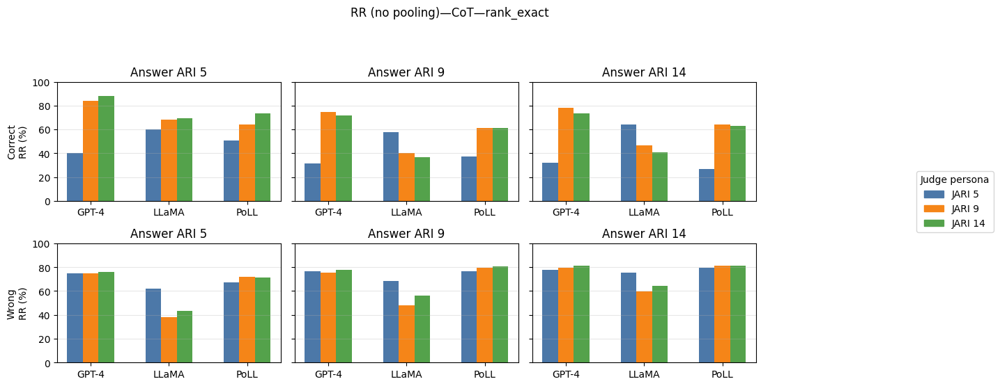

In [52]:
plot_rr_grouped_bars(df_rr, prompt='baseline', metric='rank_exact',
                     title="RR (no pooling)—Baseline—rank_exact",
                     savepath="figs/rr_nopool_bar_baseline_rank_exact.pdf")

plot_rr_grouped_bars(df_rr, prompt='cot', metric='rank_exact',
                     title="RR (no pooling)—CoT—rank_exact",
                     savepath="figs/rr_nopool_bar_cot_rank_exact.pdf")
# repeat for rank_bin_overall if desired


,model,prompt,JARI,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,GPT-4,baseline,5,RR,rank_bin_overall,Correct,5,369,391,0.943734,0.916281,0.962552
1,GPT-4,baseline,5,RR,rank_exact,Correct,5,137,391,0.350384,0.304758,0.398920
2,GPT-4,baseline,5,RR,rank_bin_overall,Correct,9,315,391,0.805627,0.763508,0.841798
3,GPT-4,baseline,5,RR,rank_exact,Correct,9,129,391,0.329923,0.285171,0.377985
4,GPT-4,baseline,5,RR,rank_bin_overall,Correct,14,180,391,0.460358,0.411579,0.509908


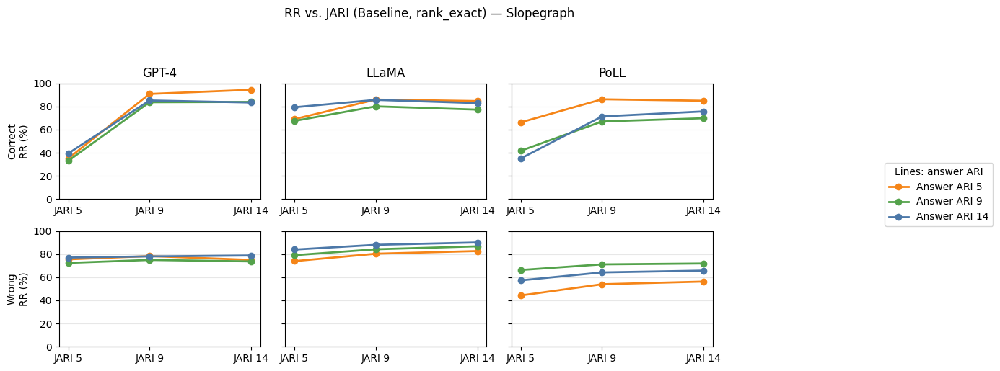

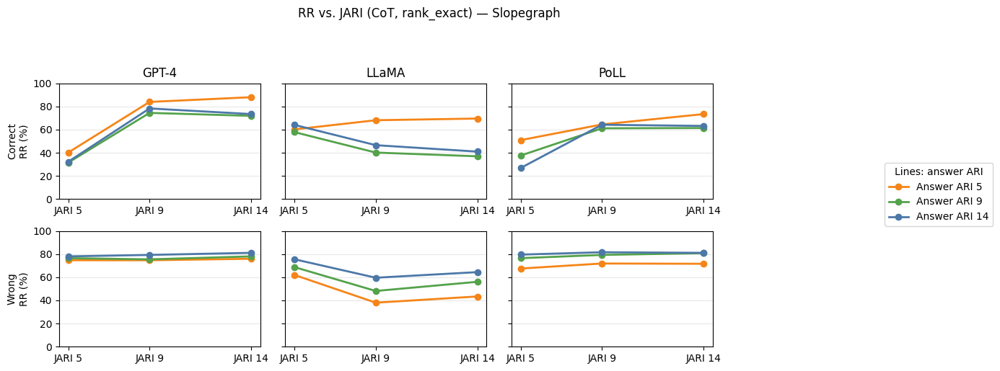

In [167]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def rr_slopegraph(df_rr, prompt='baseline', metric='rank_exact',
                  models=('GPT-4','LLaMA','PoLL'),
                  jari_levels=(5,9,14), ari_levels=(5,9,14),
                  groups=('Correct','Wrong'),
                  title=None, savepath=None):
    d = (df_rr[(df_rr['mode'].str.upper()=='RR') &
               (df_rr['prompt']==prompt) &
               (df_rr['metric']==metric) &
               (df_rr['group'].isin(groups)) &
               (df_rr['JARI'].isin(jari_levels)) &
               (df_rr['ARI'].isin(ari_levels))]
         .copy())
    d['rate_pct'] = d['rate']*100

    colors = {14:'#4C78A8', 5:'#F58518', 9:'#54A24B'}  # lines by answer ARI
    nrows, ncols = len(groups), len(models)
    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 5), sharey=True)
    axes = np.atleast_2d(axes)

    if title is None:
        title = f"RR (no pooling) — {prompt.capitalize()} — {metric}"
    fig.suptitle(title, y=1.02)

    for r, grp in enumerate(groups):
        for c, model in enumerate(models):
            ax = axes[r, c]
            sub = d[(d['group']==grp) & (d['model']==model)]
            for ari in ari_levels:
                vals = []
                for j in jari_levels:
                    row = sub[(sub['ARI']==ari) & (sub['JARI']==j)]
                    vals.append(row.iloc[0]['rate_pct'] if not row.empty else np.nan)
                ax.plot(jari_levels, vals, marker='o', lw=2, color=colors[ari],
                        label=f'Answer ARI {ari}')
            ax.set_title(model if r==0 else "")
            if c==0: ax.set_ylabel(f"{grp}\nRR (%)")
            ax.set_xticks(jari_levels); ax.set_xticklabels([f'JARI {j}' for j in jari_levels])
            ax.set_ylim(0, 100); ax.grid(axis='y', alpha=0.3)

    handles = [plt.Line2D([0],[0], color=colors[a], marker='o', lw=2, label=f'Answer ARI {a}')
               for a in ari_levels]
    fig.legend(handles=handles, title="Lines: answer ARI", loc='center left', bbox_to_anchor=(1.02, 0.5))
    plt.tight_layout(rect=[0,0,0.85,0.95])
    if savepath: plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()

# Examples
rr_slopegraph(df_rr, prompt='baseline', metric='rank_exact',
              title="RR vs. JARI (Baseline, rank_exact) — Slopegraph",
              savepath="figs/rr_slope_baseline_rank_exact.pdf")

rr_slopegraph(df_rr, prompt='cot', metric='rank_exact',
              title="RR vs. JARI (CoT, rank_exact) — Slopegraph",
              savepath="figs/rr_slope_cot_rank_exact.pdf")


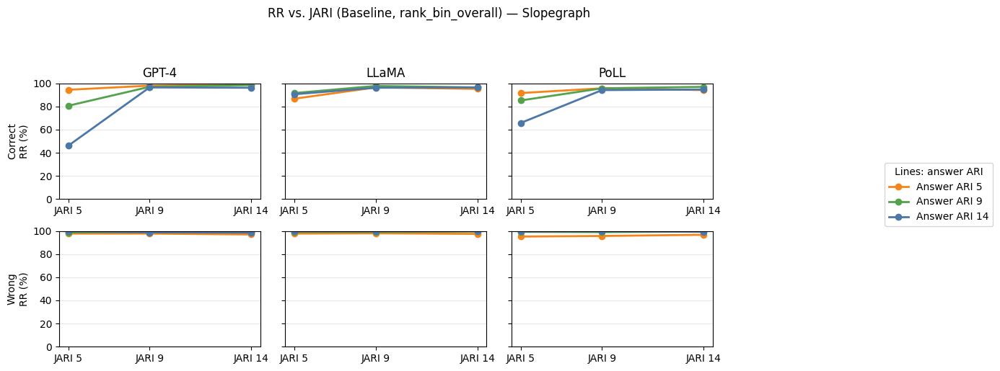

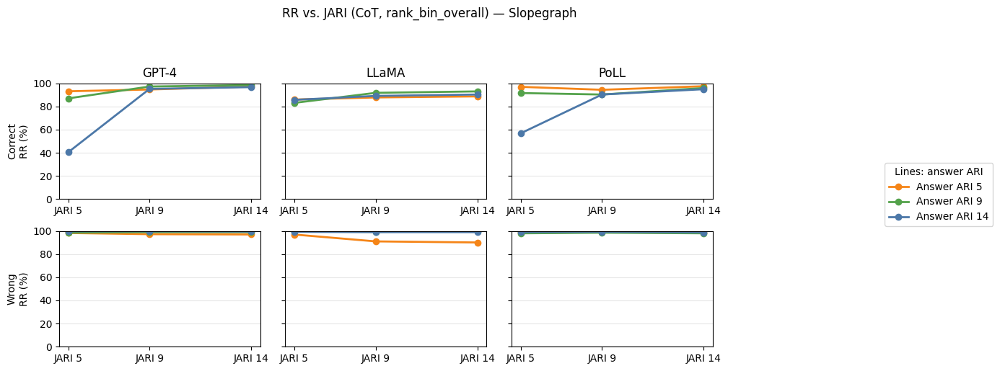

In [168]:
rr_slopegraph(df_rr, prompt='baseline', metric='rank_bin_overall',
              title="RR vs. JARI (Baseline, rank_bin_overall) — Slopegraph",
              savepath="figs/rr_slope_baseline_rank_bin_overall.pdf")

rr_slopegraph(df_rr, prompt='cot', metric='rank_bin_overall',
              title="RR vs. JARI (CoT, rank_bin_overall) — Slopegraph",
              savepath="figs/rr_slope_cot_rank_bin_overall.pdf")

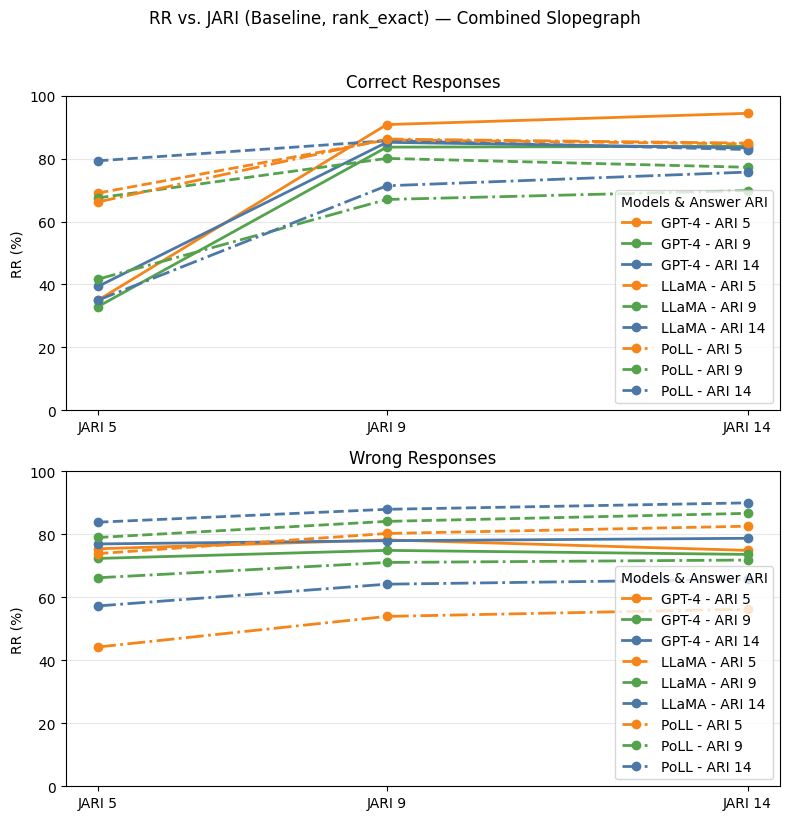

In [291]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def rr_combined_slopegraph(df_rr, prompt='baseline', metric='rank_exact',
                         models=('GPT-4','LLaMA','PoLL'),
                         jari_levels=(5,9,14), ari_levels=(5,9,14),
                         groups=('Correct','Wrong'),
                         title=None, savepath=None):
    d = (df_rr[(df_rr['mode'].str.upper()=='RR') &
               (df_rr['prompt']==prompt) &
               (df_rr['metric']==metric) &
               (df_rr['group'].isin(groups)) &
               (df_rr['JARI'].isin(jari_levels)) &
               (df_rr['ARI'].isin(ari_levels))]
         .copy())
    d['rate_pct'] = d['rate']*100

    colors = {14:'#4C78A8', 5:'#F58518', 9:'#54A24B'}
    line_styles = {'GPT-4':'-', 'LLaMA':'--', 'PoLL':'-.'}
    
    nrows = len(groups)
    fig, axes = plt.subplots(nrows, 1, figsize=(8, 8), sharey=True)
    axes = np.atleast_1d(axes)

    if title is None:
        title = f"RR vs. JARI (Combined, {prompt.capitalize()}, {metric})"
    fig.suptitle(title, y=1.02)

    for r, grp in enumerate(groups):
        ax = axes[r]
        for c, model in enumerate(models):
            sub = d[(d['group']==grp) & (d['model']==model)]
            for ari in ari_levels:
                vals = []
                for j in jari_levels:
                    row = sub[(sub['ARI']==ari) & (sub['JARI']==j)]
                    vals.append(row.iloc[0]['rate_pct'] if not row.empty else np.nan)
                ax.plot(jari_levels, vals, marker='o', lw=2, color=colors[ari],
                        linestyle=line_styles[model],
                        label=f'{model} - ARI {ari}')
        
        ax.set_title(f"{grp} Responses")
        ax.set_ylabel("RR (%)")
        ax.set_xticks(jari_levels)
        ax.set_xticklabels([f'JARI {j}' for j in jari_levels])
        ax.set_ylim(0, 100)
        ax.grid(axis='y', alpha=0.3)
        ax.legend(title="Models & Answer ARI", loc='best')

    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()

# Example usage
rr_combined_slopegraph(df_rr, prompt='baseline', metric='rank_exact',
                      title="RR vs. JARI (Baseline, rank_exact) — Combined Slopegraph")

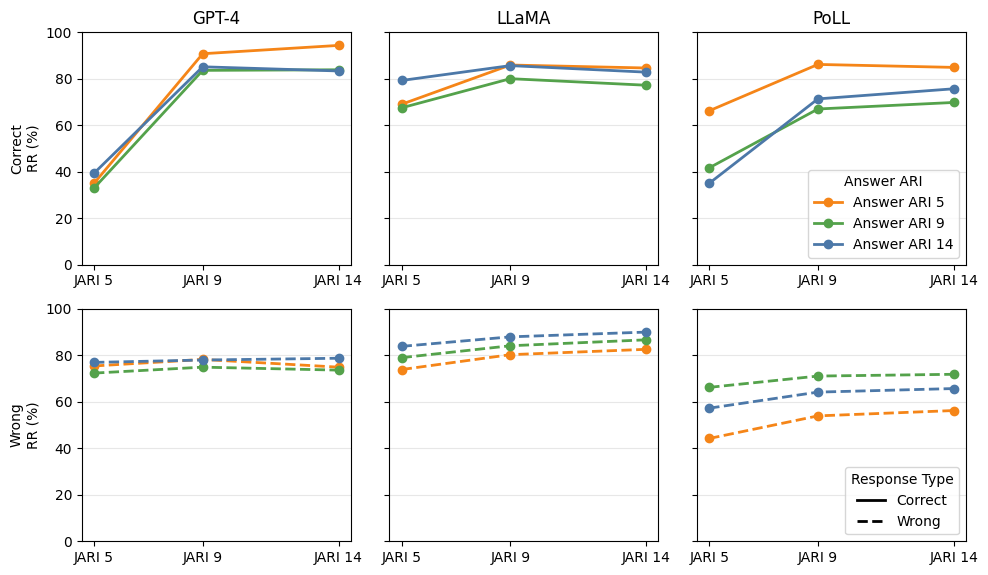

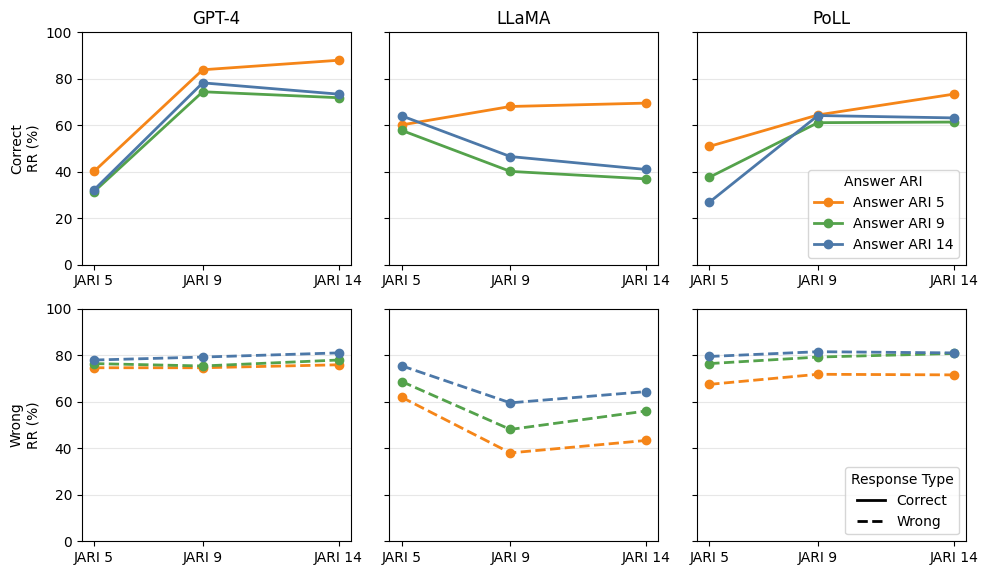

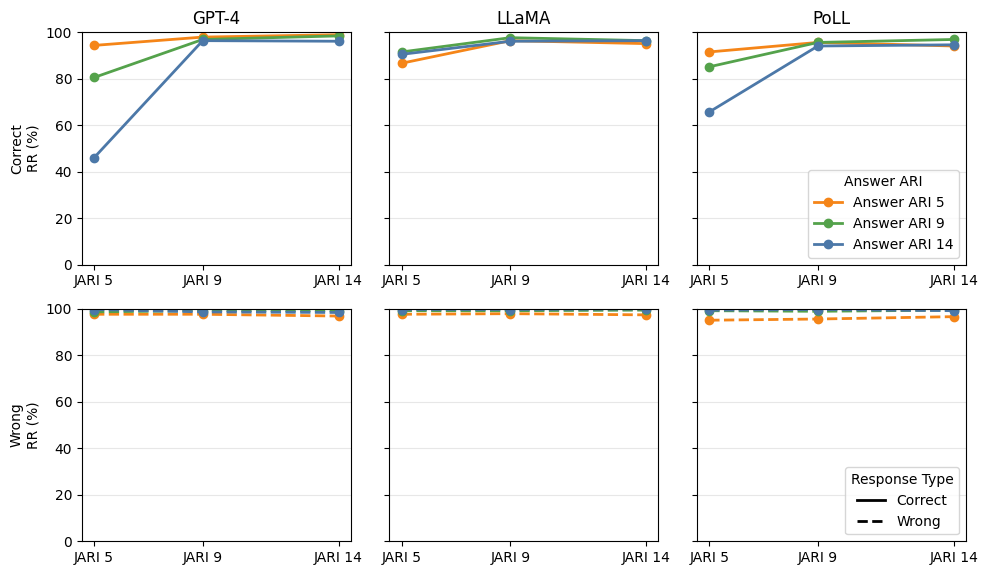

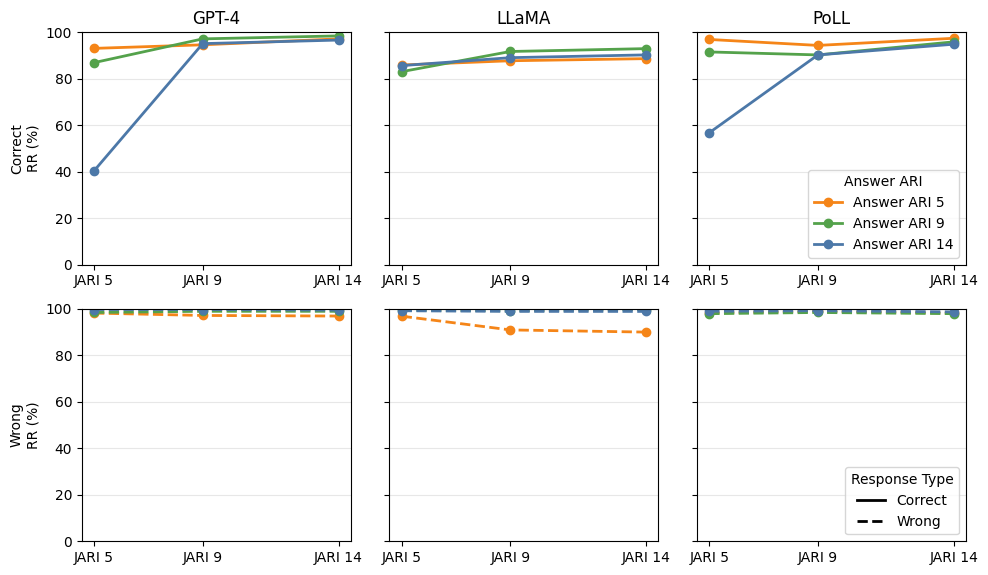

In [105]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def rr_slopegraph_split_legend(df_rr, prompt='baseline', metric='rank_exact',
                                 models=('GPT-4', 'LLaMA', 'PoLL'),
                                 jari_levels=(5, 9, 14), ari_levels=(5, 9, 14),
                                 groups=('Correct', 'Wrong'),
                                 title=None, savepath=None):
    d = (df_rr[(df_rr['mode'].str.upper() == 'RR') &
               (df_rr['prompt'] == prompt) &
               (df_rr['metric'] == metric) &
               (df_rr['group'].isin(groups)) &
               (df_rr['JARI'].isin(jari_levels)) &
               (df_rr['ARI'].isin(ari_levels))]
         .copy())
    d['rate_pct'] = d['rate'] * 100

    colors = {14: '#4C78A8', 5: '#F58518', 9: '#54A24B'}
    linestyles = {'Correct': '-', 'Wrong': '--'}
    
    nrows, ncols = len(groups), len(models)
    fig, axes = plt.subplots(nrows, ncols, figsize=(10, 6), sharey=True)
    axes = np.atleast_2d(axes)

    if title is None:
        title = f"RR (no pooling) — {prompt.capitalize()} — {metric}"
    fig.suptitle(title, y=1.02)

    # Create handles for color and line style separately
    color_handles = [Line2D([0], [0], color=colors[a], marker='o', lw=2, label=f'Answer ARI {a}')
                     for a in ari_levels]
    style_handles = [Line2D([0], [0], color='black', linestyle='-', lw=2, label='Correct'),
                     Line2D([0], [0], color='black', linestyle='--', lw=2, label='Wrong')]

    for r, grp in enumerate(groups):
        for c, model in enumerate(models):
            ax = axes[r, c]
            sub = d[(d['group'] == grp) & (d['model'] == model)]
            for ari in ari_levels:
                vals = []
                for j in jari_levels:
                    row = sub[(sub['ARI'] == ari) & (sub['JARI'] == j)]
                    vals.append(row.iloc[0]['rate_pct'] if not row.empty else np.nan)
                ax.plot(jari_levels, vals, marker='o', lw=2, color=colors[ari],
                        linestyle=linestyles[grp])
            
            ax.set_title(model if r == 0 else "")
            if c == 0:
                ax.set_ylabel(f"{grp}\nRR (%)")
            ax.set_xticks(jari_levels)
            ax.set_xticklabels([f'JARI {j}' for j in jari_levels])
            ax.set_ylim(0, 100)
            ax.grid(axis='y', alpha=0.3)
            
            # Place the color legend in the top-right subplot
            if r == 0 and c == ncols - 1:
                ax.legend(handles=color_handles, loc='lower right', title='Answer ARI')

            # Place the line style legend in the bottom-right subplot
            if r == nrows - 1 and c == ncols - 1:
                ax.legend(handles=style_handles, loc='lower right', title='Response Type')

    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()

# Example usage
# RR vs. JARI (Baseline, rank_exact) — Slopegraph
rr_slopegraph_split_legend(df_rr, prompt='baseline', metric='rank_exact',
                           title="",
                           savepath="figs/rr_slope_baseline_rank_exact_split_legend.pdf")
# RR vs. JARI (CoT, rank_exact) — Slopegraph
rr_slopegraph_split_legend(df_rr, prompt='cot', metric='rank_exact',
                           title="",
                           savepath="figs/rr_slope_cot_rank_exact_split_legend.pdf")
# RR vs. JARI (Baseline, rank_bin_overall) — Slopegraph
rr_slopegraph_split_legend(df_rr, prompt='baseline', metric='rank_bin_overall',
              title="",
              savepath="figs/rr_slope_baseline_rank_bin_overall.pdf")
# RR vs. JARI (CoT, rank_bin_overall) — Slopegraph
rr_slopegraph_split_legend(df_rr, prompt='cot', metric='rank_bin_overall',
              title="",
              savepath="figs/rr_slope_cot_rank_bin_overall.pdf")

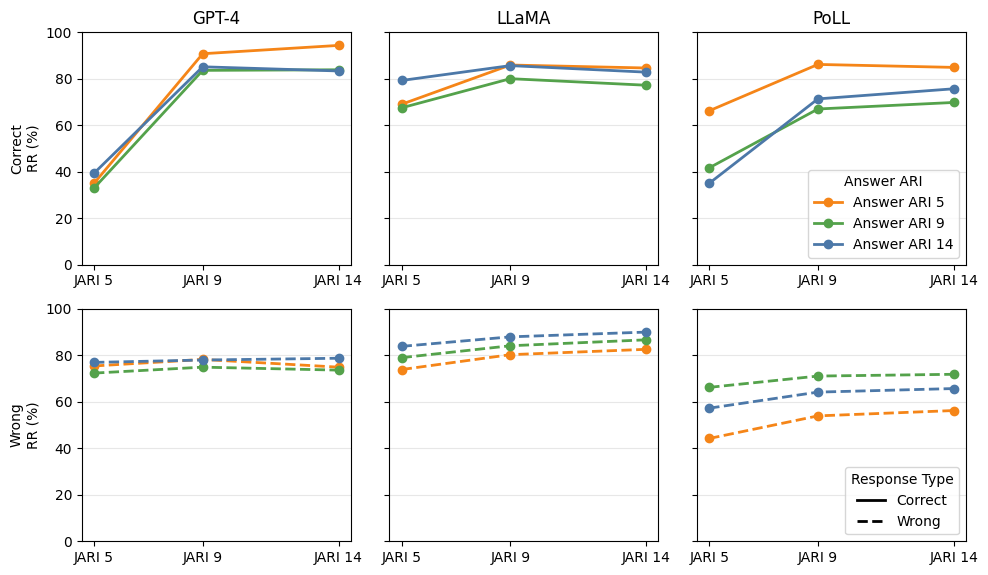

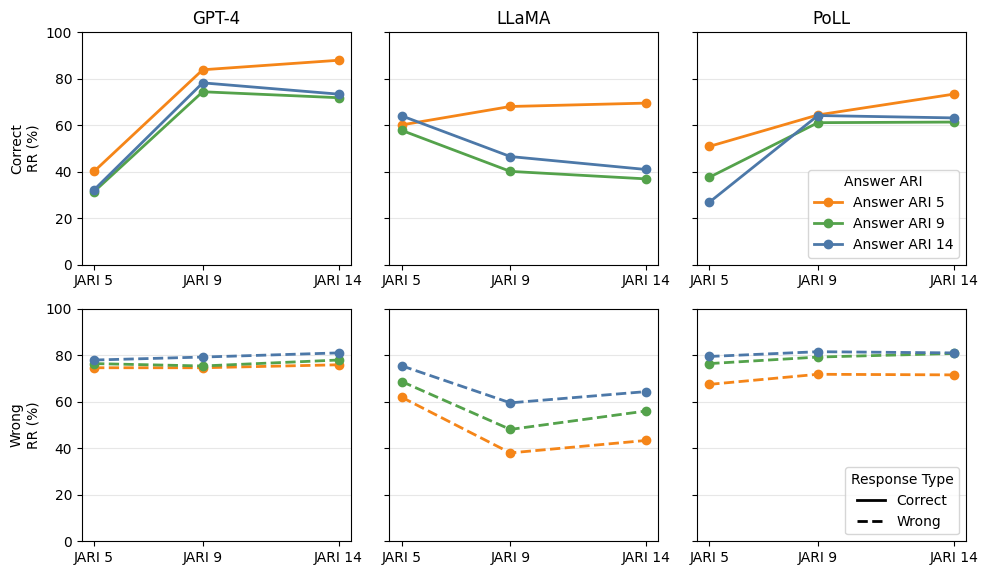

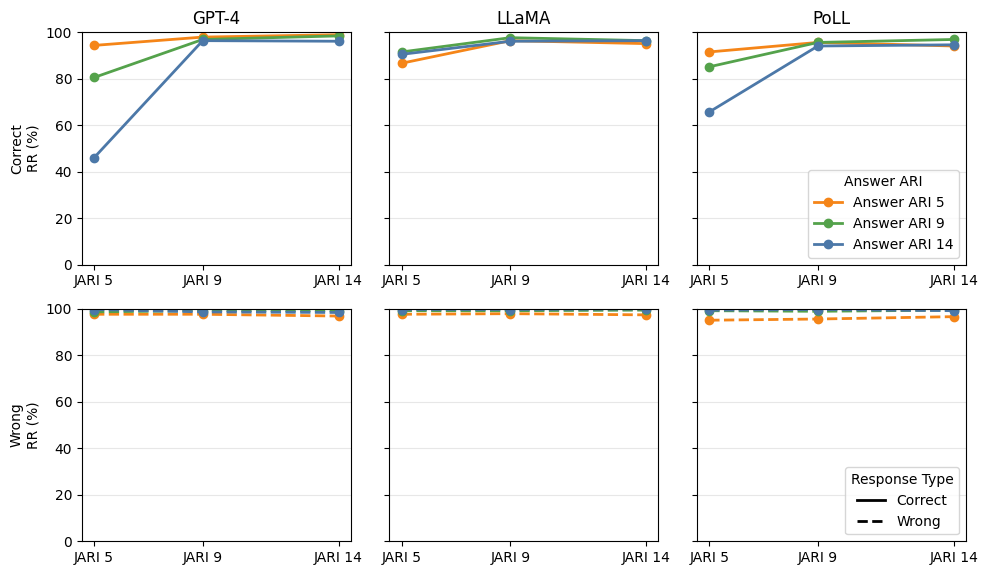

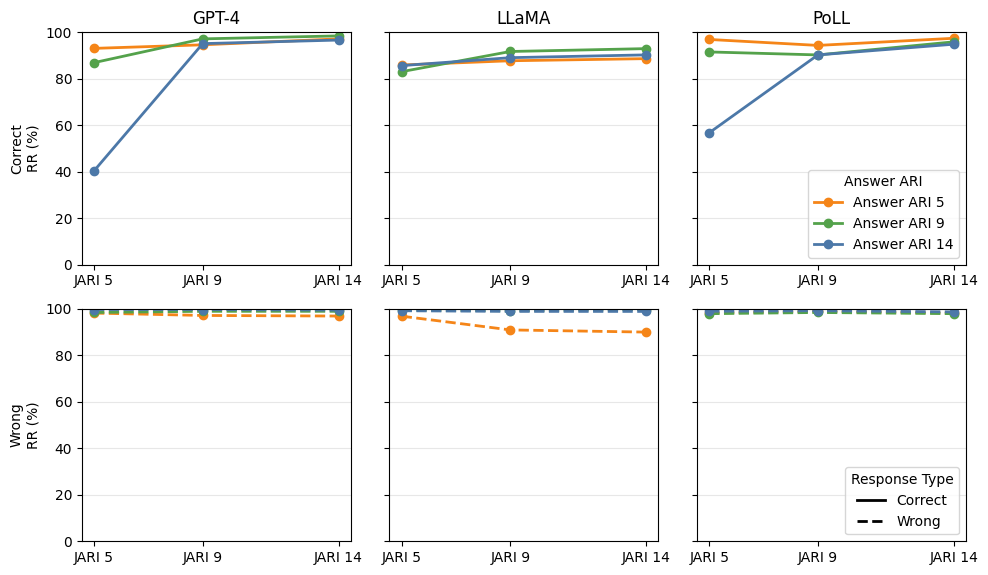

In [104]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def rr_slopegraph_split_legend(df_rr, prompt='baseline', metric='rank_exact',
                                 models=('GPT-4', 'LLaMA', 'PoLL'),
                                 jari_levels=(5, 9, 14), ari_levels=(5, 9, 14),
                                 groups=('Correct', 'Wrong'),
                                 title=None, savepath=None):
    d = (df_rr[(df_rr['mode'].str.upper() == 'RR') &
               (df_rr['prompt'] == prompt) &
               (df_rr['metric'] == metric) &
               (df_rr['group'].isin(groups)) &
               (df_rr['JARI'].isin(jari_levels)) &
               (df_rr['ARI'].isin(ari_levels))]
         .copy())
    d['rate_pct'] = d['rate'] * 100

    colors = {14: '#4C78A8', 5: '#F58518', 9: '#54A24B'}
    linestyles = {'Correct': '-', 'Wrong': '--'}
    
    nrows, ncols = len(groups), len(models)
    fig, axes = plt.subplots(nrows, ncols, figsize=(10, 6), sharey=True)
    axes = np.atleast_2d(axes)

    if title is None:
        title = f"RR (no pooling) — {prompt.capitalize()} — {metric}"
    fig.suptitle(title, y=1.02)

    # Create handles for color and line style separately
    color_handles = [Line2D([0], [0], color=colors[a], marker='o', lw=2, label=f'Answer ARI {a}')
                     for a in ari_levels]
    style_handles = [Line2D([0], [0], color='black', linestyle='-', lw=2, label='Correct'),
                     Line2D([0], [0], color='black', linestyle='--', lw=2, label='Wrong')]

    for r, grp in enumerate(groups):
        for c, model in enumerate(models):
            ax = axes[r, c]
            sub = d[(d['group'] == grp) & (d['model'] == model)]
            for ari in ari_levels:
                vals = []
                for j in jari_levels:
                    row = sub[(sub['ARI'] == ari) & (sub['JARI'] == j)]
                    vals.append(row.iloc[0]['rate_pct'] if not row.empty else np.nan)
                ax.plot(jari_levels, vals, marker='o', lw=2, color=colors[ari],
                        linestyle=linestyles[grp])
            
            ax.set_title(model if r == 0 else "")
            if c == 0:
                ax.set_ylabel(f"{grp}\nRR (%)")
            ax.set_xticks(jari_levels)
            ax.set_xticklabels([f'JARI {j}' for j in jari_levels])
            ax.set_ylim(0, 100)
            ax.grid(axis='y', alpha=0.3)
            
            # Place the color legend in the top-right subplot
            if r == 0 and c == ncols - 1:
                ax.legend(handles=color_handles, loc='lower right', title='Answer ARI')

            # Place the line style legend in the bottom-right subplot
            if r == nrows - 1 and c == ncols - 1:
                ax.legend(handles=style_handles, loc='lower right', title='Response Type')

    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()

# Example usage
# RR vs. JARI (Baseline, rank_exact) — Slopegraph
rr_slopegraph_split_legend(df_rr, prompt='baseline', metric='rank_exact',
                           title="",
                           savepath="figs/rr_slope_baseline_rank_exact_split_legend.pdf")
# RR vs. JARI (CoT, rank_exact) — Slopegraph
rr_slopegraph_split_legend(df_rr, prompt='cot', metric='rank_exact',
                           title="",
                           savepath="figs/rr_slope_cot_rank_exact_split_legend.pdf")
# RR vs. JARI (Baseline, rank_bin_overall) — Slopegraph
rr_slopegraph_split_legend(df_rr, prompt='baseline', metric='rank_bin_overall',
              title="",
              savepath="figs/rr_slope_baseline_rank_bin_overall.pdf")
# RR vs. JARI (CoT, rank_bin_overall) — Slopegraph
rr_slopegraph_split_legend(df_rr, prompt='cot', metric='rank_bin_overall',
              title="",
              savepath="figs/rr_slope_cot_rank_bin_overall.pdf")

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def rr_slopegraph_split_legend(df_rr, prompt='baseline', metric='rank_exact',
                                 models=('GPT-4', 'LLaMA', 'PoLL'),
                                 jari_levels=(5, 9, 14), ari_levels=(5, 9, 14),
                                 groups=('Correct', 'Wrong'),
                                 title=None, savepath=None):
    d = (df_rr[(df_rr['mode'].str.upper() == 'RR') &
               (df_rr['prompt'] == prompt) &
               (df_rr['metric'] == metric) &
               (df_rr['group'].isin(groups)) &
               (df_rr['JARI'].isin(jari_levels)) &
               (df_rr['ARI'].isin(ari_levels))]
         .copy())
    d['rate_pct'] = d['rate'] * 100

    colors = {14: '#4C78A8', 5: '#F58518', 9: '#54A24B'}
    linestyles = {'Correct': '-', 'Wrong': '--'}
    
    nrows, ncols = len(groups), len(models)
    fig, axes = plt.subplots(nrows, ncols, figsize=(10, 6), sharey=True)
    axes = np.atleast_2d(axes)

    if title is None:
        title = f"RR (no pooling) — {prompt.capitalize()} — {metric}"
    fig.suptitle(title, y=1.02)

    # Create handles for color and line style separately
    color_handles = [Line2D([0], [0], color=colors[a], marker='o', lw=2, label=f'Answer ARI {a}')
                     for a in ari_levels]
    style_handles = [Line2D([0], [0], color='black', linestyle='-', lw=2, label='Correct'),
                     Line2D([0], [0], color='black', linestyle='--', lw=2, label='Wrong')]

    for r, grp in enumerate(groups):
        for c, model in enumerate(models):
            ax = axes[r, c]
            sub = d[(d['group'] == grp) & (d['model'] == model)]
            for ari in ari_levels:
                vals = []
                for j in jari_levels:
                    row = sub[(sub['ARI'] == ari) & (sub['JARI'] == j)]
                    vals.append(row.iloc[0]['rate_pct'] if not row.empty else np.nan)
                ax.plot(jari_levels, vals, marker='o', lw=2, color=colors[ari],
                        linestyle=linestyles[grp])
            
            ax.set_title(model if r == 0 else "")
            if c == 0:
                ax.set_ylabel(f"{grp}\nRR (%)")
            ax.set_xticks(jari_levels)
            ax.set_xticklabels([f'JARI {j}' for j in jari_levels])
            ax.set_ylim(0, 100)
            ax.grid(axis='y', alpha=0.3)
            
            # Place the color legend in the top-right subplot
            if r == 0 and c == ncols - 1:
                ax.legend(handles=color_handles, loc='lower right', title='Answer ARI')

            # Place the line style legend in the bottom-right subplot
            if r == nrows - 1 and c == ncols - 1:
                ax.legend(handles=style_handles, loc='lower right', title='Response Type')

    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()

# Example usage
# RR vs. JARI (Baseline, rank_exact) — Slopegraph
rr_slopegraph_split_legend(df_rr, prompt='baseline', metric='rank_exact',
                           title="",
                           savepath="figs/rr_slope_baseline_rank_exact_split_legend.pdf")
# RR vs. JARI (CoT, rank_exact) — Slopegraph
rr_slopegraph_split_legend(df_rr, prompt='cot', metric='rank_exact',
                           title="",
                           savepath="figs/rr_slope_baseline_rank_exact_split_legend.pdf")
# RR vs. JARI (Baseline, rank_bin_overall) — Slopegraph
rr_slopegraph_split_legend(df_rr, prompt='baseline', metric='rank_bin_overall',
              title="",
              savepath="figs/rr_slope_baseline_rank_bin_overall.pdf")
# RR vs. JARI (CoT, rank_bin_overall) — Slopegraph
rr_slopegraph_split_legend(df_rr, prompt='cot', metric='rank_bin_overall',
              title="",
              savepath="figs/rr_slope_cot_rank_bin_overall.pdf")

NameError: name 'df_rr' is not defined

C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\1087906265.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


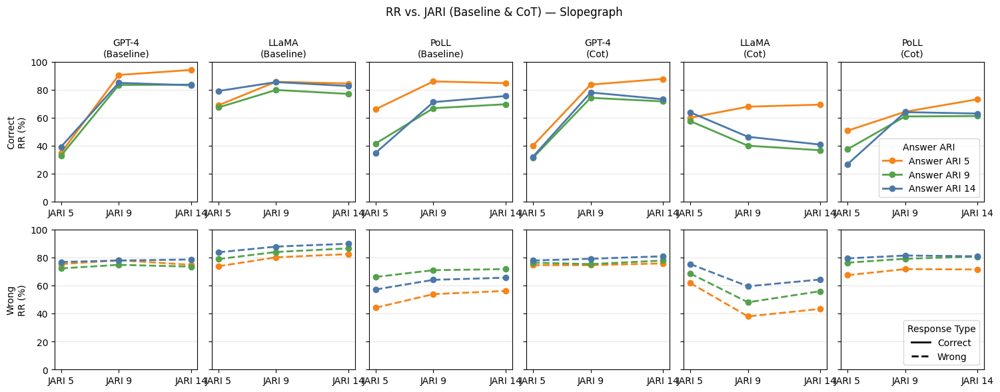

In [308]:
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# from matplotlib.lines import Line2D

# def rr_combined_prompts_slopegraph(df_rr, prompt_levels=('baseline', 'cot'), metric='rank_exact',
#                                  models=('GPT-4', 'LLaMA', 'PoLL'),
#                                  jari_levels=(5, 9, 14), ari_levels=(5, 9, 14),
#                                  groups=('Correct', 'Wrong'),
#                                  title=None, savepath=None):
#     d = (df_rr[(df_rr['mode'].str.upper() == 'RR') &
#                (df_rr['prompt'].isin(prompt_levels)) &
#                (df_rr['metric'] == metric) &
#                (df_rr['group'].isin(groups)) &
#                (df_rr['JARI'].isin(jari_levels)) &
#                (df_rr['ARI'].isin(ari_levels))]
#          .copy())
#     d['rate_pct'] = d['rate'] * 100

#     colors = {14: '#4C78A8', 5: '#F58518', 9: '#54A24B'}
#     linestyles = {'Correct': '-', 'Wrong': '--'}
    
#     nrows, ncols = len(groups), len(models) * len(prompt_levels)
#     fig, axes = plt.subplots(nrows, ncols, figsize=(18, 6), sharey=True, gridspec_kw={'wspace': 0.1})
#     axes = np.atleast_2d(axes)

#     if title is None:
#         title = f"RR (no pooling) — Combined Prompts and Models — {metric}"
#     fig.suptitle(title, y=1.02)

#     # Create handles for color and line style separately
#     color_handles = [Line2D([0], [0], color=colors[a], marker='o', lw=2, label=f'Answer ARI {a}')
#                      for a in ari_levels]
#     style_handles = [Line2D([0], [0], color='black', linestyle='-', lw=2, label='Correct'),
#                      Line2D([0], [0], color='black', linestyle='--', lw=2, label='Wrong')]

#     for r, grp in enumerate(groups):
#         for c_prompt, prompt in enumerate(prompt_levels):
#             for c_model, model in enumerate(models):
#                 c = c_prompt * len(models) + c_model
#                 ax = axes[r, c]
#                 sub = d[(d['group'] == grp) & (d['model'] == model) & (d['prompt'] == prompt)]
                
#                 for ari in ari_levels:
#                     vals = []
#                     for j in jari_levels:
#                         row = sub[(sub['ARI'] == ari) & (sub['JARI'] == j)]
#                         vals.append(row.iloc[0]['rate_pct'] if not row.empty else np.nan)
#                     ax.plot(jari_levels, vals, marker='o', lw=2, color=colors[ari],
#                             linestyle=linestyles[grp])
                
#                 if r == 0:
#                     ax.set_title(f"{model}\n({prompt.capitalize()})", fontsize=10)
#                 if c == 0:
#                     ax.set_ylabel(f"{grp}\nRR (%)")
#                 ax.set_xticks(jari_levels)
#                 ax.set_xticklabels([f'JARI {j}' for j in jari_levels])
#                 ax.set_ylim(0, 100)
#                 ax.grid(axis='y', alpha=0.3)
                
#                 # Place the color legend in the top-right subplot
#                 if r == 0 and c == ncols - 1:
#                     ax.legend(handles=color_handles, loc='lower right', title='Answer ARI')
#                 # Place the line style legend in the bottom-right subplot
#                 if r == nrows - 1 and c == ncols - 1:
#                     ax.legend(handles=style_handles, loc='lower right', title='Response Type')

#     plt.tight_layout()
#     if savepath:
#         plt.savefig(savepath, dpi=300, bbox_inches='tight')
#     plt.show()

# # Example usage
# # You will need to make sure your df_rr dataframe has both 'baseline' and 'cot' prompts
# rr_combined_prompts_slopegraph(df_rr, metric='rank_exact',
#                                title="RR vs. JARI (Baseline & CoT) — Slopegraph")

In [67]:
print(df_rr[130:150])

     model    prompt  JARI mode            metric    group  ARI    k    n  \
130  LLaMA       cot     9   RR  rank_bin_overall    Wrong   14  372  376   
131  LLaMA       cot     9   RR        rank_exact    Wrong   14  224  376   
132  LLaMA       cot    14   RR  rank_bin_overall  Correct    5  329  371   
133  LLaMA       cot    14   RR        rank_exact  Correct    5  258  371   
134  LLaMA       cot    14   RR  rank_bin_overall  Correct    9  345  371   
135  LLaMA       cot    14   RR        rank_exact  Correct    9  137  371   
136  LLaMA       cot    14   RR  rank_bin_overall  Correct   14  335  371   
137  LLaMA       cot    14   RR        rank_exact  Correct   14  152  371   
138  LLaMA       cot    14   RR  rank_bin_overall    Wrong    5  334  371   
139  LLaMA       cot    14   RR        rank_exact    Wrong    5  161  371   
140  LLaMA       cot    14   RR  rank_bin_overall    Wrong    9  370  371   
141  LLaMA       cot    14   RR        rank_exact    Wrong    9  208  371   

In [119]:
df_rr_ensemble

,Rank_Ref,Rank_ARI_5,Rank_ARI_9,Rank_ARI_14,Rank_Wrong_Answer_ARI_5,Rank_Wrong_Answer_ARI_9,Rank_Wrong_Answer_ARI_14,model,prompt,JARI,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,4.0,3,3.0,5.0,1.0,7.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,no rank response required,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4.0,3,3.0,1.0,7.0,6.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,no rank response required,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4.0,3,2.0,1.0,6.0,7.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1348,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PoLL,cot,14.0,RR,rank_exact,Wrong,5.0,280.0,391.0,0.716113,0.669487,0.758533
1349,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PoLL,cot,14.0,RR,rank_bin_overall,Wrong,9.0,383.0,391.0,0.979540,0.960152,0.989597
1350,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PoLL,cot,14.0,RR,rank_exact,Wrong,9.0,316.0,391.0,0.808184,0.766234,0.844137
1351,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PoLL,cot,14.0,RR,rank_bin_overall,Wrong,14.0,386.0,391.0,0.987212,0.970418,0.994526


In [136]:
print(df_rr_ensemble[100:150])

      Rank_Ref Rank_ARI_5  Rank_ARI_9  Rank_ARI_14  Rank_Wrong_Answer_ARI_5  \
1273       NaN        NaN         NaN          NaN                      NaN   
1274       NaN        NaN         NaN          NaN                      NaN   
1275       NaN        NaN         NaN          NaN                      NaN   
1276       NaN        NaN         NaN          NaN                      NaN   
1277       NaN        NaN         NaN          NaN                      NaN   
1278       NaN        NaN         NaN          NaN                      NaN   
1279       NaN        NaN         NaN          NaN                      NaN   
1280       NaN        NaN         NaN          NaN                      NaN   
1281       NaN        NaN         NaN          NaN                      NaN   
1282       NaN        NaN         NaN          NaN                      NaN   
1283       NaN        NaN         NaN          NaN                      NaN   
1284       NaN        NaN         NaN          NaN  

In [150]:
print(df_rr_ensemble)

    model    prompt mode            metric    group  ARI  JARI    k    n  \
0    Qwen  baseline   RR  rank_bin_overall  Correct    5     5  323  360   
1    Qwen  baseline   RR        rank_exact  Correct    5     5  184  360   
2    Qwen  baseline   RR  rank_bin_overall  Correct    9     5  297  359   
3    Qwen  baseline   RR        rank_exact  Correct    9     5  172  359   
4    Qwen  baseline   RR  rank_bin_overall  Correct   14     5  250  359   
..    ...       ...  ...               ...      ...  ...   ...  ...  ...   
283  PoLL       cot   RR        rank_exact    Wrong    5    14  280  391   
284  PoLL       cot   RR  rank_bin_overall    Wrong    9    14  383  391   
285  PoLL       cot   RR        rank_exact    Wrong    9    14  316  391   
286  PoLL       cot   RR  rank_bin_overall    Wrong   14    14  386  391   
287  PoLL       cot   RR        rank_exact    Wrong   14    14  317  391   

         rate    ci_low   ci_high             exp_name   rate_pct  
0    0.897222  0.86

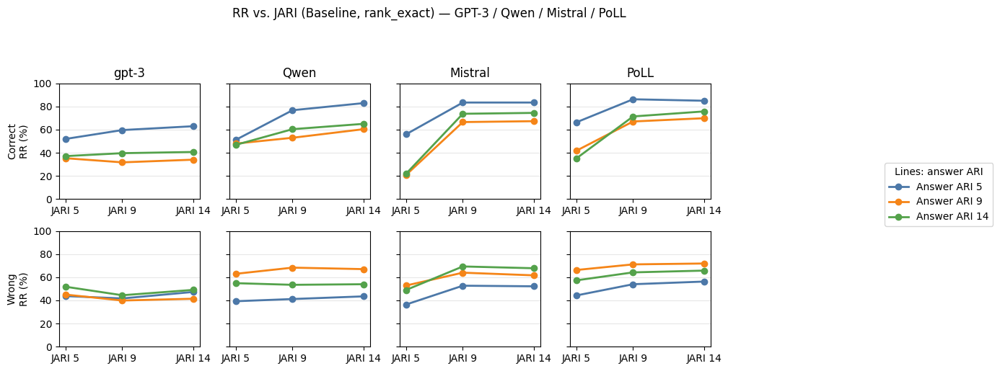

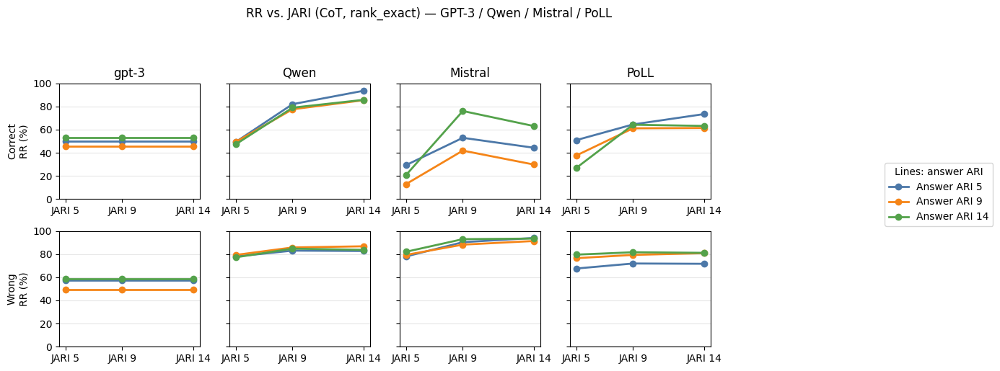

In [152]:
# Baseline
rr_slopegraph(df_rr_ensemble, prompt='baseline', metric='rank_exact',
              models=('gpt-3','Qwen','Mistral','PoLL'),
              title="RR vs. JARI (Baseline, rank_exact) — GPT-3 / Qwen / Mistral / PoLL",
              savepath="figs/rr_slope_baseline_rank_exact_gpt3_qwen_mistral_poll.pdf")

# CoT
rr_slopegraph(df_rr_ensemble, prompt='cot', metric='rank_exact',
              models=('gpt-3','Qwen','Mistral','PoLL'),
              title="RR vs. JARI (CoT, rank_exact) — GPT-3 / Qwen / Mistral / PoLL",
              savepath="figs/rr_slope_cot_rank_exact_gpt3_qwen_mistral_poll.pdf")


In [139]:
import re
import pandas as pd
import numpy as np

def stack_rr_frames(frames, model_label, prompt_label):
    """
    frames: something like [('JARI5', df5), ('JARI9', df9), ('JARI14', df14)]
            (handles an extra wrapper level too)
    model_label: canonical model name to assign ('Mistral','Qwen','gpt-3','PoLL',...)
    prompt_label: 'baseline' or 'cot'
    returns: tidy dataframe with JARI (int), model, prompt, and RR rows
    """
    # --- unwrap 1 level if needed ---
    it = frames
    if isinstance(it, (list, tuple)) and len(it) == 1 and isinstance(it[0], (list, tuple)):
        it = it[0]

    parts = []
    for pair in it:
        # tolerate ((tag, df),) elements
        if isinstance(pair, (list, tuple)) and len(pair) == 1 and isinstance(pair[0], (list, tuple)):
            pair = pair[0]
        if not (isinstance(pair, (list, tuple)) and len(pair) >= 2):
            raise ValueError(f"Expected ('JARIx', df) pair, got: {pair}")

        tag, df = pair[0], pair[1]
        jnum = int(re.sub(r'[^0-9]', '', str(tag)))  # -> 5/9/14
        tmp = df.copy()
        tmp['JARI'] = jnum
        parts.append(tmp)

    out = pd.concat(parts, ignore_index=True)

    # normalize required columns
    out['model'] = model_label
    out['prompt'] = prompt_label.lower()
    out['group']  = out['group'].str.title()
    if 'mode' in out.columns:
        out = out[out['mode'].str.upper() == 'RR'].copy()

    # ensure numeric
    for col in ('ARI','JARI','k','n'):
        if col in out.columns:
            out[col] = pd.to_numeric(out[col], errors='coerce').astype('Int64')
    for col in ('rate','ci_low','ci_high'):
        if col in out.columns:
            out[col] = pd.to_numeric(out[col], errors='coerce')

    # keep useful columns only
    keep = ['model','prompt','mode','metric','group','ARI','JARI','k','n','rate','ci_low','ci_high','exp_name']
    out = out[[c for c in keep if c in out.columns]].copy()
    return out

# ---- Build all slices with CORRECT variable names ----
df_mistral_base = stack_rr_frames(frames_mistral,      'Mistral', 'baseline')
df_mistral_cot  = stack_rr_frames(frames_mistral_cot,  'Mistral', 'cot')

df_qwen_base = stack_rr_frames(frames_qwen,     'Qwen',   'baseline')
df_qwen_cot  = stack_rr_frames(frames_qwen_cot, 'Qwen',   'cot')

df_gpt3_base = stack_rr_frames(frames_gpt3,      'gpt-3', 'baseline')
df_gpt3_cot  = stack_rr_frames(frames_gpt3_cot,  'gpt-3', 'cot')

df_poll_base = stack_rr_frames(frames_poll,     'PoLL',   'baseline')
df_poll_cot  = stack_rr_frames(frames_poll_cot, 'PoLL',   'cot')

# ---- Concatenate ensemble dataframe (RR only already enforced above) ----
df_rr_ensemble = pd.concat(
    [df_qwen_base, df_qwen_cot,
     df_mistral_base, df_mistral_cot,
     df_gpt3_base, df_gpt3_cot,
     df_poll_base, df_poll_cot],
    ignore_index=True
)

# Final tidy-ups
df_rr_ensemble['group'] = df_rr_ensemble['group'].str.title()
df_rr_ensemble['rate_pct'] = df_rr_ensemble['rate'] * 100.0

# Quick sanity checks
print("models:", sorted(df_rr_ensemble['model'].unique()))
print("prompts:", sorted(df_rr_ensemble['prompt'].unique()))
print("metrics:", sorted(df_rr_ensemble['metric'].dropna().unique()))
print(df_rr_ensemble.head(3))


models: ['Mistral', 'PoLL', 'Qwen', 'gpt-3']
prompts: ['baseline', 'cot']
metrics: ['rank_bin_overall', 'rank_exact']
  model    prompt mode            metric    group  ARI  JARI    k    n  \
0  Qwen  baseline   RR  rank_bin_overall  Correct    5     5  323  360   
1  Qwen  baseline   RR        rank_exact  Correct    5     5  184  360   
2  Qwen  baseline   RR  rank_bin_overall  Correct    9     5  297  359   

       rate    ci_low   ci_high             exp_name   rate_pct  
0  0.897222  0.861545  0.924512  Qwen-JARI5-baseline  89.722222  
1  0.511111  0.459630  0.562357  Qwen-JARI5-baseline  51.111111  
2  0.827298  0.784786  0.862880  Qwen-JARI5-baseline  82.729805  


In [ ]:
import re
import pandas as pd
import numpy as np

def stack_rr_frames(frames, model_label, prompt_label):
    """
    frames: something like [('JARI5', df5), ('JARI9', df9), ('JARI14', df14)]
            (handles an extra wrapper level too)
    model_label: canonical model name to assign ('Mistral','Qwen','gpt-3','PoLL',...)
    prompt_label: 'baseline' or 'cot'
    returns: tidy dataframe with JARI (int), model, prompt, and RR rows
    """
    # --- unwrap 1 level if needed ---
    it = frames
    if isinstance(it, (list, tuple)) and len(it) == 1 and isinstance(it[0], (list, tuple)):
        it = it[0]

    parts = []
    for pair in it:
        # tolerate ((tag, df),) elements
        if isinstance(pair, (list, tuple)) and len(pair) == 1 and isinstance(pair[0], (list, tuple)):
            pair = pair[0]
        if not (isinstance(pair, (list, tuple)) and len(pair) >= 2):
            raise ValueError(f"Expected ('JARIx', df) pair, got: {pair}")

        tag, df = pair[0], pair[1]
        jnum = int(re.sub(r'[^0-9]', '', str(tag)))  # -> 5/9/14
        tmp = df.copy()
        tmp['JARI'] = jnum
        parts.append(tmp)

    out = pd.concat(parts, ignore_index=True)

    # normalize required columns
    out['model'] = model_label
    out['prompt'] = prompt_label.lower()
    out['group']  = out['group'].str.title()
    if 'mode' in out.columns:
        out = out[out['mode'].str.upper() == 'RR'].copy()

    # ensure numeric
    for col in ('ARI','JARI','k','n'):
        if col in out.columns:
            out[col] = pd.to_numeric(out[col], errors='coerce').astype('Int64')
    for col in ('rate','ci_low','ci_high'):
        if col in out.columns:
            out[col] = pd.to_numeric(out[col], errors='coerce')

    # keep useful columns only
    keep = ['model','prompt','mode','metric','group','ARI','JARI','k','n','rate','ci_low','ci_high','exp_name']
    out = out[[c for c in keep if c in out.columns]].copy()
    return out

# ---- Build all slices with CORRECT variable names ----
df_mistral_base_score = stack_rr_frames(frames_mistral_score,      'Mistral', 'baseline')
df_mistral_cot_score  = stack_rr_frames(frames_mistral_cot_score,  'Mistral', 'cot')

df_qwen_base_score = stack_rr_frames(frames_qwen_score,     'Qwen',   'baseline')
df_qwen_cot_score  = stack_rr_frames(frames_qwen_cot_score, 'Qwen',   'cot')

df_gpt3_base_score = stack_rr_frames(frames_gpt3_score,      'gpt-3', 'baseline')
df_gpt3_cot_score  = stack_rr_frames(frames_gpt3_cot_score,  'gpt-3', 'cot')

df_poll_base_score = stack_rr_frames(frames_poll_score,     'PoLL',   'baseline')
df_poll_cot_score  = stack_rr_frames(frames_poll_cot_score, 'PoLL',   'cot')

# ---- Concatenate ensemble dataframe (RR only already enforced above) ----
df_rr_ensemble_score = pd.concat(
    [df_qwen_base_score, df_qwen_cot_score,
     df_mistral_base_score, df_mistral_cot_score,
     df_gpt3_base_score, df_gpt3_cot_score,
     df_poll_base_score, df_poll_cot_score],
    ignore_index=True
)

# Final tidy-ups
df_rr_ensemble_score['group'] = df_rr_ensemble_score['group'].str.title()
df_rr_ensemble_score['rate_pct'] = df_rr_ensemble_score['rate'] * 100.0

# Quick sanity checks
print("models:", sorted(df_rr_ensemble_score['model'].unique()))
print("prompts:", sorted(df_rr_ensemble_score['prompt'].unique()))
print("metrics:", sorted(df_rr_ensemble_score['metric'].dropna().unique()))
print(df_rr_ensemble_score.head(3))


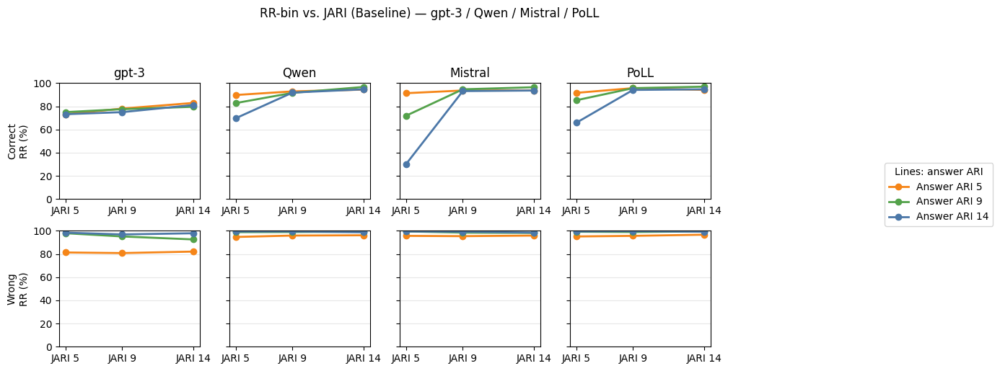

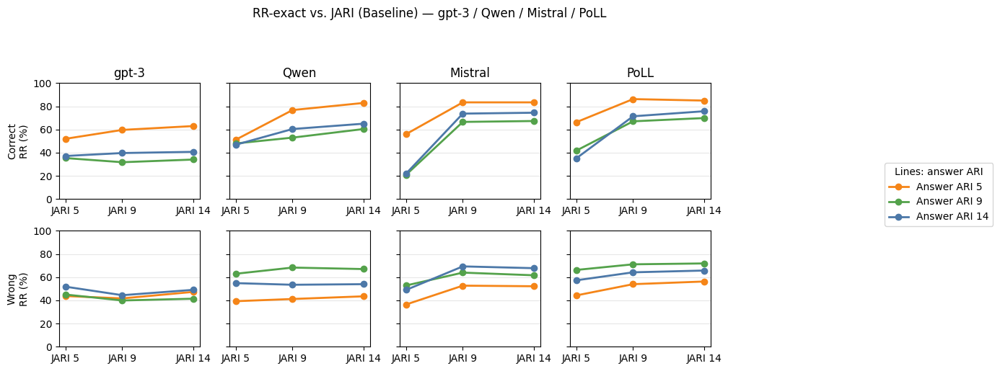

In [169]:
# rank_bin_overall slopegraph (baseline)
rr_slopegraph(df_rr_ensemble, prompt='baseline', metric='rank_bin_overall',
              models=('gpt-3','Qwen','Mistral','PoLL'),
              title="RR-bin vs. JARI (Baseline) — gpt-3 / Qwen / Mistral / PoLL",
              savepath="figs/rr_bin_baseline_gpt3_qwen_mistral_poll.pdf")

# rank_exact slopegraph (baseline)
rr_slopegraph(df_rr_ensemble, prompt='baseline', metric='rank_exact',
              models=('gpt-3','Qwen','Mistral','PoLL'),
              title="RR-exact vs. JARI (Baseline) — gpt-3 / Qwen / Mistral / PoLL",
              savepath="figs/rr_exact_baseline_gpt3_qwen_mistral_poll.pdf")


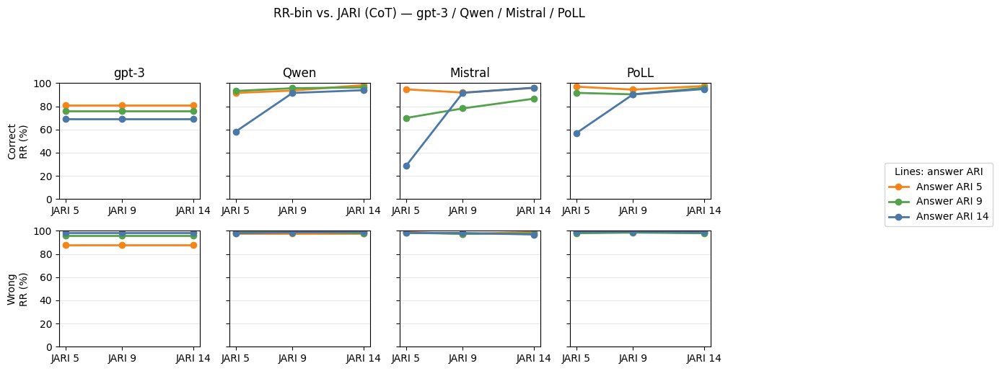

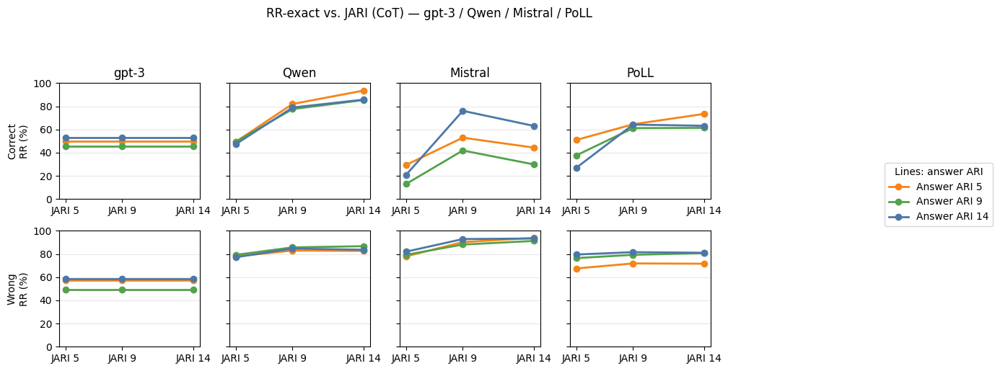

In [170]:
# rank_bin_overall slopegraph (baseline)
rr_slopegraph(df_rr_ensemble, prompt='cot', metric='rank_bin_overall',
              models=('gpt-3','Qwen','Mistral','PoLL'),
              title="RR-bin vs. JARI (CoT) — gpt-3 / Qwen / Mistral / PoLL",
              savepath="figs/rr_bin_cot_gpt3_qwen_mistral_poll.pdf")

# rank_exact slopegraph (baseline)
rr_slopegraph(df_rr_ensemble, prompt='cot', metric='rank_exact',
              models=('gpt-3','Qwen','Mistral','PoLL'),
              title="RR-exact vs. JARI (CoT) — gpt-3 / Qwen / Mistral / PoLL",
              savepath="figs/rr_exact_cot_gpt3_qwen_mistral_poll.pdf")

In [318]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def rr_slopegraph_split_legend(df_rr, prompt='baseline', metric='rank_exact',
                                 models=('GPT-4', 'LLaMA', 'PoLL'),
                                 jari_levels=(5, 9, 14), ari_levels=(5, 9, 14),
                                 groups=('Correct', 'Wrong'),
                                 title=None, savepath=None):
    
    # Define a mapping for model names
    model_name_mapping = {
        'gpt-3': 'GPT-3.5',
        'GPT-4': 'GPT-4',
        'LLaMA': 'LLaMA',
        'PoLL': 'PoLL',
        'Qwen': 'Qwen',
        'Mistral': 'Mistral'
    }

    # Create a new list of models with the mapped names for titles and labels
    mapped_models = [model_name_mapping.get(m, m) for m in models]
    
    # Filter the DataFrame and apply the name mapping to the 'model' column
    # We use a copy to avoid a SettingWithCopyWarning
    df_filtered = (df_rr[(df_rr['mode'].str.upper() == 'RR') &
                         (df_rr['prompt'] == prompt) &
                         (df_rr['metric'] == metric) &
                         (df_rr['group'].isin(groups)) &
                         (df_rr['JARI'].isin(jari_levels)) &
                         (df_rr['ARI'].isin(ari_levels))]
                     .copy())
    
    df_filtered['model'] = df_filtered['model'].replace(model_name_mapping)
    df_filtered['rate_pct'] = df_filtered['rate'] * 100
    
    d = df_filtered
    
    colors = {14: '#4C78A8', 5: '#F58518', 9: '#54A24B'}
    linestyles = {'Correct': '-', 'Wrong': '--'}
    
    nrows, ncols = len(groups), len(models)
    fig, axes = plt.subplots(nrows, ncols, figsize=(10, 6), sharey=True)
    axes = np.atleast_2d(axes)

    # if title is None or title == "":
    #     title = f"RR (no pooling) — {prompt.capitalize()} — {metric}"
    fig.suptitle(title, y=1.02)

    color_handles = [Line2D([0], [0], color=colors[a], marker='o', lw=2, label=f'Answer ARI {a}')
                     for a in ari_levels]
    style_handles = [Line2D([0], [0], color='black', linestyle='-', lw=2, label='Correct'),
                     Line2D([0], [0], color='black', linestyle='--', lw=2, label='Wrong')]

    for r, grp in enumerate(groups):
        for c, model in enumerate(mapped_models): # Loop over the mapped names
            ax = axes[r, c]
            sub = d[(d['group'] == grp) & (d['model'] == model)]
            
            for ari in ari_levels:
                vals = []
                for j in jari_levels:
                    row = sub[(sub['ARI'] == ari) & (sub['JARI'] == j)]
                    vals.append(row.iloc[0]['rate_pct'] if not row.empty else np.nan)
                ax.plot(jari_levels, vals, marker='o', lw=2, color=colors[ari],
                        linestyle=linestyles[grp])
            
            # Use the mapped name directly in the title
            ax.set_title(model if r == 0 else "")
            
            if c == 0:
                ax.set_ylabel(f"{grp}\nRR (%)")
            ax.set_xticks(jari_levels)
            ax.set_xticklabels([f'JARI {j}' for j in jari_levels])
            ax.set_ylim(0, 100)
            ax.grid(axis='y', alpha=0.3)
            
            if r == 0 and c == ncols - 1:
                ax.legend(handles=color_handles, loc='lower right', title='Answer ARI')
            if r == nrows - 1 and c == ncols - 1:
                ax.legend(handles=style_handles, loc='lower right', title='Response Type')

    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()


In [320]:
df_rr

,model,prompt,JARI,mode,metric,group,ARI,k,n,rate,ci_low,ci_high
0,GPT-4,baseline,5,RR,rank_bin_overall,Correct,5,369,391,0.943734,0.916281,0.962552
1,GPT-4,baseline,5,RR,rank_exact,Correct,5,137,391,0.350384,0.304758,0.398920
2,GPT-4,baseline,5,RR,rank_bin_overall,Correct,9,315,391,0.805627,0.763508,0.841798
3,GPT-4,baseline,5,RR,rank_exact,Correct,9,129,391,0.329923,0.285171,0.377985
4,GPT-4,baseline,5,RR,rank_bin_overall,Correct,14,180,391,0.460358,0.411579,0.509908
5,GPT-4,baseline,5,RR,rank_exact,Correct,14,154,391,0.393862,0.346689,0.443100
6,GPT-4,baseline,5,RR,rank_bin_overall,Wrong,5,382,391,0.976982,0.956839,0.987844
7,GPT-4,baseline,5,RR,rank_exact,Wrong,5,295,391,0.754476,0.709475,0.794525
8,GPT-4,baseline,5,RR,rank_bin_overall,Wrong,9,386,391,0.987212,0.970418,0.994526
9,GPT-4,baseline,5,RR,rank_exact,Wrong,9,283,391,0.723785,0.677452,0.765764


In [321]:
df_rr_ensemble

,model,prompt,mode,metric,group,ARI,JARI,k,n,rate,ci_low,ci_high,exp_name,rate_pct
0,Qwen,baseline,RR,rank_bin_overall,Correct,5,5,323,360,0.897222,0.861545,0.924512,Qwen-JARI5-baseline,89.722222
1,Qwen,baseline,RR,rank_exact,Correct,5,5,184,360,0.511111,0.459630,0.562357,Qwen-JARI5-baseline,51.111111
2,Qwen,baseline,RR,rank_bin_overall,Correct,9,5,297,359,0.827298,0.784786,0.862880,Qwen-JARI5-baseline,82.729805
3,Qwen,baseline,RR,rank_exact,Correct,9,5,172,359,0.479109,0.427927,0.530732,Qwen-JARI5-baseline,47.910864
4,Qwen,baseline,RR,rank_bin_overall,Correct,14,5,250,359,0.696379,0.646941,0.741658,Qwen-JARI5-baseline,69.637883
5,Qwen,baseline,RR,rank_exact,Correct,14,5,168,359,0.467967,0.416963,0.519648,Qwen-JARI5-baseline,46.796657
6,Qwen,baseline,RR,rank_bin_overall,Wrong,5,5,340,359,0.947075,0.918824,0.965859,Qwen-JARI5-baseline,94.707521
7,Qwen,baseline,RR,rank_exact,Wrong,5,5,141,359,0.392758,0.343631,0.444156,Qwen-JARI5-baseline,39.275766
8,Qwen,baseline,RR,rank_bin_overall,Wrong,9,5,355,359,0.988858,0.971706,0.995659,Qwen-JARI5-baseline,98.885794
9,Qwen,baseline,RR,rank_exact,Wrong,9,5,226,359,0.629526,0.578446,0.677865,Qwen-JARI5-baseline,62.952646


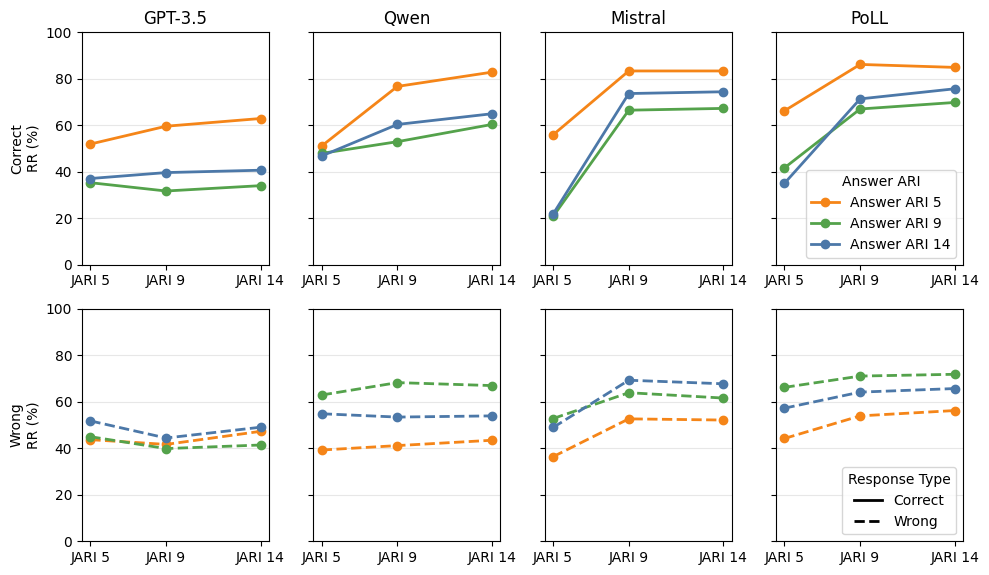

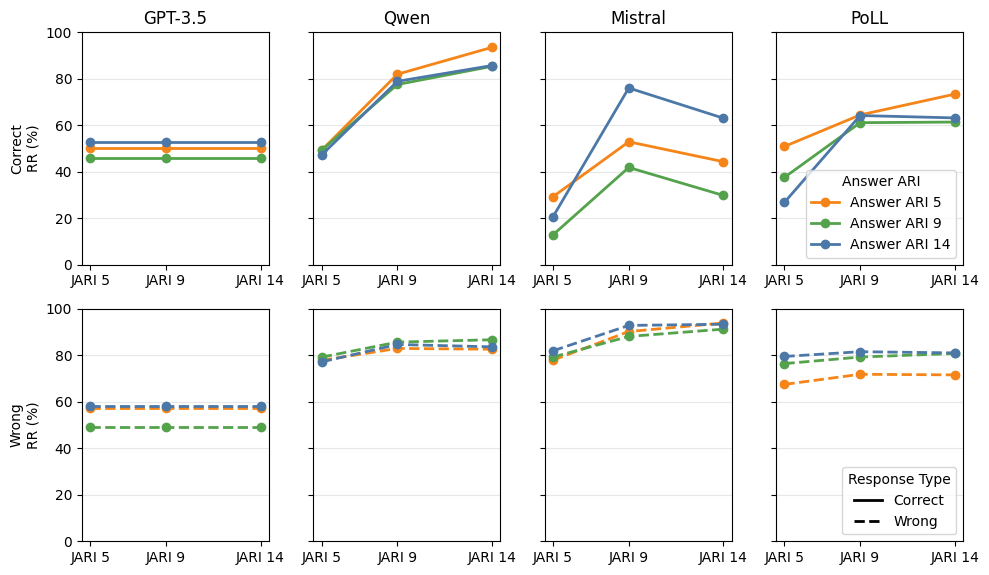

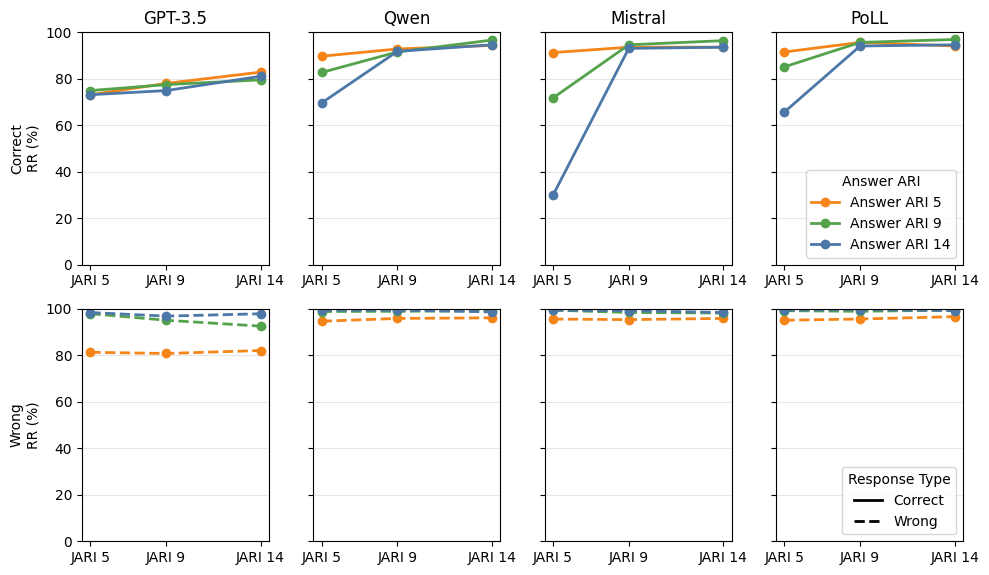

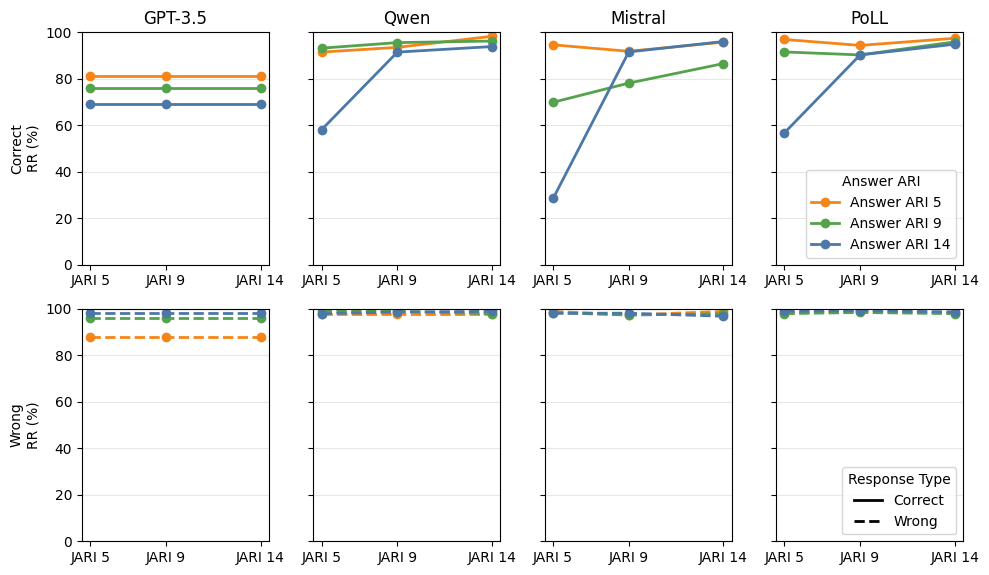

In [319]:
# RR vs. JARI (Baseline, rank_exact) — Slopegraph
# savepath="figs/rr_slope_baseline_rank_exact_split_legend.pdf"
rr_slopegraph_split_legend(df_rr_ensemble, prompt='baseline', metric='rank_exact',
                           title="",models=('gpt-3','Qwen','Mistral','PoLL'),
                           )
# RR vs. JARI (CoT, rank_exact) — Slopegraph
# savepath="figs/rr_slope_baseline_rank_exact_split_legend.pdf"
rr_slopegraph_split_legend(df_rr_ensemble, prompt='cot', metric='rank_exact',
                           title="",models=('gpt-3','Qwen','Mistral','PoLL'),
                           )
# RR vs. JARI (Baseline, rank_bin_overall) — Slopegraph
# savepath="figs/rr_slope_baseline_rank_bin_overall.pdf"
rr_slopegraph_split_legend(df_rr_ensemble, prompt='baseline', metric='rank_bin_overall',
              title="",models=('gpt-3','Qwen','Mistral','PoLL'),
              )
# RR vs. JARI (CoT, rank_bin_overall) — Slopegraph
# savepath="figs/rr_slope_cot_rank_bin_overall.pdf"
rr_slopegraph_split_legend(df_rr_ensemble, prompt='cot', metric='rank_bin_overall',
              title="",models=('gpt-3','Qwen','Mistral','PoLL'),
              )

In [ ]:
# --- Build ENSEMBLE + PoLL tidy frames (RR-only) ---
# If your variables are named differently, just swap them in:
#   frames_ensemble_score, frames_ensemble_cot_score
#   frames_poll_score,     frames_poll_cot_score

df_ens_base_score = stack_rr_frames(frames_ensemble_score,      'Ensemble', 'baseline')
df_ens_cot_score  = stack_rr_frames(frames_ensemble_cot_score,  'Ensemble', 'cot')

# # PoLL (you may already have these; safe to reassign)
# df_poll_base_score = stack_rr_frames(frames_poll_score,     'PoLL', 'baseline')
# df_poll_cot_score  = stack_rr_frames(frames_poll_cot_score, 'PoLL', 'cot')

# Combine just Ensemble + PoLL
df_rr_ens_poll_score = pd.concat(
    [df_ens_base_score, df_ens_cot_score, df_poll_base_score, df_poll_cot_score],
    ignore_index=True
)

# Tidy up
df_rr_ens_poll_score['group'] = df_rr_ens_poll_score['group'].str.title()
df_rr_ens_poll_score['rate_pct'] = df_rr_ens_poll_score['rate'] * 100.0

print("models:", sorted(df_rr_ens_poll_score['model'].unique()))
print("prompts:", sorted(df_rr_ens_poll_score['prompt'].unique()))
print("metrics:", sorted(df_rr_ens_poll_score['metric'].dropna().unique()))
print(df_rr_ens_poll_score.head(3))

# ---------- Slopegraphs (Ensemble vs PoLL) ----------
# Baseline — rank_bin_overall
rr_slopegraph(
    df_rr_ens_poll_score, prompt='baseline', metric='rank_bin_overall',
    models=('Ensemble','PoLL'),
    title="RR-bin vs. JARI (Baseline) — Ensemble vs PoLL",
    savepath="figs/rr_bin_baseline_ensemble_vs_poll.pdf"
)

# Baseline — rank_exact
rr_slopegraph(
    df_rr_ens_poll_score, prompt='baseline', metric='rank_exact',
    models=('Ensemble','PoLL'),
    title="RR-exact vs. JARI (Baseline) — Ensemble vs PoLL",
    savepath="figs/rr_exact_baseline_ensemble_vs_poll.pdf"
)

# CoT — rank_bin_overall
rr_slopegraph(
    df_rr_ens_poll_score, prompt='cot', metric='rank_bin_overall',
    models=('Ensemble','PoLL'),
    title="RR-bin vs. JARI (CoT) — Ensemble vs PoLL",
    savepath="figs/rr_bin_cot_ensemble_vs_poll.pdf"
)

# CoT — rank_exact
rr_slopegraph(
    df_rr_ens_poll_score, prompt='cot', metric='rank_exact',
    models=('Ensemble','PoLL'),
    title="RR-exact vs. JARI (CoT) — Ensemble vs PoLL",
    savepath="figs/rr_exact_cot_ensemble_vs_poll.pdf"
)

# (Optional) If you still want the four-model comparison too, just keep using:
# rr_slopegraph(df_rr_ensemble_score, prompt='baseline', metric='rank_bin_overall',
#               models=('gpt-3','Qwen','Mistral','PoLL'), ...)


In [106]:
import re
import pandas as pd

def concat_jari_frames(frames, model_name_fix=None):
    """
    Accepts any of:
      - [('JARI5', df5), ('JARI9', df9), ('JARI14', df14)]
      - (('JARI5', df5), ('JARI9', df9), ('JARI14', df14))
      - ([('JARI5', df5), ('JARI9', df9), ('JARI14', df14)],)   # extra wrapper
    Returns one tidy dataframe with a numeric JARI column.
    """
    # --- normalize nesting ---
    it = frames
    # unwrap single-element tuple/list that contains the real iterable
    if isinstance(it, (list, tuple)) and len(it) == 1 and isinstance(it[0], (list, tuple)):
        it = it[0]

    parts = []
    for pair in it:
        # be tolerant if an element itself is wrapped, e.g., (('JARI5', df5),)
        if isinstance(pair, (list, tuple)) and len(pair) == 1 and isinstance(pair[0], (list, tuple)):
            pair = pair[0]
        if not (isinstance(pair, (list, tuple)) and len(pair) >= 2):
            raise ValueError(f"Expected ('JARIx', df) pair, got: {type(pair)} -> {pair}")

        tag, df = pair[0], pair[1]
        jnum = int(re.sub(r'[^0-9]', '', str(tag)))  # 5/9/14
        tmp = df.copy()
        tmp['JARI'] = jnum
        parts.append(tmp)

    out = pd.concat(parts, ignore_index=True)

    # add/normalize prompt
    if 'prompt' not in out.columns:
        out['prompt'] = out['exp_name'].str.extract(r'-(Baseline|baseline|CoT|cot)', expand=False).str.lower()
        out['prompt'] = out['prompt'].fillna('baseline')

    # normalize model names
    def _norm(m):
        s = str(m).strip()
        u = s.upper()
        if 'POLL' in u:  return 'PoLL'
        if 'LLAMA' in u: return 'LLaMA'
        if u in ('GPT-4','GPT4','GPT_4'): return 'GPT-4'
        if u.startswith('QWEN'): return 'Qwen'
        if u.startswith('MISTRAL'): return 'Mistral'
        if u in ('GPT-3','GPT3','GPT_3','GPT-3.5','GPT3.5'): return 'gpt-3'
        return s
    out['model'] = out['model'].apply(_norm)
    if model_name_fix is not None:
        out['model'] = model_name_fix

    out['group'] = out['group'].str.title()
    out['ARI']  = out['ARI'].astype(int)
    out['JARI'] = out['JARI'].astype(int)
    out['rate'] = out['rate'].astype(float)

    keep = ['model','prompt','mode','metric','group','ARI','JARI','rate','ci_low','ci_high','k','n','exp_name']
    out = out[[c for c in keep if c in out.columns]].copy()
    return out


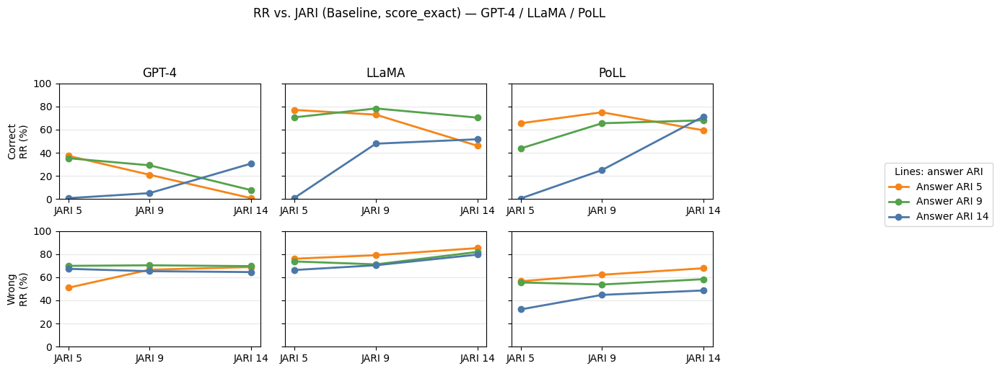

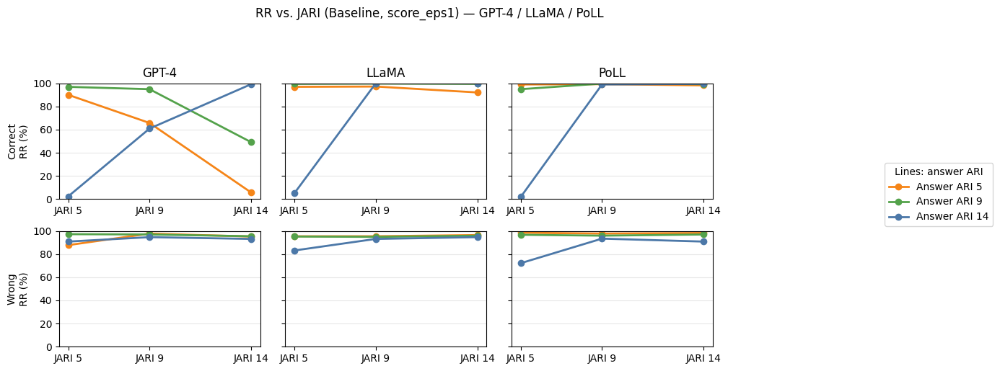

In [171]:
df_poll  = concat_jari_frames(jari_frames_score_poll, model_name_fix='PoLL')
df_llama = concat_jari_frames(jari_frames_llama,       model_name_fix='LLaMA')
df_gpt4  = concat_jari_frames(jari_score_frames,       model_name_fix='GPT-4')

df_rr_score = pd.concat([df_gpt4, df_llama, df_poll], ignore_index=True)

# score_exact
rr_slopegraph(df_rr_score, prompt='baseline', metric='score_exact',
              models=('GPT-4','LLaMA','PoLL'),
              title="RR vs. JARI (Baseline, score_exact) — GPT-4 / LLaMA / PoLL",
              savepath="figs/rr_slope_baseline_score_exact_gpt4_llama_poll.pdf")

# score_eps1
rr_slopegraph(df_rr_score, prompt='baseline', metric='score_eps1',
              models=('GPT-4','LLaMA','PoLL'),
              title="RR vs. JARI (Baseline, score_eps1) — GPT-4 / LLaMA / PoLL",
              savepath="figs/rr_slope_baseline_score_eps1_gpt4_llama_poll.pdf")


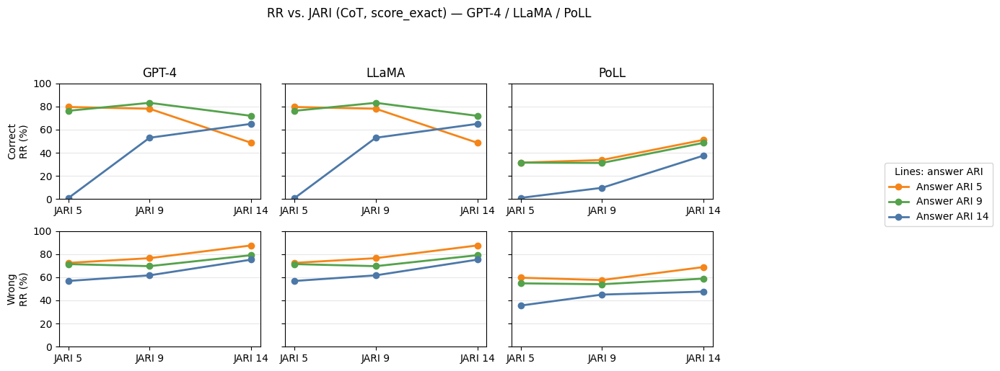

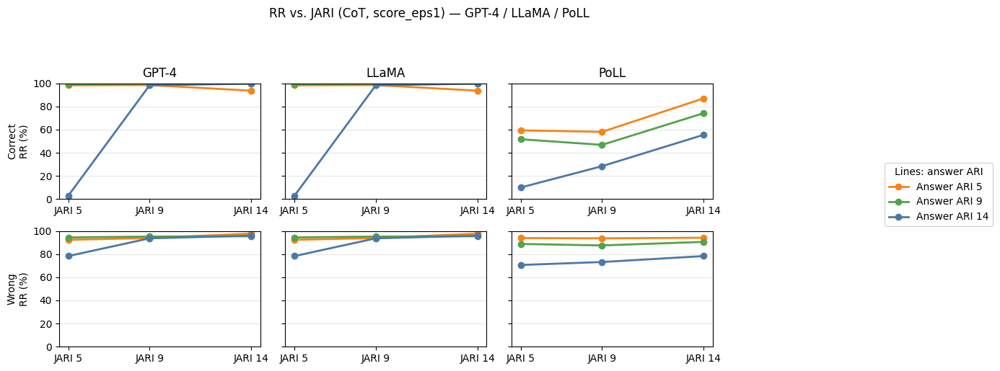

In [172]:
df_poll_cot  = concat_jari_frames(jari_frames_score_cot_poll, model_name_fix='PoLL')
df_llama_cot = concat_jari_frames(jari_frames_llama_cot,       model_name_fix='LLaMA')
df_gpt4_cot  = concat_jari_frames(jari_score_frames_cot,       model_name_fix='GPT-4')

df_rr_score_cot = pd.concat([df_gpt4_cot, df_llama_cot, df_poll_cot], ignore_index=True)

# score_exact
rr_slopegraph(df_rr_score_cot, prompt='cot', metric='score_exact',
              models=('GPT-4','LLaMA','PoLL'),
              title="RR vs. JARI (CoT, score_exact) — GPT-4 / LLaMA / PoLL",
              savepath="figs/rr_slope_baseline_score_exact_gpt4_llama_poll_cot.pdf")

# score_eps1
rr_slopegraph(df_rr_score_cot, prompt='cot', metric='score_eps1',
              models=('GPT-4','LLaMA','PoLL'),
              title="RR vs. JARI (CoT, score_eps1) — GPT-4 / LLaMA / PoLL",
              savepath="figs/rr_slope_baseline_score_eps1_gpt4_llama_poll_cot.pdf")


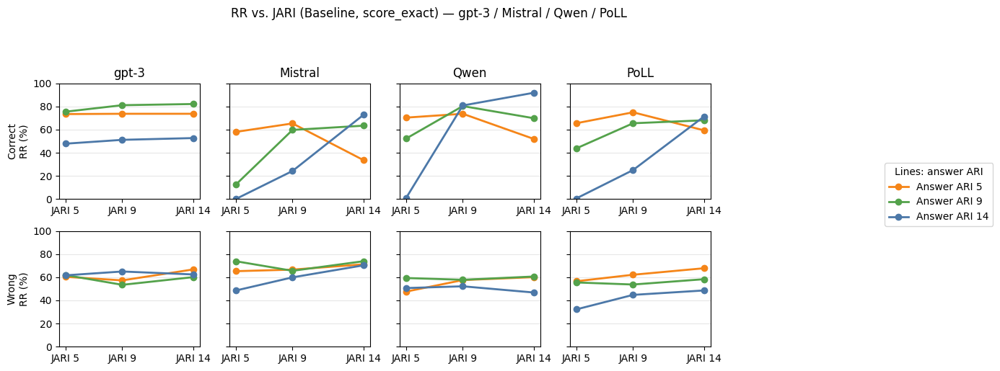

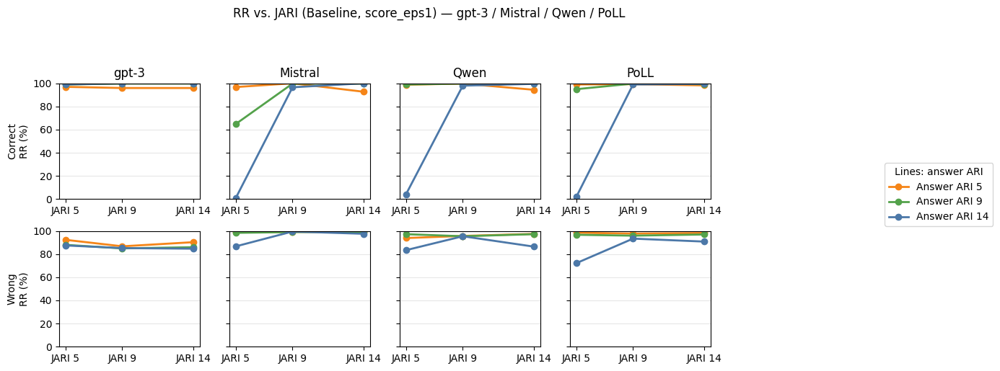

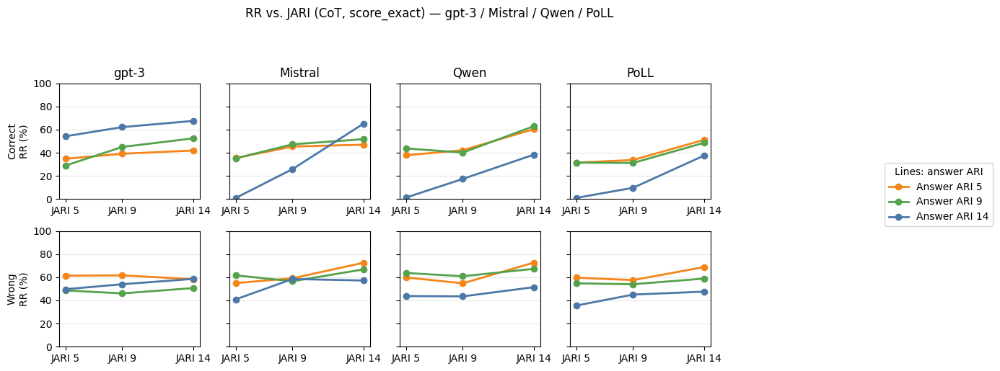

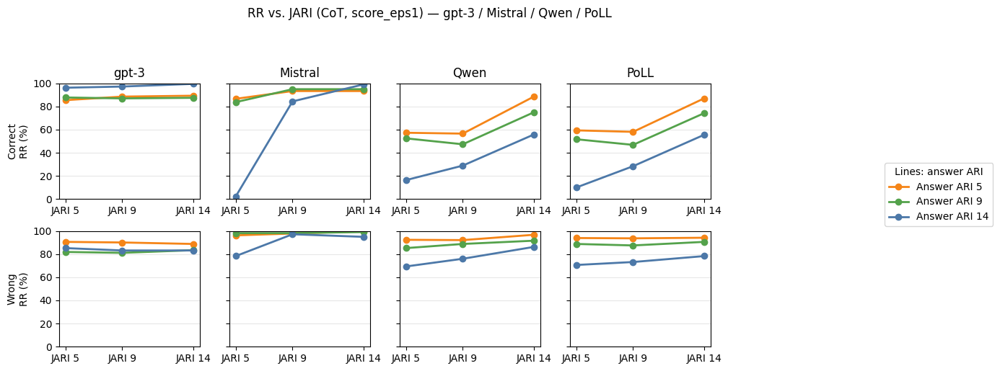

In [173]:
# ---------- 1) Tidy up the three model groups (baseline & CoT) ----------
# Your lists provided:
# frames_mistral_score, frames_mistral_cot_score
# frames_qwen_score,    frames_qwen_cot_score
# frames_gpt3_score,    frames_gpt3_cot_score

df_gpt3_base   = concat_jari_frames(frames_gpt3_score,        model_name_fix='gpt-3')
df_gpt3_cot    = concat_jari_frames(frames_gpt3_cot_score,     model_name_fix='gpt-3')

df_mistral_base = concat_jari_frames(frames_mistral_score,     model_name_fix='Mistral')
df_mistral_cot  = concat_jari_frames(frames_mistral_cot_score, model_name_fix='Mistral')

df_qwen_base   = concat_jari_frames(frames_qwen_score,         model_name_fix='Qwen')
df_qwen_cot    = concat_jari_frames(frames_qwen_cot_score,     model_name_fix='Qwen')

# Combined dataframes for plotting
df_rr_score_baseline = pd.concat([df_gpt3_base, df_mistral_base, df_qwen_base,df_poll], ignore_index=True)
df_rr_score_cot      = pd.concat([df_gpt3_cot,  df_mistral_cot,  df_qwen_cot,df_poll_cot ], ignore_index=True)

# (Optional) sanity checks
# display(df_rr_score_baseline.head())
# display(df_rr_score_cot.head())

# ---------- 2) Plot slopegraphs (baseline) ----------
# score_exact
rr_slopegraph(
    df_rr_score_baseline,
    prompt='baseline',
    metric='score_exact',
    models=('gpt-3','Mistral','Qwen','PoLL'),
    title="RR vs. JARI (Baseline, score_exact) — gpt-3 / Mistral / Qwen / PoLL",
    savepath="figs/rr_slope_baseline_score_exact_gpt3_mistral_qwen.pdf"
)

# score_eps1
rr_slopegraph(
    df_rr_score_baseline,
    prompt='baseline',
    metric='score_eps1',
    models=('gpt-3','Mistral','Qwen','PoLL'),
    title="RR vs. JARI (Baseline, score_eps1) — gpt-3 / Mistral / Qwen / PoLL",
    savepath="figs/rr_slope_baseline_score_eps1_gpt3_mistral_qwen.pdf"
)

# ---------- 3) Plot slopegraphs (CoT) ----------
rr_slopegraph(
    df_rr_score_cot,
    prompt='cot',
    metric='score_exact',
    models=('gpt-3','Mistral','Qwen','PoLL'),
    title="RR vs. JARI (CoT, score_exact) — gpt-3 / Mistral / Qwen / PoLL",
    savepath="figs/rr_slope_cot_score_exact_gpt3_mistral_qwen.pdf"
)

rr_slopegraph(
    df_rr_score_cot,
    prompt='cot',
    metric='score_eps1',
    models=('gpt-3','Mistral','Qwen','PoLL'),
    title="RR vs. JARI (CoT, score_eps1) — gpt-3 / Mistral / Qwen / PoLL",
    savepath="figs/rr_slope_cot_score_eps1_gpt3_mistral_qwen.pdf"
)

# # score_exact
# rr_slopegraph(df_rr_score_cot, prompt='cot', metric='score_exact',
#               models=('GPT-4','LLaMA','PoLL'),
#               title="RR vs. JARI (CoT, score_exact) — GPT-4 / LLaMA / PoLL",
#               savepath="figs/rr_slope_baseline_score_exact_gpt4_llama_poll_cot.pdf")

# # score_eps1
# rr_slopegraph(df_rr_score_cot, prompt='cot', metric='score_eps1',
#               models=('GPT-4','LLaMA','PoLL'),
#               title="RR vs. JARI (CoT, score_eps1) — GPT-4 / LLaMA / PoLL",
#               savepath="figs/rr_slope_baseline_score_eps1_gpt4_llama_poll_cot.pdf")


C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\4086103913.py:169: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(right=0.88)


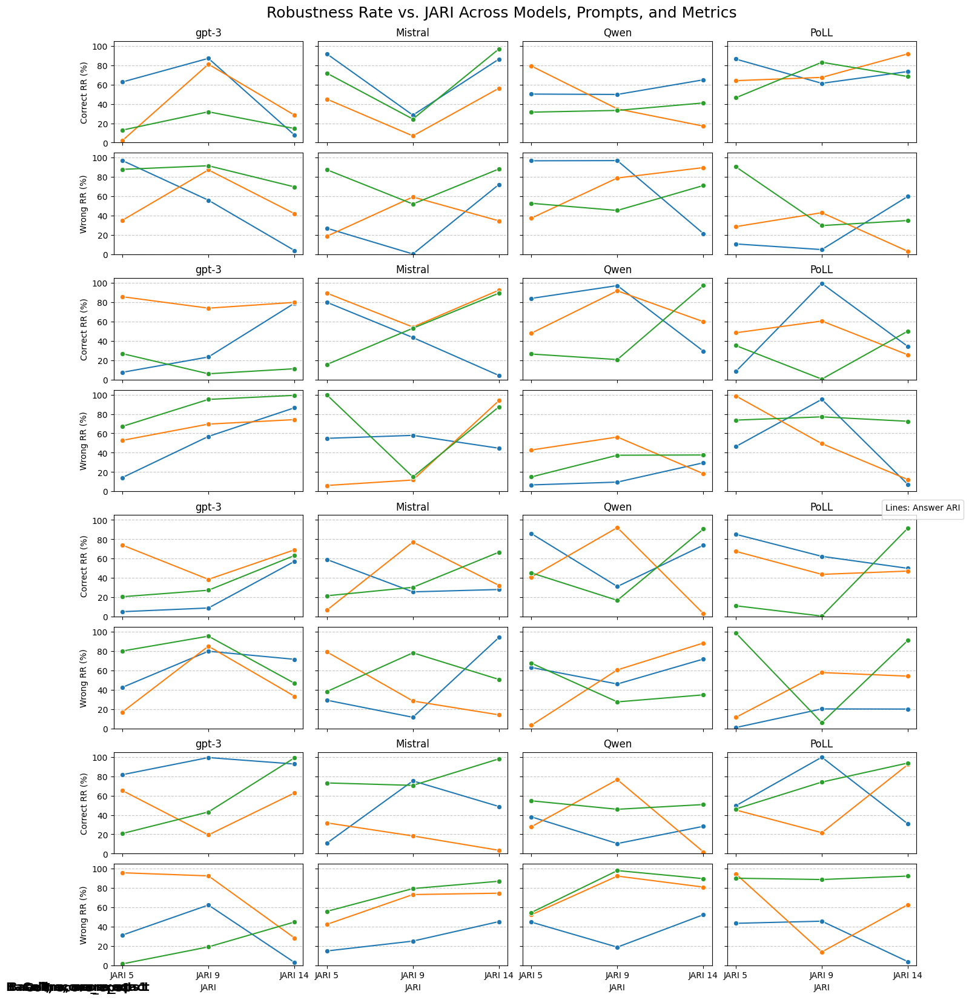

In [193]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# --- 0. Dummy Data Generation (Replace with your actual concat_jari_frames logic) ---
# This function should be replaced by your actual 'concat_jari_frames'
# ensuring it produces data in the 'long' format described above.
def concat_jari_frames(raw_frames_list, model_name_fix, prompt_strat):
    """
    Dummy function to simulate the output of your concat_jari_frames.
    Your actual implementation needs to process your raw dataframes
    (e.g., frames_gpt3_score, frames_mistral_cot_score) and
    reshape them into the 'long' format required for seaborn plotting.
    """
    all_data = []
    jari_levels = ['JARI 5', 'JARI 9', 'JARI 14']
    answer_aris = ['Answer ARI 5', 'Answer ARI 9', 'Answer ARI 14']
    metric_names = ['score_exact', 'score_eps1'] # As per your plotting calls
    metric_types = ['Correct RR', 'Wrong RR'] # As per your plot rows

    for jari in jari_levels:
        for ans_ari in answer_aris:
            for metric_name in metric_names:
                for metric_type in metric_types:
                    # Generate some random data for demonstration
                    value = np.random.uniform(0, 100)
                    all_data.append({
                        'model': model_name_fix,
                        'jari': jari,
                        'answer_ari': ans_ari,
                        'metric_name': metric_name,
                        'metric_type': metric_type,
                        'metric_value': value,
                        'prompt_strategy': prompt_strat
                    })
    return pd.DataFrame(all_data)

# --- 1. Combine Your Dataframes (based on your existing code logic) ---
# Replace 'None' with your actual raw data frames if concat_jari_frames needs them.
# Ensure 'df_poll' and 'df_poll_cot' are also structured correctly.
df_gpt3_base = concat_jari_frames(None, 'gpt-3', 'Baseline')
df_gpt3_cot = concat_jari_frames(None, 'gpt-3', 'CoT')
df_mistral_base = concat_jari_frames(None, 'Mistral', 'Baseline')
df_mistral_cot = concat_jari_frames(None, 'Mistral', 'CoT')
df_qwen_base = concat_jari_frames(None, 'Qwen', 'Baseline')
df_qwen_cot = concat_jari_frames(None, 'Qwen', 'CoT')
df_poll_base = concat_jari_frames(None, 'PoLL', 'Baseline') # Assuming PoLL data exists
df_poll_cot = concat_jari_frames(None, 'PoLL', 'CoT') # Assuming PoLL CoT data exists

# Concatenate all data into a single DataFrame
df_all_rr_data = pd.concat([
    df_gpt3_base, df_gpt3_cot,
    df_mistral_base, df_mistral_cot,
    df_qwen_base, df_qwen_cot,
    df_poll_base, df_poll_cot
], ignore_index=True)

# Ensure 'jari' levels are ordered correctly for plotting
df_all_rr_data['jari_order'] = pd.Categorical(
    df_all_rr_data['jari'],
    categories=['JARI 5', 'JARI 9', 'JARI 14'],
    ordered=True
)
df_all_rr_data = df_all_rr_data.sort_values('jari_order')

# --- 2. Define Plotting Function ---
def plot_all_rr_analysis_in_one_place(data_df, models_to_plot):
    prompt_strategies = ['Baseline', 'CoT']
    metrics = ['score_exact', 'score_eps1']
    metric_types = ['Correct RR', 'Wrong RR'] # These map to rows within each block
    answer_aris_colors = ['Answer ARI 5', 'Answer ARI 9', 'Answer ARI 14']

    # Calculate total rows and columns for the entire figure grid
    # Each 'block' (e.g., Baseline-score_exact) will have 2 rows (Correct/Wrong RR)
    total_rows = len(metrics) * len(prompt_strategies) * len(metric_types)
    total_cols = len(models_to_plot)

    # Create the figure and a grid of subplots
    fig, axes = plt.subplots(
        nrows=total_rows,
        ncols=total_cols,
        figsize=(total_cols * 3.5, total_rows * 2), # Adjust overall figure size
        sharex=True, # Share x-axis across all subplots
        sharey='row', # Share y-axis within each 'Correct RR' or 'Wrong RR' row group
        constrained_layout=True # Helps automatically adjust subplot params for tight layout
    )
    # Ensure axes is always a 2D array, even if there's only one row or column
    axes = np.atleast_2d(axes)

    # Add a main title for the entire figure
    fig.suptitle("Robustness Rate vs. JARI Across Models, Prompts, and Metrics", fontsize=18, y=1.02)

    # Loop through each combination to fill the subplots
    current_row_index_in_fig = 0
    for ps_idx, prompt_strategy in enumerate(prompt_strategies):
        for m_idx, metric_name in enumerate(metrics):
            # Add a title for this specific block (e.g., "Baseline, score_exact")
            # We place this title above the first row of this block of plots
            block_title_y_pos = axes[current_row_index_in_fig, 0].get_position().y1 + 0.02
            fig.text(0.5, block_title_y_pos,
                     f"{prompt_strategy}, {metric_name}",
                     ha='center', va='bottom', fontsize=14, weight='bold',
                     transform=fig.transFigure.inverted() + fig.transFigure) # Adjust transform for placing title correctly

            for mt_idx, metric_type in enumerate(metric_types):
                # Calculate the exact row index in the overall figure grid
                current_subplot_row_index = current_row_index_in_fig + mt_idx

                for col_idx, model in enumerate(models_to_plot):
                    ax = axes[current_subplot_row_index, col_idx]

                    # Filter data for the current subplot
                    plot_data = data_df[
                        (data_df['prompt_strategy'] == prompt_strategy) &
                        (data_df['metric_name'] == metric_name) &
                        (data_df['model'] == model) & # Filter by exact model name
                        (data_df['metric_type'] == metric_type)
                    ]

                    # Plot the lines
                    sns.lineplot(
                        data=plot_data,
                        x='jari_order', # Use ordered categorical for correct x-axis order
                        y='metric_value',
                        hue='answer_ari',
                        marker='o',
                        ax=ax,
                        errorbar=None, # Based on your example plots
                        palette='tab10', # Or a custom palette for Answer ARI colors
                        legend=False # We will create a global legend later
                    )

                    # --- Customize each subplot ---
                    ax.set_ylim(0, 105) # Robustness Rate is usually 0-100%
                    ax.grid(axis='y', linestyle='--', alpha=0.7)

                    # Set subplot titles (model name) only for the very first row of each block
                    if mt_idx == 0: # This corresponds to the 'Correct RR' row in each block
                        ax.set_title(model, fontsize=12)
                    else:
                        ax.set_title('') # No title for 'Wrong RR' subplots

                    # X-axis labels: only for the very bottom row of the entire figure
                    if current_subplot_row_index == total_rows - 1:
                        ax.set_xlabel('JARI')
                    else:
                        ax.set_xlabel('')
                        ax.tick_params(labelbottom=False) # Hide x-axis ticks/labels for upper rows

                    # Y-axis labels: only for the leftmost column of each metric_type row
                    if col_idx == 0:
                        ax.set_ylabel(f'{metric_type} (%)', fontsize=10)
                    else:
                        ax.set_ylabel('')
                        ax.tick_params(labelleft=False) # Hide y-axis ticks/labels for inner columns

            # After plotting Correct RR and Wrong RR for all models in a block,
            # increment current_row_index_in_fig by the number of metric_types (2)
            current_row_index_in_fig += len(metric_types)

    # Create a single global legend for 'Answer ARI' lines
    # Get handles and labels from an arbitrary subplot (e.g., top-left one)
    handles, labels = axes[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, title="Lines: Answer ARI",
               loc='center right', bbox_to_anchor=(1.05, 0.5), fontsize=10)

    # Adjust the plot area to make space for the global legend
    plt.subplots_adjust(right=0.88)
    plt.show()

# --- 3. Call the Plotting Function with Your Combined Data ---
# Define the order of models for your columns
models_for_columns = ['gpt-3', 'Mistral', 'Qwen', 'PoLL'] # Adjust this list if you have GPT-4/LLaMA in other runs

plot_all_rr_analysis_in_one_place(df_all_rr_data, models_for_columns)

In [198]:
import numpy as np
import pandas as pd

def average_rr_by_judge(
    df,
    by=("model","prompt","metric","group","ARI","JARI"),
    judge_col="exp_name",        # one row per judge run is fine; change if you have a 'judge_id'
):
    d = df.copy()
    d = d[d["mode"].str.upper()=="RR"]
    d["rate"] = d["rate"].astype(float)
    # per judge within each cell
    per_judge = (d
        .groupby(list(by)+[judge_col], as_index=False)
        .agg(k=("k","sum"), n=("n","sum")))
    per_judge["r"] = per_judge["k"] / per_judge["n"]

    # micro: pool k,n across judges
    micro = (per_judge
        .groupby(list(by), as_index=False)
        .agg(k=("k","sum"), n=("n","sum")))
    micro["RR_micro"] = micro["k"]/micro["n"]

    # macro: mean across judges (equal weight)
    macro = (per_judge
        .groupby(list(by), as_index=False)
        .agg(RR_macro=("r","mean"),
             J=("r","size"),
             sd_judge=("r","std")))
    # standard error across judges (for error bars)
    macro["se_judge"] = macro["sd_judge"] / np.sqrt(macro["J"].clip(lower=1))

    # merge
    out = micro.merge(macro, on=list(by), how="left")

    # Wilson 95% CI for micro (useful error bars)
    from math import sqrt
    z = 1.96
    p = out["RR_micro"].values
    n = out["n"].values
    denom = 1 + z**2/n
    center = (p + z**2/(2*n)) / denom
    half = z*np.sqrt((p*(1-p) + z**2/(4*n)) / n) / denom
    out["micro_low"]  = (center - half)*100
    out["micro_high"] = (center + half)*100

    # present in percent
    out["RR_micro_pct"] = out["RR_micro"]*100
    out["RR_macro_pct"] = out["RR_macro"]*100
    return out


In [199]:
avg = average_rr_by_judge(
    df_rr_score,
    by=("model","prompt","metric","group","ARI","JARI"),
    judge_col="exp_name"  # change if you have judge_id
)

# Filter for Baseline, Correct
view = avg[(avg["prompt"]=="baseline") & (avg["group"]=="Correct")]


In [200]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_rr_summary(view, facet=("ARI","JARI")):
    g = sns.FacetGrid(view, row=facet[1], col=facet[0], sharey=True, height=2.4, aspect=1.1)
    def _panel(data, color, **k):
        ax = plt.gca()
        # bars: micro average
        sns.barplot(data=data, x="model", y="RR_micro_pct", hue="metric",
                    edgecolor="black", ax=ax)
        # CI whiskers from Wilson
        for i,(xv,row) in enumerate(data.iterrows()):
            # multiple bars per metric—let seaborn place them; use containers:
            pass
        ax.set_ylim(0,100); ax.grid(axis="y", alpha=.25)
        plt.setp(ax.get_xticklabels(), rotation=30, ha="right")
        # overlay macro as points
        for container in ax.containers:
            labels = [c.get_x()+c.get_width()/2 for c in container]
        # simpler: overlay dots by model/metric
        sns.stripplot(data=data, x="model", y="RR_macro_pct", hue="metric",
                      dodge=True, marker="o", size=4, alpha=.6, ax=ax)
    g.map_dataframe(_panel)
    g.fig.suptitle("RR — micro (bars) with macro (dots) and CI — by Answer ARI × Judge JARI", y=1.02)
    plt.tight_layout()


In [ ]:
df_all

,judge,prompt,ari,metric_kind,swap_flip_rate,sfr_ci_low,sfr_ci_high,flips_count,position_advantage_index,pos1_win_rate_avg,pos1_win_rate_orderA,pos1_win_rate_orderB,tie_rate_any,n_pairs_strict,n_pairs_total
0,Mistral,baseline,5,rank,0.498721,0.449416,0.548052,195,0.493606,0.746803,0.987212,0.506394,0.000000,391.0,391.0
1,Mistral,baseline,9,rank,0.508951,0.459554,0.558175,199,0.508951,0.754476,0.994885,0.514066,0.000000,391.0,391.0
2,Mistral,baseline,14,rank,0.639386,0.590648,0.685413,250,0.639386,0.819693,0.992327,0.647059,0.000000,391.0,391.0
3,Mistral,cot,5,rank,0.005128,0.001407,0.018503,2,-0.002558,0.498721,0.969309,0.028133,0.002558,390.0,391.0
4,Mistral,cot,9,rank,0.000000,0.000000,0.009779,0,-0.005115,0.497442,0.974425,0.020460,0.005115,389.0,391.0
5,Mistral,cot,14,rank,0.000000,0.000000,0.009829,0,-0.005115,0.497442,0.979540,0.015345,0.010230,387.0,391.0
6,PoLL,baseline,5,rank,0.884910,0.849466,0.912865,346,0.879795,0.939898,0.994885,0.884910,0.000000,391.0,391.0
7,PoLL,baseline,9,rank,0.900256,0.866549,0.926174,352,0.900256,0.950128,0.997442,0.902813,0.000000,391.0,391.0
8,PoLL,baseline,14,rank,0.772379,0.728286,0.811171,302,0.772379,0.886189,0.992327,0.780051,0.000000,391.0,391.0
9,PoLL,cot,5,rank,0.000000,0.000000,0.009729,0,0.000000,0.500000,0.994885,0.005115,0.000000,391.0,391.0


In [185]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def rr_bar_focus(df, metrics=("rank_exact", "rank_bin_overall"),
                 ari=5, jari=5, group="Correct", prompt="baseline",
                 title=None, ylim=(0,100), savepath=None):
    """
    Bar chart of RR (%) for a single (Answer ARI, JARI, group, prompt).
    One bar per model; hue = metric(s).
    """
    d = df.copy()
    d = d[d["mode"].str.upper()=="RR"]
    d["prompt"] = d["prompt"].str.lower()
    d["group"]  = d["group"].str.title()

    d = d[(d["prompt"]==prompt.lower()) &
          (d["group"]==group.title()) &
          (d["ARI"].astype(int)==int(ari)) &
          (d["JARI"].astype(int)==int(jari))]

    # keep only requested metrics that are present
    keep_metrics = [m for m in metrics if m in set(d["metric"])]
    d = d[d["metric"].isin(keep_metrics)].copy()
    d["RR(%)"] = d["rate"] * 100.0

    if d.empty:
        print("[warn] no rows after filtering — check inputs")
        return

    # order models nicely if you want
    order = ["GPT-4","LLaMA","PoLL","gpt-3","Mistral","Qwen"]
    d["model"] = pd.Categorical(d["model"], ordered=True,
                                categories=[m for m in order if m in set(d["model"])])
    d = d.sort_values("model")

    plt.figure(figsize=(8,4))
    ax = sns.barplot(data=d, x="model", y="RR(%)", hue="metric", edgecolor="black")
    ax.set_ylim(*ylim)
    ax.grid(axis="y", alpha=0.25)

    # dashed reference = panel mean
    ax.axhline(d["RR(%)"].mean(), ls="--", lw=1, color="crimson", alpha=0.8)

    if title is None:
        title = f"RR — Baseline | Correct | Ans ARI {ari} | JARI {jari}"
    ax.set_title(title)
    ax.set_xlabel("Model")
    ax.legend(title="Metric")

    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches="tight")
    plt.show()


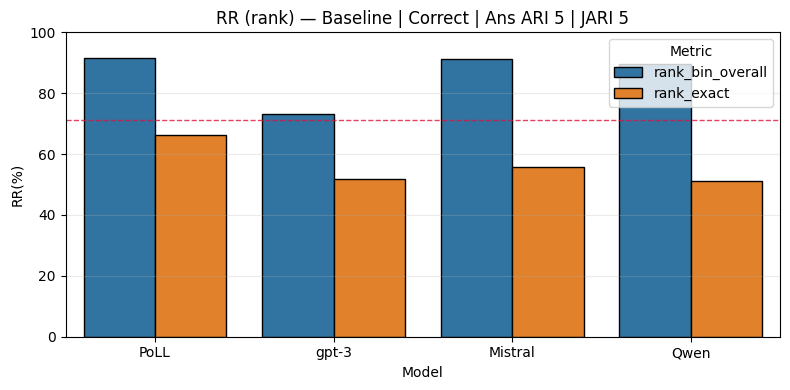

In [186]:
rr_bar_focus(df_rr_ensemble,
             metrics=("rank_exact","rank_bin_overall"),
             ari=5, jari=5, group="Correct", prompt="baseline",
             title="RR (rank) — Baseline | Correct | Ans ARI 5 | JARI 5")


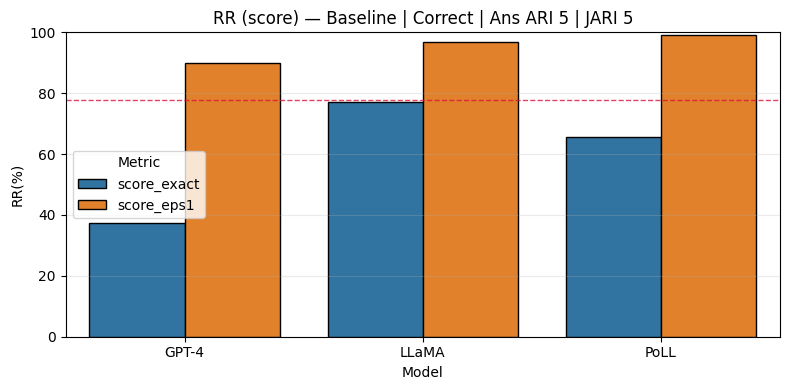

In [187]:
rr_bar_focus(df_rr_score,
             metrics=("score_exact","score_eps1"),
             ari=5, jari=5, group="Correct", prompt="baseline",
             title="RR (score) — Baseline | Correct | Ans ARI 5 | JARI 5")


In [190]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def rr_bar_grid(df,
                metrics=("score_exact","score_eps1"),
                prompt="baseline",
                group="Correct",
                aris=(5,9,14),
                jaris=(5,9,14),
                ylim=(0,100),
                title="RR (score) — Baseline | Correct",
                savepath=None):
    """
    Faceted bar grid:
      rows  = JARI levels
      cols  = Answer ARI levels
      bars  = models
      hue   = metrics (e.g., score_exact vs score_eps1)

    Expects columns: ['model','prompt','mode','metric','group','ARI','JARI','rate'].
    """
    d = df.copy()
    d = d[d["mode"].str.upper()=="RR"]
    d["prompt"] = d["prompt"].str.lower()
    d["group"]  = d["group"].str.title()
    d["ARI"]    = d["ARI"].astype(int)
    d["JARI"]   = d["JARI"].astype(int)

    d = d[(d["prompt"]==prompt.lower()) &
          (d["group"]==group.title()) &
          (d["ARI"].isin(aris)) &
          (d["JARI"].isin(jaris)) &
          (d["metric"].isin(metrics))].copy()

    if d.empty:
        print("[warn] no rows after filtering")
        return

    d["RR (%)"] = d["rate"] * 100.0

    # Nice model order if present
    nice_order = ["GPT-4","LLaMA","PoLL","gpt-3","Mistral","Qwen"]
    present = [m for m in nice_order if m in set(d["model"])]
    # append any others at the end
    present += [m for m in sorted(set(d["model"])) if m not in present]
    d["model"] = pd.Categorical(d["model"], categories=present, ordered=True)

    nrows, ncols = len(jaris), len(aris)
    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 2.6*nrows), sharey=True)
    if nrows==1 and ncols==1:
        axes = np.array([[axes]])
    elif nrows==1:
        axes = np.array([axes])
    elif ncols==1:
        axes = axes[:, None]

    for r, J in enumerate(jaris):
        for c, A in enumerate(aris):
            ax = axes[r, c]
            sub = d[(d["JARI"]==J) & (d["ARI"]==A)]
            if sub.empty:
                ax.set_visible(False)
                continue
            sns.barplot(data=sub, x="model", y="RR (%)", hue="metric",
                        edgecolor="black", ax=ax)
            ax.set_ylim(*ylim)
            ax.grid(axis="y", alpha=0.25)
            # subplot title
            ax.set_title(f"Ans ARI {A} | JARI {J}")
            # rotate ticks if many models
            ax.set_xlabel(None)
            ax.tick_params(axis="x", labelrotation=30, ha="right")

            if c==0:
                ax.set_ylabel("RR (%)")
            else:
                ax.set_ylabel(None)

            # show legend only once (we’ll put a global one)
            if r>0 or c>0:
                ax.legend_.remove()

    fig.suptitle(title, y=1.02, fontsize=14)
    # global legend (from first visible axis)
    handles, labels = axes[0,0].get_legend_handles_labels()
    fig.legend(handles, labels, title="Metric", loc="center right", bbox_to_anchor=(1.02, 0.5))
    plt.tight_layout(rect=[0,0,0.88,0.97])
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches="tight")
    plt.show()


ValueError: keyword ha is not recognized; valid keywords are ['size', 'width', 'color', 'tickdir', 'pad', 'labelsize', 'labelcolor', 'labelfontfamily', 'zorder', 'gridOn', 'tick1On', 'tick2On', 'label1On', 'label2On', 'length', 'direction', 'left', 'bottom', 'right', 'top', 'labelleft', 'labelbottom', 'labelright', 'labeltop', 'labelrotation', 'grid_agg_filter', 'grid_alpha', 'grid_animated', 'grid_antialiased', 'grid_clip_box', 'grid_clip_on', 'grid_clip_path', 'grid_color', 'grid_dash_capstyle', 'grid_dash_joinstyle', 'grid_dashes', 'grid_data', 'grid_drawstyle', 'grid_figure', 'grid_fillstyle', 'grid_gapcolor', 'grid_gid', 'grid_in_layout', 'grid_label', 'grid_linestyle', 'grid_linewidth', 'grid_marker', 'grid_markeredgecolor', 'grid_markeredgewidth', 'grid_markerfacecolor', 'grid_markerfacecoloralt', 'grid_markersize', 'grid_markevery', 'grid_mouseover', 'grid_path_effects', 'grid_picker', 'grid_pickradius', 'grid_rasterized', 'grid_sketch_params', 'grid_snap', 'grid_solid_capstyle', 'grid_solid_joinstyle', 'grid_transform', 'grid_url', 'grid_visible', 'grid_xdata', 'grid_ydata', 'grid_zorder', 'grid_aa', 'grid_c', 'grid_ds', 'grid_ls', 'grid_lw', 'grid_mec', 'grid_mew', 'grid_mfc', 'grid_mfcalt', 'grid_ms']

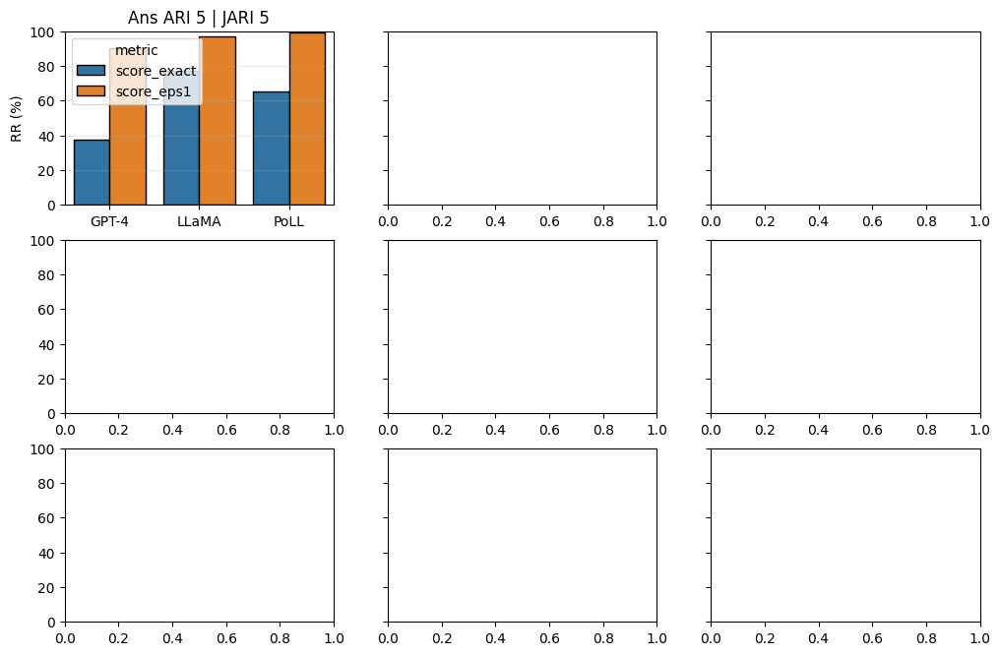

In [192]:
rr_bar_grid(
    df_rr_score,
    metrics=("score_exact","score_eps1"),
    prompt="baseline",
    group="Correct",
    aris=(5,9,14),
    jaris=(5,9,14),
    title="RR (score) — Baseline | Correct — ARI (cols) × JARI (rows)",
    savepath="figs/rr_grid_score_baseline_correct.pdf"
)


In [181]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ------------ style ------------
PALETTE = {"baseline":"#4C78A8", "cot":"#F58518"}  # Baseline / CoT
METRIC_LABEL = {
    "rank_exact":"rank_exact", "rank_bin_overall":"rank_bin",
    "score_exact":"score_exact", "score_eps1":"score_eps1"
}

def _prep_long_rr(df):
    d = df.copy()
    d = d[d["mode"].str.upper()=="RR"].copy()
    d["RR"]      = d["rate"] * 100.0
    d["prompt"]  = d["prompt"].str.lower()
    d["Prompt"]  = d["prompt"].map({"baseline":"Baseline", "cot":"CoT"}).fillna(d["prompt"])
    d["Group"]   = d["group"].str.title()
    d["JARI"]    = d["JARI"].astype(int)
    return d

def plot_rr_small_multiples_bars(
    df, model, kind="rank",
    jari_levels=(5,9,14),
    groups=("Correct","Wrong"),
    use_ref="panel_mean",   # or float, or dict {("Correct",5): value, ...}
    ylim=(0,100),
    savepath=None
):
    """
    df: long RR dataframe (columns at least: model, prompt, metric, group, JARI, rate)
    model: str (e.g., 'GPT-4', 'LLaMA', 'PoLL', 'gpt-3', 'Qwen', 'Mistral')
    kind:  'rank' -> metrics ['rank_exact','rank_bin_overall']
           'score'-> metrics ['score_exact','score_eps1']
    use_ref:
        - 'panel_mean' -> dashed line at mean RR inside each panel
        - float        -> same dashed line for all panels
        - dict         -> mapping {('Correct',5): 91.2, ('Wrong',14): 88.0, ...}
    """

    d = _prep_long_rr(df)
    d = d[d["model"]==model].copy()
    if kind == "rank":
        metrics = ["rank_exact","rank_bin_overall"]
        title = f"{model} — RR (Rank) — small multiples"
    else:
        metrics = ["score_exact","score_eps1"]
        title = f"{model} — RR (Score) — small multiples"

    d = d[d["metric"].isin(metrics) & d["JARI"].isin(jari_levels) & d["Group"].isin(groups)]
    if d.empty:
        print(f"[warn] no rows for {model} / {kind}")
        return

    # orderings
    prompt_order = ["Baseline","CoT"]
    metric_order = metrics

    # figure
    fig, axes = plt.subplots(
        nrows=len(groups), ncols=len(jari_levels),
        figsize=(13.5, 6.0), sharey=True
    )
    if axes.ndim == 1:
        axes = axes.reshape(len(groups), len(jari_levels))

    for r, grp in enumerate(groups):
        for c, j in enumerate(jari_levels):
            ax = axes[r, c]
            sub = d[(d["Group"]==grp) & (d["JARI"]==j)]

            # bar plot: x=metric, hue=Prompt (Baseline/CoT)
            sns.barplot(
                data=sub, x="metric", y="RR", hue="Prompt",
                order=metric_order, hue_order=prompt_order,
                palette=[PALETTE["baseline"], PALETTE["cot"]],
                ax=ax, edgecolor="black", linewidth=0.6
            )

            ax.set_title(f"JARI {j}" if r==0 else "")
            if c==0: ax.set_ylabel(f"{grp}\nRR (%)")
            else:    ax.set_ylabel("")
            ax.set_xlabel("")
            ax.set_xticklabels([METRIC_LABEL[m] for m in metric_order])
            ax.set_ylim(*ylim)
            ax.grid(axis="y", alpha=0.25)

            # dashed reference line
            if isinstance(use_ref, dict):
                ref_val = use_ref.get((grp, j), None)
            elif use_ref == "panel_mean":
                ref_val = sub["RR"].mean() if not sub.empty else None
            else:  # scalar
                ref_val = float(use_ref)
            if ref_val is not None and np.isfinite(ref_val):
                ax.axhline(ref_val, ls="--", lw=1, color="crimson", alpha=0.8)

            # tidy legend per-row only on rightmost
            if not (r==0 and c==len(jari_levels)-1):
                ax.legend_.remove()

    # one legend at the bottom
    handles, labels = axes[0, -1].get_legend_handles_labels()
    fig.legend(handles, labels, ncol=3, loc="lower center", bbox_to_anchor=(0.5, -0.03), frameon=False)

    fig.suptitle(title, y=1.02, fontsize=14)
    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches="tight")
    plt.show()


[warn] no rows for GPT-4 / rank


C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\1635367623.py:85: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([METRIC_LABEL[m] for m in metric_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\1635367623.py:85: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([METRIC_LABEL[m] for m in metric_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\1635367623.py:85: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([METRIC_LABEL[m] for m in metric_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\1635367623.py:85: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([

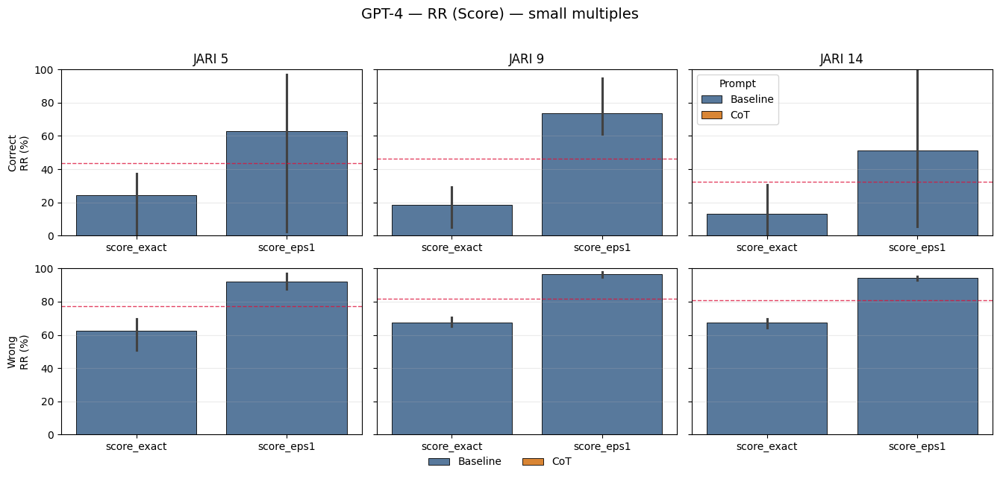

C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\1635367623.py:85: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([METRIC_LABEL[m] for m in metric_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\1635367623.py:85: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([METRIC_LABEL[m] for m in metric_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\1635367623.py:85: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([METRIC_LABEL[m] for m in metric_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\1635367623.py:85: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([

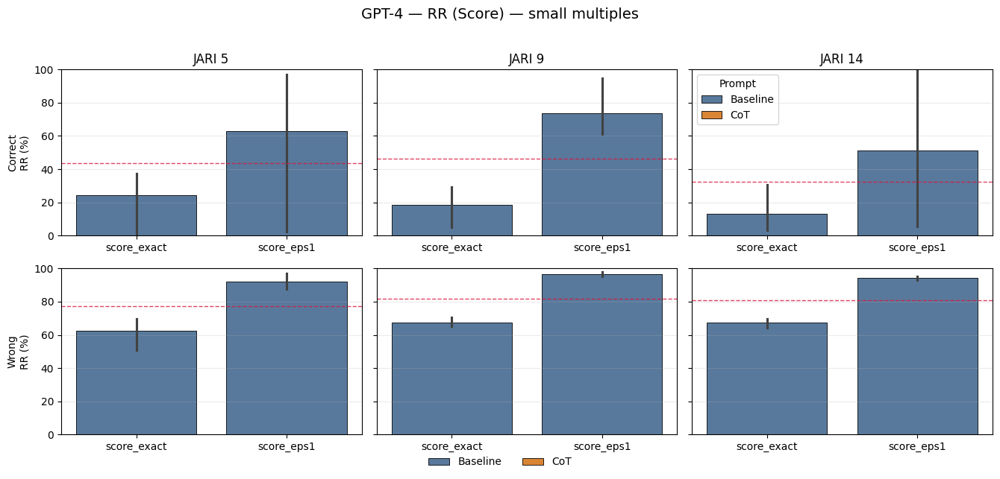

In [184]:

# ----------------- how to call -----------------
# Rank-style figure for one model
plot_rr_small_multiples_bars(df_rr_ensemble, model='GPT-4', kind='rank',
                             savepath='figs/gpt4_rank_smallmultiples.png')

# Score-style figure for the same model
plot_rr_small_multiples_bars(df_rr_score,     model='GPT-4', kind='score',
                             savepath='figs/gpt4_score_smallmultiples.png')

# Optional: pass your *consistency rate* as the dashed line:
# cr_map = {('Correct',5): 92.3, ('Correct',9): 95.1, ...}
plot_rr_small_multiples_bars(df_rr_score, 'GPT-4', 'score')


In [ ]:
df_poll_cot  = concat_jari_frames(jari_frames_score_cot_poll, model_name_fix='PoLL')
df_llama_cot = concat_jari_frames(jari_frames_llama_cot,       model_name_fix='LLaMA')
df_gpt4_cot  = concat_jari_frames(jari_score_frames_cot,       model_name_fix='GPT-4')

df_rr_score_cot = pd.concat([df_gpt4_cot, df_llama_cot, df_poll_cot], ignore_index=True)

# score_exact
rr_slopegraph(df_rr_score_cot, prompt='cot', metric='score_exact',
              models=('GPT-4','LLaMA','PoLL'),
              title="RR vs. JARI (CoT, score_exact) — GPT-4 / LLaMA / PoLL",
              savepath="figs/rr_slope_baseline_score_exact_gpt4_llama_poll_cot.pdf")

# score_eps1
rr_slopegraph(df_rr_score_cot, prompt='cot', metric='score_eps1',
              models=('GPT-4','LLaMA','PoLL'),
              title="RR vs. JARI (CoT, score_eps1) — GPT-4 / LLaMA / PoLL",
              savepath="figs/rr_slope_baseline_score_eps1_gpt4_llama_poll_cot.pdf")


In [142]:
import numpy as np
import matplotlib.pyplot as plt

def rr_boxgrid(
    df, *,
    prompt='baseline',                 # 'baseline' or 'cot'
    metric='rank_exact',               # or 'rank_bin_overall'
    models=('gpt-3','Qwen','Mistral'),# rows of the grid
    jari_levels=(5,9,14),              # columns of the grid
    answer_ari=(5,9,14),               # the 3 dots per cell
    group='Correct',                   # 'Correct' or 'Wrong'
    suptitle=None,
    savepath=None
):
    d = df.copy()
    d = d[(d['mode'].str.upper()=='RR') &
          (d['prompt']==prompt) &
          (d['metric']==metric) &
          (d['group']==group) &
          (d['JARI'].isin(jari_levels)) &
          (d['ARI'].isin(answer_ari))]

    # % axis
    if 'rate_pct' not in d.columns:
        d['rate_pct'] = d['rate']*100.0

    # colors for the overlaid dots (one per answer ARI)
    colors = {5:'#4C78A8', 9:'#F58518', 14:'#54A24B'}

    nrows, ncols = len(models), len(jari_levels)
    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 8), sharey=True)
    axes = np.atleast_2d(axes)

    if suptitle is None:
        suptitle = f"RR Box Grid — {prompt.capitalize()} — {metric} — {group}"
    fig.suptitle(suptitle, y=0.98)

    for r, model in enumerate(models):
        for c, jv in enumerate(jari_levels):
            ax = axes[r, c]
            sub = d[(d['model']==model) & (d['JARI']==jv)]

            # gather values across the three answer-ARI’s
            vals = []
            for a in answer_ari:
                vv = sub.loc[sub['ARI']==a, 'rate_pct'].values
                if vv.size:
                    vals.extend(vv)
            vals = np.array(vals, dtype=float)

            # boxplot (one box per cell summarizing the three ARI points)
            if vals.size:
                bp = ax.boxplot([vals], positions=[0], widths=0.5, vert=True,
                                showfliers=False, patch_artist=True, medianprops={'lw':2})
                # neutral fill
                for patch in bp['boxes']:
                    patch.set_facecolor('#E6E6E6')
                    patch.set_edgecolor('#808080')

            # overlay the 3 ARI points (jitter in x so they don’t overlap)
            x0 = 0.0
            for i, a in enumerate(answer_ari):
                y = sub.loc[sub['ARI']==a, 'rate_pct'].values
                if y.size:
                    jitter = np.random.normal(0, 0.02, size=len(y))
                    ax.scatter(np.full_like(y, x0)+jitter, y, s=25, alpha=0.9,
                               color=colors[a], edgecolor='none', label=f'Answer ARI {a}' if (r==0 and c==ncols-1) else None)

            # cosmetics
            if r == 0:
                ax.set_title(f"JARI {jv}")
            if c == 0:
                ax.set_ylabel(f"{model}\nRR (%)", rotation=90)
            ax.set_xlim(-0.5, 0.5)
            ax.set_xticks([])
            ax.set_ylim(0, 100)
            ax.grid(axis='y', alpha=0.25)

    # Legend (only once, outside)
    handles = [plt.Line2D([0],[0], marker='o', lw=0, color=colors[a], label=f'Answer ARI {a}') for a in answer_ari]
    fig.legend(handles=handles, title="Dots = Answer ARI", loc='center left', bbox_to_anchor=(1.02, 0.5))
    plt.tight_layout(rect=[0,0,0.86,0.95])
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()


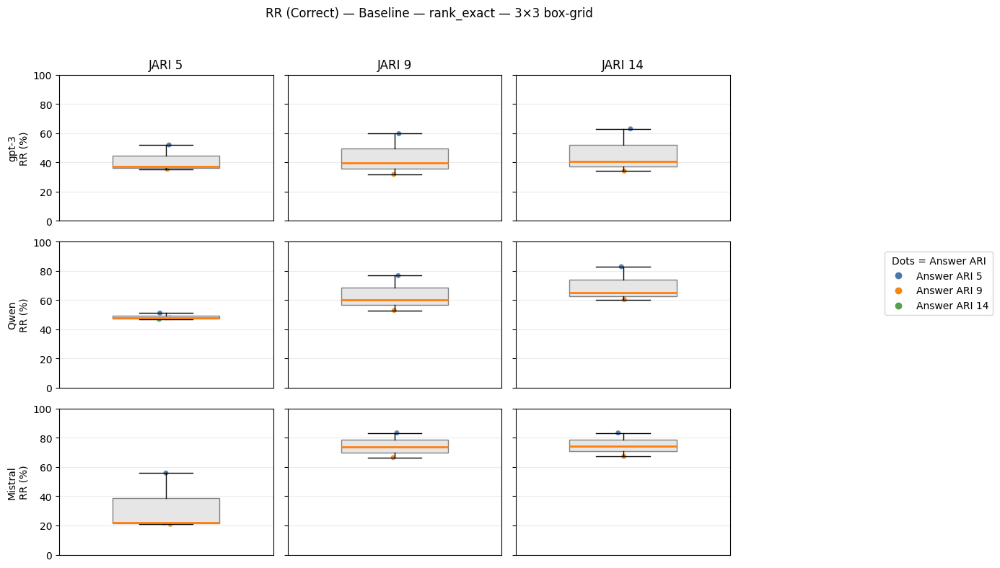

In [143]:
rr_boxgrid(df_rr_ensemble,
           prompt='baseline', metric='rank_exact',
           models=('gpt-3','Qwen','Mistral'),
           group='Correct',
           suptitle="RR (Correct) — Baseline — rank_exact — 3×3 box-grid",
           savepath="figs/rr_boxgrid_baseline_correct_rank_exact.pdf")


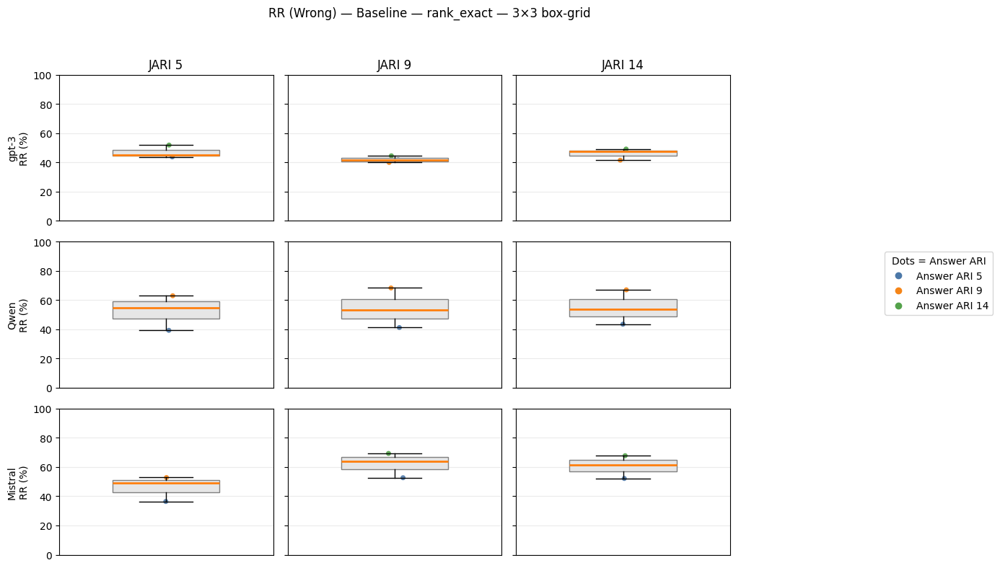

In [144]:
rr_boxgrid(df_rr_ensemble,
           prompt='baseline', metric='rank_exact',
           models=('gpt-3','Qwen','Mistral'),
           group='Wrong',
           suptitle="RR (Wrong) — Baseline — rank_exact — 3×3 box-grid",
           savepath="figs/rr_boxgrid_baseline_wrong_rank_exact.pdf")


In [145]:
import numpy as np
import matplotlib.pyplot as plt

def rr_tripdot_grid(df, *,
    prompt='baseline', metric='rank_exact',
    models=('GPT3','Qwen','Mistral'),        # rows
    jari_levels=(5,9,14),                    # columns
    answer_ari=(5,9,14),                     # three dots per cell
    group='Correct',                         # 'Correct' or 'Wrong'
    suptitle=None, savepath=None):

    d = df[(df['mode'].str.upper()=='RR') &
           (df['prompt']==prompt) &
           (df['metric']==metric) &
           (df['group']==group) &
           (df['JARI'].isin(jari_levels)) &
           (df['ARI'].isin(answer_ari))].copy()

    d['rate_pct'] = d['rate']*100
    if {'ci_low','ci_high'}.issubset(d.columns):
        d['ci_low_pct']  = d['ci_low']*100
        d['ci_high_pct'] = d['ci_high']*100

    colors = {5:'#4C78A8', 9:'#F58518', 14:'#54A24B'}
    nrows, ncols = len(models), len(jari_levels)
    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 8), sharey=True)
    axes = np.atleast_2d(axes)

    if suptitle is None:
        suptitle = f"RR (Triplet dots) — {prompt.capitalize()} — {metric} — {group}"
    fig.suptitle(suptitle, y=0.98)

    for r, model in enumerate(models):
        for c, jv in enumerate(jari_levels):
            ax = axes[r, c]
            for i, a in enumerate(answer_ari):
                sub = d[(d['model']==model) & (d['JARI']==jv) & (d['ARI']==a)]
                if sub.empty: 
                    continue
                y  = float(sub['rate_pct'].iloc[0])
                if {'ci_low_pct','ci_high_pct'}.issubset(sub.columns):
                    lo = float(sub['ci_low_pct'].iloc[0]); hi = float(sub['ci_high_pct'].iloc[0])
                    yerr = np.array([[y-lo],[hi-y]])
                    ax.errorbar(i, y, yerr=yerr, fmt='o', ms=6, capsize=3,
                                color=colors[a], lw=1.5)
                else:
                    ax.plot(i, y, 'o', ms=6, color=colors[a])
            if r == 0: ax.set_title(f"JARI {jv}")
            if c == 0: ax.set_ylabel(f"{model}\nRR (%)")
            ax.set_xticks(range(len(answer_ari)))
            ax.set_xticklabels([f'Ans {a}' for a in answer_ari], fontsize=8)
            ax.set_ylim(0, 100); ax.grid(axis='y', alpha=0.25)

    handles = [plt.Line2D([0],[0], marker='o', lw=0, color=colors[a], label=f'Answer ARI {a}')
               for a in answer_ari]
    fig.legend(handles=handles, title="Dots = Answer ARI", loc='center left', bbox_to_anchor=(1.02, 0.5))
    plt.tight_layout(rect=[0,0,0.86,0.95])
    if savepath: plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()


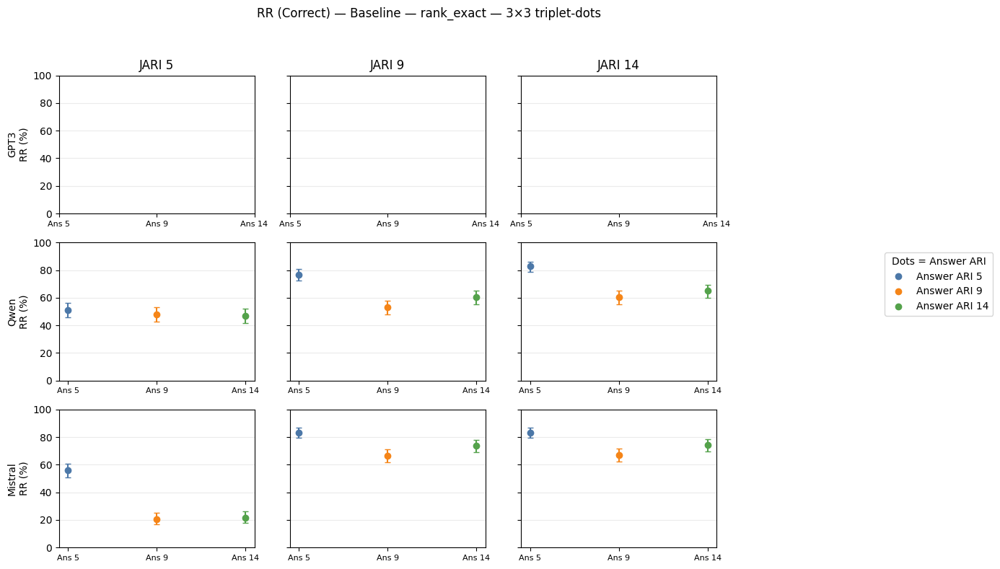

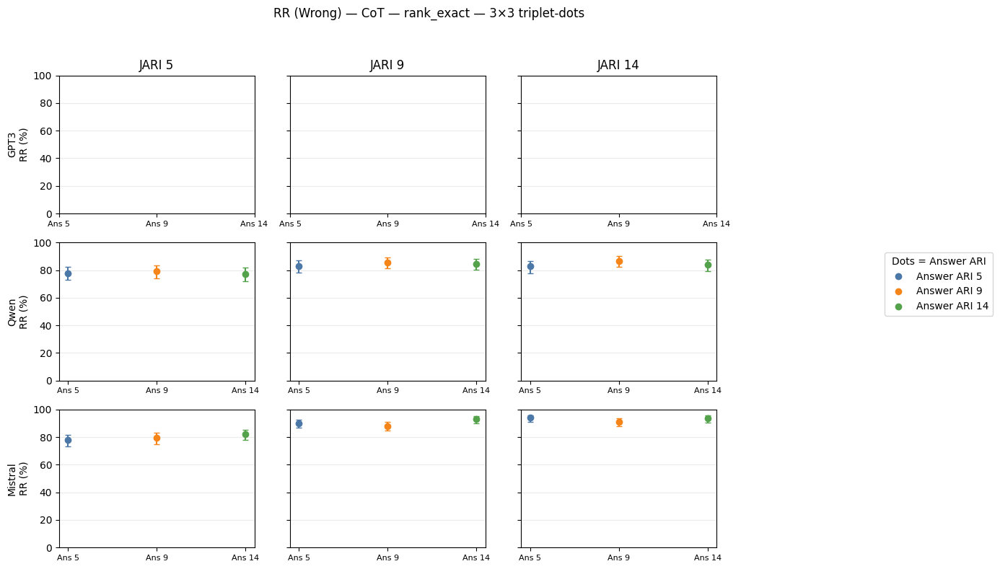

In [146]:
# Baseline
rr_tripdot_grid(df_rr_ensemble, prompt='baseline', metric='rank_exact',
                models=('GPT3','Qwen','Mistral'), group='Correct',
                suptitle="RR (Correct) — Baseline — rank_exact — 3×3 triplet-dots")

# CoT
rr_tripdot_grid(df_rr_ensemble, prompt='cot', metric='rank_exact',
                models=('GPT3','Qwen','Mistral'), group='Wrong',
                suptitle="RR (Wrong) — CoT — rank_exact — 3×3 triplet-dots")


In [174]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# ---------- helpers ----------
ORDER_ARI  = [5, 9, 14]
ORDER_JARI = [5, 9, 14]

def _pivot_rr(df, model, prompt, metric, group):
    sub = df[
        (df['model'] == model) &
        (df['prompt'].str.lower() == prompt) &
        (df['mode'].str.upper() == 'RR') &
        (df['metric'] == metric) &
        (df['group'] == group) &
        (df['ARI'].isin(ORDER_ARI)) &
        (df['JARI'].isin(ORDER_JARI))
    ].copy()
    if sub.empty:
        return pd.DataFrame(np.nan, index=ORDER_ARI, columns=ORDER_JARI)
    sub['rate_pct'] = sub['rate'] * 100.0
    mat = sub.pivot_table(index='ARI', columns='JARI', values='rate_pct', aggfunc='mean')
    mat = mat.reindex(index=ORDER_ARI, columns=ORDER_JARI)
    return mat

def rr_heatmap_placemat(df, models, prompt, metric, group,
                        vmin=0, vmax=100, cmap='viridis',
                        title=None, savepath=None, annotate=True):
    n = len(models)
    fig, axes = plt.subplots(1, n, figsize=(4*n, 4), constrained_layout=True)
    if n == 1:
        axes = np.array([axes])

    last_im = None
    for i, m in enumerate(models):
        mat = _pivot_rr(df, m, prompt, metric, group)
        ax  = axes[i]
        im  = ax.imshow(mat.values, vmin=vmin, vmax=vmax, cmap=cmap, aspect='equal')
        last_im = im
        ax.set_title(m)
        ax.set_xticks(range(len(ORDER_JARI))); ax.set_xticklabels([f'JARI {j}' for j in ORDER_JARI])
        ax.set_yticks(range(len(ORDER_ARI)));  ax.set_yticklabels([f'Ans {a}'  for a in ORDER_ARI])
        # annotations
        if annotate:
            for (r, c), val in np.ndenumerate(mat.values):
                if np.isfinite(val):
                    ax.text(c, r, f"{val:.0f}", ha='center', va='center',
                            color=('black' if val > 60 else 'white'), fontsize=10)
    # shared colorbar
    cbar = fig.colorbar(last_im, ax=axes.ravel().tolist(), shrink=0.8, pad=0.02)
    cbar.set_label('RR (%)')
    if title: fig.suptitle(title, y=1.02)
    if savepath: plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()

def rr_delta_placemat(df, models, metric, group,
                      center=0, vmax=30, cmap='RdYlGn',
                      title=None, savepath=None, annotate=True):
    """ΔRR = CoT − Baseline (in percentage points)."""
    n = len(models)
    fig, axes = plt.subplots(1, n, figsize=(4*n, 4), constrained_layout=True)
    if n == 1:
        axes = np.array([axes])

    norm = TwoSlopeNorm(vmin=-vmax, vcenter=center, vmax=vmax)
    last_im = None
    for i, m in enumerate(models):
        base = _pivot_rr(df, m, 'baseline', metric, group)
        cot  = _pivot_rr(df, m, 'cot',       metric, group)
        dmat = cot - base
        ax   = axes[i]
        im   = ax.imshow(dmat.values, norm=norm, cmap=cmap, aspect='equal')
        last_im = im
        ax.set_title(f"{m} (Δ CoT−Base)")
        ax.set_xticks(range(len(ORDER_JARI))); ax.set_xticklabels([f'JARI {j}' for j in ORDER_JARI])
        ax.set_yticks(range(len(ORDER_ARI)));  ax.set_yticklabels([f'Ans {a}'  for a in ORDER_ARI])
        if annotate:
            for (r, c), val in np.ndenumerate(dmat.values):
                if np.isfinite(val):
                    ax.text(c, r, f"{val:+.0f}", ha='center', va='center',
                            color=('black' if abs(val) < 8 else 'white'), fontsize=10)
    cbar = fig.colorbar(last_im, ax=axes.ravel().tolist(), shrink=0.8, pad=0.02)
    cbar.set_label('Δ RR (pp)')
    if title: fig.suptitle(title, y=1.02)
    if savepath: plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()


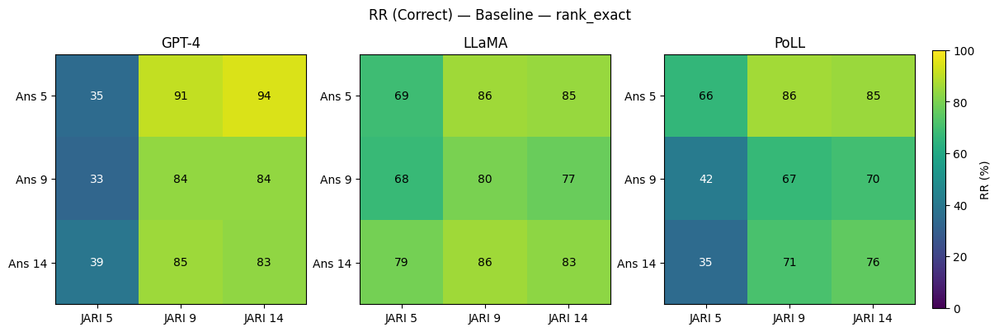

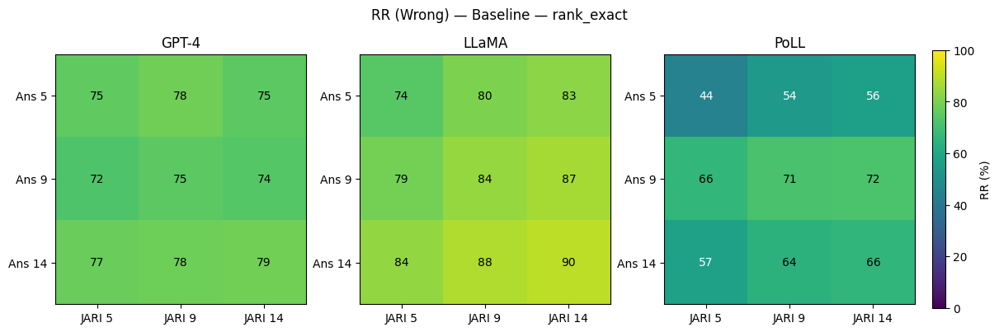

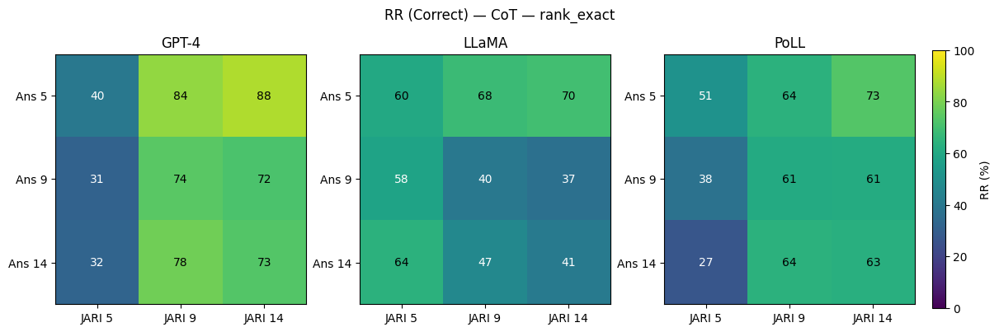

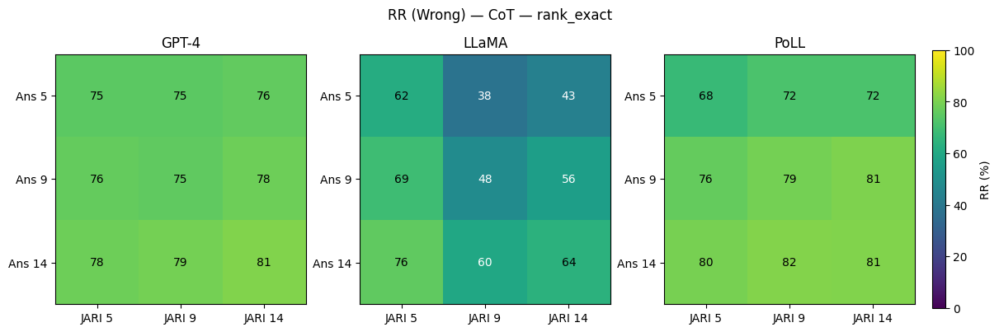

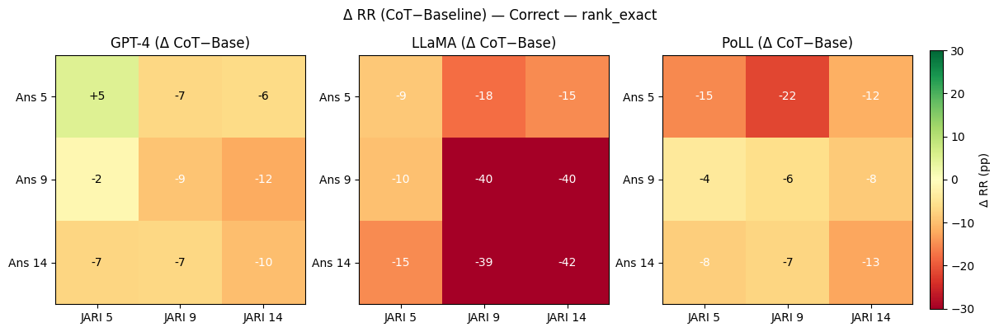

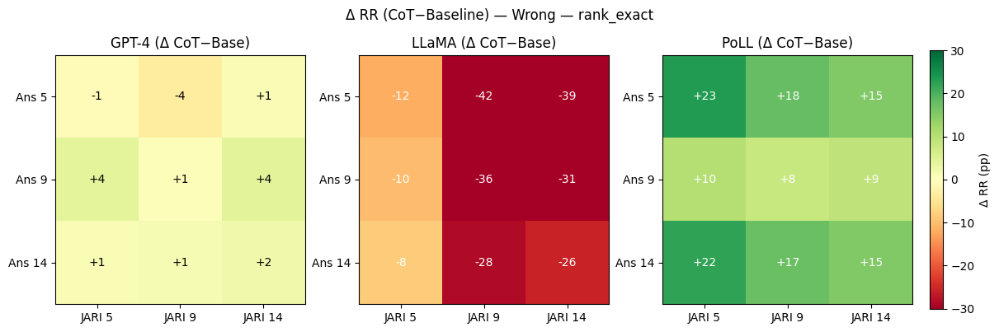

In [176]:
models_big = ('GPT-4','LLaMA','PoLL')           # or ('gpt-3','Mistral','Qwen','PoLL') for the other set
metric     = 'rank_exact'

# 1) Baseline — Correct
rr_heatmap_placemat(df_rr, models_big, 'baseline', metric, 'Correct',
                    title=f"RR (Correct) — Baseline — {metric}",
                    savepath="figs/overview_baseline_correct_rank_exact.png")

# 2) Baseline — Wrong
rr_heatmap_placemat(df_rr, models_big, 'baseline', metric, 'Wrong',
                    title=f"RR (Wrong) — Baseline — {metric}",
                    savepath="figs/overview_baseline_wrong_rank_exact.png")

# 3) CoT — Correct
rr_heatmap_placemat(df_rr, models_big, 'cot', metric, 'Correct',
                    title=f"RR (Correct) — CoT — {metric}",
                    savepath="figs/overview_cot_correct_rank_exact.png")

# 4) CoT — Wrong
rr_heatmap_placemat(df_rr, models_big, 'cot', metric, 'Wrong',
                    title=f"RR (Wrong) — CoT — {metric}",
                    savepath="figs/overview_cot_wrong_rank_exact.png")

# 5) Δ(CoT−Baseline) — Correct
rr_delta_placemat(df_rr, models_big, metric, 'Correct',
                  vmax=30, title=f"Δ RR (CoT−Baseline) — Correct — {metric}",
                  savepath="figs/overview_delta_correct_rank_exact.png")

# 6) Δ(CoT−Baseline) — Wrong
rr_delta_placemat(df_rr, models_big, metric, 'Wrong',
                  vmax=30, title=f"Δ RR (CoT−Baseline) — Wrong — {metric}",
                  savepath="figs/overview_delta_wrong_rank_exact.png")


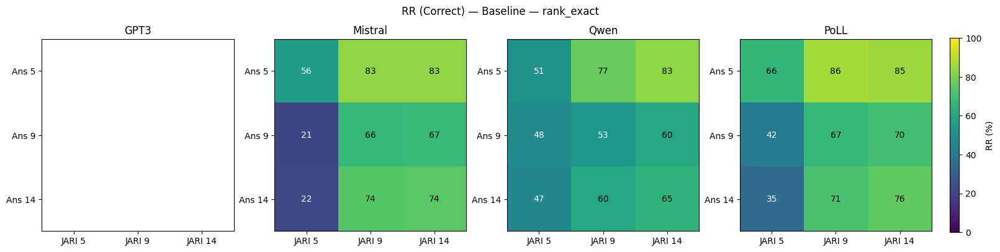

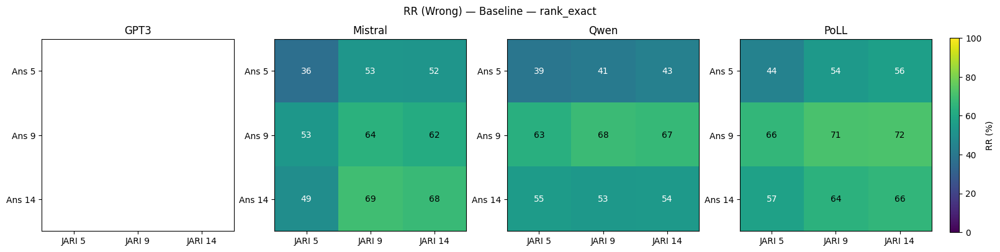

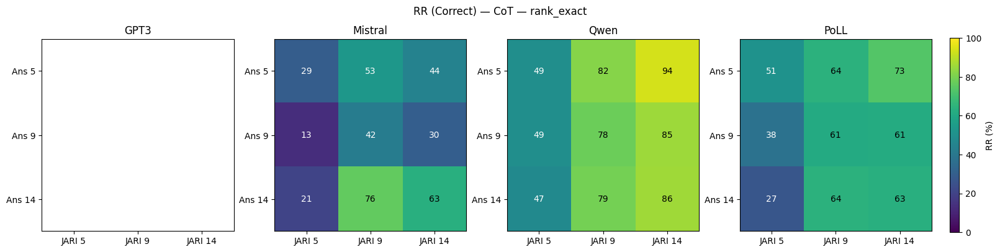

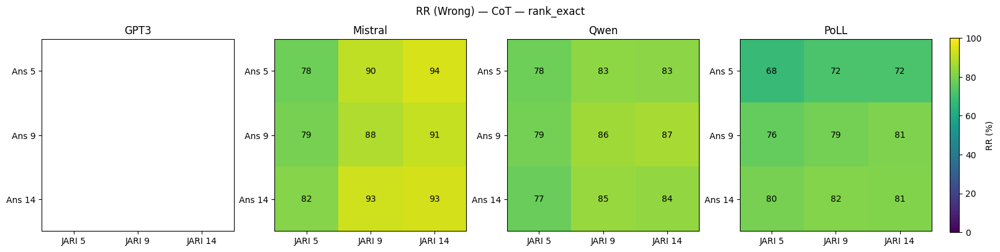

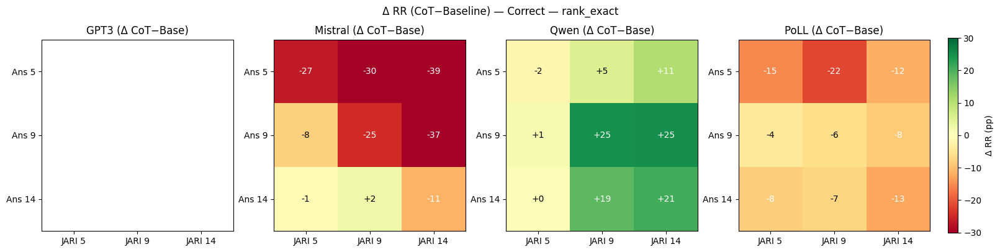

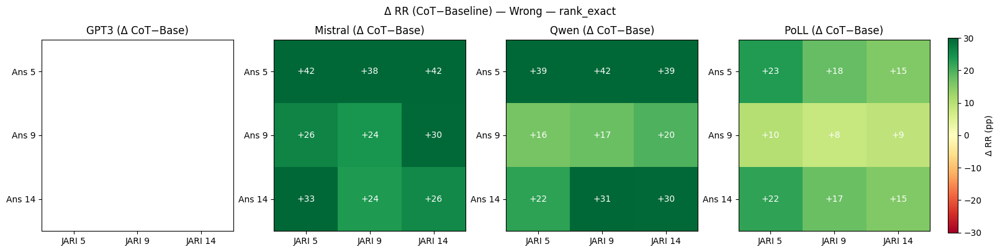

In [178]:
models_ensemble = ('GPT3','Mistral','Qwen','PoLL')           # or ('gpt-3','Mistral','Qwen','PoLL') for the other set
metric     = 'rank_exact'

# 1) Baseline — Correct
rr_heatmap_placemat(df_rr_ensemble, models_ensemble, 'baseline', metric, 'Correct',
                    title=f"RR (Correct) — Baseline — {metric}",
                    savepath="figs/overview_baseline_correct_rank_exact.png")

# 2) Baseline — Wrong
rr_heatmap_placemat(df_rr_ensemble, models_ensemble, 'baseline', metric, 'Wrong',
                    title=f"RR (Wrong) — Baseline — {metric}",
                    savepath="figs/overview_baseline_wrong_rank_exact.png")

# 3) CoT — Correct
rr_heatmap_placemat(df_rr_ensemble, models_ensemble, 'cot', metric, 'Correct',
                    title=f"RR (Correct) — CoT — {metric}",
                    savepath="figs/overview_cot_correct_rank_exact.png")

# 4) CoT — Wrong
rr_heatmap_placemat(df_rr_ensemble, models_ensemble, 'cot', metric, 'Wrong',
                    title=f"RR (Wrong) — CoT — {metric}",
                    savepath="figs/overview_cot_wrong_rank_exact.png")

# 5) Δ(CoT−Baseline) — Correct
rr_delta_placemat(df_rr_ensemble, models_ensemble, metric, 'Correct',
                  vmax=30, title=f"Δ RR (CoT−Baseline) — Correct — {metric}",
                  savepath="figs/overview_delta_correct_rank_exact.png")

# 6) Δ(CoT−Baseline) — Wrong
rr_delta_placemat(df_rr_ensemble, models_ensemble, metric, 'Wrong',
                  vmax=30, title=f"Δ RR (CoT−Baseline) — Wrong — {metric}",
                  savepath="figs/overview_delta_wrong_rank_exact.png")

In [179]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# If you have seaborn available this gets much easier:
import seaborn as sns

# -------------------------------------------------------
# Helpers
# -------------------------------------------------------
JARI_PALETTE = {5:"#4C78A8", 9:"#F58518", 14:"#54A24B"}  # blue / orange / green
ANS_MARKERS  = {5:"o", 9:"s", 14:"^"}                   # dot / square / triangle

def _prep(df):
    d = df.copy()
    d = d[d['mode'].str.upper()=='RR'].copy()
    d['RR']     = d['rate'] * 100.0
    d['Prompt'] = d['prompt'].str.capitalize()          # Baseline / Cot
    d['Group']  = d['group'].str.title()                # Correct / Wrong
    d['JARI']   = d['JARI'].astype(int)
    d['AnsARI'] = d['ARI'].astype(int)                  # Answer ARI
    return d

def boxgrid_one_model(df, model, kind='rank', savepath=None, show_ans=True):
    """
    kind='rank'  -> metrics: rank_exact, rank_bin_overall
    kind='score' -> metrics: score_exact, score_eps1
    Rows = Correct/Wrong, Cols = Baseline/CoT, hue = JARI.
    """
    d = _prep(df)
    d = d[d['model'] == model]

    if kind == 'rank':
        metrics = ['rank_exact', 'rank_bin_overall']
        title   = f"RR — {model} — Rank type"
    else:
        metrics = ['score_exact', 'score_eps1']
        title   = f"RR — {model} — Score type"

    d = d[d['metric'].isin(metrics)].copy()
    if d.empty:
        print(f"[warn] no rows for {model} / {kind}")
        return

    # Order + nice x tick labels
    x_order = metrics
    x_labels = {
        'rank_exact':'rank_exact', 'rank_bin_overall':'rank_bin',
        'score_exact':'score_exact', 'score_eps1':'score_eps1'
    }

    g = sns.FacetGrid(
        d, row='Group', col='Prompt', margin_titles=True,
        height=2.8, aspect=1.3, sharey=True
    )
    g.map_dataframe(
        sns.boxplot, x='metric', y='RR', hue='JARI', order=x_order,
        palette={k:JARI_PALETTE[k] for k in (5,9,14) if k in d['JARI'].unique()},
        dodge=True, linewidth=1, fliersize=0
    )

    # Optional: overlay Answer ARI as faint dots so you see both JARI (color)
    # and Answer ARI (marker). We use scatterplot so we can vary marker style.
    if show_ans:
        # Put dots slightly transparent to keep boxes readable
        for (group, prompt), sub in d.groupby(['Group','Prompt']):
            ax = g.axes[
                0 if group=='Correct' else 1,
                0 if prompt=='Baseline' else 1
            ]
            # jitter x positions so dots follow the dodge of JARI colors
            # build mapping metric->base x
            xticks = {lab:ix for ix, lab in enumerate(x_order)}
            for jari in sorted(sub['JARI'].unique()):
                for m in x_order:
                    msel = (sub['metric']==m) & (sub['JARI']==jari)
                    y = sub.loc[msel, 'RR'].to_numpy()
                    a = sub.loc[msel, 'AnsARI'].to_numpy()
                    if y.size == 0: 
                        continue
                    # small dodge by JARI index
                    j_idx = [sorted(sub['JARI'].unique()).index(jari)]*len(y)
                    jitter = (np.array(j_idx) - 1) * 0.12  # -0.12, 0, +0.12
                    x0 = xticks[m]
                    x = x0 + jitter
                    for yi, ai, xi in zip(y, a, x):
                        ax.scatter(xi, yi, s=32, alpha=0.8, 
                                   marker=ANS_MARKERS.get(ai, 'o'),
                                   facecolor='none', edgecolor='k', linewidths=0.8)

    # Cosmetics
    for ax in g.axes.ravel():
        ax.set_xlabel("")
        ax.set_xticklabels([x_labels[v] for v in x_order])
        ax.grid(axis='y', alpha=0.25)
        ax.set_ylim(0, 100)
        ax.set_ylabel("RR (%)")

    # Legends: JARI colors + Answer ARI markers
    # (combine both and place once, outside)
    from matplotlib.lines import Line2D
    jari_handles = [Line2D([0],[0], color=JARI_PALETTE[k], lw=6, label=f'JARI {k}') 
                    for k in (5,9,14) if k in d['JARI'].unique()]
    ans_handles  = [Line2D([0],[0], marker=ANS_MARKERS[k], color='k', lw=0,
                           markerfacecolor='none', markersize=7,
                           label=f'Ans {k}') for k in (5,9,14) if k in d['AnsARI'].unique()]
    leg = g.fig.legend(handles=jari_handles+ans_handles, ncol=len(jari_handles+ans_handles),
                       loc='upper center', bbox_to_anchor=(0.5, 1.04), frameon=False)
    g.fig.suptitle(title, y=1.10, fontsize=14)

    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()

# -------------------------------------------------------
# Example calls
# -------------------------------------------------------

# RANK DATA: use the long RR dataframe you already built for rank metrics
#   df_rr_ensemble  (GPT-4/LLaMA/PoLL and/or gpt-3/Qwen/Mistral)
# SCORE DATA: the long scoring RR dataframe you built (e.g., df_rr_score)

# One model – rank & score in two figures:
# boxgrid_one_model(df_rr_ensemble, model='GPT-4', kind='rank',  savepath="figs/gpt4_rank_boxgrid.png")
# boxgrid_one_model(df_rr_score,     model='GPT-4', kind='score', savepath="figs/gpt4_score_boxgrid.png")

# Repeat for others:
# for mdl in ['LLaMA','PoLL','gpt-3','Qwen','Mistral']:
#     boxgrid_one_model(df_rr_ensemble, mdl, 'rank')
#     boxgrid_one_model(df_rr_score,     mdl, 'score')


[warn] no rows for GPT-4 / rank


C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])


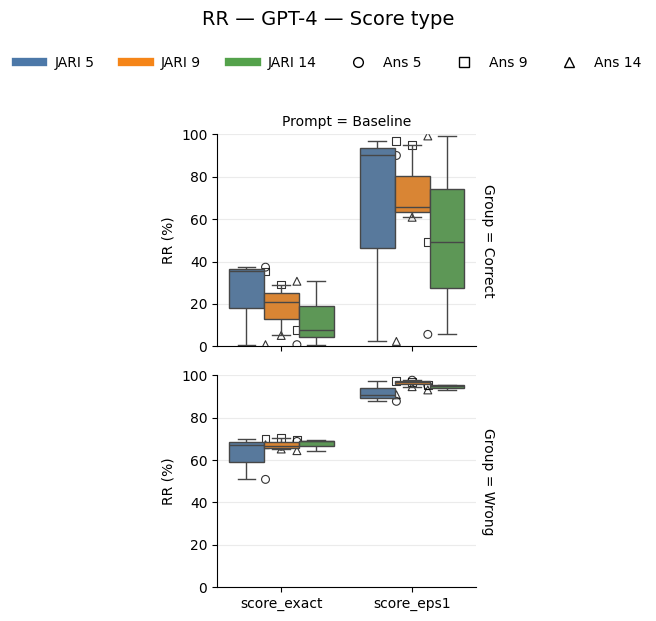

[warn] no rows for LLaMA / rank


C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])


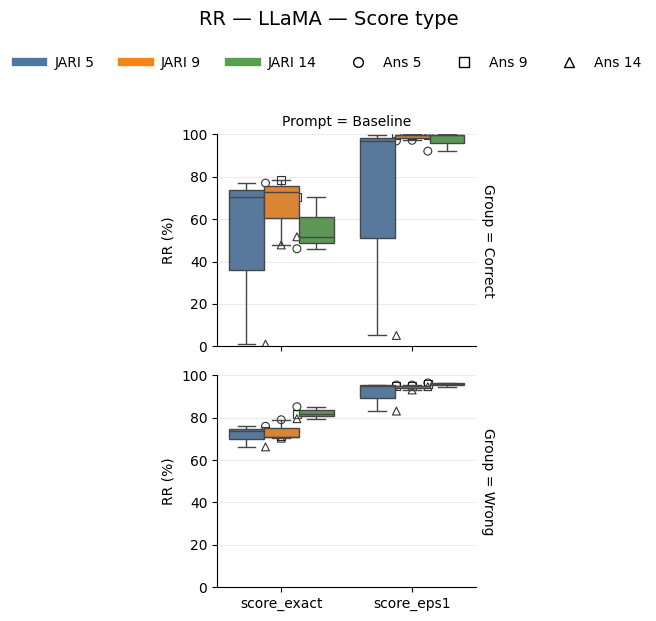

C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_orde

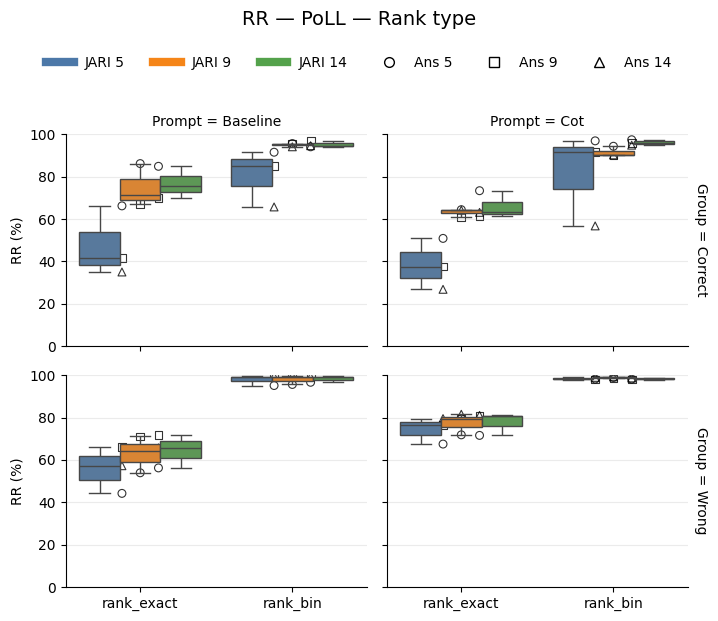

C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])


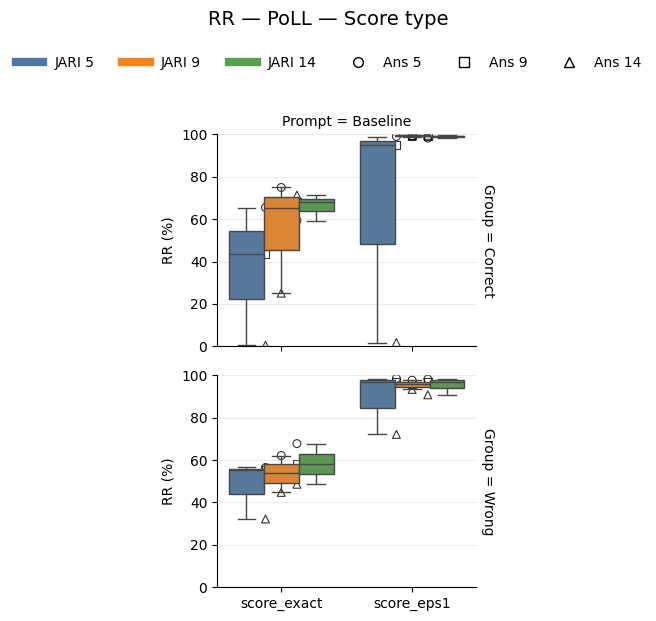

C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_orde

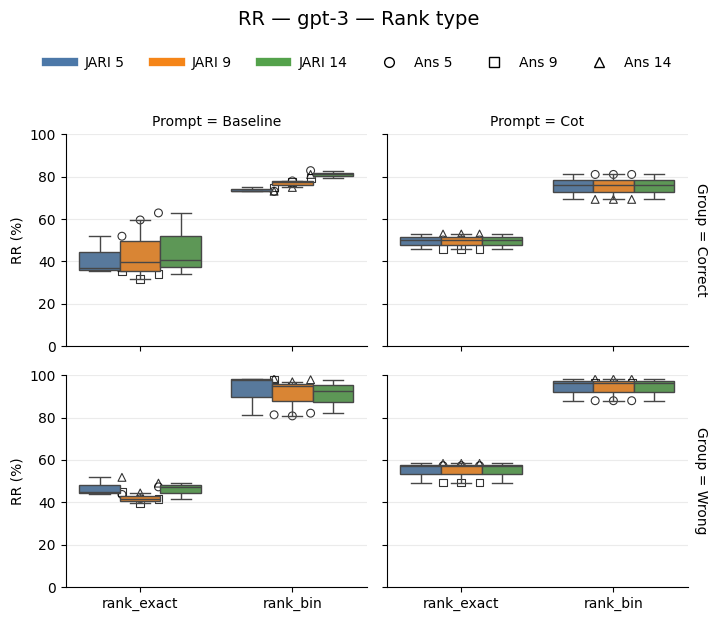

[warn] no rows for gpt-3 / score


C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_orde

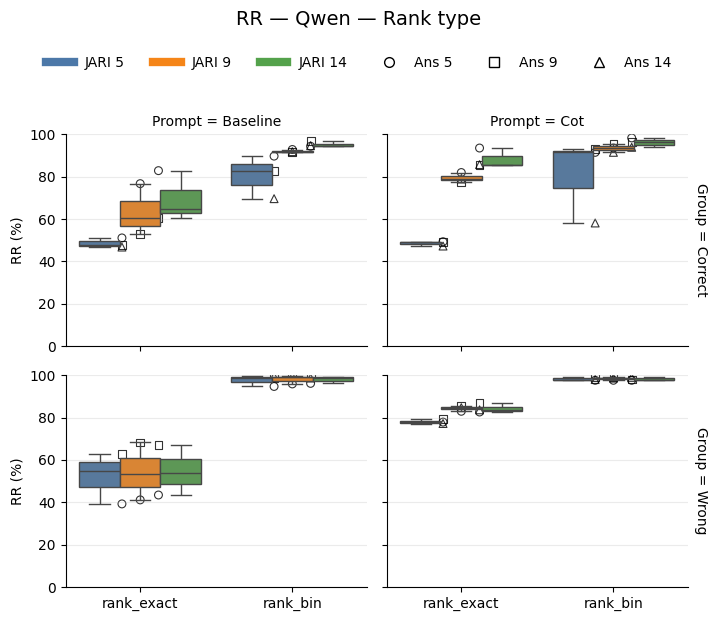

[warn] no rows for Qwen / score


C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_order])
C:\Users\apareek\AppData\Local\Temp\ipykernel_43376\2900864762.py:94: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x_labels[v] for v in x_orde

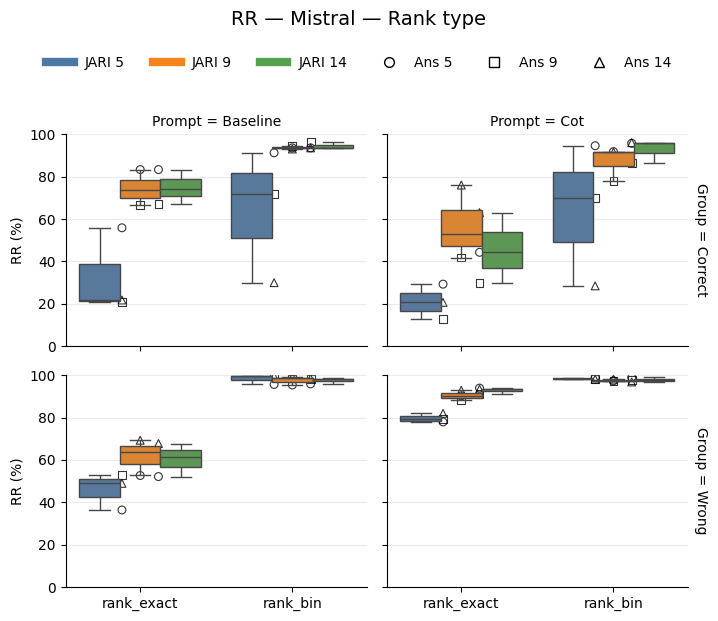

[warn] no rows for Mistral / score


In [180]:
# RANK DATA: use the long RR dataframe you already built for rank metrics
# df_rr_ensemble  (GPT-4/LLaMA/PoLL and/or gpt-3/Qwen/Mistral)
# SCORE DATA: the long scoring RR dataframe you built (e.g., df_rr_score)

# One model – rank & score in two figures:
boxgrid_one_model(df_rr_ensemble, model='GPT-4', kind='rank',  savepath="figs/gpt4_rank_boxgrid.png")
boxgrid_one_model(df_rr_score,     model='GPT-4', kind='score', savepath="figs/gpt4_score_boxgrid.png")

# Repeat for others:
for mdl in ['LLaMA','PoLL','gpt-3','Qwen','Mistral']:
    boxgrid_one_model(df_rr_ensemble, mdl, 'rank')
    boxgrid_one_model(df_rr_score,     mdl, 'score')